In [35]:
conda install python-graphviz

Retrieving notices: ...working... done
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\rodq\AppData\Local\anaconda3

  added / updated specs:
    - python-graphviz


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    cairo-1.16.0               |       haedb8bc_5         1.9 MB
    expat-2.6.2                |       hd77b12b_0         260 KB
    fontconfig-2.14.1          |       h9c4af85_2         198 KB
    fribidi-1.0.10             |       h62dcd97_0          63 KB
    getopt-win32-0.1           |       h2bbff1b_0          19 KB
    graphite2-1.3.14           |       hd77b12b_1          91 KB
    graphviz-2.50.0            |       hdb8b0d4_0         903 KB
    gts-0.7.6                  |       h63ab5a1_3         181 KB
    harfbuzz-4.3.0             |       hb646838_1         855 KB
    libgd-2.3.3                |       ha43c60c_1         3

Could not load conda plugin `anaconda-cloud-auth`:

cannot import name 'ChannelAuthBase' from 'conda.plugins.types' (C:\Users\rodq\AppData\Local\anaconda3\lib\site-packages\conda\plugins\types.py)


==> WARNING: A newer version of conda exists. <==
  current version: 23.3.1
  latest version: 24.5.0

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=24.5.0




# CDR Portfolios with Endogenous Learning
## Deep uncertainty in Carbon Dioxide Removal Portfolios

READ ME

This file is structured into 4 main sections:
1. Model Description: nomenclature and equations that comprise the model.
2. Code: includes the model formulation, sampling of uncertain parameters and solving the optimisation model for each future in the scenario ensemble. 
    - [Pyomo](https://pyomo.readthedocs.io/en/stable/index.html) is used to formulate the model equations
    - [Gurobi](https://www.gurobi.com/academia/academic-program-and-licenses/) is used as a solver for the mixeed-integer linear programming problem formulated with Pyomo
3. Plotting & Analysis: includes data processing from modelling outputs.
4. Sensitivity Analysis


IMPORTANT: 
To replicate the results without running the simulation, the user needs to run Cells:
- Defining Relevant Functions
- Abstract Model
- Defining parameters that do not change across futures
- Creating a Latin Hypercube from Uncertain Parameters > With Sampling step
- Creating a Latin Hypercube from Uncertain Parameters > Importing Modelling Inputs
- Aggregated Data > When importing data from csv files

This will allow to import the data as if it had been produced by the simulation. The user can then produce plots by running cells:
- a

# 1. Model Description

| Item | Description | Unit | Other |
| :- | :- | :- | :- |
| INDICES | | | |
| $i$ | CDR Options: AF/RF, BECCS, DACCS, BC, EW, SCS, OA; DOCCS (=8) | N.A. |  |
| $k$ | Time dimension/period | N.A. |  |
| $l$ | Line segments for piecewise linear function | N.A. |  |
| VARIABLES | | | |
| $y_{i,k}$ | Installed capacity of CDR option $i$ at time $k$  | tCO$_2$/yr |  |
| $x_{i,k}$ | New installed capacity of CDR option $i$ in time period $k$  | tCO$_2$/yr |  |
| $b_{i,k}$ | tCO$_2$ removed from CDR option $i$ in time period $k$ | tCO$_2$/period |  |
| $z_{i,k}$ | Cumulative experience achieved by CDR option $i$ at time period $k$ | tCO$_2$/period |  |
| $\lambda_{i,k,l}$ | Position of CDR option $i$ in time period $k$ on a line segment $l$  | tCO$_2$/yr |  |
| $\delta_{i,k,l}$ | 1, if cumulative investment cost of CDR option $i$ in time period $k$ on a line segment $l$  | $[0;1]$ |  |
| $c_{i,k}$ | Cumulative costs of CDR option $i$ in time period $k$ | USD | $$c_{i,k} = \sum_l C^L_{i,l}\delta_{i,k,l}+\beta_{i,l}·(\lambda_{i,k,l} - Z^L_{i,l}\delta_{i,k,l})$$ |
| $cost_{i,k}$ | Costs of CDR option $i$ in time period $k$ | USD/period | $$cost_{i,k} = \sum_i (C_{i,k}-C_{i,k-1})+ OPEX_i·b_{i,k}$$ |
| PARAMETERS | | | |
| $\Delta K$ | Time step of optimisation | yr | |
| $r$ | Economic discount factor | N.A. | |
| $OPEX_{i,k}$ | Operational cost of running option $i$ at time period $k$ | USD/tCO$_2$ | |
| $G$ | Cumulative NE target by end of period $N$ (GtCO2) | GtCO$_2$ | |
| $Q$ | Limit to annual geological storage injection (for BECCS, DACCS and DOCCS) | GtCO$_2$/yr | |
| $S_i$ | Option $i$ does (1) or doesn’t (0) need geological storage | 0 - 1 | |
| $T_{i,k}$ | Removals from CDR option $i$ are available at period $k$ (0) or not (1) | 0 - 1 | |
| $Y_{i}^{ref}$ | Initial installed capacity of CDR option $i$ at $k=0$ | tCO$_2$/yr | |
| $SC_{i}^{ref}$ | Initial investment cost of CDR option $i$ at time $k=0$ | tCO$_2$/yr | |
| $X_{i,k}^{max}$ | Maximum annual installed capacity of CDR option $i$ at time $k$ | tCO$_2$/yr | |
| $Y_{i,k}^{max}$ | Maximum cumulative installed capacity of CDR option $i$ at time $k$ | tCO$_2$/yr | |
| $LandR_{i,k}$ | Land requirements for CDR option $i$ at time $k$ | ha/tCO$_2$ | |
| $EnergyR_{i,k}$ | Energy requirements for CDR option $i$ at time $k$ | GJ/tCO$_2$ | |
| $LandL_{k}$ | Land constraint at time $k$ | ha |  |
| $EnergyL_{k}$ | Energy constraint at time $k$ | GJ | 
| $Z_{i,l}^{L}$ & $Z_{i,l}^{U}$ | Lower & upper segment x-value of cumulative capacity of piecewise linear cost function | tCO$_2$/yr | |
| $C_{i,l}^{L}$ & $C_{i,l}^{U}$ | Lower & upper segment y-value of cumulative cost of piecewise linear cost function | USD | |
| $\beta _{i,l}$ | Slope of piecewise linear cost function | USD/tCO$_2$·yr$^{-1}$ | |

## Constraints
### *Installed Capacity and removals*

Definining: 
- Initially installed capacity and removals at $k=0$: $y_{i,0}=Y^{ref}_{i}$  &   $b_{i,0}=Y^{ref}_{i}·\Delta K\ \ \forall i$  

- Capacity balances over the entire horizon: 
    - $y_{i,k}= y_{i,k-1} + x_{i,k} - x_{i,k-\frac{LTIni_i}{\Delta K}}  \ \ \ \ \ \ \ \ \forall i, \ k \leq \frac{LTIni_i}{\Delta K}$
    - $y_{i,k}= y_{i,k-1} + x_{i,k}  \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \forall i, \ \frac{LTIni_i}{\Delta K} < k \leq k \leq \frac{LT_i}{\Delta K}$
    - $y_{i,k}= y_{i,k-1} + x_{i,k} x_{i,k-\frac{LTIni_i}{\Delta K}}  \ \ \ \ \ \ \ \ \forall i, \ k > \frac{LT_i}{\Delta K}$ 

- Removals from capacity installed in previous sub-period:  $b_{i,k} = y_{i,k-1}·\Delta K \ \ \ \ \forall i, \ k>0$

- Limits to maximum installed capacity:
    - Annually: $x_{i,k} \leq X_{i,k}^{max}·T_{i,k}·\Delta K   \ \ \ \ \ \ \ \ \forall i, \ k >0$
    - Cumulatively: $y_{i,k} \leq Y_{i,k}^{max}   \ \ \ \ \ \ \ \ \forall i, \ k >0$
    
- Cumulative experience: $z_{i,k} = \sum_{k'=0}^k x_{i,k'}    \ \ \ \ \ \ \ \ \forall i, \ k, \ k' \leq k$

### *Resource Constraints*
- Removal target: $\sum_{i,k} b_{i,k} \geq G$
- Land: $\sum_i LandR_{i,k}·y_{i,k} \leq LandL_{k} \ \ \ \ \forall \ k$
- Energy: $\sum_i EnergyR_{i,k}·(b_{i,k}-Y^{ref}_{i}·\Delta K) \leq EnergyL_{k} \ \ \ \ \forall \ k$
- Geological Storage:  $\sum_i\sum_k  S_i·y_{i,k} \leq Q$ 

### *Piecewise Linear Formulation of the Experience Curves*

- Binary variable ensuring the selection of one segment $\sum_l\delta_{i,k,l} = 1 \ \ \ \ \ \ \forall i,k$

- Defining the line segment position: $\sum_{k'=0}^k x_{i,k'} = \sum_{l}\lambda_{i,k,l}$ As for each $i,k$ pair, only one $\lambda_{i,k,l}$ will be non-zero  

- To ensure lambda remains between the 2 corresponding successive cumulative capacity points $Z^L_{i,l}$ and $Z^U_{i,l}$ : 
    - $\lambda_{i,k,l} \geq Z^L_{i,l} \ · \delta_{i,k,l}  \ \ \ \ \ \ \forall i,k,l$  → determine the x-axis position on the segment
        - If $\delta_{i,k,l}=0 \ \rightarrow \ \lambda_{i,k,l} \geq 0$
        - If $\delta_{i,k,l}=1 \ \rightarrow \ \lambda_{i,k,l} \geq Z^L_{i,l}$
    - $\lambda_{i,k,l} \leq Z^U_{i,l} \ · \delta_{i,k,l}  \ \ \ \ \ \ \forall i,k,l$  → determine the x-axis position on the segment
        - If $\delta_{i,k,l}=0 \ \rightarrow \ \lambda_{i,k,l} \leq 0$
        - If $\delta_{i,k,l}=1 \ \rightarrow \ \lambda_{i,k,l} \leq Z^U_{i,l}$
    
    → Both equations lead to: \
        $\delta_{i,k,l}=0 \ \rightarrow \ \lambda_{i,k,l} = 0$ \
        $\delta_{i,k,l}=1 \ \rightarrow \ Z^L_{i,l} \leq \lambda_{i,k,l} \leq Z^U_{i,l}$  

- Defining cumulative cost OF CDR option $i$ at time period $k$: $c_{i,k} = \sum_{l=1}^N C^L_{i,l}·\delta_{i,k,l}+\frac{C^U_{i,l}-C^L_{i,l}}{Z^U_{i,l}-Z^L_{i,l}}·( \lambda_{i,k,l} - Z^L_{i,l}·\delta_{i,k,l})  \ \ \ \ \ \ \forall i,k$ 
    → where: $\beta _{i,l} = \frac{C^U_{i,l}-C^L_{i,l}}{Z^U_{i,l}-Z^L_{i,l}}$

### *Costs*
- Costs PER PERIOD:
    - initial costs for $k=0$: $costs_{i,0} = c_{i,0}+b_{i,0}·OPEX_{i,0} \ \ \ \ \forall i$
    - For $k>0$, cost per period is difference in cumulative costs of period $k$ and period $k-1$:  $costs_{i,k} = (c_{i,k} - c_{i,k-1})+b_{i,k}·OPEX_{i,k} \ \ \ \ \forall i, k>0$*


## Objective Function

$$\min  \sum_i \sum_{k} cost_{ik}·\frac{1}{(1+r)^{\Delta Kk}}$$

# 2. Code

In [71]:
# Importing Relevant Libraries
import os, os.path
import importlib
import itertools
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import qmc
import pyDOE2 as pyd
import seaborn as sns
from matplotlib.pyplot import plot, savefig
import time
import datetime 
from datetime import date
from pyomo.opt import SolverStatus, TerminationCondition
import matplotlib.ticker as mtick
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import graphviz 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import logging
from pyomo.environ import *
from IPython.display import display
import yaml



from tqdm import tqdm # Source: https://danshiebler.com/2016-09-14-parallel-progress-bar/ --> Thanks!
import concurrent.futures
from concurrent.futures import ProcessPoolExecutor, as_completed
import sys # Python "sys" documentation: https://docs.python.org/3/library/sys.html

# To reset the default parameters of matplotlib:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

'''
# Python Class: Syntax and Examples [Python Tutorial]: https://mimo.org/glossary/python/class

The class "sampling_futures" takes as inputs:
    - input_file_path: Path of input file to import
    - n_sample: int, number of samples
    - dict_constant: Dictionary of values that remain constant in the form of {'Ymax'=1}
    - sampling_method: "Step" or "Size"
    - future_zero: True or False
    - output_file: 
'''

class sampling_futures:
    def __init__(self, input_file_path, n_sample, dict_constant, sampling_method, future_zero, output_file):
        self.input_file = input_file_path
        self.output_file = output_file
        self.future_zero = future_zero # Determines whether a "all min" future wants to be added at the beginning
        
        self.n_lhs = n_sample # This refers to the number of times the LHS methos will be sampled
        if future_zero == True: 
            self.n_sample = n_sample + 1 # self.n_sample refers to the number of futures 
        else: 
            self.n_sample = n_sample # self.n_sample refers to the number of futures 
        
        #self.i = key_parameters['i']
        '''MISSING PARAMETERS...
        k1 = 0 # Value of first time period
        delK = 5 # Time step of optimisation (i.e., length of each period)
        N = 4 # Number of segments for piecewise linear approximation
        first_year = 2020 # Year corresponding to first time period
        last_year = 2100 # Year corresponding to last time period
        T = int(1 + (last_year-first_year)/delK) # Number of time periods evaluated, equivalent to 17 if delK = 5 (i.e., 80 years)
        k = list(range(k1,T))'''

        self.dict_constant = dict_constant # Dictionary of values that remain constant
        self.sampling_method = sampling_method # can take the values of 'step' or 'size'
    
        # ===================================== Importing and Formating dataframe =====================================
        df = pd.read_excel(input_file_path, index_col = "Parameter")
        self.units = dict(zip(df.index, df.Unit)) # Save all units in a dictionary for later use
        # Separate all constant parameters
        constant = df[df.minimum == df.maximum]
        constant = constant[['minimum']].T
        self.constant = pd.concat([constant]*(self.n_sample),axis=0,ignore_index=True)

        # Get a data frame with selected columns
        df = df[df.minimum != df.maximum]
        self.df_Sampling_step = df[['Sampling_step']]

        self.df = df
    
    def sample(self):
        if self.sampling_method == 'step':
            # Modify dataframe by Sampling step
            df = self.df[['minimum','maximum']]
            df = df.div(self.df_Sampling_step.Sampling_step, axis=0)

            dict_ranges = df.T.to_dict('records')
            dict_ranges = dict_ranges[0]

            lbounds = df["minimum"].values.tolist()
            lbounds = [int(x) for x in lbounds]

            ubounds  = df["maximum"].values.tolist()
            ubounds = [int(x) for x in ubounds]

            sampler = qmc.LatinHypercube(d=len(lbounds))
            sample = sampler.integers(l_bounds=lbounds, u_bounds=ubounds, n=self.n_lhs, endpoint=True)

            df_LHS = pd.DataFrame.from_records(sample)    
            df_LHS = df_LHS.set_axis(dict_ranges, axis=1)
            
            # If future_zero == True, add the min values for "future ID_0"
            if self.future_zero == True: df_LHS = pd.concat([df[["minimum"]].T,df_LHS], axis = 0, ignore_index=True) # Add the min values for "future ID_0"
            
            df_LHS.index.names = ['future_id']

            # Return to original units
            df_LHS = df_LHS.T.mul(self.df_Sampling_step.Sampling_step, axis=0)

            # Creating model input table
            df_input = pd.concat([df_LHS.T, self.constant], axis=1)
            df_input.index.names = ['future_id']
            
            df_input.to_excel(self.output_file, index=True)

            return df_input
            #return df
        
        elif self.sampling_method == 'size':
            df_Number_samples = self.df[['N_samples']].rename(columns={'N_samples':"maximum"})
            df_Number_samples[["minimum"]] = 1
            df = self.df[['minimum','maximum']]

            dict_ranges = df.T.to_dict('records')[0]

            lbounds = df_Number_samples["minimum"].values.tolist()
            lbounds = [int(x) for x in lbounds]

            ubounds  = df_Number_samples["maximum"].values.tolist()
            ubounds = [int(x) for x in ubounds]

            sampler = qmc.LatinHypercube(d=len(lbounds))
            sample = sampler.integers(l_bounds=lbounds, u_bounds=ubounds, n=self.n_lhs, endpoint=True)

            df_LHS = pd.DataFrame.from_records(sample)    
            df_LHS = df_LHS.set_axis(dict_ranges, axis=1)

            # If future_zero == True, add the min values for "future ID_0"
            if self.future_zero == True: df_LHS = pd.concat([df[["minimum"]].T,df_LHS], axis = 0, ignore_index=True) 
            df_LHS.index.names = ['future_id']

            # Return to original units
            #df_LHS = df_LHS.T.mul(df_Sampling_step.Sampling_step, axis=0)
            for futureID in range(1,self.n_lhs+1):
                for parameter in df_LHS.columns:
                    if df_LHS.loc[futureID,parameter] == 1:
                        df_LHS.loc[futureID,parameter] = self.df.loc[parameter,"minimum"]
                    else:
                        df_LHS.loc[futureID,parameter] = round(self.df.loc[parameter,"minimum"] + (df_LHS.loc[futureID,parameter]-1)*self.df_Sampling_step.loc[parameter,"Sampling_step"], 3)

            # Creating model input table
            df_input = pd.concat([df_LHS,self.constant], axis=1)
            df_input.index.names = ['future_id']
            df_LHS = df_LHS.T
            
            df_input.to_excel(self.output_file, index=True)

            return df_input
        
        else:
            print()
            raise ValueError("%s - The sampling_method arguments accepts either 'step' or 'size'." %self.sampling_method)


In [73]:
# input_file_path, n_sample, dict_constant, sampling_method, future_zero, output_file
input_file_path = "PortfolioFiles/Portfolio_Files_Latest/All data Step size.xlsx"
n_sample = 5
dict_constant = {}
sampling_method = 'step'
future_zero = False
output_file = 'PortfolioFiles\File Name_%s.xlsx' %date.today().strftime("%d.%m.%Y")

attempt = sampling_futures(input_file_path, n_sample, dict_constant, sampling_method, future_zero, output_file)
attempt.sample()

,Energy_DACCS,Energy_DOCCS,Energy_EW,Energy_OA,EnergyL,Land_A/R,Land_BECCS,LandL,ER_A/R,ER_BC,...,Yref_OA,Yref_SCS,Xmax_A/R,Xmax_BC,Xmax_BECCS,Xmax_DACCS,Xmax_DOCCS,Xmax_EW,Xmax_OA,Xmax_SCS
future_id,,,,,,,,,,,,,,,,,,,,,
0,6.5,4.5,1.5,0.5,2050,0.07,0.12,900000000,0.02,0.0,...,1.0,1.0,80000000.0,500000000.0,500000000.0,500000000.0,500000000.0,1.000000e+09,1.000000e+09,1.000000e+09
1,9.0,7.5,5.5,6.5,2035,0.09,0.06,600000000,-0.09,0.09,...,1.0,1.0,80000000.0,500000000.0,500000000.0,500000000.0,500000000.0,1.000000e+09,1.000000e+09,1.000000e+09
2,6.0,6.5,11.5,2.0,2045,0.09,0.13,800000000,-0.07,-0.03,...,1.0,1.0,80000000.0,500000000.0,500000000.0,500000000.0,500000000.0,1.000000e+09,1.000000e+09,1.000000e+09
3,5.0,5.0,4.0,5.0,2040,0.08,0.09,300000000,-0.21,0.06,...,1.0,1.0,80000000.0,500000000.0,500000000.0,500000000.0,500000000.0,1.000000e+09,1.000000e+09,1.000000e+09
4,9.5,3.0,8.0,3.0,2030,0.08,0.17,500000000,-0.17,0.01,...,1.0,1.0,80000000.0,500000000.0,500000000.0,500000000.0,500000000.0,1.000000e+09,1.000000e+09,1.000000e+09


In [217]:
%store -r results_b

In [ ]:
# Importing Relevant Libraries
import os, os.path
import importlib
import itertools
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import qmc
import pyDOE2 as pyd
import seaborn as sns
from matplotlib.pyplot import plot, savefig
import time
import datetime 
from datetime import date
from pyomo.opt import SolverStatus, TerminationCondition
import matplotlib.ticker as mtick
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import graphviz 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import logging
from pyomo.environ import *

# Source: https://danshiebler.com/2016-09-14-parallel-progress-bar/
from tqdm import tqdm
import concurrent.futures
from concurrent.futures import ProcessPoolExecutor, as_completed
import sys # Python "sys" documentation: https://docs.python.org/3/library/sys.html

# To reset the default parameters of matplotlib:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)


# ======= DEFINING RELEVANT FUNCTIONS =======
# ===================================== Saving results from optimisation =====================================    
def key_parameters():
    # Useful non-varying parameters
    i = ['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']
    k1 = 0 # Value of first time period
    delK = 5 # Time step of optimisation (i.e., length of each period)
    N = 4 # Number of segments for piecewise linear approximation
    first_year = 2020 # Year corresponding to first time period
    last_year = 2100 # Year corresponding to last time period
    T = int(1 + (last_year-first_year)/delK) # Number of time periods evaluated, equivalent to 17 if delK = 5 (i.e., 80 years)
    k = list(range(k1,T))

    return i, k, k1, delK, N, first_year, last_year, T

def extract_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj):
    results_y += [Instance_bin.y.extract_values()]
    results_x += [Instance_bin.x.extract_values()]
    results_b += [Instance_bin.b.extract_values()]
    results_z += [Instance_bin.z.extract_values()]
    results_Costs += [Instance_bin.costs.extract_values()]
    results_C += [Instance_bin.c.extract_values()]
    results_E += [Instance_bin.e.extract_values()]
    results_L += [Instance_bin.ld.extract_values()]
    results_obj += [Instance_bin.OBJ()]
    return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj

def null_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj):
    i, k, k1, delK, N, first_year, last_year, T = key_parameters()
    merged_list = [(i[n], k[m]) for n in range(0, len(i)) for m in range(k1, len(k))]
    
    results_y += [dict.fromkeys(merged_list, np.NaN)]
    results_x += [dict.fromkeys(merged_list, np.NaN)]
    results_b += [dict.fromkeys(merged_list, np.NaN)]
    results_z += [dict.fromkeys(merged_list, np.NaN)]
    results_Costs += [dict.fromkeys(merged_list, np.NaN)]
    results_C += [dict.fromkeys(merged_list, np.NaN)]
    results_E += [dict.fromkeys(k, np.NaN)]
    results_L += [dict.fromkeys(k, np.NaN)]
    results_obj += [np.NaN]
    return results_y, results_x, results_b, results_z, results_Costs, results_C,results_E,results_L,results_obj

def unit_costs_b(y, b, Y_ref, SC_ref):
    return SC_ref*((y/Y_ref)**(-b))

def abstract_model():
# ======================================================= Input Parameters =======================================================
    i, k, k1, delK, N, first_year, last_year, T = key_parameters()
    '''k1 = 0 # Value of first time period
    delK = 5 # Time step of optimisation (i.e., length of each period)
    N = 4 # Number of segments for piecewise linear approximation
    first_year = 2020 # Year corresponding to first time period
    last_year = 2100 # Year corresponding to last time period
    T = int(1 + (last_year-first_year)/delK) # Number of time periods evaluated, equivalent to 17 if delK = 5 (i.e., 80 years)'''
    
    # ======================================================= Model Creation =======================================================
    m = AbstractModel()

    # ------------------ Indices ------------------ 
    m.i = Set(initialize=['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']) # CDR Options (=8)
    m.k = Set(initialize=list(range(k1,T))) # Time period, initialised to 10 time periods
    m.l = Set(initialize=list(range(1,N+1))) # State of Endogenous Learning: line segments (=4) for piecewise linear function

    # ------------------ Parameters ------------------ 
    # Binary Parameters
    m.S = Param(m.i, initialize={'BECCS': 1, 'A/R':0, 'SCS':0, 'BC':0, 'DACCS':1, 'EW':0, 'OA':0, 'DOCCS':1})
        # Storage requirement per NET i: only 1 for BECCS, DACCS & DOCCS (binary parameter)
    m.T = Param(m.i,m.k) # CDR option $i$ is available (0) or not (1) at time $k$ (binary parameter)

    # Non-indexed parameters
    m.rE = Param(default=0.03) # Economic Discount Rate

    m.delK = Param(default=delK) # Time step or length of each time interval

    m.Q = Param(m.k) #Geological Storage Limit per year
    m.G = Param() #Cumulative negative emission target by 2100

    # Characterising CDR potentials
    m.Xmax = Param(m.i,m.k) # Limit annual negative emission potential per CDR option per period
    m.Yini = Param(m.i) # Initial values for removals and installed capacity at k=0
    m.Ymax = Param(m.i) # Limit cumulative negative emission potential per CDR option per period

    # Implementing Plant Lifetime
        # Lifetime of initial capacity of CDR option $i$ (years)
    m.LTIni = Param(m.i,initialize={'BECCS': 10, 'A/R':25, 'SCS':5, 'BC':10, 'DACCS':10, 'EW':5, 'OA':5, 'DOCCS':5}) # Default Scenario
    #m.LTIni = Param(m.i,initialize={'BECCS': 5, 'A/R':5, 'SCS':5, 'BC':5, 'DACCS':5, 'EW':5, 'OA':5, 'DOCCS':5}) # Sensitivity Analysis: Scenario C
    #m.LTIni = Param(m.i,initialize={'BECCS': 20, 'A/R':55, 'SCS':5, 'BC':25, 'DACCS':25, 'EW':10, 'OA':5, 'DOCCS':5})  # Sensitivity Analysis: Scenario D
        
        # Lifetime of CDR option $i$ (years)
    m.LT = Param(m.i,initialize={'BECCS': 20, 'A/R':55, 'SCS':20, 'BC':25, 'DACCS':25, 'EW':10, 'OA':20, 'DOCCS':25}) 

    # Characterising resource consumption and limits
    m.LandL = Param(m.k) # Land Limit
    m.EnergyL = Param(m.k) # Energy Limit
    m.LandR = Param(m.i,m.k) # Land Used
    m.EnergyR = Param(m.i,m.k) # Energy Used
    m.OPEX = Param(m.i,m.k) # Operational costs for running CDR option i in period k

    # Upper and Lower boundaries of Piecewise linear COST formulation of the learning curve model
    m.yLo = Param(m.i,m.l) # lower segment x-value of cumulative capacity of CDR option i of piecewise linear cost function
    m.yUp = Param(m.i,m.l) # Upper segment x-value of cumulative capacity of CDR option i of piecewise linear cost function
    m.CLo = Param(m.i,m.l) # Value for lower bound of cost of CDR option i at segment l
    m.CUp = Param(m.i,m.l) # Value for upper bound of cost of CDR option i at segment l
    m.Beta = Param(m.i,m.l) # Slope of piecewise linear cost function (calculated in Excel spreadsheet)

    # ------------------ Variables ------------------ 
    m.x = Var(m.i, m.k, domain=NonNegativeReals) # tCO2 of installed capacity of CDR option i in time period k (tCO2/period)
    m.b = Var(m.i, m.k, domain=NonNegativeReals) # tCO2 removed from CDR option i in time period k (tCO2)
    m.y = Var(m.i, m.k, domain=NonNegativeReals) # tCO2 of capacity of CDR option i installed at time period k (tCO2)
    m.z = Var(m.i, m.k) # tCO2 of cumulative installed capacity of CDR option i at time period k (tCO2)

    m.lamb = Var(m.i, m.k, m.l, domain=NonNegativeReals) # position for CDR option i in time period k 
    m.delta = Var(m.i,m.k,m.l, domain=Binary) # CDR option i at time k is in state l (d_ikl = 1) or not (d_ikl = 0) (binary parameter)

    m.c = Var(m.i, m.k, domain=NonNegativeReals) # Endogenous cumulative cost of CDR option i at time period k
    m.costs = Var(m.i, m.k, domain=NonNegativeReals) # Cost of CDR option i in time period k

    m.e = Var(m.k)#, domain=NonNegativeReals) # Energy used
    m.ld = Var(m.k, domain=NonNegativeReals) # Land used

    # ------------------ Objective ------------------ 
    def costs_in_period(m,I,K):
        if K == m.k.first():
            return m.costs[I,K] == m.c[I,K] + m.b[I,K]*m.OPEX[I,K] # Costs for first period are equal to cumulative costs (0 at first period) + OPEX*removals
        else:
            return m.costs[I,K] == m.b[I,K]*m.OPEX[I,K] + (m.c[I,K] - m.c[I,K-1]) # Costs for period k are (tCO2removed in k)*OPEX + (cumulative costs in k) - (cumulative costs in previous k)
    m.Costs_in_period = Constraint(m.i,m.k, rule=costs_in_period)

    def obj_expression(m):
        return sum(m.costs[I,K]*((1+m.rE)**(-K*m.delK)) for I in m.i for K in m.k)
    m.OBJ = Objective(rule=obj_expression, sense=minimize)

    # ------------------ Constraints ------------------ 
    # ======================= Flow Equilibrium Constraints =======================
    # Set initial x to initial cumulative capacity, and define maximum capacity deployment per period.
    def cont_rule_x(m,I,K):
        if K == m.k.first():
            return m.x[I,K] == m.Yini[I]
        else:
            return m.x[I,K] <= m.Xmax[I,K]*m.delK*m.T[I,K]
    m.Cont_x = Constraint(m.i,m.k, rule=cont_rule_x)

    # Continuity of variable y
    def cont_rule_y(m,I,K):
        if K == m.k.first():
            return m.y[I,K] == m.Yini[I]
        elif K < (k1 + m.LTIni[I]/m.delK): 
            return m.y[I,K] == m.y[I,K-1] + m.x[I,K]
        elif K == (k1 + m.LTIni[I]/m.delK): 
            return m.y[I,K] == m.y[I,K-1] + m.x[I,K] - m.x[I,K-m.LTIni[I]/m.delK]
        elif (K > (k1 + m.LTIni[I]/m.delK)) and (K <= (k1 + m.LT[I]/m.delK)):
            return m.y[I,K] == m.y[I,K-1] + m.x[I,K]
        else:
            return m.y[I,K] == m.y[I,K-1] + m.x[I,K] - m.x[I,K-m.LT[I]/m.delK]
    m.Cont_y = Constraint(m.i,m.k, rule=cont_rule_y)
        
    # Continuity of variable b
    def cont_rule_b(m,I,K):
        if K == m.k.first():
            return m.b[I,K] == m.Yini[I]*m.delK
        else:
            return m.b[I,K] == m.y[I,K-1]*m.delK # Note the *m.delK: this refers to b being in "per period (tCO2)" and x & y being  in "per year (tCO2/yr)"
    m.Cont_b = Constraint(m.i,m.k, rule=cont_rule_b)

    # Continuity of variable z
    def cont_rule_z(m,I,K):
        return m.z[I,K] == sum(m.x[I,KK] for KK in m.k if KK <= K)
    m.Cont_z = Constraint(m.i,m.k, rule=cont_rule_z)

    # ======================= Constraints of Endogenous Variable(s) =======================
    # Continuity of binary variable delta
    def bin_delta(m,I,K):
        return sum(m.delta[I,K,L] for L in m.l) == 1
    m.Bin_delta = Constraint(m.i,m.k, rule=bin_delta)

    # Sum of sub-components of y
    def Sub_y(m,I,K):
        return sum(m.lamb[I,K,L] for L in m.l) == sum(m.x[I,KK] for KK in m.k if KK <= K) 
    m.sub_dy = Constraint(m.i,m.k, rule=Sub_y)

    # Defining Lower bound of Lambda
    def lower_bound_lamb(m,I,K,L):
        return m.lamb[I,K,L] >= m.yLo[I,L]*m.delta[I,K,L]
    m.Lower_bound_lamb = Constraint(m.i,m.k,m.l, rule=lower_bound_lamb)

    # Defining Upper bound of Lambda
    def upper_bound_lamb(m,I,K,L):
        return m.lamb[I,K,L] <= m.yUp[I,L]*m.delta[I,K,L]
    m.Upper_bound_lamb = Constraint(m.i,m.k,m.l, rule=upper_bound_lamb)

    # Defining Cumulative Endogenous Costs
    def cum_costs(m,I,K):
        return m.c[I,K] == sum(m.CLo[I,L]*m.delta[I,K,L] + m.Beta[I,L]*(m.lamb[I,K,L]-m.yLo[I,L]*m.delta[I,K,L]) for L in m.l)
    m.Cum_costs = Constraint(m.i,m.k, rule=cum_costs)

    # ======================= Resource Constraints =======================
    # Meeting Neg Emissions
    def NE_rule(m):
        return sum(m.b[I,K] for I in m.i for K in m.k) >= m.G # The *m.delK is now in the definition of b :)
    m.NE = Constraint(rule=NE_rule)

    # Defining Land Used
    def land_used(m,K):
        #return m.ld[K] == sum((m.y[I,K]-m.Yini[I])*m.LandR[I,K] for I in m.i)
        return m.ld[K] == sum(m.y[I,K]*m.LandR[I,K] for I in m.i)
    m.Land_used = Constraint(m.k, rule=land_used)

    # Land Env Footprints
    def land_rule(m,K):
        return sum(m.y[I,K]*m.LandR[I,K] for I in m.i) <= m.LandL[K] 
        #return sum((m.y[I,K]-m.Yini[I])*m.LandR[I,K] for I in m.i) <= m.LandL[K] 
    m.Land = Constraint(m.k, rule=land_rule)

    # Defining Energy Used
    def energy_used(m,K):
        return m.e[K] == sum(m.b[I,K]*m.EnergyR[I,K] for I in m.i)
        #return m.e[K] == sum((m.b[I,K]-m.Yini[I]*m.delK)*m.EnergyR[I,K] for I in m.i)
    m.Energy_used = Constraint(m.k, rule=energy_used)

    # Energy Env Footprints
    def energy_rule(m,K):
        #return m.e[K] <= m.EnergyL[K]     
        return sum((m.b[I,K]-m.Yini[I]*m.delK)*m.EnergyR[I,K] for I in m.i) <= m.EnergyL[K] 
    m.Energy = Constraint(m.k, rule=energy_rule)

    # Geological storage
    def stor_rule(m,K):
        return sum(m.y[I,K] * m.S[I] for I in m.i) <= m.Q[K] 
    m.Stor = Constraint(m.k, rule=stor_rule)

    # Below Maximum cumulative potential for each CDR Option
    def max_y_rule(m,I,K):
        return m.y[I,K] <= m.Ymax[I]
    m.Max_y = Constraint(m.i,m.k, rule=max_y_rule)

    return m

def solving_future(info):
    futureID = info[0]
    dict_ID = info[1]
    
    ID_time = time.perf_counter()
    wanted = False # True, for printing the Experience curves for all CDR options for EACH future ID evaluated
    Tee = False # The optional keyword argument tee=True causes a more verbose display of solver log outputs
    
    i, k, k1, delK, N, first_year, last_year, T = key_parameters()
    merged_list = [(i[n], k[m]) for n in range(0, len(i)) for m in range(k1, len(k))]

    # Files to save and return results
    results_to_save = ['y','x','b','z','costs','c','e','ld','OBJ']
    null_results_to_save = {'y': dict.fromkeys(merged_list, np.NaN),
                       'x':dict.fromkeys(merged_list, np.NaN),
                       'b':dict.fromkeys(merged_list, np.NaN),
                       'z':dict.fromkeys(merged_list, np.NaN),
                       'costs':dict.fromkeys(merged_list, np.NaN),
                       'c':dict.fromkeys(merged_list, np.NaN),
                       'e':dict.fromkeys(k, np.NaN),
                       'ld':dict.fromkeys(k, np.NaN),
                       'OBJ':np.NaN}
    
    results_to_return = {}
    results = []
    # -------------------------------- Instantiate the model for the current future ID data --------------------------------
    data = {}
    for key in dict_ID.keys():
        data[key] = dict_ID[key]
    
    m = abstract_model()
    #Instance_bin = m.create_instance(data)
    Instance_bin = m.create_instance({None:data})

    # ======================= Scaling Factors ======================= 
    # See Pyomo documentation for more info: https://pyomo.readthedocs.io/en/stable/model_transformations/scaling.html
    # Create the scaling factors
    Instance_bin.scaling_factor = Suffix(direction=Suffix.EXPORT)

    Instance_bin.scaling_factor[Instance_bin.x] = 1e-6    # scale the x variable
    Instance_bin.scaling_factor[Instance_bin.b] = 1e-6    # scale the y variable
    Instance_bin.scaling_factor[Instance_bin.y] = 1e-6    # scale the b variable
    Instance_bin.scaling_factor[Instance_bin.z] = 1e-6    # scale the z variable
    Instance_bin.scaling_factor[Instance_bin.lamb] = 1e-6    # scale the lambda variable
    Instance_bin.scaling_factor[Instance_bin.c] = 1e-9    # scale the c variable
    Instance_bin.scaling_factor[Instance_bin.costs] = 1e-6    # scale the costs variable

    scaled_model = TransformationFactory('core.scale_model').create_using(Instance_bin)

    # -------------------------------- Solve the model for the current future ID data --------------------------------
    opt = SolverFactory('gurobi')
    opt.options['mipgap'] = 0.02 
        # The MIP solver will terminate (with an optimal result) when the gap between the lower and upper objective bound is less than MIPGap times the absolute value of the incumbent objective value. 
    #opt.options['TimeLimit'] = 20 # Potential time limit per iteration (Default = disabled)
    #opt.options['NoRelHeurWork'] = 1 # This option is useful when the solver gets 'blocked' (i.e., time elapsed > 5mins) in finding a solution (Default = disabled)

    log_bin = opt.solve(scaled_model, options={"CliqueCuts":0}, tee=Tee) # The optional keyword argument tee=True causes a more verbose display of solver log outputs."Cuts":1,
    #return log_bin

    # ------------- Retrieving solver results and saving them to a "results_" list if solution is found ------------- 
    # If solution is feasible and optimal:
    if (log_bin.solver.status == SolverStatus.ok) and (log_bin.solver.termination_condition == TerminationCondition.optimal):
        TransformationFactory('core.scale_model').propagate_solution(scaled_model,Instance_bin)
        Instance_bin.solutions.load_from(log_bin)
        print('Optimal solution for future ID %d found after %.1f seconds.' % (futureID, (time.perf_counter() - ID_time)))   
        #solved_id += [futureID]
        #solved_type += ["mip"]
        #extract_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
        SAVING_results_to_save = {'y': Instance_bin.y.extract_values(),
                       'x':Instance_bin.x.extract_values(),
                       'b':Instance_bin.b.extract_values(),
                       'z':Instance_bin.z.extract_values(),
                       'costs':Instance_bin.costs.extract_values(),
                       'c':Instance_bin.c.extract_values(),
                       'e':Instance_bin.e.extract_values(),
                       'ld':Instance_bin.ld.extract_values(),
                       'OBJ':Instance_bin.OBJ()}
        solved = 1
        for result in results_to_save:
            results_to_return[result] = [SAVING_results_to_save[result]]
    else:
        print('Solution for future ID %d NOT found. Solver status is %s. Termination condition is %s (%.1f seconds elapsed).' % (futureID, log_bin.solver.status, log_bin.solver.termination_condition, (time.perf_counter() - ID_time)))       
        #solved += -1
        #solved_binary.update({futureID:0})
        #solved_type += ["none"]
        #null_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
        solved = 0
        for result in results_to_save:
            results_to_return[result] = [null_results_to_save[result]]
    if Tee:
        print()
    #return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj,solved_id, solved_type, solved, not_solved, solved_binary
    time.sleep(1)
    
    results += [futureID, results_to_return, solved]
    return results
    #return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj

def main():
    print('Reading main :)')
    # ------------------ Parameters not imported/computed ------------------
    i, k, k1, delK, N, first_year, last_year, T = key_parameters()

    '''# ## Defining parameters that do not change across futures
    k1 = 0 # Value of first time period
    delK = 5 # Time step of optimisation (i.e., length of each period)
    N = 4 # Number of segments for piecewise linear approximation
    first_year = 2020 # Year corresponding to first time period
    last_year = 2100 # Year corresponding to last time period
    T = int(1 + (last_year-first_year)/delK) # Number of time periods evaluated, equivalent to 17 if delK = 5 (i.e., 80 years)

    i = ['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']
    k = list(range(k1,T))'''

    # Number of futures to be evaluated
    n_lhs = 3000 

    # Color Map for later plotting
    cmap=plt.get_cmap('Set2')
    color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}

    # i-k Indexed Parameters
    merged_list = [(i[n], k[m]) for n in range(0, len(i)) for m in range(k1, len(k))]
    t_ik = dict.fromkeys(merged_list, 1)
    t_ik.update({('DACCS',n): 0 for n in range(k1+1,int((2030-first_year)/delK))}) # i.e. available from 2030
    t_ik.update({('DOCCS',n): 0 for n in range(k1+1,int((2040-first_year)/delK))}) # i.e. available from 2040
    t_ik.update({('OA',n): 0 for n in range(k1+1,int((2050-first_year)/delK))}) # i.e. available from 2050

    active_k = dict.fromkeys(i, 0)
    for CDR in i:
        for K in k:
            if t_ik[CDR,K] == 1:
                active_k[CDR] = active_k.get(CDR) + 1
                
    # i-l Indexed Parameters
    l = list(range(1,N+1))
    merged_il_list = [(i[n], l[m]) for n in range(0, len(i)) for m in range(0, len(l))]
    il = ['Yref', 'Ymax', 'ER', 'SCref']
    Fac = [1 / (2 ** (N - L)) for L in l]
    #Fac = [1 / (2 ** (N - L)) for L in list(range(0, N))]

    j = ['Land', 'Energy', 'OPEX','Xmax'] # Add here CDR specific parameters not indexed by l

    # Non-CDR Parameters
    non_i = ['CDRRequired','LandL','EnergyL','GeoSt'] # Add here non-CDR-specific parameters
    merged_ikl_list = [(i[n], k[m], l[o]) for n in range(0, len(i)) for m in range(k1, len(k)) for o in range(0,len(l))]


    # ## Creating a Latin Hypercube from Uncertain Parameters
    # 
    # To create a Latin Hypercube, one from two sampling strategies can be selected based on:
    # - The sampling step 
    # - The number of possible values for each parameter

    # ======= WITH SAMPLING STEP =======
    # 
    # Note this uses a DIFFERENT Excel file
    
    # ===================================== Implementing Sampling with data input =====================================
    df = pd.read_excel("PortfolioFiles/Portfolio_Files_Latest/All data Step size.xlsx", index_col = "Parameter")

    units = dict(zip(df.index, df.Unit)) # Save all units in a dictionary for later use

    # Separate all constant parameters
    constant = df[df.minimum == df.maximum]
    constant = constant[['minimum']].T
    constant = pd.concat([constant]*(n_lhs+1),axis=0,ignore_index=True)

    # Get a data frame with selected columns
    df = df[df.minimum != df.maximum]

    # Modify dataframe by Sampling step
    df_Sampling_step = df[['Sampling_step']]
    df = df[['minimum','maximum']]
    df = df.div(df_Sampling_step.Sampling_step, axis=0)

    # =====================================
    # Implementing Sampling with data input
    # =====================================
    dict_ranges = df.T.to_dict('records')
    dict_ranges = dict_ranges[0]

    lbounds = df["minimum"].values.tolist()
    lbounds = [int(x) for x in lbounds]

    ubounds  = df["maximum"].values.tolist()
    ubounds = [int(x) for x in ubounds]

    sampler = qmc.LatinHypercube(d=len(lbounds))
    sample = sampler.integers(l_bounds=lbounds, u_bounds=ubounds, n=n_lhs, endpoint=True)

    df_LHS = pd.DataFrame.from_records(sample)    
    df_LHS = df_LHS.set_axis(dict_ranges, axis=1)
    df_LHS = pd.concat([df[["minimum"]].T,df_LHS], axis = 0, ignore_index=True) # Add the min values for "future ID_0"
    df_LHS.index.names = ['future_id']

    # Return to original units
    df_LHS = df_LHS.T.mul(df_Sampling_step.Sampling_step, axis=0)

    # Creating model input table
    df_input = pd.concat([df_LHS.T,constant], axis=1)
    df_input.index.names = ['future_id']
    df_input.head()


    '''# ======= WITH SAMPLING SIZE =======

    # ===================================== Implementing Sampling with data input =====================================
    df = pd.read_excel("PortfolioFiles/Portfolio_Files_Latest/All data.xlsx", index_col = "Parameter")

    units = dict(zip(df.index, df.Unit)) # Save all units in a dictionary for later use

    # Separate all constant parameters
    constant = df[df.minimum == df.maximum]
    constant = constant[['minimum']].T
    constant = pd.concat([constant]*(n_lhs+1),axis=0,ignore_index=True)

    # Get a data frame with selected columns
    df = df[df.minimum != df.maximum]

    # Modify dataframe by Sampling step
    df_Sampling_step = df[['Sampling_step']]
    df_Number_samples = df[['N_samples']].rename(columns={'N_samples':"maximum"})
    df_Number_samples[["minimum"]] = 1
    df = df[['minimum','maximum']]

    # =====================================
    # Implementing Sampling with data input
    # =====================================
    dict_ranges = df.T.to_dict('records')[0]

    lbounds = df_Number_samples["minimum"].values.tolist()
    lbounds = [int(x) for x in lbounds]

    ubounds  = df_Number_samples["maximum"].values.tolist()
    ubounds = [int(x) for x in ubounds]

    sampler = qmc.LatinHypercube(d=len(lbounds))
    sample = sampler.integers(l_bounds=lbounds, u_bounds=ubounds, n=n_lhs, endpoint=True)

    df_LHS = pd.DataFrame.from_records(sample)    
    df_LHS = df_LHS.set_axis(dict_ranges, axis=1)
    df_LHS = pd.concat([df[["minimum"]].T,df_LHS], axis = 0, ignore_index=True) # Add the min values for "future ID_0"
    df_LHS.index.names = ['future_id']

    # Return to original units
    #df_LHS = df_LHS.T.mul(df_Sampling_step.Sampling_step, axis=0)
    for futureID in range(1,n_lhs+1):
        for parameter in df_LHS.columns:
            if df_LHS.loc[futureID,parameter] == 1:
                df_LHS.loc[futureID,parameter] = df.loc[parameter,"minimum"]
            else:
                df_LHS.loc[futureID,parameter] = round(df.loc[parameter,"minimum"] + (df_LHS.loc[futureID,parameter]-1)*df_Sampling_step.loc[parameter,"Sampling_step"], 3)

    # Creating model input table
    df_input = pd.concat([df_LHS,constant], axis=1)
    df_input.index.names = ['future_id']
    df_LHS = df_LHS.T
    df_input.head()'''

    Uncertainties = dict(zip(df_LHS.index.to_list(),['DACCS Energy Requirements','DOCCS Energy Requirements','EW Energy Requirements', 'OA Energy Requirements', 'Year at which energy becomes available for CDR',
    'A/R Land Requirements','BECCS Land Requirements','Land Limit','A/R Experience Parameter','BC Experience Parameter','BECCS Experience Parameter','DACCS Experience Parameter',
    'DOCCS Experience Parameter','EW Experience Parameter','OA Experience Parameter','SCS Experience Parameter','Removals Required (2020 - 2100)','A/R Maximum Potential', 'BC Maximum Potential', 'BECCS Maximum Potential',
    'DACCS Maximum Potential', 'DOCCS Maximum Potential', 'EW Maximum Potential', 'OA Maximum Potential', 'SCS Maximum Potential', 'Annual Limit to Geological Injection']))
    

    # ======= IMPORTING MODELLING INPUTS =======

    # If the kernel is restarted: run any of the "With sampling step / size" cells and then run this one
    #today = date.today().strftime("%d.%m.%Y")
    today = "15.08.2024"

    df_input = pd.read_excel("Input_Output_Files/File Name_%s.xlsx" %today, index_col ='future_id')

    # If only the LHS table is wanted:
    df_LHS = df_input[list(dict_ranges.keys())].T

    # If only the Y_ref is wanted:
    Initial_YRef = df_input[df_input.columns.intersection(['Yref_' + el for el in i])]
    Initial_YRef.columns = [str(col).split('_')[1] for col in Initial_YRef.columns]
    Initial_YRef = Initial_YRef.loc[0].to_dict()

    # ======= PREPARING THE DATA INPUT FOR EACH FUTURE =======

    # ### Gurobi
    # 
    # - [Parameters Documentation](https://www.gurobi.com/documentation/current/refman/parameters.htmlhttps://www.gurobi.com/documentation/current/refman/parameters.html)
    #     - [Cuts](https://www.gurobi.com/documentation/9.1/refman/cuts.html): Global cut aggressiveness setting (1 = moderate cut generation).
    #     - [CliqueCuts](https://www.gurobi.com/documentation/9.1/refman/cliquecuts.html#parameter:CliqueCuts): Controls clique cut generation (1 = moderate cut generation). Overrides the Cuts parameter.
    #     - [ObjScale](https://www.gurobi.com/documentation/9.1/refman/objscale.html): when positive, divides the model objective by the specified value to avoid numerical issues that may result from very large or very small objective coefficients. The default value of 0 decides on the scaling automatically
    #     - [ScaleFlag](https://www.gurobi.com/documentation/9.1/refman/scaleflag.html): meaning of values described [here](https://support.gurobi.com/hc/en-us/community/posts/15330309039633-How-does-the-ScaleFlag-option-work)
    #     - [NoRelHeurWork](https://www.gurobi.com/documentation/9.5/refman/norelheurwork.html#parameter:NoRelHeurWork): similar to [NoRelHeurTime](https://www.gurobi.com/documentation/9.5/refman/norelheurtime.html) but provides deterministic results.
    # - [Solver Status](https://www.gurobi.com/documentation/current/refman/optimization_status_codes.htmlhttps://www.gurobi.com/documentation/current/refman/optimization_status_codes.html)
    # - Python Parameter examples: [Gurobi link](https://www.gurobi.com/documentation/current/refman/python_parameter_examples.html#PythonParameterExampleshttps://www.gurobi.com/documentation/current/refman/python_parameter_examples.html#PythonParameterExamples)
    # - Post on [*Why scaling and geometry is relevant*](https://www.gurobi.com/documentation/9.1/refman/why_scaling_and_geometry_i.html): 
    #     - "As we performed larger and larger rescalings, we continued to obtain the same optimal value, but there were clear signs that the solver struggled. However, once we pass a certain rescaling value, the solver is no longer able to solve the model and instead reports that it is Infeasible."
    # - Post on [*Model sometimes works, sometimes hangs indefinitely Ongoing*](https://support.gurobi.com/hc/en-us/community/posts/360074702452-Model-sometimes-works-sometimes-hangs-indefinitely)
    # - Post on [*MILP takes too much time*](https://support.gurobi.com/hc/en-us/community/posts/9761458650129-MILP-takes-too-much-time)
    
    print("Simulation started at", datetime.datetime.now().time().strftime("%H:%M:%S"))

    # Energy Limits: Logistic curve parameters
    k_logi = 0.5 # Exponential
    L = 600e9 # Asymptote (GJ)
    t0 = 10 

    not_solved = 0 # Initialise count of non-solved futures
    solved_binary = dict.fromkeys(list(range(df_input.index[0],df_input.index[-1]+1)), 1) # Initialise a dictionary that will store whether a future is solved or not
        
    # Initialise lists where results will be saved
    results_y = []
    results_x = []
    results_b = []
    results_z = []
    results_Costs = []
    results_C = []
    results_E = []
    results_L = []
    results_obj = []

    solved = n_lhs +1 # +1 to account for future ID 0
    solved_id = [] 
    solved_type = []
    
    # ------------------------------------ Initialising model input dataframes ------------------------------------
    # Initialise the dataframes which will save for this future ID the input data to the model  
    
    all_info = []

    '''data = {None: {
        'G': {None: int(Non_CDR_data.loc['CDRRequired','P'])},
        'Q': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['GeoSt','P'])),
        'yLo': Z_lo,'yUp': Z_up,'CLo': C_lo,'CUp': C_up,'Beta': beta, # Computed above
        'LandL': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['LandL','P'])), # Limit on land in period k (ha, hence why the *)
        'EnergyL': ELimit, # Calculated above: 0 until "EnergyL" year, then grows following logistic function
        'Yini': Initial_YRef,
        'LandR':Land_r, 'EnergyR':Energy_r, 
        'OPEX':OPEX_ik, 
        'Xmax':Xmax_input, 'T':t_ik, 
        'Ymax':Ymax_input # Generated
    }}'''

    #for futureID in df_input.index:
    for futureID in [0,1,2,3,4,5]:

        # Dictionary where all variables relevant for a future are stored. This will then be added to "conf_batch"
        dict_ID = {'T':t_ik,
                   }
        
        # Non-CDR-specific data:
        Non_CDR_data = pd.DataFrame(index=non_i, columns = ['P']) # As dictionary:  {{'CDRRequired':...},{'LandL':...}, etc}
        # Endogenous Parameters:
        Endo = pd.DataFrame(index=i, columns = il)
        Z_lo = dict.fromkeys(merged_il_list, 1)
        Z_up = dict.fromkeys(merged_il_list, 1)
        C_lo = dict.fromkeys(merged_il_list, 1)
        C_up = dict.fromkeys(merged_il_list, 1)
        beta = dict.fromkeys(merged_il_list, 1)

        # Resource Requirement Parameters:
        Resources = pd.DataFrame(index=i, columns = j)
        Land_r = dict.fromkeys(merged_list, 1)
        Energy_r = dict.fromkeys(merged_list, 1)
        OPEX_ik = dict.fromkeys(merged_list, 1)
        Xmax_input = dict.fromkeys(merged_list, 500e6) # Defautlt tCO2/year
        Initial_YRef = dict.fromkeys(i, 0)
        Ymax_input = dict.fromkeys(i, 1)

        # ------------------------------------ Extracting data  ------------------------------------
        # For each row (=future_ID), save value of each parameter (=column) in the LHS sample table 
        for col in df_input.columns:
            name = col.split('_')
            # This is for checking whether the current parameter (column) is a CDR-indexed parameter or not:
            if name[0] in non_i:
                Non_CDR_data.loc[name[0]] = int(df_input.loc[futureID,col])
            # This is for checking whether the current parameter (column) is an endogenous CDR-indexed parameter or not
            elif name[0] in il: 
                for CDR in i:
                    if (name[1] == CDR):
                        Endo.loc[CDR,name[0]] = df_input.loc[futureID,col] # --> save them in Endo dataframe 
            # This is for the resource CDR-specific parameters --> save them in Resources dataframe
            else:
                for res in j:
                    for CDR in i:
                        if (name[0] == res) & (name[1] == CDR):
                            Resources.loc[CDR,res] = df_input.loc[futureID,col]

        # ------------------------------------ Computing Relevant parameters ------------------------------------
        Initial_YRef.update({CDR:int(Endo.loc[CDR,'Yref']) for CDR in i})
        Ymax_input.update({CDR:int(Endo.loc[CDR,'Ymax']) for CDR in i})
        Endo["ER"] = Endo["ER"] # Required to divide by 100 as input data is in units of [%]
        Endo['b'] = -np.log(1-Endo.ER.astype(np.float64))/np.log(2) 
            # Needed this extra "as type" due to this: https://stackoverflow.com/questions/47208473/attributeerror-numpy-float64-object-has-no-attribute-log10
        # Compute Initial Investment Costs for DOCCS based on future's Experience Parameter 
        Endo.loc['DOCCS','SCref'] = int(unit_costs_b(Endo.loc['DOCCS','Yref'], Endo.loc['DOCCS','b'], Endo.loc['DACCS','Yref'], Endo.loc['DACCS','SCref']))

        # Energy Limit 
        av = int((Non_CDR_data.loc['EnergyL','P']-first_year)/delK) # Time index at which energy will start being available  
        ELimit = dict.fromkeys(list(range(k1,T)),0) # Initialise dictionarry for storing 
        #func = [1e9*np.exp(_*0.5) for _ in np.linspace(0,(T-av-1),T-av)]# Exponential function
        func = [L/(1+np.exp(-k_logi*(_-t0))) for _ in np.linspace(0,(T-av-1),T-av)] # Logistic function
        ELimit.update({n:int(func[n-av]) for n in range(av,T)})

        for CDR in i:
            # Resource Requirements
            Land_r.update({(CDR,n):Resources.loc[CDR,'Land'] for n in range(k1,T)})
            Energy_r.update({(CDR,n):Resources.loc[CDR,'Energy'] for n in range(k1,T)})
            OPEX_ik.update({(CDR,n):int(Resources.loc[CDR,'OPEX']) for n in range(k1,T)})
            # Annual Limit to capacity expansion
            Xmax_input.update({(CDR,n):int(Resources.loc[CDR,'Xmax']) for n in range(k1,T)}) 

            # ------------- Piecewise Linear Parameters -------------
            # Per CDR option, compute the maximum experience that could be achieved, i.e., the experience that would result if the maximum capacity X^max was deployed at all active time periods
            ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
            # For l=1
            Z_lo.update({(CDR,1):int(Endo.loc[CDR,'Yref'])}) # Lowest point corresponds to already installed capacity
            C_lo.update({(CDR,1):0}) # Initial cumulative costs are 0 (as capacity is already installed)

            # For l=2,3,4
            for n in [2,3,4]:
                Z_lo.update({(CDR,n):int(Z_lo[CDR,n-1]+Xmax_input[CDR,T-1]*delK)}) # Segments are defined in terms of maximum deployed annual capacity
            C_lo.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_lo[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in [2,3,4]})

            Z_up.update({(CDR,n):int(Z_lo[CDR,n+1]-1) for n in [1,2,3]}) # Upper point of segment l is equal to lower point of segment l+1 
            Z_up.update({(CDR,4):int(ZUp_max)})

            C_up.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_up[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in l})

            beta.update({(CDR,n):int((C_up[CDR,n]-C_lo[CDR,n])/(Z_up[CDR,n]-Z_lo[CDR,n])) for n in l}) # Computing the segments slope     
        #plotting_points(i,Endo,Z_lo,Z_up,C_lo,C_up,wanted,Xmax_input)

        # Saving all of the data to a dictionary
        dict_ID['G'] = {None: int(Non_CDR_data.loc['CDRRequired','P'])}
        dict_ID['Q'] = dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['GeoSt','P']))

        dict_ID['yLo'] = Z_lo 
        dict_ID['yUp'] = Z_up
        dict_ID['CLo'] = C_lo
        dict_ID['CUp'] = C_up
        dict_ID['Beta'] = beta

        dict_ID['Ymax'] = Ymax_input
        dict_ID['Yini'] = Initial_YRef

        dict_ID['LandL'] = dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['LandL','P'])) # Limit on land in period k (ha)
        dict_ID['EnergyL'] = ELimit # Calculated above: 0 until "EnergyL" year, then grows following logistic function]
        dict_ID['LandR'] = Land_r
        dict_ID['EnergyR'] = Energy_r
        dict_ID['OPEX'] = OPEX_ik
        dict_ID['Xmax'] = Xmax_input
        #dict_ID['T'] = t_ik # Already defined above, first line of the 'for' loop

        all_info += [[futureID, dict_ID]]
    
    print("Done with preparing input data - let's start solving for futures at:", datetime.datetime.now().time().strftime("%H:%M:%S"))

    # ======================================================================================================================
    #for futureID in df_input.index: # for all the future IDs in the table input
    #for futureID in a:
    '''def solving_future(futureID, results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj,
                    solved_id, solved_type, solved, not_solved, solved_binary):'''

    #futureID,non_i,merged_il_list,merged_list,i,j,il,df_input,unit_costs_b,first_year,delK,k_logi,t0,T,plotting_points,wanted,k1,t_ik,Tee,active_k
    # conf_batch = [[futureID, big_conf],]
    #big_conf = {futre_ID:}

    def parallel_process(conf_batch, n_jobs=16, front_num=3):
        if front_num > 0:
            front = [solving_future(conf) for conf in conf_batch[:front_num]]
        with concurrent.futures.ProcessPoolExecutor(max_workers=n_jobs) as pool: # https://stackoverflow.com/questions/806499/threading-vs-parallelism-how-do-they-differ
            futures = [pool.submit(solving_future,conf)
                for conf in conf_batch[front_num:]
            ]
        for f in tqdm(concurrent.futures.as_completed(futures), total=len(futures)):
            pass
        out = []
        #Get the results from the futures. 
        for index, future in tqdm(enumerate(futures)):
            try:
                out.append(future.result())
            except Exception as e:
                out.append(e)
        pool.shutdown()
        return front + out 

    #confs = list(range(0,7))
    #confs = list(range(0,3002))

    start_time = time.perf_counter() # Initialise time
    results_parallel = parallel_process(all_info, n_jobs=20, front_num=3)
    # given that 'solving_future' returns 'results = [futureID, dict_ID]', aaa = [results, results] so that 'aaa[0] = results = [0, {'y': [{('BECCS', 0): 1820000.0000000002, ('BECCS', 1): ...]'
    
    solved_binary = [item[2] for item in results_parallel]
    
    
    print("Elapsed time: %.0f seconds (%.0f minutes)." %((time.perf_counter() - start_time),(time.perf_counter() - start_time)/60))

    #return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj
    return aaa
    #print(all_info[0])
    #return all_info

if __name__ == '__main__':
    result = main()

result

Reading main :)
Simulation started at 09:42:08
Done with preparing input data - let's start solving for futures at: 09:42:08
Optimal solution for future ID 0 found after 1.5 seconds.
model.name="unknown";
    - termination condition: infeasible
    - message from solver: Model was proven to be infeasible.
Solution for future ID 1 NOT found. Solver status is warning. Termination condition is infeasible (1.1 seconds elapsed).
Optimal solution for future ID 2 found after 1.5 seconds.


100%|██████████| 3/3 [00:00<?, ?it/s]
3it [00:00, ?it/s]

[0, {'y': [{('BECCS', 0): 1820000.0000000002, ('BECCS', 1): 1820000.0000000002, ('BECCS', 2): 0.0, ('BECCS', 3): 0.0, ('BECCS', 4): 0.0, ('BECCS', 5): 0.0, ('BECCS', 6): 0.0, ('BECCS', 7): 0.0, ('BECCS', 8): 0.0, ('BECCS', 9): 0.0, ('BECCS', 10): 0.0, ('BECCS', 11): 0.0, ('BECCS', 12): 0.0, ('BECCS', 13): 0.0, ('BECCS', 14): 0.0, ('BECCS', 15): 0.0, ('BECCS', 16): 0.0, ('A/R', 0): 1980000000.0, ('A/R', 1): 1980000000.0, ('A/R', 2): 1980000000.0, ('A/R', 3): 2000000000.0, ('A/R', 4): 2000000000.0, ('A/R', 5): 420000000.0, ('A/R', 6): 820000000.0, ('A/R', 7): 1220000000.0, ('A/R', 8): 1620000000.0, ('A/R', 9): 2000000000.0, ('A/R', 10): 2000000000.0, ('A/R', 11): 2000000000.0, ('A/R', 12): 2000000000.0, ('A/R', 13): 2000000000.0, ('A/R', 14): 2000000000.0, ('A/R', 15): 2000000000.0, ('A/R', 16): 1600000000.0, ('SCS', 0): 1.0, ('SCS', 1): 0.0, ('SCS', 2): 0.0, ('SCS', 3): 0.0, ('SCS', 4): 0.0, ('SCS', 5): 600000000.0, ('SCS', 6): 600000000.0, ('SCS', 7): 600000000.0, ('SCS', 8): 600000000

[[0,
  {'y': [{('BECCS', 0): 1820000.0000000002,
     ('BECCS', 1): 1820000.0000000002,
     ('BECCS', 2): 0.0,
     ('BECCS', 3): 0.0,
     ('BECCS', 4): 0.0,
     ('BECCS', 5): 0.0,
     ('BECCS', 6): 0.0,
     ('BECCS', 7): 0.0,
     ('BECCS', 8): 0.0,
     ('BECCS', 9): 0.0,
     ('BECCS', 10): 0.0,
     ('BECCS', 11): 0.0,
     ('BECCS', 12): 0.0,
     ('BECCS', 13): 0.0,
     ('BECCS', 14): 0.0,
     ('BECCS', 15): 0.0,
     ('BECCS', 16): 0.0,
     ('A/R', 0): 1980000000.0,
     ('A/R', 1): 1980000000.0,
     ('A/R', 2): 1980000000.0,
     ('A/R', 3): 2000000000.0,
     ('A/R', 4): 2000000000.0,
     ('A/R', 5): 420000000.0,
     ('A/R', 6): 820000000.0,
     ('A/R', 7): 1220000000.0,
     ('A/R', 8): 1620000000.0,
     ('A/R', 9): 2000000000.0,
     ('A/R', 10): 2000000000.0,
     ('A/R', 11): 2000000000.0,
     ('A/R', 12): 2000000000.0,
     ('A/R', 13): 2000000000.0,
     ('A/R', 14): 2000000000.0,
     ('A/R', 15): 2000000000.0,
     ('A/R', 16): 1600000000.0,
     ('SCS', 

In [11]:
result[0][1]['y'][0]

{('BECCS', 0): 1820000.0000000002,
 ('BECCS', 1): 1820000.0000000002,
 ('BECCS', 2): 0.0,
 ('BECCS', 3): 0.0,
 ('BECCS', 4): 0.0,
 ('BECCS', 5): 0.0,
 ('BECCS', 6): 0.0,
 ('BECCS', 7): 0.0,
 ('BECCS', 8): 0.0,
 ('BECCS', 9): 0.0,
 ('BECCS', 10): 0.0,
 ('BECCS', 11): 0.0,
 ('BECCS', 12): 0.0,
 ('BECCS', 13): 0.0,
 ('BECCS', 14): 0.0,
 ('BECCS', 15): 0.0,
 ('BECCS', 16): 0.0,
 ('A/R', 0): 1980000000.0,
 ('A/R', 1): 1980000000.0,
 ('A/R', 2): 1980000000.0,
 ('A/R', 3): 2000000000.0,
 ('A/R', 4): 2000000000.0,
 ('A/R', 5): 420000000.0,
 ('A/R', 6): 820000000.0,
 ('A/R', 7): 1220000000.0,
 ('A/R', 8): 1620000000.0,
 ('A/R', 9): 2000000000.0,
 ('A/R', 10): 2000000000.0,
 ('A/R', 11): 2000000000.0,
 ('A/R', 12): 2000000000.0,
 ('A/R', 13): 2000000000.0,
 ('A/R', 14): 2000000000.0,
 ('A/R', 15): 2000000000.0,
 ('A/R', 16): 1600000000.0,
 ('SCS', 0): 1.0,
 ('SCS', 1): 0.0,
 ('SCS', 2): 0.0,
 ('SCS', 3): 0.0,
 ('SCS', 4): 0.0,
 ('SCS', 5): 600000000.0,
 ('SCS', 6): 600000000.0,
 ('SCS', 7): 6000

In [679]:
removed_per_CDR = pd.DataFrame()
for futureID in df_input.index: # for all the future IDs
#for futureID in [0,1,2,3]:
    #results_in_future = pd.DataFrame(index=[(futureID, i[n], k[m]) for n in range(0, len(i)) for m in range(k1, len(k))])
    results_in_future = pd.DataFrame(columns= [i[n] for n in range(0, len(i))])
    future_removals = results_b[futureID]
    for CDR in i:
        removed = 0
        for m in range(k1, len(k)):
            removed += results_b[futureID][CDR,m]
        results_in_future.loc[futureID,CDR] = removed
    removed_per_CDR = pd.concat([removed_per_CDR,results_in_future])
#removed_per_CDR = removed_per_CDR.div(1e9)
removed_per_CDR

,BECCS,A/R,SCS,BC,DACCS,EW,OA,DOCCS
0,"14,027,300,000.00","149,900,000,000.00","24,000,000,010.00","7,507,500,000.00","184,565,199,960.00","20,000,000,010.00",10.00,10.00
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"35,556,704,940.39","180,750,000,000.00","108,805,406,744.28","64,207,499,990.00","110,680,388,295.33",10.00,10.00,10.00
3,"71,427,143,477.22","182,199,999,995.00","87,750,000,010.00","214,258,663,604.16","384,639,914,977.58","47,763,314,615.44","11,960,963,310.59",10.00
4,"116,646,188,457.41","279,399,999,945.00","62,000,000,010.00","23,257,500,000.00","160,534,831,570.68",10.00,"258,161,479,996.91",10.00
...,...,...,...,...,...,...,...,...
2996,"96,005,677,594.19","279,399,999,945.00","159,000,000,010.00","153,807,499,995.00","297,048,027,570.98","648,498,313.61","114,090,296,561.22",10.00
2997,"85,067,891,880.35","220,121,023,905.66","159,000,000,010.00","41,857,500,000.00","131,885,803,366.32","775,798,636.24","161,291,982,191.43",10.00
2998,"27,300,000.00","162,500,715,564.88","99,999,999,990.00","39,007,500,000.00","14,865,629,769.84","11,355,288,732.33","172,243,565,932.94",10.00
2999,"102,238,234,073.87","232,146,486,758.65","128,453,848,527.99","18,607,500,000.00","109,870,397,161.27",10.00,"208,683,533,458.23",10.00


In [706]:
results_in_future.index = pd.MultiIndex.from_tuples(results_in_future.index,names=['future_id','k'])
results_in_future

BECCS                A/R               SCS  \
future_id k                                                       
3000      0   9,100,000.00   9,900,000,000.00              5.00   
          1  18,200,000.00  19,800,000,000.00             10.00   
          2  27,300,000.00  29,700,000,000.00             10.00   
          3  27,300,000.00  40,177,963,260.99             10.00   
          4  27,300,000.00  52,655,926,521.99             10.00   
          5  27,300,000.00  67,133,889,782.98  3,000,000,010.00   
          6  27,300,000.00  73,711,853,043.97  6,000,000,010.00   
          7  27,300,000.00  82,289,816,304.96  9,000,000,010.00   
          8  27,300,000.00  92,867,779,565.96 12,000,000,010.00   
          9  27,300,000.00 105,445,742,826.95 15,000,000,010.00   
          10 27,300,000.00 120,023,706,087.94 18,000,000,010.00   
          11 27,300,000.00 136,601,669,348.94 21,000,000,010.00   
          12 27,300,000.00 155,179,632,609.93 24,000,000,010.00   
          13 27,300,000.00 174,156,136,037.66 27,000,000,010.00   
          14 27,300,000.00 192,554,676,204.40 30,000,000,010.00   
          15 27,300,000.00 210,749,120,656.54 33,000,000,010.00   
          16 27,300,000.00 228,943,565,100.99 36,000,000,010.00   

                            BC              DACCS                EW  \
future_id k                                                           
3000      0       2,500,000.00          50,000.00              5.00   
          1       5,000,000.00         100,000.00             10.00   
          2       7,500,000.00         150,000.00             10.00   
          3       7,500,000.00         150,000.00             10.00   
          4       7,500,000.00         150,000.00             10.00   
          5       7,500,000.00         150,000.00             10.00   
          6       7,500,000.00         150,000.00             10.00   
          7       7,500,000.00         150,000.00             10.00   
          8       7,500,000.00         150,000.00             10.00   
          9       7,500,000.00         150,000.00             10.00   
          10      7,500,000.00   9,333,147,532.10             10.00   
          11      7,500,000.00  31,166,144,944.76             10.00   
          12      7,500,000.00  65,499,142,357.42             10.00   
          13  7,807,500,000.00 112,332,139,770.08             10.00   
          14 15,607,500,000.00 171,665,137,182.74             10.00   
          15 23,407,500,000.00 234,165,137,063.30 10,000,000,010.00   
          16 31,207,500,000.00 296,665,137,063.30 20,000,000,010.00   

                            OA DOCCS  
future_id k                           
3000      0               5.00  5.00  
          1              10.00 10.00  
          2              10.00 10.00  
          3              10.00 10.00  
          4              10.00 10.00  
          5              10.00 10.00  
          6              10.00 10.00  
          7              10.00 10.00  
          8              10.00 10.00  
          9              10.00 10.00  
          10             10.00 10.00  
          11             10.00 10.00  
          12             10.00 10.00  
          13  9,156,497,805.71 10.00  
          14 35,156,497,805.71 10.00  
          15 61,156,497,805.71 10.00  
          16 87,156,497,805.71 10.00

In [704]:
removed_per_CDR_time = pd.DataFrame()

for futureID in df_input.index: # for all the future IDs
#for futureID in [0,1,2,3]:
    results_in_future = pd.DataFrame(index=[(futureID, k[m]) for m in range(k1, len(k))], columns= [i[n] for n in range(0, len(i))])
    
    for CDR in i:
        removed = 0
        for m in range(k1, len(k)):
            removed += results_b[futureID][CDR,m]
            results_in_future.loc[[(futureID,m)],CDR] = removed
            
    removed_per_CDR_time = pd.concat([removed_per_CDR_time,results_in_future])

removed_per_CDR_time.index = pd.MultiIndex.from_tuples(removed_per_CDR_time.index,names=['future_id','k'])
removed_per_CDR_time

,BECCS,A/R,SCS,BC,DACCS,EW,OA,DOCCS
"(0, 0)","9,100,000.00","9,900,000,000.00",5.00,"2,500,000.00","50,000.00",5.00,5.00,5.00
"(0, 1)","18,200,000.00","19,800,000,000.00",10.00,"5,000,000.00","100,000.00",10.00,10.00,10.00
"(0, 2)","27,300,000.00","29,700,000,000.00",10.00,"7,500,000.00","150,000.00",10.00,10.00,10.00
"(0, 3)","27,300,000.00","39,600,000,000.00",10.00,"7,500,000.00","150,000.00",10.00,10.00,10.00
"(0, 4)","27,300,000.00","49,500,000,000.00",10.00,"7,500,000.00","150,000.00",10.00,10.00,10.00
...,...,...,...,...,...,...,...,...
"(3000, 12)","27,300,000.00","155,179,632,609.93","24,000,000,010.00","7,500,000.00","65,499,142,357.42",10.00,10.00,10.00
"(3000, 13)","27,300,000.00","174,156,136,037.66","27,000,000,010.00","7,807,500,000.00","112,332,139,770.08",10.00,"9,156,497,805.71",10.00
"(3000, 14)","27,300,000.00","192,554,676,204.40","30,000,000,010.00","15,607,500,000.00","171,665,137,182.74",10.00,"35,156,497,805.71",10.00
"(3000, 15)","27,300,000.00","210,749,120,656.54","33,000,000,010.00","23,407,500,000.00","234,165,137,063.30","10,000,000,010.00","61,156,497,805.71",10.00


In [796]:
# Importing Relevant Libraries
import os, os.path
import importlib
import itertools
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import qmc
import pyDOE2 as pyd
import seaborn as sns
from matplotlib.pyplot import plot, savefig
import time
import datetime 
from datetime import date
from pyomo.opt import SolverStatus, TerminationCondition
import matplotlib.ticker as mtick
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import graphviz 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import logging

# Source: https://danshiebler.com/2016-09-14-parallel-progress-bar/
from tqdm import tqdm
import concurrent.futures
from concurrent.futures import ProcessPoolExecutor, as_completed
import sys # Python "sys" documentation: https://docs.python.org/3/library/sys.html

In [259]:
# To reset the default parameters of matplotlib:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

## Defining Relevant Functions 

In [741]:
# ===================================== LHS Sampling (From "data_functions.py") =====================================
def generate_lhs_samples(
    n: int, 
    dict_ranges: dict,
    dict_values_future_0: dict = None,
    field_future_id: str = "future_id"
):

    """
    Generate dataframe of all LHS trials that are adjusted

    Function Arguments
    ------------------
    - n: number of trials
    - dict_ranges: dictionary of form {variable: [min, max], ...} where variable 
        is the variable and min/max are the lower/upper bound scalars
    - dict_values_future_0: dictionary of form {variable: val, ...} where 
        variable is the variable and val gives the value to specify for future 
        0. If default of None is specifed, will specify 1 for all values.
    """
    
    all_variables = sorted(list(dict_ranges.keys()))
    dict_values_future_0 = dict(zip(all_variables, np.ones(len(all_variables)))) if (dict_values_future_0 is None) else dict_values_future_0 
    k = len(all_variables)
    mat_lhs = pyd.lhs(k, n) # Uses pyDOE2 package: https://pythonhosted.org/pyDOE/randomized.html#latin-hypercube
    
    # transform the lhs trials to ranges using a min/max vector *in the same columnar order as all_variables
    vec_min = np.array([dict_ranges[x][0] for x in all_variables])
    vec_max = np.array([dict_ranges[x][1] for x in all_variables])
    mat_lhs_transformed = vec_min + mat_lhs*(vec_max - vec_min)
    base_values_f0 = np.array([[dict_values_future_0[x] for x in all_variables]])
    mat_lhs_transformed = np.concatenate([base_values_f0, mat_lhs_transformed], axis = 0)

    # now, create a data frame associated with each LHS trial and add a future id
    df_lhs = pd.DataFrame(mat_lhs_transformed, columns = all_variables)
    df_lhs[field_future_id] = range(0, n + 1)
    df_lhs = df_lhs[[field_future_id] + all_variables]
    
    return df_lhs

# ===================================== Extracting results from model to dataframe =====================================
def results_to_dataframe(result_dict, futureID, first_year):
    Data_results = []
    for k1 in set(t1 for (t1, t2) in result_dict[futureID]):
        sub_result = []
        for key, item in result_dict[futureID].items():
            if key[0] == k1:
                sub_result.append(round(item*1e-6,2))
        Data_results.append(sub_result)
    df_result = pd.DataFrame.from_records(Data_results, index=set(t1 for (t1, t2) in result_dict[futureID]))
    df_result = df_result.set_axis(list(range(first_year,int(first_year + T*delK),delK)), axis=1)
    
    return df_result

# ===================================== Plotting learning curves per future =====================================
#         ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*T)*1e2

def plotting_points(i,Endo,Z_lo,Z_up,C_lo,C_up,wanted,Xmax_input):
    if wanted == True:
        f = plt.figure(figsize=(20, 20), dpi=100)   
        for CDR in i:
            ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*T)*1e2
            z = np.linspace(Endo.loc[CDR,'Yref'], ZUp_max, 100)
            unit_cost = [Endo.loc[CDR,'SCref']*((_/Endo.loc[CDR,'Yref'])**(-Endo.loc[CDR,'b'])) for _ in z]
            cum_costs = [(Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((_)**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])for _ in z]
            Z_il = [Z_lo.get((CDR,_)) for _ in l]
            Z_il += [Z_up.get((CDR,l[-1]))]
            C_il = [C_lo.get((CDR,_)) for _ in l]
            C_il += [C_up.get((CDR,l[-1]))]

            ax = f.add_subplot(4,4,i.index(CDR)+1)
            ax2 = ax.twinx()
            ax.plot(z, unit_cost, 'g-', label="$SC$, Unit Cost")
            ax2.plot(z, cum_costs, 'b-', label = "$C$, Total Cumulative Costs")
            ax2.plot(Z_il, C_il, 'c-', label = "$C$, Total Cumulative Costs")
            ax2.scatter(Z_il, C_il, marker="X")
            ax.set_title("Costs for %s at learning rate %.2f" %(CDR,Endo.loc[CDR,'ER']))

        return plt.show()

# ===================================== Saving results from optimisation =====================================    
#def extract_results(Instance_bin,results_y,results_x,results_b,results_Costs,results_C):
def extract_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj):
    results_y += [Instance_bin.y.extract_values()]
    results_x += [Instance_bin.x.extract_values()]
    results_b += [Instance_bin.b.extract_values()]
    results_z += [Instance_bin.z.extract_values()]
    results_Costs += [Instance_bin.costs.extract_values()]
    results_C += [Instance_bin.c.extract_values()]
    results_E += [Instance_bin.e.extract_values()]
    results_L += [Instance_bin.ld.extract_values()]
    results_obj += [Instance_bin.OBJ()]
    return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj

#def null_results(Instance_bin,results_y,results_x,results_b,results_Costs,results_C):
def null_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj):
    results_y += [dict.fromkeys(merged_list, np.NaN)]
    results_x += [dict.fromkeys(merged_list, np.NaN)]
    results_b += [dict.fromkeys(merged_list, np.NaN)]
    results_z += [dict.fromkeys(merged_list, np.NaN)]
    results_Costs += [dict.fromkeys(merged_list, np.NaN)]
    results_C += [dict.fromkeys(merged_list, np.NaN)]
    results_E += [dict.fromkeys(k, np.NaN)]
    results_L += [dict.fromkeys(k, np.NaN)]
    results_obj += [np.NaN]
    return results_y, results_x, results_b, results_z, results_Costs, results_C,results_E,results_L,results_obj

# ===================================== Plotting Round Bar Plots =====================================    
def plotting_round_bar_plots_for(dataframe, col_name):
    '''
    dataframe : pandas dataframe with relevant parameters to be plotted as rows, and data to be plotted in column "col_name"   
    '''
    ANGLES = np.linspace(0.05, 2 * np.pi - 0.05, len(dataframe), endpoint=False)
    LENGTHS = dataframe[col_name].values

    # Initialize layout in polar coordinates
    fig, ax = plt.subplots(figsize=(3,5), subplot_kw={"projection": "polar"})
    # Set background color to white, both axis and figure.
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")
    ax.set_theta_offset(1.2 * np.pi / 2)
    #ax.set_ylim(-1500, 3500)

    # Add geometries to the plot -------------------------------------
    ax.bar(ANGLES, LENGTHS, alpha=0.9, width=0.5, zorder=10)

    # Set the labels
    ax.set_xticks(ANGLES)
    ax.set_xticklabels(dataframe.index.tolist(), size=12);

    # Put grid lines for radial axis (y) at 0, 1000, 2000, and 3000
    ax.set_yticklabels([])
    #ax.set_yticks([0, df_plot[2100].max()*0.5, df_plot[2100].max()])

    # Remove spines
    ax.spines["start"].set_color("none")
    ax.spines["polar"].set_color("none")

    # Adjust padding of the x axis labels ----------------------------
    # This is going to add extra space around the labels for the # ticks of the x axis.
    XTICKS = ax.xaxis.get_major_ticks()
    for tick in XTICKS:
        tick.set_pad(10)
        
    return plt.show()

# ===================================== Endogenous Cost Equations =====================================    
def cumulative_costs(y,b,Y_ref,SC_ref):
    return [(SC_ref/(1-b))*((((_)**(1-b))/(Y_ref**(-b)))-Y_ref) for _ in y]

def unit_costs_ER(y, ER, Y_ref, SC_ref):
    #b = -np.log(1 - ER.astype(np.float64)) / np.log(2)
    b = -np.log(1 - ER) / np.log(2)
    return SC_ref*((y/Y_ref)**(-b))

def unit_costs_b(y, b, Y_ref, SC_ref):
    return SC_ref*((y/Y_ref)**(-b))

# ===================================== Finding Outliers in a distribution =====================================    
def find_outliers_IQR(df):
    q1=df.quantile(0.25)
    q3=df.quantile(0.75)
    IQR=q3-q1
    outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
    return outliers

## Abstract Model

In [742]:
from pyomo.environ import *

# ======================================================= Input Parameters =======================================================
k1 = 0 # Value of first time period
delK = 5 # Time step of optimisation (i.e., length of each period)
N = 4 # Number of segments for piecewise linear approximation
first_year = 2020 # Year corresponding to first time period
last_year = 2100 # Year corresponding to last time period
T = int(1 + (last_year-first_year)/delK) # Number of time periods evaluated, equivalent to 17 if delK = 5 (i.e., 80 years)

# ======================================================= Model Creation =======================================================
m = AbstractModel()

# ------------------ Indices ------------------ 
m.i = Set(initialize=['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']) # CDR Options (=8)
m.k = Set(initialize=list(range(k1,T))) # Time period, initialised to 10 time periods
m.l = Set(initialize=list(range(1,N+1))) # State of Endogenous Learning: line segments (=4) for piecewise linear function

# ------------------ Parameters ------------------ 
# Binary Parameters
m.S = Param(m.i, initialize={'BECCS': 1, 'A/R':0, 'SCS':0, 'BC':0, 'DACCS':1, 'EW':0, 'OA':0, 'DOCCS':1})
    # Storage requirement per NET i: only 1 for BECCS, DACCS & DOCCS (binary parameter)
m.T = Param(m.i,m.k) # CDR option $i$ is available (0) or not (1) at time $k$ (binary parameter)

# Non-indexed parameters
m.rE = Param(default=0.03) # Economic Discount Rate

m.delK = Param(default=delK) # Time step or length of each time interval

m.Q = Param(m.k) #Geological Storage Limit per year
m.G = Param() #Cumulative negative emission target by 2100

# Characterising CDR potentials
m.Xmax = Param(m.i,m.k) # Limit annual negative emission potential per CDR option per period
m.Yini = Param(m.i) # Initial values for removals and installed capacity at k=0
m.Ymax = Param(m.i) # Limit cumulative negative emission potential per CDR option per period

# Implementing Plant Lifetime
    # Lifetime of initial capacity of CDR option $i$ (years)
m.LTIni = Param(m.i,initialize={'BECCS': 10, 'A/R':25, 'SCS':5, 'BC':10, 'DACCS':10, 'EW':5, 'OA':5, 'DOCCS':5}) # Default Scenario
#m.LTIni = Param(m.i,initialize={'BECCS': 5, 'A/R':5, 'SCS':5, 'BC':5, 'DACCS':5, 'EW':5, 'OA':5, 'DOCCS':5}) # Sensitivity Analysis: Scenario C
#m.LTIni = Param(m.i,initialize={'BECCS': 20, 'A/R':55, 'SCS':5, 'BC':25, 'DACCS':25, 'EW':10, 'OA':5, 'DOCCS':5})  # Sensitivity Analysis: Scenario D
    
    # Lifetime of CDR option $i$ (years)
m.LT = Param(m.i,initialize={'BECCS': 20, 'A/R':55, 'SCS':20, 'BC':25, 'DACCS':25, 'EW':10, 'OA':20, 'DOCCS':25}) 

# Characterising resource consumption and limits
m.LandL = Param(m.k) # Land Limit
m.EnergyL = Param(m.k) # Energy Limit
m.LandR = Param(m.i,m.k) # Land Used
m.EnergyR = Param(m.i,m.k) # Energy Used
m.OPEX = Param(m.i,m.k) # Operational costs for running CDR option i in period k

# Upper and Lower boundaries of Piecewise linear COST formulation of the learning curve model
m.yLo = Param(m.i,m.l) # lower segment x-value of cumulative capacity of CDR option i of piecewise linear cost function
m.yUp = Param(m.i,m.l) # Upper segment x-value of cumulative capacity of CDR option i of piecewise linear cost function
m.CLo = Param(m.i,m.l) # Value for lower bound of cost of CDR option i at segment l
m.CUp = Param(m.i,m.l) # Value for upper bound of cost of CDR option i at segment l
m.Beta = Param(m.i,m.l) # Slope of piecewise linear cost function (calculated in Excel spreadsheet)

# ------------------ Variables ------------------ 
m.x = Var(m.i, m.k, domain=NonNegativeReals) # tCO2 of installed capacity of CDR option i in time period k (tCO2/period)
m.b = Var(m.i, m.k, domain=NonNegativeReals) # tCO2 removed from CDR option i in time period k (tCO2)
m.y = Var(m.i, m.k, domain=NonNegativeReals) # tCO2 of capacity of CDR option i installed at time period k (tCO2)
m.z = Var(m.i, m.k) # tCO2 of cumulative installed capacity of CDR option i at time period k (tCO2)

m.lamb = Var(m.i, m.k, m.l, domain=NonNegativeReals) # position for CDR option i in time period k 
m.delta = Var(m.i,m.k,m.l, domain=Binary) # CDR option i at time k is in state l (d_ikl = 1) or not (d_ikl = 0) (binary parameter)

m.c = Var(m.i, m.k, domain=NonNegativeReals) # Endogenous cumulative cost of CDR option i at time period k
m.costs = Var(m.i, m.k, domain=NonNegativeReals) # Cost of CDR option i in time period k

m.e = Var(m.k)#, domain=NonNegativeReals) # Energy used
m.ld = Var(m.k, domain=NonNegativeReals) # Land used

# ------------------ Objective ------------------ 
def costs_in_period(m,I,K):
    if K == m.k.first():
        return m.costs[I,K] == m.c[I,K] + m.b[I,K]*m.OPEX[I,K] # Costs for first period are equal to cumulative costs (0 at first period) + OPEX*removals
    else:
        return m.costs[I,K] == m.b[I,K]*m.OPEX[I,K] + (m.c[I,K] - m.c[I,K-1]) # Costs for period k are (tCO2removed in k)*OPEX + (cumulative costs in k) - (cumulative costs in previous k)
m.Costs_in_period = Constraint(m.i,m.k, rule=costs_in_period)

def obj_expression(m):
    return sum(m.costs[I,K]*((1+m.rE)**(-K*m.delK)) for I in m.i for K in m.k)
m.OBJ = Objective(rule=obj_expression, sense=minimize)

# ------------------ Constraints ------------------ 
# ======================= Flow Equilibrium Constraints =======================
# Set initial x to initial cumulative capacity, and define maximum capacity deployment per period.
def cont_rule_x(m,I,K):
    if K == m.k.first():
        return m.x[I,K] == m.Yini[I]
    else:
        return m.x[I,K] <= m.Xmax[I,K]*m.delK*m.T[I,K]
m.Cont_x = Constraint(m.i,m.k, rule=cont_rule_x)

# Continuity of variable y
def cont_rule_y(m,I,K):
    if K == m.k.first():
        return m.y[I,K] == m.Yini[I]
    elif K < (k1 + m.LTIni[I]/m.delK): 
        return m.y[I,K] == m.y[I,K-1] + m.x[I,K]
    elif K == (k1 + m.LTIni[I]/m.delK): 
        return m.y[I,K] == m.y[I,K-1] + m.x[I,K] - m.x[I,K-m.LTIni[I]/m.delK]
    elif (K > (k1 + m.LTIni[I]/m.delK)) and (K <= (k1 + m.LT[I]/m.delK)):
        return m.y[I,K] == m.y[I,K-1] + m.x[I,K]
    else:
        return m.y[I,K] == m.y[I,K-1] + m.x[I,K] - m.x[I,K-m.LT[I]/m.delK]
m.Cont_y = Constraint(m.i,m.k, rule=cont_rule_y)
    
# Continuity of variable b
def cont_rule_b(m,I,K):
    if K == m.k.first():
        return m.b[I,K] == m.Yini[I]*m.delK
    else:
        return m.b[I,K] == m.y[I,K-1]*m.delK # Note the *m.delK: this refers to b being in "per period (tCO2)" and x & y being  in "per year (tCO2/yr)"
m.Cont_b = Constraint(m.i,m.k, rule=cont_rule_b)

# Continuity of variable z
def cont_rule_z(m,I,K):
    return m.z[I,K] == sum(m.x[I,KK] for KK in m.k if KK <= K)
m.Cont_z = Constraint(m.i,m.k, rule=cont_rule_z)

# ======================= Constraints of Endogenous Variable(s) =======================
# Continuity of binary variable delta
def bin_delta(m,I,K):
    return sum(m.delta[I,K,L] for L in m.l) == 1
m.Bin_delta = Constraint(m.i,m.k, rule=bin_delta)

# Sum of sub-components of y
def Sub_y(m,I,K):
    return sum(m.lamb[I,K,L] for L in m.l) == sum(m.x[I,KK] for KK in m.k if KK <= K) 
m.sub_dy = Constraint(m.i,m.k, rule=Sub_y)

# Defining Lower bound of Lambda
def lower_bound_lamb(m,I,K,L):
    return m.lamb[I,K,L] >= m.yLo[I,L]*m.delta[I,K,L]
m.Lower_bound_lamb = Constraint(m.i,m.k,m.l, rule=lower_bound_lamb)

# Defining Upper bound of Lambda
def upper_bound_lamb(m,I,K,L):
    return m.lamb[I,K,L] <= m.yUp[I,L]*m.delta[I,K,L]
m.Upper_bound_lamb = Constraint(m.i,m.k,m.l, rule=upper_bound_lamb)

# Defining Cumulative Endogenous Costs
def cum_costs(m,I,K):
    return m.c[I,K] == sum(m.CLo[I,L]*m.delta[I,K,L] + m.Beta[I,L]*(m.lamb[I,K,L]-m.yLo[I,L]*m.delta[I,K,L]) for L in m.l)
m.Cum_costs = Constraint(m.i,m.k, rule=cum_costs)

# ======================= Resource Constraints =======================
# Meeting Neg Emissions
def NE_rule(m):
    return sum(m.b[I,K] for I in m.i for K in m.k) >= m.G # The *m.delK is now in the definition of b :)
m.NE = Constraint(rule=NE_rule)

# Defining Land Used
def land_used(m,K):
    #return m.ld[K] == sum((m.y[I,K]-m.Yini[I])*m.LandR[I,K] for I in m.i)
    return m.ld[K] == sum(m.y[I,K]*m.LandR[I,K] for I in m.i)
m.Land_used = Constraint(m.k, rule=land_used)

# Land Env Footprints
def land_rule(m,K):
    return sum(m.y[I,K]*m.LandR[I,K] for I in m.i) <= m.LandL[K] 
    #return sum((m.y[I,K]-m.Yini[I])*m.LandR[I,K] for I in m.i) <= m.LandL[K] 
m.Land = Constraint(m.k, rule=land_rule)

# Defining Energy Used
def energy_used(m,K):
    return m.e[K] == sum(m.b[I,K]*m.EnergyR[I,K] for I in m.i)
    #return m.e[K] == sum((m.b[I,K]-m.Yini[I]*m.delK)*m.EnergyR[I,K] for I in m.i)
m.Energy_used = Constraint(m.k, rule=energy_used)

# Energy Env Footprints
def energy_rule(m,K):
    #return m.e[K] <= m.EnergyL[K]     
    return sum((m.b[I,K]-m.Yini[I]*m.delK)*m.EnergyR[I,K] for I in m.i) <= m.EnergyL[K] 
m.Energy = Constraint(m.k, rule=energy_rule)

# Geological storage
def stor_rule(m,K):
    return sum(m.y[I,K]*m.S[I] for I in m.i) <= m.Q[K] 
m.Stor = Constraint(rule=stor_rule)

# Below Maximum cumulative potential for each CDR Option
def max_y_rule(m,I,K):
    return m.y[I,K] <= m.Ymax[I]
m.Max_y = Constraint(m.i,m.k, rule=max_y_rule)

## Defining parameters that do not change across futures

In [1153]:
# ------------------ Parameters not imported/computed ------------------
i = ['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']
k = list(range(k1,T))

# Number of futures to be evaluated
n_lhs = 3000 

# Color Map for later plotting
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}

# i-k Indexed Parameters
merged_list = [(i[n], k[m]) for n in range(0, len(i)) for m in range(k1, len(k))]
t_ik = dict.fromkeys(merged_list, 1)
t_ik.update({('DACCS',n): 0 for n in range(k1+1,int((2030-first_year)/delK))}) # i.e. available from 2030
t_ik.update({('DOCCS',n): 0 for n in range(k1+1,int((2040-first_year)/delK))}) # i.e. available from 2040
t_ik.update({('OA',n): 0 for n in range(k1+1,int((2050-first_year)/delK))}) # i.e. available from 2050

active_k = dict.fromkeys(i, 0)
for CDR in i:
    for K in k:
        if t_ik[CDR,K] == 1:
            active_k[CDR] = active_k.get(CDR) + 1
            
# i-l Indexed Parameters
l = list(range(1,N+1))
merged_il_list = [(i[n], l[m]) for n in range(0, len(i)) for m in range(0, len(l))]
il = ['Yref', 'Ymax', 'ER', 'SCref']
Fac = [1 / (2 ** (N - L)) for L in l]
#Fac = [1 / (2 ** (N - L)) for L in list(range(0, N))]

j = ['Land', 'Energy', 'OPEX','Xmax'] # Add here CDR specific parameters not indexed by l

# Non-CDR Parameters
non_i = ['CDRRequired','LandL','EnergyL','GeoSt'] # Add here non-CDR-specific parameters
merged_ikl_list = [(i[n], k[m], l[o]) for n in range(0, len(i)) for m in range(k1, len(k)) for o in range(0,len(l))]

## Creating a Latin Hypercube from Uncertain Parameters

To create a Latin Hypercube, one from two sampling strategies can be selected based on:
- The sampling step 
- The number of possible values for each parameter

### With sampling step

Note this uses a DIFFERENT Excel file

In [817]:
# ===================================== Implementing Sampling with data input =====================================
df = pd.read_excel("PortfolioFiles/Portfolio_Files_Latest/All data Step size.xlsx", index_col = "Parameter")

units = dict(zip(df.index, df.Unit)) # Save all units in a dictionary for later use

# Separate all constant parameters
constant = df[df.minimum == df.maximum]
constant = constant[['minimum']].T
constant = pd.concat([constant]*(n_lhs+1),axis=0,ignore_index=True)

# Get a data frame with selected columns
df = df[df.minimum != df.maximum]

# Modify dataframe by Sampling step
df_Sampling_step = df[['Sampling_step']]
df = df[['minimum','maximum']]
df = df.div(df_Sampling_step.Sampling_step, axis=0)

# =====================================
# Implementing Sampling with data input
# =====================================
dict_ranges = df.T.to_dict('records')
dict_ranges = dict_ranges[0]

lbounds = df["minimum"].values.tolist()
lbounds = [int(x) for x in lbounds]

ubounds  = df["maximum"].values.tolist()
ubounds = [int(x) for x in ubounds]

sampler = qmc.LatinHypercube(d=len(lbounds))
sample = sampler.integers(l_bounds=lbounds, u_bounds=ubounds, n=n_lhs, endpoint=True)

df_LHS = pd.DataFrame.from_records(sample)    
df_LHS = df_LHS.set_axis(dict_ranges, axis=1)
df_LHS = pd.concat([df[["minimum"]].T,df_LHS], axis = 0, ignore_index=True) # Add the min values for "future ID_0"
df_LHS.index.names = ['future_id']

# Return to original units
df_LHS = df_LHS.T.mul(df_Sampling_step.Sampling_step, axis=0)

# Creating model input table
df_input = pd.concat([df_LHS.T,constant], axis=1)
df_input.index.names = ['future_id']
df_input.head()
df_input.Ymax_BECCS.max()

12500000000

### With sampling size

In [823]:
# ===================================== Implementing Sampling with data input =====================================
df = pd.read_excel("PortfolioFiles/Portfolio_Files_Latest/All data.xlsx", index_col = "Parameter")

units = dict(zip(df.index, df.Unit)) # Save all units in a dictionary for later use

# Separate all constant parameters
constant = df[df.minimum == df.maximum]
constant = constant[['minimum']].T
constant = pd.concat([constant]*(n_lhs+1),axis=0,ignore_index=True)

# Get a data frame with selected columns
df = df[df.minimum != df.maximum]

# Modify dataframe by Sampling step
df_Sampling_step = df[['Sampling_step']]
df_Number_samples = df[['N_samples']].rename(columns={'N_samples':"maximum"})
df_Number_samples[["minimum"]] = 1
df = df[['minimum','maximum']]

# =====================================
# Implementing Sampling with data input
# =====================================
dict_ranges = df.T.to_dict('records')[0]

lbounds = df_Number_samples["minimum"].values.tolist()
lbounds = [int(x) for x in lbounds]

ubounds  = df_Number_samples["maximum"].values.tolist()
ubounds = [int(x) for x in ubounds]

sampler = qmc.LatinHypercube(d=len(lbounds))
sample = sampler.integers(l_bounds=lbounds, u_bounds=ubounds, n=n_lhs, endpoint=True)

df_LHS = pd.DataFrame.from_records(sample)    
df_LHS = df_LHS.set_axis(dict_ranges, axis=1)
df_LHS = pd.concat([df[["minimum"]].T,df_LHS], axis = 0, ignore_index=True) # Add the min values for "future ID_0"
df_LHS.index.names = ['future_id']

# Return to original units
#df_LHS = df_LHS.T.mul(df_Sampling_step.Sampling_step, axis=0)
for futureID in range(1,n_lhs+1):
    for parameter in df_LHS.columns:
        if df_LHS.loc[futureID,parameter] == 1:
            df_LHS.loc[futureID,parameter] = df.loc[parameter,"minimum"]
        else:
            df_LHS.loc[futureID,parameter] = round(df.loc[parameter,"minimum"] + (df_LHS.loc[futureID,parameter]-1)*df_Sampling_step.loc[parameter,"Sampling_step"], 3)

# Creating model input table
df_input = pd.concat([df_LHS,constant], axis=1)
df_input.index.names = ['future_id']
df_LHS = df_LHS.T
df_input.head()

20000000000.0

In [7]:
Uncertainties = dict(zip(df_LHS.index.to_list(),['DACCS Energy Requirements','DOCCS Energy Requirements','EW Energy Requirements', 'OA Energy Requirements', 'Year at which energy becomes available for CDR',
'A/R Land Requirements','BECCS Land Requirements','Land Limit','A/R Experience Parameter','BC Experience Parameter','BECCS Experience Parameter','DACCS Experience Parameter',
'DOCCS Experience Parameter','EW Experience Parameter','OA Experience Parameter','SCS Experience Parameter','Removals Required (2020 - 2100)','A/R Maximum Potential', 'BC Maximum Potential', 'BECCS Maximum Potential',
'DACCS Maximum Potential', 'DOCCS Maximum Potential', 'EW Maximum Potential', 'OA Maximum Potential', 'SCS Maximum Potential', 'Annual Limit to Geological Injection']))
Uncertainties

{'Energy_DACCS': 'DACCS Energy Requirements',
 'Energy_DOCCS': 'DOCCS Energy Requirements',
 'Energy_EW': 'EW Energy Requirements',
 'Energy_OA': 'OA Energy Requirements',
 'EnergyL': 'Year at which energy becomes available for CDR',
 'Land_A/R': 'A/R Land Requirements',
 'Land_BECCS': 'BECCS Land Requirements',
 'LandL': 'Land Limit',
 'ER_A/R': 'A/R Experience Parameter',
 'ER_BC': 'BC Experience Parameter',
 'ER_BECCS': 'BECCS Experience Parameter',
 'ER_DACCS': 'DACCS Experience Parameter',
 'ER_DOCCS': 'DOCCS Experience Parameter',
 'ER_EW': 'EW Experience Parameter',
 'ER_OA': 'OA Experience Parameter',
 'ER_SCS': 'SCS Experience Parameter',
 'CDRRequired': 'Removals Required (2020 - 2100)',
 'Ymax_A/R': 'A/R Maximum Potential',
 'Ymax_BC': 'BC Maximum Potential',
 'Ymax_BECCS': 'BECCS Maximum Potential',
 'Ymax_DACCS': 'DACCS Maximum Potential',
 'Ymax_DOCCS': 'DOCCS Maximum Potential',
 'Ymax_EW': 'EW Maximum Potential',
 'Ymax_OA': 'OA Maximum Potential',
 'Ymax_SCS': 'SCS Max

### Checking n° Futures for a parameter of interest

In [9]:
# Define parameter of interest that would like to be explored:
metric = 'ER_BECCS'
remaining_futures = df_LHS.T.copy()

# Print the number of different values the parameter of interest can take:
print('Sample size of metric %s:' %metric, len(remaining_futures.drop_duplicates(subset=[metric]).index))
#remaining_futures.drop_duplicates(subset=[metric])[[metric]]

Sample size of metric ER_BECCS: 10


In [10]:
# Exploring the number of futures where one or many parameters of interest lie within specified ranges

#metrics_of_interest = {'LandL':[[2e8, 4e8]]}
#metrics_of_interest = {'Land':[[0, 4e8]]}
#metrics_of_interest = {'EnergyL':[[2040, 2050]]}
#metrics_of_interest = {'Energy':[[0, 528478746876/2]]}
#metrics_of_interest = {'LR_DACCS': [[0.12, 0.15]]}
#metrics_of_interest = {'OA': [[15000000000.0*0.5, 15000000000.0]]}
#metrics_of_interest = {'Costs': [[4591479032575.837, 0.33*35638967139757.97]]}
metrics_of_interest = { 'ER_A/R': [[-0.23, -0.10]],
     'ER_BC': [[-0.05, 0]],
     'ER_BECCS': [[-0.15, 0]],
     'ER_DACCS': [[0.05, 0.10]],
     'ER_DOCCS': [[0.05, 0.10]],
     'ER_EW': [[-0.05, 0]],
     'ER_OA': [[-0.05, 0]],
     'ER_SCS': [[-0.23, -0.10]]}
'''metrics_of_interest = {'ER_A/R': [[-0.07, 0.02]], # [1/3 * min, max]
    'ER_BC': [[0.0, 0.10]],
    'ER_BECCS': [[-0.05, 0.15]], 
    'ER_DACCS': [[0.10, 0.15]],
    'ER_DOCCS': [[0.10, 0.15]],
    'ER_EW': [[-0.0, 0.05]],
    'ER_OA': [[0.0, 0.05]],
    'ER_SCS': [[-0.08, -0.01]]}'''

# ================================== Identifying Futures of Interest ==================================
list_of_futures = []
remaining_futures = df_LHS.T.copy()
for metric in metrics_of_interest:
    if len(metrics_of_interest)==1:
        title_plot = ["%s from %.1E to %.1E (%s)" %(all_metrics_names[metric], metrics_of_interest[metric][0][0], metrics_of_interest[metric][0][1], all_metrics_units[metric])]
    else:
        title_plot = [list(metrics_of_interest.keys())]
        
    for futureID in remaining_futures.index:
        value = remaining_futures.loc[futureID, metric]
        if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
            list_of_futures += [futureID]
        else:
            remaining_futures = remaining_futures.drop(futureID)
list_of_futures_in = remaining_futures.index.to_list()
print("Number of futures of interest:", len(list_of_futures_in))
remaining_futures[['ER_A/R', 'ER_BC','ER_BECCS','ER_DACCS','ER_DOCCS','ER_EW','ER_OA','ER_SCS']]

Number of futures of interest: 10


,ER_A/R,ER_BC,ER_BECCS,ER_DACCS,ER_DOCCS,ER_EW,ER_OA,ER_SCS
future_id,,,,,,,,
0,-0.230,-0.050,-0.150,0.050,0.050,-0.050,-0.050,-0.230
60,-0.174,-0.033,-0.117,0.050,0.061,-0.039,0.000,-0.132
142,-0.230,-0.050,-0.117,0.072,0.083,-0.050,-0.017,-0.108
843,-0.119,-0.033,-0.150,0.050,0.050,-0.028,-0.050,-0.206
1007,-0.202,-0.033,-0.117,0.050,0.050,-0.006,0.000,-0.181
1055,-0.119,-0.050,-0.117,0.083,0.094,-0.028,0.000,-0.181
1628,-0.202,-0.017,-0.017,0.061,0.094,-0.028,-0.017,-0.108
1688,-0.202,-0.033,-0.150,0.050,0.094,-0.006,-0.017,-0.132
1693,-0.202,-0.033,-0.150,0.050,0.050,-0.050,-0.050,-0.157


In [7]:
# Save table to excel
df_input.to_excel(r'Input_Output_Files/File Name_%s.xlsx' %date.today().strftime("%d.%m.%Y"), index=True)
#print(df_input.T.to_string())

### Importing Modelling Inputs 

In [745]:
# If the kernel is restarted: run any of the "With sampling step / size" cells and then run this one
#today = date.today().strftime("%d.%m.%Y")
today = "15.08.2024"

df_input = pd.read_excel("Input_Output_Files/File Name_%s.xlsx" %today, index_col ='future_id')

# If only the LHS table is wanted:
df_LHS = df_input[list(dict_ranges.keys())].T

# If only the Y_ref is wanted:
Initial_YRef = df_input[df_input.columns.intersection(['Yref_' + el for el in i])]
Initial_YRef.columns = [str(col).split('_')[1] for col in Initial_YRef.columns]
Initial_YRef = Initial_YRef.loc[0].to_dict()

df_LHS.head()

future_id,0,1,2,3,4,5,6,7,8,9,...,2991,2992,2993,2994,2995,2996,2997,2998,2999,3000
Energy_DACCS,4.70,4.70,10.00,6.47,10.00,6.47,4.70,8.23,4.70,6.47,...,8.23,8.23,4.70,10.00,10.00,8.23,6.47,10.00,10.00,4.70
Energy_DOCCS,2.50,8.30,8.30,2.50,6.37,8.30,8.30,6.37,2.50,6.37,...,8.30,8.30,8.30,4.43,2.50,2.50,2.50,6.37,2.50,2.50
Energy_EW,0.50,12.50,0.50,4.50,12.50,8.50,12.50,0.50,12.50,12.50,...,8.50,8.50,4.50,12.50,8.50,8.50,12.50,0.50,4.50,0.50
Energy_OA,0.70,4.77,2.73,6.80,2.73,2.73,6.80,2.73,4.77,2.73,...,4.77,6.80,4.77,2.73,4.77,2.73,0.70,4.77,2.73,0.70
EnergyL,"2,030.00","2,045.00","2,045.00","2,030.00","2,030.00","2,045.00","2,045.00","2,050.00","2,040.00","2,050.00",...,"2,045.00","2,030.00","2,035.00","2,050.00","2,040.00","2,030.00","2,050.00","2,050.00","2,040.00","2,040.00"


## Solving the model for each future

### Gurobi

- [Parameters Documentation](https://www.gurobi.com/documentation/current/refman/parameters.htmlhttps://www.gurobi.com/documentation/current/refman/parameters.html)
    - [Cuts](https://www.gurobi.com/documentation/9.1/refman/cuts.html): Global cut aggressiveness setting (1 = moderate cut generation).
    - [CliqueCuts](https://www.gurobi.com/documentation/9.1/refman/cliquecuts.html#parameter:CliqueCuts): Controls clique cut generation (1 = moderate cut generation). Overrides the Cuts parameter.
    - [ObjScale](https://www.gurobi.com/documentation/9.1/refman/objscale.html): when positive, divides the model objective by the specified value to avoid numerical issues that may result from very large or very small objective coefficients. The default value of 0 decides on the scaling automatically
    - [ScaleFlag](https://www.gurobi.com/documentation/9.1/refman/scaleflag.html): meaning of values described [here](https://support.gurobi.com/hc/en-us/community/posts/15330309039633-How-does-the-ScaleFlag-option-work)
    - [NoRelHeurWork](https://www.gurobi.com/documentation/9.5/refman/norelheurwork.html#parameter:NoRelHeurWork): similar to [NoRelHeurTime](https://www.gurobi.com/documentation/9.5/refman/norelheurtime.html) but provides deterministic results.
- [Solver Status](https://www.gurobi.com/documentation/current/refman/optimization_status_codes.htmlhttps://www.gurobi.com/documentation/current/refman/optimization_status_codes.html)
- Python Parameter examples: [Gurobi link](https://www.gurobi.com/documentation/current/refman/python_parameter_examples.html#PythonParameterExampleshttps://www.gurobi.com/documentation/current/refman/python_parameter_examples.html#PythonParameterExamples)
- Post on [*Why scaling and geometry is relevant*](https://www.gurobi.com/documentation/9.1/refman/why_scaling_and_geometry_i.html): 
    - "As we performed larger and larger rescalings, we continued to obtain the same optimal value, but there were clear signs that the solver struggled. However, once we pass a certain rescaling value, the solver is no longer able to solve the model and instead reports that it is Infeasible."
- Post on [*Model sometimes works, sometimes hangs indefinitely Ongoing*](https://support.gurobi.com/hc/en-us/community/posts/360074702452-Model-sometimes-works-sometimes-hangs-indefinitely)
- Post on [*MILP takes too much time*](https://support.gurobi.com/hc/en-us/community/posts/9761458650129-MILP-takes-too-much-time)


In [1163]:
conf_batch = []
for futureID in [0,1,2,3,4]:
#for futureID in df_input.index:
    # Dictionary where all variables relevant for a future are stored. This will then be added to "conf_batch"
    dict_ID = {'T':t_ik,
               }

    # Non-CDR-specific data:
    Non_CDR_data = pd.DataFrame(index=non_i, columns = ['P']) # As dictionary:  {{'CDRRequired':...},{'LandL':...}, etc}
    # Endogenous Parameters:
    Endo = pd.DataFrame(index=i, columns = il)
    Z_lo = dict.fromkeys(merged_il_list, 1)
    Z_up = dict.fromkeys(merged_il_list, 1)
    C_lo = dict.fromkeys(merged_il_list, 1)
    C_up = dict.fromkeys(merged_il_list, 1)
    beta = dict.fromkeys(merged_il_list, 1)

    # Resource Requirement Parameters:
    Resources = pd.DataFrame(index=i, columns = j)
    Land_r = dict.fromkeys(merged_list, 1)
    Energy_r = dict.fromkeys(merged_list, 1)
    OPEX_ik = dict.fromkeys(merged_list, 1)
    Xmax_input = dict.fromkeys(merged_list, 500e6) # Defautlt tCO2/year
    Initial_YRef = dict.fromkeys(i, 0)
    Ymax_input = dict.fromkeys(i, 1)

    # ------------------------------------ Extracting data  ------------------------------------
    # For each row (=future_ID), save value of each parameter (=column) in the LHS sample table 
    for col in df_input.columns:
        name = col.split('_')
        # This is for checking whether the current parameter (column) is a CDR-indexed parameter or not:
        if name[0] in non_i:
            Non_CDR_data.loc[name[0]] = int(df_input.loc[futureID,col])
        # This is for checking whether the current parameter (column) is an endogenous CDR-indexed parameter or not
        elif name[0] in il: 
            for CDR in i:
                if (name[1] == CDR):
                    Endo.loc[CDR,name[0]] = df_input.loc[futureID,col] # --> save them in Endo dataframe 
        # This is for the resource CDR-specific parameters --> save them in Resources dataframe
        else:
            for res in j:
                for CDR in i:
                    if (name[0] == res) & (name[1] == CDR):
                        Resources.loc[CDR,res] = df_input.loc[futureID,col]

    # ------------------------------------ Computing Relevant parameters ------------------------------------
    Initial_YRef.update({CDR:int(Endo.loc[CDR,'Yref']) for CDR in i})
    Ymax_input.update({CDR:int(Endo.loc[CDR,'Ymax']) for CDR in i})
    Endo["ER"] = Endo["ER"] # Required to divide by 100 as input data is in units of [%]
    Endo['b'] = -np.log(1-Endo.ER.astype(np.float64))/np.log(2) 
        # Needed this extra "as type" due to this: https://stackoverflow.com/questions/47208473/attributeerror-numpy-float64-object-has-no-attribute-log10
    # Compute Initial Investment Costs for DOCCS based on future's Experience Parameter 
    Endo.loc['DOCCS','SCref'] = int(unit_costs_b(Endo.loc['DOCCS','Yref'], Endo.loc['DOCCS','b'], Endo.loc['DACCS','Yref'], Endo.loc['DACCS','SCref']))

    # Energy Limit 
    av = int((Non_CDR_data.loc['EnergyL','P']-first_year)/delK) # Time index at which energy will start being available  
    ELimit = dict.fromkeys(list(range(k1,T)),0) # Initialise dictionarry for storing 
    #func = [1e9*np.exp(_*0.5) for _ in np.linspace(0,(T-av-1),T-av)]# Exponential function
    func = [L/(1+np.exp(-k_logi*(_-t0))) for _ in np.linspace(0,(T-av-1),T-av)] # Logistic function
    ELimit.update({n:int(func[n-av]) for n in range(av,T)})

    for CDR in i:
        # Resource Requirements
        Land_r.update({(CDR,n):Resources.loc[CDR,'Land'] for n in range(k1,T)})
        Energy_r.update({(CDR,n):Resources.loc[CDR,'Energy'] for n in range(k1,T)})
        OPEX_ik.update({(CDR,n):int(Resources.loc[CDR,'OPEX']) for n in range(k1,T)})
        # Annual Limit to capacity expansion
        Xmax_input.update({(CDR,n):int(Resources.loc[CDR,'Xmax']) for n in range(k1,T)}) 

        # ------------- Piecewise Linear Parameters -------------
        # Per CDR option, compute the maximum experience that could be achieved, i.e., the experience that would result if the maximum capacity X^max was deployed at all active time periods
        ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
        # For l=1
        Z_lo.update({(CDR,1):int(Endo.loc[CDR,'Yref'])}) # Lowest point corresponds to already installed capacity
        C_lo.update({(CDR,1):0}) # Initial cumulative costs are 0 (as capacity is already installed)

        # For l=2,3,4
        for n in [2,3,4]:
            Z_lo.update({(CDR,n):int(Z_lo[CDR,n-1]+Xmax_input[CDR,T-1]*delK)}) # Segments are defined in terms of maximum deployed annual capacity
        C_lo.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_lo[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in [2,3,4]})

        Z_up.update({(CDR,n):int(Z_lo[CDR,n+1]-1) for n in [1,2,3]}) # Upper point of segment l is equal to lower point of segment l+1 
        Z_up.update({(CDR,4):int(ZUp_max)})

        C_up.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_up[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in l})

        beta.update({(CDR,n):int((C_up[CDR,n]-C_lo[CDR,n])/(Z_up[CDR,n]-Z_lo[CDR,n])) for n in l}) # Computing the segments slope     
    plotting_points(i,Endo,Z_lo,Z_up,C_lo,C_up,wanted,Xmax_input)

    # Saving all of the data to a dictionary
    dict_ID['G'] = {None: int(Non_CDR_data.loc['CDRRequired','P'])}
    dict_ID['Q'] = dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['GeoSt','P']))

    dict_ID['yLo'] = Z_lo 
    dict_ID['yUp'] = Z_up
    dict_ID['CLo'] = C_lo
    dict_ID['CUp'] = C_up
    dict_ID['Beta'] = beta

    dict_ID['Ymax'] = Ymax_input
    dict_ID['Yini'] = Initial_YRef

    dict_ID['LandL'] = dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['LandL','P'])) # Limit on land in period k (ha)
    dict_ID['EnergyL'] = ELimit # Calculated above: 0 until "EnergyL" year, then grows following logistic function]
    dict_ID['LandR'] = Land_r
    dict_ID['EnergyR'] = Energy_r
    dict_ID['OPEX'] = OPEX_ik
    dict_ID['Xmax'] = Xmax_input
    #dict_ID['T'] = t_ik # Alrterady defined abocve, first line of the 'for' loop

    conf_batch += [[futureID, dict_ID]]

conf_batch[0][1]['G']

{None: 400000000000}

In [1167]:
for key in conf_batch[0][1].keys():
    print(key, conf_batch[0][1][key])
    print()

T {('BECCS', 0): 1, ('BECCS', 1): 1, ('BECCS', 2): 1, ('BECCS', 3): 1, ('BECCS', 4): 1, ('BECCS', 5): 1, ('BECCS', 6): 1, ('BECCS', 7): 1, ('BECCS', 8): 1, ('BECCS', 9): 1, ('BECCS', 10): 1, ('BECCS', 11): 1, ('BECCS', 12): 1, ('BECCS', 13): 1, ('BECCS', 14): 1, ('BECCS', 15): 1, ('BECCS', 16): 1, ('A/R', 0): 1, ('A/R', 1): 1, ('A/R', 2): 1, ('A/R', 3): 1, ('A/R', 4): 1, ('A/R', 5): 1, ('A/R', 6): 1, ('A/R', 7): 1, ('A/R', 8): 1, ('A/R', 9): 1, ('A/R', 10): 1, ('A/R', 11): 1, ('A/R', 12): 1, ('A/R', 13): 1, ('A/R', 14): 1, ('A/R', 15): 1, ('A/R', 16): 1, ('SCS', 0): 1, ('SCS', 1): 1, ('SCS', 2): 1, ('SCS', 3): 1, ('SCS', 4): 1, ('SCS', 5): 1, ('SCS', 6): 1, ('SCS', 7): 1, ('SCS', 8): 1, ('SCS', 9): 1, ('SCS', 10): 1, ('SCS', 11): 1, ('SCS', 12): 1, ('SCS', 13): 1, ('SCS', 14): 1, ('SCS', 15): 1, ('SCS', 16): 1, ('BC', 0): 1, ('BC', 1): 1, ('BC', 2): 1, ('BC', 3): 1, ('BC', 4): 1, ('BC', 5): 1, ('BC', 6): 1, ('BC', 7): 1, ('BC', 8): 1, ('BC', 9): 1, ('BC', 10): 1, ('BC', 11): 1, ('BC', 

In [808]:
print("Simulation started at", datetime.datetime.now().time().strftime("%H:%M:%S"))

wanted = False # True, for printing the Experience curves for all CDR options for EACH future ID evaluated
Tee = False # The optional keyword argument tee=True causes a more verbose display of solver log outputs

# Energy Limits: Logistic curve parameters
k_logi = 0.5 # Exponential
L = 600e9 # Asymptote (GJ)
t0 = 10 

not_solved = 0 # Initialise count of non-solved futures
solved_binary = dict.fromkeys(list(range(df_input.index[0],df_input.index[-1]+1)), 1) # Initialise a dictionary that will store whether a future is solved or not
    
# Initialise lists where results will be saved
results_y = []
results_x = []
results_b = []
results_z = []
results_Costs = []
results_C = []
results_E = []
results_L = []
results_obj = []

solved = n_lhs +1 # +1 to account for future ID 0
solved_id = [] 
solved_type = []
start_time = time.perf_counter() # Initialise time
#a = list(range(0, 1456)) + list(range(1457, 3001))

# ======================================================================================================================
#for futureID in df_input.index: # for all the future IDs in the table input
#for futureID in a:
'''def solving_future(futureID, results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj,
                   solved_id, solved_type, solved, not_solved, solved_binary):'''
def main():
    def solving_future(futureID):
        ID_time = time.perf_counter()
        # ------------------------------------ Initialising model input dataframes ------------------------------------
        # Initialise the dataframes which will save for this future ID the input data to the model  

        # Non-CDR-specific data:
        Non_CDR_data = pd.DataFrame(index=non_i, columns = ['P']) # As dictionary:  {{'CDRRequired':...},{'LandL':...}, etc}
        # Endogenous Parameters:
        Endo = pd.DataFrame(index=i, columns = il)
        Z_lo = dict.fromkeys(merged_il_list, 1)
        Z_up = dict.fromkeys(merged_il_list, 1)
        C_lo = dict.fromkeys(merged_il_list, 1)
        C_up = dict.fromkeys(merged_il_list, 1)
        beta = dict.fromkeys(merged_il_list, 1)

        # Resource Requirement Parameters:
        Resources = pd.DataFrame(index=i, columns = j)
        Land_r = dict.fromkeys(merged_list, 1)
        Energy_r = dict.fromkeys(merged_list, 1)
        OPEX_ik = dict.fromkeys(merged_list, 1)
        Xmax_input = dict.fromkeys(merged_list, 500e6) # Defautlt tCO2/year
        Initial_YRef = dict.fromkeys(i, 0)
        Ymax_input = dict.fromkeys(i, 1)

        # ------------------------------------ Extracting data  ------------------------------------
        # For each row (=future_ID), save value of each parameter (=column) in the LHS sample table 
        for col in df_input.columns:
            name = col.split('_')
            # This is for checking whether the current parameter (column) is a CDR-indexed parameter or not:
            if name[0] in non_i:
                Non_CDR_data.loc[name[0]] = int(df_input.loc[futureID,col])
            # This is for checking whether the current parameter (column) is an endogenous CDR-indexed parameter or not
            elif name[0] in il: 
                for CDR in i:
                    if (name[1] == CDR):
                        Endo.loc[CDR,name[0]] = df_input.loc[futureID,col] # --> save them in Endo dataframe 
            # This is for the resource CDR-specific parameters --> save them in Resources dataframe
            else:
                for res in j:
                    for CDR in i:
                        if (name[0] == res) & (name[1] == CDR):
                            Resources.loc[CDR,res] = df_input.loc[futureID,col]

        # ------------------------------------ Computing Relevant parameters ------------------------------------
        Initial_YRef.update({CDR:int(Endo.loc[CDR,'Yref']) for CDR in i})
        Ymax_input.update({CDR:int(Endo.loc[CDR,'Ymax']) for CDR in i})
        Endo["ER"] = Endo["ER"] # Required to divide by 100 as input data is in units of [%]
        Endo['b'] = -np.log(1-Endo.ER.astype(np.float64))/np.log(2) 
            # Needed this extra "as type" due to this: https://stackoverflow.com/questions/47208473/attributeerror-numpy-float64-object-has-no-attribute-log10
        # Compute Initial Investment Costs for DOCCS based on future's Experience Parameter 
        Endo.loc['DOCCS','SCref'] = int(unit_costs_b(Endo.loc['DOCCS','Yref'], Endo.loc['DOCCS','b'], Endo.loc['DACCS','Yref'], Endo.loc['DACCS','SCref']))

        # Energy Limit 
        av = int((Non_CDR_data.loc['EnergyL','P']-first_year)/delK) # Time index at which energy will start being available  
        ELimit = dict.fromkeys(list(range(k1,T)),0) # Initialise dictionarry for storing 
        #func = [1e9*np.exp(_*0.5) for _ in np.linspace(0,(T-av-1),T-av)]# Exponential function
        func = [L/(1+np.exp(-k_logi*(_-t0))) for _ in np.linspace(0,(T-av-1),T-av)] # Logistic function
        ELimit.update({n:int(func[n-av]) for n in range(av,T)})

        for CDR in i:
            # Resource Requirements
            Land_r.update({(CDR,n):Resources.loc[CDR,'Land'] for n in range(k1,T)})
            Energy_r.update({(CDR,n):Resources.loc[CDR,'Energy'] for n in range(k1,T)})
            OPEX_ik.update({(CDR,n):int(Resources.loc[CDR,'OPEX']) for n in range(k1,T)})
            # Annual Limit to capacity expansion
            Xmax_input.update({(CDR,n):int(Resources.loc[CDR,'Xmax']) for n in range(k1,T)}) 

            # ------------- Piecewise Linear Parameters -------------
            # Per CDR option, compute the maximum experience that could be achieved, i.e., the experience that would result if the maximum capacity X^max was deployed at all active time periods
            ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
            # For l=1
            Z_lo.update({(CDR,1):int(Endo.loc[CDR,'Yref'])}) # Lowest point corresponds to already installed capacity
            C_lo.update({(CDR,1):0}) # Initial cumulative costs are 0 (as capacity is already installed)

            # For l=2,3,4
            for n in [2,3,4]:
                Z_lo.update({(CDR,n):int(Z_lo[CDR,n-1]+Xmax_input[CDR,T-1]*delK)}) # Segments are defined in terms of maximum deployed annual capacity
            C_lo.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_lo[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in [2,3,4]})

            Z_up.update({(CDR,n):int(Z_lo[CDR,n+1]-1) for n in [1,2,3]}) # Upper point of segment l is equal to lower point of segment l+1 
            Z_up.update({(CDR,4):int(ZUp_max)})

            C_up.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_up[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in l})

            beta.update({(CDR,n):int((C_up[CDR,n]-C_lo[CDR,n])/(Z_up[CDR,n]-Z_lo[CDR,n])) for n in l}) # Computing the segments slope     
        plotting_points(i,Endo,Z_lo,Z_up,C_lo,C_up,wanted,Xmax_input)

        # -------------------------------- Instantiate the model for the current future ID data --------------------------------
        data = {None: {
            'G': {None: int(Non_CDR_data.loc['CDRRequired','P'])},
            'Q': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['GeoSt','P'])),
            'yLo': Z_lo,'yUp': Z_up,'CLo': C_lo,'CUp': C_up,'Beta': beta, # Computed above
            'LandL': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['LandL','P'])), # Limit on land in period k (ha, hence why the *)
            'EnergyL': ELimit, # Calculated above: 0 until "EnergyL" year, then grows following logistic function
            'Yini': Initial_YRef,
            'LandR':Land_r, 'EnergyR':Energy_r, 
            'OPEX':OPEX_ik, 
            'Xmax':Xmax_input, 'T':t_ik, 
            'Ymax':Ymax_input # Generated
        }} 

        Instance_bin = m.create_instance(data)
        # ======================= Scaling Factors ======================= 
        # See Pyomo documentation for more info: https://pyomo.readthedocs.io/en/stable/model_transformations/scaling.html
        # Create the scaling factors
        Instance_bin.scaling_factor = Suffix(direction=Suffix.EXPORT)

        Instance_bin.scaling_factor[Instance_bin.x] = 1e-6    # scale the x variable
        Instance_bin.scaling_factor[Instance_bin.b] = 1e-6    # scale the y variable
        Instance_bin.scaling_factor[Instance_bin.y] = 1e-6    # scale the b variable
        Instance_bin.scaling_factor[Instance_bin.z] = 1e-6    # scale the z variable
        Instance_bin.scaling_factor[Instance_bin.lamb] = 1e-6    # scale the lambda variable
        Instance_bin.scaling_factor[Instance_bin.c] = 1e-9    # scale the c variable
        Instance_bin.scaling_factor[Instance_bin.costs] = 1e-6    # scale the costs variable

        scaled_model = TransformationFactory('core.scale_model').create_using(Instance_bin)

        # -------------------------------- Solve the model for the current future ID data --------------------------------
        futureID_time = time.perf_counter()
        opt = SolverFactory('gurobi')
        opt.options['mipgap'] = 0.02 
            # The MIP solver will terminate (with an optimal result) when the gap between the lower and upper objective bound is less than MIPGap times the absolute value of the incumbent objective value. 
        #opt.options['TimeLimit'] = 20 # Potential time limit per iteration (Default = disabled)
        #opt.options['NoRelHeurWork'] = 1 # This option is useful when the solver gets 'blocked' (i.e., time elapsed > 5mins) in finding a solution (Default = disabled)

        log_bin = opt.solve(scaled_model, options={"CliqueCuts":0}, tee=Tee) # The optional keyword argument tee=True causes a more verbose display of solver log outputs."Cuts":1,

        # ------------- Retrieving solver results and saving them to a "results_" list if solution is found ------------- 
        # If solution is feasible and optimal:
        if (log_bin.solver.status == SolverStatus.ok) and (log_bin.solver.termination_condition == TerminationCondition.optimal):
            TransformationFactory('core.scale_model').propagate_solution(scaled_model,Instance_bin)
            Instance_bin.solutions.load_from(log_bin)
            print('Optimal solution for future ID %d found after %.1f seconds.' % (futureID, (time.perf_counter() - ID_time)))   
            #solved_id += [futureID]
            #solved_type += ["mip"]
            #extract_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
        else:
            print('Solution for future ID %d NOT found. Solver status is %s. Termination condition is %s (%.1f seconds elapsed).' % (futureID, log_bin.solver.status, log_bin.solver.termination_condition, (time.perf_counter() - ID_time)))       
            #solved += -1
            #solved_binary.update({futureID:0})
            #solved_type += ["none"]
            #null_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
        if Tee:
            print()
        #return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj,solved_id, solved_type, solved, not_solved, solved_binary
        time.sleep(1)
        return Instance_bin.y.extract_values()

    '''for futureID in list(range(0,7)): # for all the future IDs in the table input
        #solving_future(futureID, results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj,
                       #solved_id, solved_type, solved, not_solved, solved_binary)'''

    '''# Construct and batch the configuration files
    def construct_and_batch_configs(mod_scens, batch_size):
        configs=[]
        logger.info(f'Step 1: Constructing and batching {len(mod_scens)} configs with batch size {batch_size}')
        for row, value in mod_scens.iterrows():
            for i in range(0, int(sys.argv[1])):
                configs.append({
                    'ENSEMBLE_MEMBER':i,
                    'MODEL':value[1],
                    'SCENARIO':value[2]
                })
        iterator=iter(configs)
        while batch := list(islice(iterator, batch_size)):
            yield batch'''

    def parallel_process(conf_batch, n_jobs=16, front_num=3):
        if front_num > 0:
            front = [solving_future(conf) for conf in conf_batch[:front_num]]
        with concurrent.futures.ProcessPoolExecutor(max_workers=n_jobs) as pool:
            futures = [pool.submit(solving_future,conf)
                for conf in conf_batch[front_num:]
            ]
        for f in tqdm(concurrent.futures.as_completed(futures), total=len(futures)):
            pass
        out = []
        #Get the results from the futures. 
        for index, future in tqdm(enumerate(futures)):
            try:
                out.append(future.result())
            except Exception as e:
                out.append(e)
        pool.shutdown()
        return front + out

    confs = list(range(0,7))
    #confs = list(df_input.index)
    #for conf in tqdm(confs):
    #logger.info(f'Running batch no: {counter}')

    aaaa = parallel_process(confs, n_jobs=10, front_num=4)
if __name__ == '__main__':
    main()

Simulation started at 16:18:05
ERROR: Unable to clone Pyomo component attribute. Component 'Cum_costs_index'
contains an uncopyable field '_init_dimen' (<class
'pyomo.core.base.initializer.ConstantInitializer'>).  Setting field to `None`
on new object
Optimal solution for future ID 0 found after 3.1 seconds.
model.name="unknown";
    - termination condition: infeasible
    - message from solver: Model was proven to be infeasible.
Solution for future ID 1 NOT found. Solver status is warning. Termination condition is infeasible (1.3 seconds elapsed).
Optimal solution for future ID 2 found after 1.5 seconds.
Optimal solution for future ID 3 found after 2.3 seconds.


100%|██████████| 3/3 [00:00<?, ?it/s]
3it [00:00, ?it/s]


In [816]:
import dill
def solving_future(futureID):
    ID_time = time.perf_counter()
    # ------------------------------------ Initialising model input dataframes ------------------------------------
    # Initialise the dataframes which will save for this future ID the input data to the model  

    # Non-CDR-specific data:
    Non_CDR_data = pd.DataFrame(index=non_i, columns = ['P']) # As dictionary:  {{'CDRRequired':...},{'LandL':...}, etc}
    # Endogenous Parameters:
    Endo = pd.DataFrame(index=i, columns = il)
    Z_lo = dict.fromkeys(merged_il_list, 1)
    Z_up = dict.fromkeys(merged_il_list, 1)
    C_lo = dict.fromkeys(merged_il_list, 1)
    C_up = dict.fromkeys(merged_il_list, 1)
    beta = dict.fromkeys(merged_il_list, 1)

    # Resource Requirement Parameters:
    Resources = pd.DataFrame(index=i, columns = j)
    Land_r = dict.fromkeys(merged_list, 1)
    Energy_r = dict.fromkeys(merged_list, 1)
    OPEX_ik = dict.fromkeys(merged_list, 1)
    Xmax_input = dict.fromkeys(merged_list, 500e6) # Defautlt tCO2/year
    Initial_YRef = dict.fromkeys(i, 0)
    Ymax_input = dict.fromkeys(i, 1)

    # ------------------------------------ Extracting data  ------------------------------------
    # For each row (=future_ID), save value of each parameter (=column) in the LHS sample table 
    for col in df_input.columns:
        name = col.split('_')
        # This is for checking whether the current parameter (column) is a CDR-indexed parameter or not:
        if name[0] in non_i:
            Non_CDR_data.loc[name[0]] = int(df_input.loc[futureID,col])
        # This is for checking whether the current parameter (column) is an endogenous CDR-indexed parameter or not
        elif name[0] in il: 
            for CDR in i:
                if (name[1] == CDR):
                    Endo.loc[CDR,name[0]] = df_input.loc[futureID,col] # --> save them in Endo dataframe 
        # This is for the resource CDR-specific parameters --> save them in Resources dataframe
        else:
            for res in j:
                for CDR in i:
                    if (name[0] == res) & (name[1] == CDR):
                        Resources.loc[CDR,res] = df_input.loc[futureID,col]

    # ------------------------------------ Computing Relevant parameters ------------------------------------
    Initial_YRef.update({CDR:int(Endo.loc[CDR,'Yref']) for CDR in i})
    Ymax_input.update({CDR:int(Endo.loc[CDR,'Ymax']) for CDR in i})
    Endo["ER"] = Endo["ER"] # Required to divide by 100 as input data is in units of [%]
    Endo['b'] = -np.log(1-Endo.ER.astype(np.float64))/np.log(2) 
        # Needed this extra "as type" due to this: https://stackoverflow.com/questions/47208473/attributeerror-numpy-float64-object-has-no-attribute-log10
    # Compute Initial Investment Costs for DOCCS based on future's Experience Parameter 
    Endo.loc['DOCCS','SCref'] = int(unit_costs_b(Endo.loc['DOCCS','Yref'], Endo.loc['DOCCS','b'], Endo.loc['DACCS','Yref'], Endo.loc['DACCS','SCref']))

    # Energy Limit 
    av = int((Non_CDR_data.loc['EnergyL','P']-first_year)/delK) # Time index at which energy will start being available  
    ELimit = dict.fromkeys(list(range(k1,T)),0) # Initialise dictionarry for storing 
    #func = [1e9*np.exp(_*0.5) for _ in np.linspace(0,(T-av-1),T-av)]# Exponential function
    func = [L/(1+np.exp(-k_logi*(_-t0))) for _ in np.linspace(0,(T-av-1),T-av)] # Logistic function
    ELimit.update({n:int(func[n-av]) for n in range(av,T)})

    for CDR in i:
        # Resource Requirements
        Land_r.update({(CDR,n):Resources.loc[CDR,'Land'] for n in range(k1,T)})
        Energy_r.update({(CDR,n):Resources.loc[CDR,'Energy'] for n in range(k1,T)})
        OPEX_ik.update({(CDR,n):int(Resources.loc[CDR,'OPEX']) for n in range(k1,T)})
        # Annual Limit to capacity expansion
        Xmax_input.update({(CDR,n):int(Resources.loc[CDR,'Xmax']) for n in range(k1,T)}) 

        # ------------- Piecewise Linear Parameters -------------
        # Per CDR option, compute the maximum experience that could be achieved, i.e., the experience that would result if the maximum capacity X^max was deployed at all active time periods
        ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
        # For l=1
        Z_lo.update({(CDR,1):int(Endo.loc[CDR,'Yref'])}) # Lowest point corresponds to already installed capacity
        C_lo.update({(CDR,1):0}) # Initial cumulative costs are 0 (as capacity is already installed)

        # For l=2,3,4
        for n in [2,3,4]:
            Z_lo.update({(CDR,n):int(Z_lo[CDR,n-1]+Xmax_input[CDR,T-1]*delK)}) # Segments are defined in terms of maximum deployed annual capacity
        C_lo.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_lo[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in [2,3,4]})

        Z_up.update({(CDR,n):int(Z_lo[CDR,n+1]-1) for n in [1,2,3]}) # Upper point of segment l is equal to lower point of segment l+1 
        Z_up.update({(CDR,4):int(ZUp_max)})

        C_up.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_up[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in l})

        beta.update({(CDR,n):int((C_up[CDR,n]-C_lo[CDR,n])/(Z_up[CDR,n]-Z_lo[CDR,n])) for n in l}) # Computing the segments slope     
    plotting_points(i,Endo,Z_lo,Z_up,C_lo,C_up,wanted,Xmax_input)

    # -------------------------------- Instantiate the model for the current future ID data --------------------------------
    data = {None: {
        'G': {None: int(Non_CDR_data.loc['CDRRequired','P'])},
        'Q': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['GeoSt','P'])),
        'yLo': Z_lo,'yUp': Z_up,'CLo': C_lo,'CUp': C_up,'Beta': beta, # Computed above
        'LandL': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['LandL','P'])), # Limit on land in period k (ha, hence why the *)
        'EnergyL': ELimit, # Calculated above: 0 until "EnergyL" year, then grows following logistic function
        'Yini': Initial_YRef,
        'LandR':Land_r, 'EnergyR':Energy_r, 
        'OPEX':OPEX_ik, 
        'Xmax':Xmax_input, 'T':t_ik, 
        'Ymax':Ymax_input # Generated
    }} 

    Instance_bin = m.create_instance(data)
    # ======================= Scaling Factors ======================= 
    # See Pyomo documentation for more info: https://pyomo.readthedocs.io/en/stable/model_transformations/scaling.html
    # Create the scaling factors
    Instance_bin.scaling_factor = Suffix(direction=Suffix.EXPORT)

    Instance_bin.scaling_factor[Instance_bin.x] = 1e-6    # scale the x variable
    Instance_bin.scaling_factor[Instance_bin.b] = 1e-6    # scale the y variable
    Instance_bin.scaling_factor[Instance_bin.y] = 1e-6    # scale the b variable
    Instance_bin.scaling_factor[Instance_bin.z] = 1e-6    # scale the z variable
    Instance_bin.scaling_factor[Instance_bin.lamb] = 1e-6    # scale the lambda variable
    Instance_bin.scaling_factor[Instance_bin.c] = 1e-9    # scale the c variable
    Instance_bin.scaling_factor[Instance_bin.costs] = 1e-6    # scale the costs variable

    scaled_model = TransformationFactory('core.scale_model').create_using(Instance_bin)

    # -------------------------------- Solve the model for the current future ID data --------------------------------
    futureID_time = time.perf_counter()
    opt = SolverFactory('gurobi')
    opt.options['mipgap'] = 0.02 
        # The MIP solver will terminate (with an optimal result) when the gap between the lower and upper objective bound is less than MIPGap times the absolute value of the incumbent objective value. 
    #opt.options['TimeLimit'] = 20 # Potential time limit per iteration (Default = disabled)
    #opt.options['NoRelHeurWork'] = 1 # This option is useful when the solver gets 'blocked' (i.e., time elapsed > 5mins) in finding a solution (Default = disabled)

    log_bin = opt.solve(scaled_model, options={"CliqueCuts":0}, tee=Tee) # The optional keyword argument tee=True causes a more verbose display of solver log outputs."Cuts":1,

    # ------------- Retrieving solver results and saving them to a "results_" list if solution is found ------------- 
    # If solution is feasible and optimal:
    if (log_bin.solver.status == SolverStatus.ok) and (log_bin.solver.termination_condition == TerminationCondition.optimal):
        TransformationFactory('core.scale_model').propagate_solution(scaled_model,Instance_bin)
        Instance_bin.solutions.load_from(log_bin)
        print('Optimal solution for future ID %d found after %.1f seconds.' % (futureID, (time.perf_counter() - ID_time)))   
        #solved_id += [futureID]
        #solved_type += ["mip"]
        #extract_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
    else:
        print('Solution for future ID %d NOT found. Solver status is %s. Termination condition is %s (%.1f seconds elapsed).' % (futureID, log_bin.solver.status, log_bin.solver.termination_condition, (time.perf_counter() - ID_time)))       
        #solved += -1
        #solved_binary.update({futureID:0})
        #solved_type += ["none"]
        #null_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
    if Tee:
        print()
    #return results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj,solved_id, solved_type, solved, not_solved, solved_binary
    time.sleep(1)
    return Instance_bin.y.extract_values()
    
dill.pickles(main)

True

In [803]:


#counter += 1

print()
print('%d futures solved out of a total number of %d futures evaluated.' % (len(solved_id),len(solved_type)))
print('%d futures not solved.' % (len(solved_type) - len(solved_id)))
print("Elapsed time: %.0f seconds (%.0f minutes)." %((time.perf_counter() - start_time),(time.perf_counter() - start_time)/60))
aaaa

Optimal solution for future ID 0 found after 1.8 seconds.
model.name="unknown";
    - termination condition: infeasible
    - message from solver: Model was proven to be infeasible.
Solution for future ID 1 NOT found. Solver status is warning. Termination condition is infeasible (1.0 seconds elapsed).
ERROR: evaluating object as numeric value: costs[BECCS,0]
        (object: <class 'pyomo.core.base.var._GeneralVarData'>)
    No value for uninitialized NumericValue object costs[BECCS,0]


ValueError: No value for uninitialized NumericValue object costs[BECCS,0]

In [24]:
print("Simulation started at", datetime.datetime.now().time().strftime("%H:%M:%S"))

wanted = False # True, for printing the Experience curves for all CDR options for EACH future ID evaluated
Tee = False # The optional keyword argument tee=True causes a more verbose display of solver log outputs

# Energy Limits: Logistic curve parameters
k_logi = 0.5 # Exponential
L = 600e9 # Asymptote (GJ)
t0 = 10 

not_solved = 0 # Initialise count of non-solvved futures
solved_binary = dict.fromkeys(list(range(df_input.index[0],df_input.index[-1]+1)), 1) # Initialise a dictionary that will store whether a future is solved or not
    
# Initialise lists where results will be saved
results_y = []
results_x = []
results_b = []
results_z = []
results_Costs = []
results_C = []
results_E = []
results_L = []
results_obj = []

solved = n_lhs +1 # +1 to account for future ID 0
solved_id = [] 
solved_type = []
start_time = time.perf_counter() # Initialise time
#a = list(range(0, 1456)) + list(range(1457, 3001))

# ======================================================================================================================
for futureID in df_input.index: # for all the future IDs in the table input
#for futureID in a:
    ID_time = time.perf_counter()
    # ------------------------------------ Initialising model input dataframes ------------------------------------
    # Initialise the dataframes which will save for this future ID the input data to the model  
    
    # Non-CDR-specific data:
    Non_CDR_data = pd.DataFrame(index=non_i, columns = ['P']) # As dictionary:  {{'CDRRequired':...},{'LandL':...}, etc}
    # Endogenous Parameters:
    Endo = pd.DataFrame(index=i, columns = il)
    Z_lo = dict.fromkeys(merged_il_list, 1)
    Z_up = dict.fromkeys(merged_il_list, 1)
    C_lo = dict.fromkeys(merged_il_list, 1)
    C_up = dict.fromkeys(merged_il_list, 1)
    beta = dict.fromkeys(merged_il_list, 1)

    # Resource Requirement Parameters:
    Resources = pd.DataFrame(index=i, columns = j)
    Land_r = dict.fromkeys(merged_list, 1)
    Energy_r = dict.fromkeys(merged_list, 1)
    OPEX_ik = dict.fromkeys(merged_list, 1)
    Xmax_input = dict.fromkeys(merged_list, 500e6) # Defautlt tCO2/year
    Initial_YRef = dict.fromkeys(i, 0)
    Ymax_input = dict.fromkeys(i, 1)
        
    # ------------------------------------ Extracting data  ------------------------------------
    # For each row (=future_ID), save value of each parameter (=column) in the LHS sample table 
    for col in df_input.columns:
        name = col.split('_')
        # This is for checking whether the current parameter (column) is a CDR-indexed parameter or not:
        if name[0] in non_i:
            Non_CDR_data.loc[name[0]] = int(df_input.loc[futureID,col])
        # This is for checking whether the current parameter (column) is an endogenous CDR-indexed parameter or not
        elif name[0] in il: 
            for CDR in i:
                if (name[1] == CDR):
                    Endo.loc[CDR,name[0]] = df_input.loc[futureID,col] # --> save them in Endo dataframe 
        # This is for the resource CDR-specific parameters --> save them in Resources dataframe
        else:
            for res in j:
                for CDR in i:
                    if (name[0] == res) & (name[1] == CDR):
                        Resources.loc[CDR,res] = df_input.loc[futureID,col]
    
    # ------------------------------------ Computing Relevant parameters ------------------------------------
    Initial_YRef.update({CDR:int(Endo.loc[CDR,'Yref']) for CDR in i})
    Ymax_input.update({CDR:int(Endo.loc[CDR,'Ymax']) for CDR in i})
    Endo["ER"] = Endo["ER"] # Required to divide by 100 as input data is in units of [%]
    Endo['b'] = -np.log(1-Endo.ER.astype(np.float64))/np.log(2) 
        # Needed this extra "as type" due to this: https://stackoverflow.com/questions/47208473/attributeerror-numpy-float64-object-has-no-attribute-log10
    # Compute Initial Investment Costs for DOCCS based on future's Experience Parameter 
    Endo.loc['DOCCS','SCref'] = int(unit_costs_b(Endo.loc['DOCCS','Yref'], Endo.loc['DOCCS','b'], Endo.loc['DACCS','Yref'], Endo.loc['DACCS','SCref']))

    # Energy Limit 
    av = int((Non_CDR_data.loc['EnergyL','P']-first_year)/delK) # Time index at which energy will start being available  
    ELimit = dict.fromkeys(list(range(k1,T)),0) # Initialise dictionarry for storing 
    #func = [1e9*np.exp(_*0.5) for _ in np.linspace(0,(T-av-1),T-av)]# Exponential function
    func = [L/(1+np.exp(-k_logi*(_-t0))) for _ in np.linspace(0,(T-av-1),T-av)] # Logistic function
    ELimit.update({n:int(func[n-av]) for n in range(av,T)})
    
    for CDR in i:
        # Resource Requirements
        Land_r.update({(CDR,n):Resources.loc[CDR,'Land'] for n in range(k1,T)})
        Energy_r.update({(CDR,n):Resources.loc[CDR,'Energy'] for n in range(k1,T)})
        OPEX_ik.update({(CDR,n):int(Resources.loc[CDR,'OPEX']) for n in range(k1,T)})
        # Annual Limit to capacity expansion
        Xmax_input.update({(CDR,n):int(Resources.loc[CDR,'Xmax']) for n in range(k1,T)}) 
        
        # ------------- Piecewise Linear Parameters -------------
        # Per CDR option, compute the maximum experience that could be achieved, i.e., the experience that would result if the maximum capacity X^max was deployed at all active time periods
        ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
        # For l=1
        Z_lo.update({(CDR,1):int(Endo.loc[CDR,'Yref'])}) # Lowest point corresponds to already installed capacity
        C_lo.update({(CDR,1):0}) # Initial cumulative costs are 0 (as capacity is already installed)

        # For l=2,3,4
        for n in [2,3,4]:
            Z_lo.update({(CDR,n):int(Z_lo[CDR,n-1]+Xmax_input[CDR,T-1]*delK)}) # Segments are defined in terms of maximum deployed annual capacity
        C_lo.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_lo[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in [2,3,4]})
        
        Z_up.update({(CDR,n):int(Z_lo[CDR,n+1]-1) for n in [1,2,3]}) # Upper point of segment l is equal to lower point of segment l+1 
        Z_up.update({(CDR,4):int(ZUp_max)})

        C_up.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_up[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in l})

        beta.update({(CDR,n):int((C_up[CDR,n]-C_lo[CDR,n])/(Z_up[CDR,n]-Z_lo[CDR,n])) for n in l}) # Computing the segments slope     
    plotting_points(i,Endo,Z_lo,Z_up,C_lo,C_up,wanted,Xmax_input)

    # -------------------------------- Instantiate the model for the current future ID data --------------------------------
    data = {None: {
        'G': {None: int(Non_CDR_data.loc['CDRRequired','P'])},
        'Q': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['GeoSt','P'])),
        'yLo': Z_lo,'yUp': Z_up,'CLo': C_lo,'CUp': C_up,'Beta': beta, # Computed above
        'LandL': dict.fromkeys(list(range(k1,T)), int(Non_CDR_data.loc['LandL','P'])), # Limit on land in period k (ha, hence why the *)
        'EnergyL': ELimit, # Calculated above: 0 until "EnergyL" year, then grows following logistic function
        'Yini': Initial_YRef,
        'LandR':Land_r, 'EnergyR':Energy_r, 
        'OPEX':OPEX_ik, 
        'Xmax':Xmax_input, 'T':t_ik, 
        'Ymax':Ymax_input # Generated
    }} 
    
    Instance_bin = m.create_instance(data)
    # ======================= Scaling Factors ======================= 
    # See Pyomo documentation for more info: https://pyomo.readthedocs.io/en/stable/model_transformations/scaling.html
    # Create the scaling factors
    Instance_bin.scaling_factor = Suffix(direction=Suffix.EXPORT)

    Instance_bin.scaling_factor[Instance_bin.x] = 1e-6    # scale the x variable
    Instance_bin.scaling_factor[Instance_bin.b] = 1e-6    # scale the y variable
    Instance_bin.scaling_factor[Instance_bin.y] = 1e-6    # scale the b variable
    Instance_bin.scaling_factor[Instance_bin.z] = 1e-6    # scale the z variable
    Instance_bin.scaling_factor[Instance_bin.lamb] = 1e-6    # scale the lambda variable
    Instance_bin.scaling_factor[Instance_bin.c] = 1e-9    # scale the c variable
    Instance_bin.scaling_factor[Instance_bin.costs] = 1e-6    # scale the costs variable

    scaled_model = TransformationFactory('core.scale_model').create_using(Instance_bin)

    # -------------------------------- Solve the model for the current future ID data --------------------------------
    futureID_time = time.perf_counter()
    opt = SolverFactory('gurobi')
    opt.options['mipgap'] = 0.02 
        # The MIP solver will terminate (with an optimal result) when the gap between the lower and upper objective bound is less than MIPGap times the absolute value of the incumbent objective value. 
    #opt.options['TimeLimit'] = 20 # Potential time limit per iteration (Default = disabled)
    #opt.options['NoRelHeurWork'] = 1 # This option is useful when the solver gets 'blocked' (i.e., time elapsed > 5mins) in finding a solution (Default = disabled)

    log_bin = opt.solve(scaled_model, options={"CliqueCuts":0}, tee=Tee) # The optional keyword argument tee=True causes a more verbose display of solver log outputs."Cuts":1,

    # ------------- Retrieving solver results and saving them to a "results_" list if solution is found ------------- 
    # If solution is feasible and optimal:
    if (log_bin.solver.status == SolverStatus.ok) and (log_bin.solver.termination_condition == TerminationCondition.optimal):
        TransformationFactory('core.scale_model').propagate_solution(scaled_model,Instance_bin)
        Instance_bin.solutions.load_from(log_bin)
        print('Optimal solution for future ID %d found after %.1f seconds.' % (futureID, (time.perf_counter() - ID_time)))   
        solved_id += [futureID]
        solved_type += ["mip"]
        extract_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
    else:
        print('Solution for future ID %d NOT found. Solver status is %s. Termination condition is %s (%.1f seconds elapsed).' % (futureID, log_bin.solver.status, log_bin.solver.termination_condition, (time.perf_counter() - ID_time)))       
        solved += -1
        solved_binary.update({futureID:0})
        solved_type += ["none"]
        null_results(Instance_bin,results_y,results_x,results_b,results_z,results_Costs,results_C,results_E,results_L,results_obj)
    if Tee:
        print()

print()
print('%d futures solved out of a total number of %d futures evaluated.' % (solved,n_lhs+1))
print('%d futures not solved.' % (n_lhs+1 - solved))
print("Elapsed time: %.0f seconds (%.0f minutes)." %((time.perf_counter() - start_time),(time.perf_counter() - start_time)/60))

Simulation started at 18:04:54
Optimal solution for future ID 0 found after 2.2 seconds.
ERROR: Unable to clone Pyomo component attribute. Component 'Cum_costs_index'
contains an uncopyable field '_init_dimen' (<class
'pyomo.core.base.initializer.ConstantInitializer'>).  Setting field to `None`
on new object
model.name="unknown";
    - termination condition: infeasible
    - message from solver: Model was proven to be infeasible.
Solution for future ID 1 NOT found. Solver status is warning. Termination condition is infeasible (1.3 seconds elapsed).
Optimal solution for future ID 2 found after 1.9 seconds.
Optimal solution for future ID 3 found after 2.3 seconds.
Optimal solution for future ID 4 found after 1.9 seconds.
Optimal solution for future ID 5 found after 2.6 seconds.
Optimal solution for future ID 6 found after 2.4 seconds.
Optimal solution for future ID 7 found after 2.8 seconds.
Optimal solution for future ID 8 found after 2.6 seconds.
ERROR: Unable to clone Pyomo component 

## Extracting Relevant Outputs

### Disaggregated data 

i.e. multiple rows per future

Creates 2 different dataframes with results:
- "Resources" includes the land and energy required for a future
- "Results: includes information about capacity, removals and costs (with a "Total" row after each future) 

In [120]:
pb = pd.read_excel("PortfolioFiles/Portfolio_Files_Latest/extra_resources.xlsx", index_col = "CDR_option")
i = ['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']

resources = pd.DataFrame()
results = pd.DataFrame()
total_future = pd.DataFrame()
max_capacity = pd.DataFrame()  # Maximum capacity 
max_experience = pd.DataFrame() # Maximum experience
max_resources = pd.DataFrame() 

results_2050 = pd.DataFrame()
aggregated_2050 = pd.DataFrame()

# Dataframes: (Max capacity in indicated time period) - (Initial Capacity Installed) 
max_2050 = pd.DataFrame(index = i)
max_2075 = pd.DataFrame(index = i)
max_2100 = pd.DataFrame(index = i)

for futureID in df_input.index: # for all the future IDs
#for futureID in [0,1,2,3]:
    
    resources_in_future = pd.DataFrame(index=[(futureID, k[m]) for m in range(k1, len(k))])
    resources_in_future['Land Required'] = results_L[futureID].values()
    resources_in_future['Energy Required'] = results_E[futureID].values()
    resources = pd.concat([resources, resources_in_future])
    
    results_in_future = pd.DataFrame(index=[(futureID, i[n], k[m]) for n in range(0, len(i)) for m in range(k1, len(k))])
    results_in_future['Cumulative capacity'] = results_y[futureID].values()
    results_in_future['Annual Capacity'] = results_x[futureID].values()
    results_in_future['Removals per period'] = results_b[futureID].values()
    results_in_future['Experience'] = results_z[futureID].values()
    results_in_future['Costs per period (undiscounted)'] = results_Costs[futureID].values()
    results_in_future['End. Cumulative Costs'] = results_C[futureID].values()

    total_future.loc[futureID,'Removals'] = results_in_future['Removals per period'].sum(axis=0)
    total_future.loc[futureID,'Costs'] = results_obj[futureID]

    results = pd.concat([results, results_in_future])
    
    results_in_future.index = pd.MultiIndex.from_tuples(results_in_future.index,names=['future_id','CDR_opt','k'])
    #max_capacity[futureID] = results_in_future.groupby(level=1).max()['Cumulative capacity']
    #max_experience[futureID] = results_in_future.groupby(level=1).max()['Experience']
    max_capacity = pd.concat([max_capacity, pd.DataFrame(results_in_future.groupby(level=1).max()['Cumulative capacity']).rename(columns={"Cumulative capacity":futureID})], axis=1)
    max_experience = pd.concat([max_experience, pd.DataFrame(results_in_future.groupby(level=1).max()['Experience']).rename(columns={"Experience":futureID})], axis=1)
    
    max_resources.loc[futureID,'Land'] = resources_in_future['Land Required'].max()
    max_resources.loc[futureID,'Energy'] = resources_in_future['Energy Required'].max()
    
    results_in_2050 = results_in_future[results_in_future.index.get_level_values('k') <= 6]
    results_2050 = pd.concat([results_2050, results_in_2050])
    
    aggregated_2050.loc[futureID,'Removals'] = results_in_2050['Removals per period'].sum(axis=0)
    aggregated_2050.loc[futureID,'Undiscounted Costs'] = results_in_2050['Costs per period (undiscounted)'].sum(axis=0)

    a = results_in_future.droplevel('future_id')
    max_future_2050 = pd.DataFrame(index = i)
    max_future_2075 = pd.DataFrame(index = i)
    max_future_2100 = pd.DataFrame(index = i)
    
    for CDR in i:
        maxxxx = a.loc[(CDR,0),'Cumulative capacity'] - Initial_YRef[CDR]       
        for _ in range(1,7): # i.e., from 2025 to 2050
            if (a.loc[(CDR,_),'Cumulative capacity'] - Initial_YRef[CDR]) >= maxxxx:
                maxxxx = a.loc[(CDR,_),'Cumulative capacity'] - Initial_YRef[CDR]
        max_future_2050.loc[CDR,futureID] = round(maxxxx,0)
        
        for _ in range(7,12): # i.e., from 2055 to 2075
            if (a.loc[(CDR,_),'Cumulative capacity'] - Initial_YRef[CDR]) >= maxxxx:
                maxxxx = a.loc[(CDR,_),'Cumulative capacity'] - Initial_YRef[CDR]
        max_future_2075.loc[CDR,futureID] = round(maxxxx,0)
        
        for _ in range(12,T): # i.e., from 2080 to 2100
            if (a.loc[(CDR,_),'Cumulative capacity'] - Initial_YRef[CDR]) >= maxxxx:
                maxxxx = a.loc[(CDR,_),'Cumulative capacity'] - Initial_YRef[CDR]
        max_future_2100.loc[CDR,futureID] = round(maxxxx,0)
    
    max_2050 = pd.concat([max_2050, max_future_2050], axis = 1)
    max_2075 = pd.concat([max_2075, max_future_2075], axis = 1)        
    max_2100 = pd.concat([max_2100, max_future_2100], axis = 1)        
    
    max_resources.loc[futureID,'Water'] = (pb['Water']*(a['Removals per period'].groupby(level='CDR_opt').sum())).sum(axis=0)
    max_resources.loc[futureID,'Nitrogen'] = (pb['N']*(a['Removals per period'].groupby(level='CDR_opt').sum())).sum(axis=0)
    max_resources.loc[futureID,'Phosphorous'] = (pb['P']*(a['Removals per period'].groupby(level='CDR_opt').sum())).sum(axis=0)
    
max_capacity = max_capacity.T
max_experience = max_experience.T

print('Data has been saved.')

Data has been saved.


### Aggregated Data

In [873]:
aggregated_results = df_LHS.T
aggregated_results['Solved'] = pd.Series(solved_binary)

total_future.index.names = ['future_id']
max_resources.index.names = ['future_id']
max_capacity.index.names = ['future_id']

max_years = pd.DataFrame()
time = max_2050.copy()
for year in [2050, 2075, 2100]:
    if year == 2075:
        time = max_2075.copy()
    if year == 2100:
        time = max_2100.copy()
    time = time.T
    time.columns = [str(col) + '_%d' %year for col in time.columns]
    max_years = pd.concat([max_years,time], axis=1)
max_years.index.names = ['future_id']

aggregated_results = pd.concat([aggregated_results,total_future,max_capacity,max_resources,max_years], axis=1)

    
all_metrics_names = dict(zip(aggregated_results.columns.to_list(),['DACCS Energy Requirements','DOCCS Energy Requirements','EW Energy Requirements', 'OA Energy Requirements', 'Year at which energy becomes available for CDR',
'A/R Land Requirements','BECCS Land Requirements','Land Limit','A/R Experience Parameter','BC Experience Parameter','BECCS Experience Parameter','DACCS Experience Parameter',
'DOCCS Experience Parameter','EW Experience Parameter','OA Experience Parameter','SCS Experience Parameter','Removals Required (2020 - 2100)','A/R Maximum Potential', 'BC Maximum Potential', 'BECCS Maximum Potential',
'DACCS Maximum Potential', 'DOCCS Maximum Potential', 'EW Maximum Potential', 'OA Maximum Potential', 'SCS Maximum Potential', 'Annual Limit to Geological Injection','Solved Futures', 'Tons Removed', 'Discounted Cumulative Costs',
'Maximum Capacity of AR','Maximum Capacity of BC','Maximum Capacity of BECCS','Maximum Capacity of DACCS','Maximum Capacity of DOCCS', 'Maximum Capacity of EW', 'Maximum Capacity of OA', 'Maximum Capacity of SCS',
'Land used for CDR', 'Energy used for CDR','Water used for CDR', 'Nitrogen used for CDR', 'Phosphorous used for CDR','Maximum Capacity BECCS by 2050','Maximum Capacity A/R by 2050','Maximum Capacity SCS by 2050','Maximum Capacity BC by 2050','Maximum Capacity DACCS by 2050',
'Maximum Capacity EW by 2050','Maximum Capacity OA by 2050','Maximum Capacity DOCCS by 2050','Maximum Capacity BECCS by 2075','Maximum Capacity A/R by 2075','Maximum Capacity SCS by 2075','Maximum Capacity BC by 2075','Maximum Capacity DACCS by 2075',
'Maximum Capacity EW by 2075','Maximum Capacity OA by 2075','Maximum Capacity DOCCS by 2075','Maximum Capacity BECCS by 2100','Maximum Capacity A/R by 2100','Maximum Capacity SCS by 2100','Maximum Capacity BC by 2100','Maximum Capacity DACCS by 2100',
'Maximum Capacity EW by 2100','Maximum Capacity OA by 2100','Maximum Capacity DOCCS by 2100']))

all_metrics_units = dict(zip(aggregated_results.columns.to_list(),['GJ/tCO2','GJ/tCO2','GJ/tCO2','GJ/tCO2', 'year', 'ha/tCO2','ha/tCO2','ha',
'%','%','%','%','%','%','%','%','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2/yr','binary', 'tCO2', 'USD','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2',
'ha', 'GJ','km3', 'Mt N', 'Mt P','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr',
'tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr']))

all_metrics_ranges = {key: [] for key in aggregated_results.columns.to_list()}
for metric in aggregated_results.columns:
    all_metrics_ranges[metric].append([aggregated_results[metric].min(),aggregated_results[metric].max()])

aggregated_results.head()

,Energy_DACCS,Energy_DOCCS,Energy_EW,Energy_OA,EnergyL,Land_A/R,Land_BECCS,LandL,ER_A/R,ER_BC,...,OA_2075,DOCCS_2075,BECCS_2100,A/R_2100,SCS_2100,BC_2100,DACCS_2100,EW_2100,OA_2100,DOCCS_2100
future_id,,,,,,,,,,,,,,,,,,,,,
0,4.70,2.50,0.50,0.70,"2,030.00",0.07,0.04,"200,000,000.00",-0.23,-0.05,...,0.00,0.00,"710,920,000.00","13,880,000,000.00","600,000,006.00","303,000,000.00","5,000,060,000.00","2,000,000,006.00",7.00,7.00
1,4.70,8.30,12.50,2.73,"2,050.00",0.07,0.10,"900,000,000.00",-0.12,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10.00,8.30,4.50,0.70,"2,045.00",0.09,0.17,"900,000,000.00",0.02,0.08,...,0.00,0.00,"1,787,390,247.00","15,170,000,000.00","2,120,000,006.00","5,343,000,000.00","6,189,176,059.00",7.00,7.00,7.00
3,8.23,4.43,4.50,2.73,"2,045.00",0.07,0.04,"600,000,000.00",-0.06,0.10,...,0.00,0.00,"1,608,984,282.00","14,310,000,000.00","1,170,000,006.00","3,453,000,000.00","12,500,060,000.00","3,000,000,006.00","1,000,000,006.00",7.00
4,10.00,4.43,4.50,2.73,"2,045.00",0.07,0.04,"900,000,000.00",-0.01,0.03,...,"7,281,080,533.00",0.00,"6,466,864,423.00","16,280,000,000.00","1,550,000,006.00","933,000,000.00","7,617,994,938.00",7.00,"10,800,000,006.00",7.00


In [133]:
#Saving aggregated results to csv:
aggregated_results.to_csv(r'Input_Output_Files/aggregated_results_%s.csv' %date.today().strftime("%d.%m.%Y"), index=True)
#print(aggregated_results.T.to_string())

#### When importing data from csv files

In [880]:
#Reading aggregated results to csv:
#today = date.today().strftime("%d.%m.%Y")
today = "16.10.2024"

aggregated_results = pd.read_csv("Input_Output_Files/aggregated_results_%s.csv" %today, index_col ='future_id')
#results_in_future = aggregated_results[['Cumulative capacity','Annual Capacity','Removals per period','Costs per period (undiscounted)','End. Cumulative Costs']]

all_metrics_ranges = {key: [] for key in aggregated_results.columns.to_list()}
for metric in aggregated_results.columns:
    all_metrics_ranges[metric].append([aggregated_results[metric].min(),aggregated_results[metric].max()])

total_future = aggregated_results[['Removals','Costs']]
max_resources = aggregated_results[['Land','Energy','Water','Nitrogen','Phosphorous']]   
max_capacity = aggregated_results[i]

max_2050 = aggregated_results[aggregated_results.columns.intersection([el+'_%d' %2050 for el in i])].T
max_2050.index = [str(col).split('_')[0] for col in max_2050.index]

max_2075 = aggregated_results[aggregated_results.columns.intersection([el+'_%d' %2075 for el in i])].T
max_2075.index = [str(col).split('_')[0] for col in max_2075.index]

max_2100 = aggregated_results[aggregated_results.columns.intersection([el+'_%d' %2100 for el in i])].T
max_2100.index = [str(col).split('_')[0] for col in max_2100.index]

solved = aggregated_results.Solved.sum()

all_metrics_names = dict(zip(aggregated_results.columns.to_list(),['DACCS Energy Requirements','DOCCS Energy Requirements','EW Energy Requirements', 'OA Energy Requirements', 'Year at which energy becomes available for CDR',
'A/R Land Requirements','BECCS Land Requirements','Land Limit','A/R Experience Parameter','BC Experience Parameter','BECCS Experience Parameter','DACCS Experience Parameter',
'DOCCS Experience Parameter','EW Experience Parameter','OA Experience Parameter','SCS Experience Parameter','Removals Required (2020 - 2100)','A/R Maximum Potential', 'BC Maximum Potential', 'BECCS Maximum Potential',
'DACCS Maximum Potential', 'DOCCS Maximum Potential', 'EW Maximum Potential', 'OA Maximum Potential', 'SCS Maximum Potential', 'Annual Limit to Geological Injection','Solved Futures', 'Tons Removed', 'Discounted Cumulative Costs',
'Maximum Capacity of AR','Maximum Capacity of BC','Maximum Capacity of BECCS','Maximum Capacity of DACCS','Maximum Capacity of DOCCS', 'Maximum Capacity of EW', 'Maximum Capacity of OA', 'Maximum Capacity of SCS',
'Land used for CDR', 'Energy used for CDR','Water used for CDR', 'Nitrogen used for CDR', 'Phosphorous used for CDR','Maximum Capacity BECCS by 2050','Maximum Capacity A/R by 2050','Maximum Capacity SCS by 2050','Maximum Capacity BC by 2050','Maximum Capacity DACCS by 2050',
'Maximum Capacity EW by 2050','Maximum Capacity OA by 2050','Maximum Capacity DOCCS by 2050','Maximum Capacity BECCS by 2075','Maximum Capacity A/R by 2075','Maximum Capacity SCS by 2075','Maximum Capacity BC by 2075','Maximum Capacity DACCS by 2075',
'Maximum Capacity EW by 2075','Maximum Capacity OA by 2075','Maximum Capacity DOCCS by 2075','Maximum Capacity BECCS by 2100','Maximum Capacity A/R by 2100','Maximum Capacity SCS by 2100','Maximum Capacity BC by 2100','Maximum Capacity DACCS by 2100',
'Maximum Capacity EW by 2100','Maximum Capacity OA by 2100','Maximum Capacity DOCCS by 2100']))

all_metrics_units = dict(zip(aggregated_results.columns.to_list(),['GJ/tCO2','GJ/tCO2','GJ/tCO2','GJ/tCO2', 'year', 'ha/tCO2','ha/tCO2','ha',
'%','%','%','%','%','%','%','%','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2/yr','binary', 'tCO2', 'USD','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2','tCO2',
'ha', 'GJ','km3', 'Mt N', 'Mt P','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr',
'tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr','tCO2/yr']))

all_metrics_ranges = {key: [] for key in aggregated_results.columns.to_list()}
for metric in aggregated_results.columns:
    all_metrics_ranges[metric].append([aggregated_results[metric].min(),aggregated_results[metric].max()])

aggregated_results

,Energy_DACCS,Energy_DOCCS,Energy_EW,Energy_OA,EnergyL,Land_A/R,Land_BECCS,LandL,ER_A/R,ER_BC,...,OA_2075,DOCCS_2075,BECCS_2100,A/R_2100,SCS_2100,BC_2100,DACCS_2100,EW_2100,OA_2100,DOCCS_2100
future_id,,,,,,,,,,,,,,,,,,,,,
0,4.70,2.50,0.50,0.70,"2,030.00",0.07,0.04,"200,000,000.00",-0.23,-0.05,...,0.00,0.00,"698,180,000.00","20,000,000.00","599,999,999.00","299,500,000.00","4,999,990,000.00","1,999,999,999.00",0.00,0.00
1,4.70,8.30,12.50,4.77,"2,045.00",0.08,0.17,"1,000,000,000.00",-0.23,-0.03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10.00,8.30,0.50,2.73,"2,045.00",0.08,0.17,"600,000,000.00",-0.23,0.08,...,0.00,0.00,"1,774,650,247.00","1,310,000,000.00","2,119,999,999.00","5,339,500,000.00","6,189,106,059.00",0.00,0.00,0.00
3,6.47,2.50,4.50,6.80,"2,030.00",0.07,0.17,"400,000,000.00",-0.20,0.10,...,0.00,0.00,"1,596,244,282.00","450,000,000.00","1,169,999,999.00","3,449,500,000.00","12,499,990,000.00","2,999,999,999.00","999,999,999.00",0.00
4,10.00,6.37,12.50,2.73,"2,030.00",0.07,0.04,"600,000,000.00",-0.06,0.02,...,"7,281,080,533.00",0.00,"6,454,124,423.00","2,420,000,000.00","1,549,999,999.00","929,500,000.00","7,617,924,938.00",0.00,"10,799,999,999.00",0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2996,8.23,2.50,8.50,2.73,"2,030.00",0.09,0.10,"700,000,000.00",-0.20,0.02,...,"1,015,638,126.00",0.00,"2,509,479,832.00","2,420,000,000.00","2,119,999,999.00","4,709,500,000.00","10,999,990,000.00","108,368,434.00","5,199,999,999.00",0.00
2997,6.47,2.50,12.50,0.70,"2,050.00",0.08,0.04,"300,000,000.00",-0.17,-0.05,...,"3,799,999,999.00",0.00,"1,888,180,000.00","1,599,999,999.00","2,119,999,999.00","929,500,000.00","8,566,646,583.00","155,159,724.00","3,799,999,999.00",0.00
2998,10.00,6.37,0.50,4.77,"2,050.00",0.09,0.10,"200,000,000.00",0.02,-0.02,...,"2,083,444,301.00",0.00,0.00,"242,222,222.00","1,739,999,999.00","1,559,500,000.00","569,110,479.00","1,135,528,871.00","12,199,999,999.00",0.00


# 3. Plotting & Analysis included in Manuscript & Supplementary Information

## Summary Statistics

In [1040]:
# ======================== Summary Statistics of max capacity of each CDR option by 2100 ======================== 
data = max_2100.T.copy()

# We can also compare output and input data: Ymax stores the input max potential
Ymax = pd.DataFrame() 
for CDR in i:
    Ymax[CDR] = aggregated_results.loc[:,'Ymax_%s' %CDR].div(1e9)
    
# This is because the dataframes were defined as: max_time = (Max capacity in indicated time period) - (Initial Capacity Installed) 
for CDR in data.columns:
    data.loc[:,CDR] += Initial_YRef[CDR]
        
summary = data.div(1e9).describe(include = 'all')
summary.loc['input_max'] = Ymax.max()
summary.loc['input_min'] = Ymax.min()
summary.loc['input_range'] = summary.loc['input_max'] - summary.loc['input_min']

summary.loc['IQR'] = summary.loc['75%']-summary.loc['25%']

# Computing and normalising different metrics 
summary.loc['IQR_norm'] = summary.loc['IQR'].div(summary.loc['IQR'].max()) #IQR divided by largest IQR
summary.loc['std_norm'] = summary.loc['std'].div(summary.loc['std'].max()) #std divided by largest std
summary.loc['median_to_max_norm'] = (summary.loc['max']-data.div(1e9).median())/summary.loc['max'] # (output max - median)/(output max) 
summary.loc['median_to_max_range'] = (summary.loc['max']-data.div(1e9).median())/(summary.loc['max']-summary.loc['min']) # (output max - median)/(output max) 
summary.loc['median_to_max_norm_input'] = (summary.loc['max']-data.div(1e9).median())/summary.loc['input_max'] # (output max - median)/(input max) 

for CDR in i:
    summary.loc['IQR_norm_2',CDR] = summary.loc['IQR',CDR]/summary.loc['max',CDR] 

pd.option_context('display.float_format', '{:,.2f}'.format)
                  
summary

,BECCS,A/R,SCS,BC,DACCS,EW,OA,DOCCS
count,"2,726.00","2,726.00","2,726.00","2,726.00","2,726.00","2,726.00","2,726.00","2,726.00"
mean,2.59,3.33,1.47,2.70,7.71,1.35,4.40,0.08
std,2.57,0.88,0.54,2.00,3.02,1.39,4.27,0.68
min,0.00,1.98,0.60,0.00,0.00,0.00,0.00,0.00
25%,0.37,2.43,0.98,0.93,5.44,0.00,0.00,0.00
50%,1.89,3.29,1.55,2.82,7.65,1.01,3.80,0.00
75%,4.12,4.40,1.93,4.71,9.98,2.60,8.00,0.00
max,10.00,4.40,2.31,5.97,12.50,3.80,13.60,9.10
input_max,11.41,5.87,2.31,5.97,18.50,3.80,13.60,9.10
input_min,0.70,2.00,0.60,0.30,5.00,2.00,1.00,1.00


## Removals with time

In [707]:
removed_per_CDR_time.index = pd.MultiIndex.from_tuples(removed_per_CDR_time.index,names=['future_id','k'])
removed_per_CDR_time.head()

BECCS               A/R   SCS           BC      DACCS  \
future_id k                                                                 
0         0  9,100,000.00  9,900,000,000.00  5.00 2,500,000.00  50,000.00   
          1 18,200,000.00 19,800,000,000.00 10.00 5,000,000.00 100,000.00   
          2 27,300,000.00 29,700,000,000.00 10.00 7,500,000.00 150,000.00   
          3 27,300,000.00 39,600,000,000.00 10.00 7,500,000.00 150,000.00   
          4 27,300,000.00 49,500,000,000.00 10.00 7,500,000.00 150,000.00   

               EW    OA DOCCS  
future_id k                    
0         0  5.00  5.00  5.00  
          1 10.00 10.00 10.00  
          2 10.00 10.00 10.00  
          3 10.00 10.00 10.00  
          4 10.00 10.00 10.00

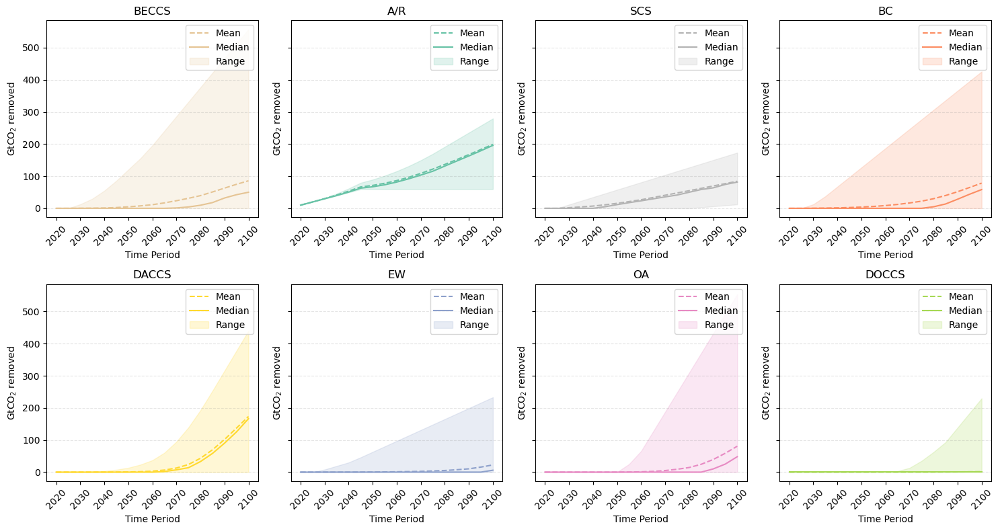

In [740]:
df = removed_per_CDR_time.div(1e9).copy()

# Initialize a figure with 8 subplots (one for each technology)
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), sharey = True)

# Flatten the axes array to make it easier to iterate over
axes = axes.flatten()

# Loop through each technology and plot the range (min, max) over time
for n, CDR in enumerate(i):
    # Extract the data for the current technology
    tech_data = df[CDR].unstack(level='future_id')  # Reshape so that time_period is on x-axis and future_id are the lines
    
    # Plot the min and max values for each time period
    ax = axes[n]

    # Plot the mean as a line
    ax.plot(tech_data.index, tech_data.mean(axis=1), color=color_dict[CDR], linestyle='--', label='Mean')
    # Plot the median as a line
    ax.plot(tech_data.index, tech_data.median(axis=1), color=color_dict[CDR], label='Median')
    
    # Plot the min and max values for each time period
    ax.fill_between(tech_data.index, tech_data.min(axis=1), tech_data.max(axis=1), color=color_dict[CDR], alpha=0.2, label='Range')

    '''# Plot the 25% and 75% quartiles as dotted lines
    ax.plot(tech_data.index, tech_data.quantile(0.25, axis=1, numeric_only=True), color='red', linestyle='--', label='25th Percentile')
    ax.plot(tech_data.index, tech_data.quantile(0.75, axis=1, numeric_only=True), color='green', linestyle='--', label='75th Percentile')'''

    ax.set_title(CDR)
    ax.set_xlabel('Time Period')
    ax.set_ylabel('GtCO$_2$ removed')
    
    # Change x-axis labels to range from 2020 to 2100 in steps of 10 years
    years = np.arange(2020, 2101, 10)  # Years from 2020 to 2100 in steps of 10
    tick_positions = np.arange(0, 17, 2)  # Only label every 2nd time period (0, 2, 4, ..., 16)
    ax.set_xticks(tick_positions)  # Set x-ticks to be every 2nd time period
    ax.set_xticklabels(years)  # Set x-tick labels to the corresponding years
    ax.tick_params(axis='x', labelrotation=45)
    ax.yaxis.grid(color='gray', alpha=0.2, linestyle='dashed')

    ax.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## Simplified Portfolios by Removals

If a future is deemed feasible by the solver, the optimisation model outputs a CDR portfolio capacity expansion plan at a 5-year increment. This output is highly granular, challenging the exact comparability of portfolio compositions. For this reason, model outputs are here converted into "simplified" porfolios" by grouping capacity of CDR option deployed into 4 bins and 3 different time periods (i.e., 2050, 2075, 2100).

- "bins" defines the ranges for the max removals level of the simplified portfolios. Index = CDR options, columns = 1,2,3,4 
    - Bin 1: $Y_i^{ini}·\Delta K$
    - Bins 2 & 3: equally spaced
    - Bin 4: $B^{max}_{i, \ output}$
- "simplified" has a multiindex: future ID, CDR option. Columns = [2050, 2075, 2100].

### Defining Bins

In [ ]:
# Creating bins for simplified portfolios: find maximum experience achieved for each CDR across all futures $Z^{max}_{i,output}$
# Initial_YRef: Dictionary with Initial Y ref values

n_bins = 4
B_max = pd.DataFrame(removed_per_CDR.max()) # Outputs the largest removals achieved for each CDR option across futures

bins = pd.DataFrame(index=i, columns = list(range(1,n_bins+1)))
for column in bins.columns:
    for CDR in i:
        mini = math.ceil(removed_per_CDR.min()[CDR])
        if CDR == 'EW': mini = 10.5
        maxi = B_max.loc[CDR,0]
        if column == 1:
            bins.loc[CDR, column] = mini
        elif column == n_bins:
            bins.loc[CDR, column] = math.ceil(maxi)
        else:
            bins.loc[CDR, column] = math.ceil(mini+(column-1)*(maxi - mini)/n_bins)
bins

,1,2,3,4
BECCS,27300000,139277292748,278527285496,557027270991
A/R,59400000000,114400000000,169400000000,279400000000
SCS,12000000010,52312500010,92625000010,173250000010
BC,7500000,106394999998,212782499995,425557499990
DACCS,150000,110093942949,220187735898,440375321796
EW,10.50,58243737904,116487475796,232974951582
OA,11,138381673414,276763346816,553526693621
DOCCS,11,57391368463,114782736914,229565473817


### Creating table with simplified portfolios for 1 time period

Infeasible futures ("NaN") have been dropped.

In [1132]:
# Create a table with max capacity per CDR option per future for 3 different time periods

simplified = pd.DataFrame()

for futureID in range(0,n_lhs+1):
    results_in_f = pd.DataFrame()
    results_in_f.index = pd.MultiIndex.from_tuples([(futureID, i[n]) for n in range(0, len(i))],names=['future_id','CDR_opt'])
    for CDR in i:
        if np.isnan(removed_per_CDR.loc[futureID,CDR]) == True:
            results_in_f.loc[(futureID,CDR),2100] = np.nan
        else:
            bin_n = 1
            found = False
            while found == False:
                if removed_per_CDR.loc[futureID,CDR] <= bins.loc[CDR, bin_n]:
                    found = True
                    results_in_f.loc[(futureID, CDR),2100] = bins.loc[CDR, bin_n]
                else:
                    bin_n += 1

    simplified = pd.concat([simplified,results_in_f])

simplified = simplified.dropna(axis=0, how="all")
simplified

2100
future_id CDR_opt                   
0         BECCS   139,277,292,748.00
          A/R     169,400,000,000.00
          SCS      52,312,500,010.00
          BC      106,394,999,998.00
          DACCS   220,187,735,898.00
...                              ...
3000      BC      106,394,999,998.00
          DACCS   440,375,321,796.00
          EW       58,243,737,904.00
          OA      138,381,673,414.00
          DOCCS                11.00

[21824 rows x 1 columns]

### Identifying repeated portfolios

Here the output dataframe "simplified_names" has one row per future, rather than a multi-index as for the "simplified" dataframe. Each case includes a list with the portfolio description as a string. This way, duplicates can easily be identified.

In [1133]:
simplified_names = pd.DataFrame()
n = 2100
for futureID, CDR in simplified.groupby(level=0):
    results_in = pd.DataFrame()
    #for n in [2050, 2075, 2100]:
    results_in.loc[futureID,n] = str(list(simplified.loc[(futureID),n].to_dict().items()))       
    
    # Add column with cumulative removals per future ID 
    results_in.loc[futureID,'GtCO2'] = aggregated_results.loc[futureID, 'Removals']/(1e9)
    simplified_names = pd.concat([simplified_names,results_in])
    
simplified_names
# The index of 'simplified_names' is the future_ID

,2100,GtCO2
0,"[('BECCS', 139277292748.0), ('A/R', 1694000000...",400.00
2,"[('BECCS', 139277292748.0), ('A/R', 2794000000...",500.00
3,"[('BECCS', 139277292748.0), ('A/R', 2794000000...","1,000.00"
4,"[('BECCS', 139277292748.0), ('A/R', 2794000000...",900.00
5,"[('BECCS', 139277292748.0), ('A/R', 2794000000...",700.00
...,...,...
2996,"[('BECCS', 139277292748.0), ('A/R', 2794000000...","1,100.00"
2997,"[('BECCS', 139277292748.0), ('A/R', 2794000000...",800.00
2998,"[('BECCS', 27300000.0), ('A/R', 169400000000.0...",500.00
2999,"[('BECCS', 139277292748.0), ('A/R', 2794000000...",800.00


In [1134]:
#simple_portfolios_2050 = simplified_names.drop_duplicates(subset=[2050])[[2050]]
#In pandas axis = 0 refers to horizontal axis or rows and axis = 1 refers to vertical axis or columns.

# Creating dataframes for each period:
#simple_portfolios_2050 = pd.DataFrame(simplified_names[2050].value_counts())
#simple_portfolios_2075 = pd.DataFrame(simplified_names[2075].value_counts())
simple_portfolios_2100 = pd.DataFrame(simplified_names[2100].value_counts())

year = 2050
# For each time period:
#for time in [simple_portfolios_2050, simple_portfolios_2075, simple_portfolios_2100]:
for time in [simple_portfolios_2100]:
    if time is simple_portfolios_2075: year = 2075
    elif time is simple_portfolios_2100: year = 2100
    
    number = 1
    # For each portfolio (row) in "simple_portfolios_":
    for portfolio in time.index:
        repeated = simplified_names[year].isin([portfolio])
        # find the index of the first occurrence of 'portfolio' in the DataFrame "simplified_names"
        time.loc[portfolio,"Example_FutureID"] = repeated.idxmax() # 'idxmax' Return index of first occurrence of maximum over requested axis.
                
        repeated = list(repeated[repeated].index)  # List on futureIDs that have the occurrence 'portfolio'
        maxi = 450
        mini = 1100
        for futureID in repeated:
            removed = total_future.loc[futureID,"Removals"]/1e9
            if removed <= mini:
                mini = removed
            if removed >= maxi:
                maxi = removed
        
        time.loc[portfolio,"Removals_Min"] = mini 
        time.loc[portfolio,"Removals_Max"] = maxi
        if number <= 4:
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_")+str(number)
        else: 
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_other")

        number += 1

simple_portfolios_2100.head(8)

,2100,Example_FutureID,Removals_Min,Removals_Max,Portfolio_ID
"[('BECCS', 139277292748.0), ('A/R', 169400000000.0), ('SCS', 92625000010.0), ('BC', 7500000.0), ('DACCS', 220187735898.0), ('EW', 10.5), ('OA', 11.0), ('DOCCS', 11.0)]",39,188.00,400.00,500.00,2100_1
"[('BECCS', 139277292748.0), ('A/R', 279400000000.0), ('SCS', 173250000010.0), ('BC', 106394999998.0), ('DACCS', 220187735898.0), ('EW', 58243737904.0), ('OA', 138381673414.0), ('DOCCS', 11.0)]",33,145.00,500.00,"1,000.00",2100_2
"[('BECCS', 139277292748.0), ('A/R', 279400000000.0), ('SCS', 92625000010.0), ('BC', 106394999998.0), ('DACCS', 220187735898.0), ('EW', 10.5), ('OA', 138381673414.0), ('DOCCS', 11.0)]",29,26.00,500.00,800.00,2100_3
"[('BECCS', 139277292748.0), ('A/R', 279400000000.0), ('SCS', 173250000010.0), ('BC', 106394999998.0), ('DACCS', 220187735898.0), ('EW', 10.5), ('OA', 138381673414.0), ('DOCCS', 11.0)]",27,142.00,500.00,800.00,2100_4
"[('BECCS', 139277292748.0), ('A/R', 169400000000.0), ('SCS', 52312500010.0), ('BC', 7500000.0), ('DACCS', 220187735898.0), ('EW', 10.5), ('OA', 11.0), ('DOCCS', 11.0)]",27,6.00,400.00,500.00,2100_other
"[('BECCS', 139277292748.0), ('A/R', 279400000000.0), ('SCS', 92625000010.0), ('BC', 106394999998.0), ('DACCS', 220187735898.0), ('EW', 58243737904.0), ('OA', 138381673414.0), ('DOCCS', 11.0)]",27,76.00,500.00,800.00,2100_other
"[('BECCS', 27300000.0), ('A/R', 169400000000.0), ('SCS', 92625000010.0), ('BC', 7500000.0), ('DACCS', 220187735898.0), ('EW', 10.5), ('OA', 11.0), ('DOCCS', 11.0)]",26,331.00,400.00,450.00,2100_other
"[('BECCS', 139277292748.0), ('A/R', 279400000000.0), ('SCS', 173250000010.0), ('BC', 106394999998.0), ('DACCS', 220187735898.0), ('EW', 58243737904.0), ('OA', 11.0), ('DOCCS', 11.0)]",26,136.00,500.00,800.00,2100_other


#### Based on Removals required

In [430]:
find = simplified_names[simplified_names.GtCO2==400]
name = pd.DataFrame(find[2100].value_counts()).index[0]

future = simplified_names[(simplified_names.GtCO2==400) & (simplified_names[2100] == name)].index.to_list()[0]
#removed_per_CDR.loc[future]
simplified_names.loc[future,2100]

"[('A/R', 191400000000.0), ('BC', 7500000.0), ('BECCS', 27300000.0), ('DACCS', 176150218719.0), ('DOCCS', 11.0), ('EW', 10.5), ('OA', 11.0), ('SCS', 108750000010.0)]"

In [1135]:
year = 2100
removals_interested = [400,600,800,1100]
number_per = 2

per_removals = pd.DataFrame()
per_removals.index = pd.MultiIndex.from_product([removals_interested, list(range(1,number_per+1))], names=["GtCO2", "Rank"])

for Gt in removals_interested:
#for Gt in [400]:
    # Find the subset of portfolios that meet the GtCO2 of the "per_removals" index Gt
    find = simplified_names[simplified_names.GtCO2==Gt][year].value_counts()
    for n in range(1,number_per+1):
        name = pd.DataFrame(find).index[n-1]
        per_removals.loc[(Gt,n), 'Portfolio'] = name # Save the portfolio name
        per_removals.loc[(Gt,n), 'Count'] = find[n-1] # Save the number of times it is repeated
        per_removals.loc[(Gt,n), 'Example_FutureID'] = simplified_names[(simplified_names.GtCO2==Gt) & (simplified_names[2100] == name)].index.to_list()[n-1] # Save a future ID to plot

per_removals

Portfolio  Count  \
GtCO2 Rank                                                             
400   1     [('BECCS', 139277292748.0), ('A/R', 1694000000...  29.00   
      2     [('BECCS', 27300000.0), ('A/R', 169400000000.0...  24.00   
600   1     [('BECCS', 139277292748.0), ('A/R', 2794000000...  12.00   
      2     [('BECCS', 139277292748.0), ('A/R', 2794000000...  11.00   
800   1     [('BECCS', 139277292748.0), ('A/R', 2794000000...   8.00   
      2     [('BECCS', 139277292748.0), ('A/R', 2794000000...   7.00   
1100  1     [('BECCS', 139277292748.0), ('A/R', 2794000000...   7.00   
      2     [('BECCS', 278527285496.0), ('A/R', 2794000000...   4.00   

            Example_FutureID  
GtCO2 Rank                    
400   1               188.00  
      2               345.00  
600   1               136.00  
      2               661.00  
800   1                97.00  
      2               545.00  
1100  1               364.00  
      2               847.00

### Plotting

In [1144]:
# ================ TRANSPARENCY DEFINED BY METRIC ================
cmap=plt.get_cmap('Set2')
order_by = 'mediastn_to_max_norm' # Order in which we would like to plot the technologies below
define_color = summary.loc[order_by].to_dict() 

color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
color_dict_norm = {}
mapping = {k: v for k, v in sorted(define_color.items(), key=lambda item: item[1])}

handles_plot= []
labels_plot = []
for CDR in mapping.keys():
    x = list(color_dict[CDR])
    x[3] = 1.1-summary.loc[order_by,CDR]
    color_dict_norm[CDR] = tuple(x)
    if CDR != 'DOCCS': 
        handles_plot += [mpatches.Patch(color=color_dict_norm[CDR], label=CDR)]
        labels_plot += [CDR]
#color_dict_norm

In [1146]:
# ================ COLOUR DEFINED BY METRIC ================
order_by = 'std' # Order in which we would like to plot the technologies below --> 'std_norm'
define_color = summary.loc[order_by].to_dict() 

# Normalising so that the smallest value is 0 and the max 1
raw = list(define_color.values())
norm = (raw-np.min(raw))/(np.max(raw[:-1])-np.min(raw)) # The raw[:-1] is to remove DOCCS, as we are not plotting it but it has a large effect on the colours
n=0
for CDR in define_color:
    define_color[CDR] = norm[n]
    n +=1

cmap=cm.vik

color_dict_norm = {}
handles_plot= []
labels_plot = []
mapping = {k: v for k, v in sorted(summary.loc[order_by].to_dict().items(), key=lambda item: item[1])}

for CDR in mapping.keys():
    #color_dict_norm[CDR] = cmap(summary.loc[order_by,CDR])
    color_dict_norm[CDR] = cmap(define_color[CDR])
    if CDR != 'DOCCS': 
        handles_plot += [mpatches.Patch(color=color_dict_norm[CDR], label=CDR)]
        labels_plot += [CDR]

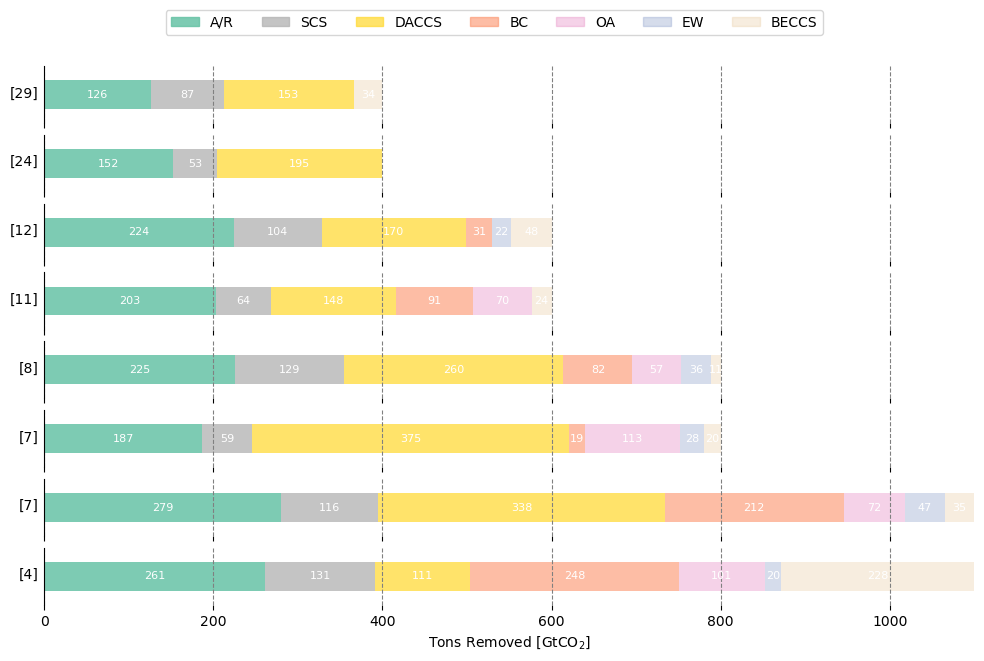

In [1137]:
n_cols = 1
n_rows = number_per*len(removals_interested)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, sharex=True, figsize=(12,7))

row = 0
col = 0

# Futures and data to plot
futures = per_removals['Example_FutureID'].to_list()

for futureID in futures:
    data = pd.DataFrame(removed_per_CDR.loc[futureID]).div(1e9)
    key = data.index.map(mapping)
    data = data.iloc[key.argsort()].T
    #data = pd.DataFrame(simplified.loc[futureID][2100]).div(1e9).T    
    
    AX = axes[row]
    ax_y = data.plot.barh(ax=AX,color=color_dict_norm, stacked=True, label = 2100, legend = False)
    #AX.axis("off")
    for rect in AX.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # Use 'width' if horizontal bars, 'height' if vertical bars
        label_text = round(width,0)

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2
        if label_text >0:
            AX.text(label_x, label_y, '%i' %label_text, ha='center', va='center', size=8, color = 'white') 
        
        AX.yaxis.offsetText.set_fontsize(8)
        AX.spines[['right', 'top','bottom']].set_visible(False)
        AX.xaxis.grid(color='gray', linestyle='dashed')
    
    AX.set_yticks([])
    AX.set_ylabel(ylabel='[%i]'%per_removals.loc[per_removals['Example_FutureID'] == futureID, 'Count'], fontsize = 10, rotation = 'horizontal', ha='right',y=height-0.1)

    if row == n_rows-1: AX.set_xlabel(xlabel='Tons Removed [GtCO$_2$]', fontsize = 10)
    if col == n_cols-1:
        col = 0
        row += 1
    else: col += 1

fig.legend(handles_plot, labels_plot, fontsize = 10, loc='upper center', bbox_to_anchor=(0.5, 0.97),ncol=8)

plt.show()    
plt.close('all')

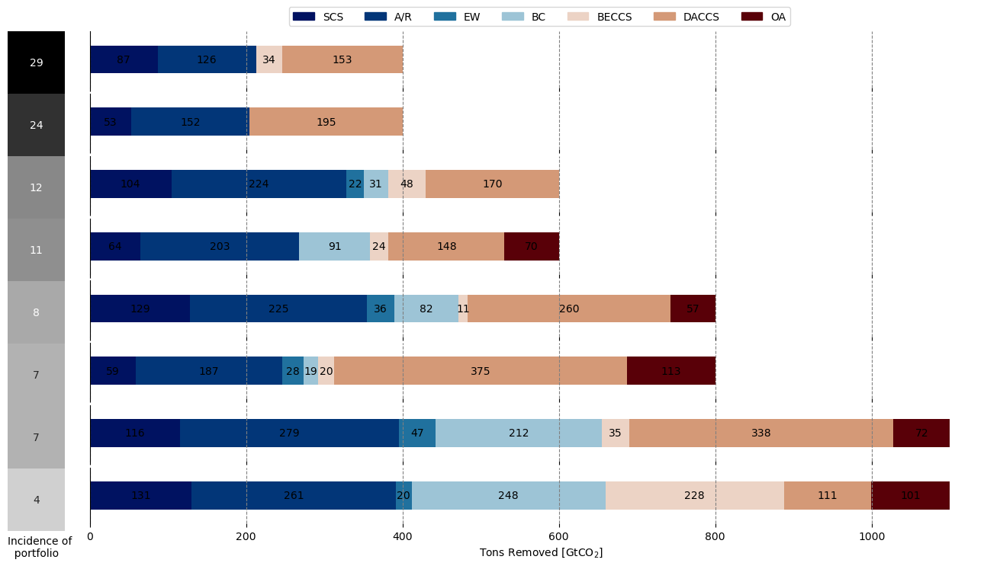

In [1147]:
n_cols = 1
n_rows = number_per*len(removals_interested)
#fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, sharex=True, figsize=(7,7))

fig = plt.figure(layout='constrained', figsize=(13, 7))
subfigs = fig.subfigures(1, 2, wspace=0.03, width_ratios=[0.07, 1])

row = 0
col = 0

# Futures and data to plot
futures = per_removals['Example_FutureID'].to_list()

axes = subfigs[1].subplots(nrows=n_rows, ncols=n_cols, sharex=True)

for futureID in futures:
    data = pd.DataFrame(removed_per_CDR.loc[futureID]).div(1e9)
    key = data.index.map(mapping)
    data = data.iloc[key.argsort()].T
    #data = pd.DataFrame(simplified.loc[futureID][2100]).div(1e9).T    
    
    AX = axes[row]
    ax_y = data.plot.barh(ax=AX,color=color_dict_norm, stacked=True, label = 2100, legend = False)
    #AX.axis("off")
    for rect in AX.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # Use 'width' if horizontal bars, 'height' if vertical bars
        label_text = round(width,0)

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2
        if label_text >0:
            AX.text(label_x, label_y, '%i' %label_text, ha='center', va='center', size=10, color = 'black') 
        
        AX.yaxis.offsetText.set_fontsize(8)
        AX.spines[['right', 'top','bottom']].set_visible(False)
        AX.xaxis.grid(color='gray', linestyle='dashed')
    
    AX.set_yticks([])
    #AX.set_ylabel(ylabel='[%i]'%per_removals.loc[per_removals['Example_FutureID'] == futureID, 'Count'], fontsize = 10, rotation = 'horizontal', ha='right',y=height-0.1)

    if row == n_rows-1: AX.set_xlabel(xlabel='Tons Removed [GtCO$_2$]', fontsize = 10)
    if col == n_cols-1:
        col = 0
        row += 1
    else: col += 1

subfigs[1].legend(handles_plot, labels_plot, fontsize = 10, loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=8)

ax = subfigs[0].subplots(1, 1)
ax = sns.heatmap(pd.DataFrame(per_removals.Count.values), annot=True, cmap=cm.grayC_r, vmin=0, cbar=False) # acton_r
ax.set_yticks([])
ax.set_xticks([])
ax.set_xlabel(xlabel='Incidence of \n  portfolio', loc='left')

plt.show()    
plt.close('all')

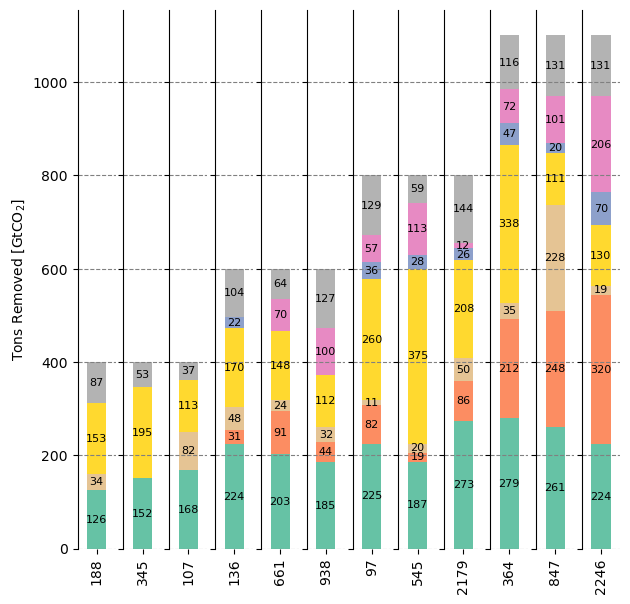

In [451]:
n_cols = number_per*len(removals_interested)
n_rows = 1
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, sharey=True, figsize=(7,7))

row = 0
col = 0
#for Gt, rank in per_removals.groupby(level=0):
futures = per_removals['Example_FutureID'].to_list()

for futureID in futures:
    #label_bar(pd.DataFrame(simplified.loc[futureID][2100]).div(1e9).T,axes[col])
    label_bar(pd.DataFrame(removed_per_CDR.loc[futureID]).div(1e9).T,axes[col])

    #axes[row,col].set_title('%s GtCO2' %Gt)
    if col == 0: axes[col].set_ylabel(ylabel='Tons Removed [GtCO$_2$]', fontsize = 10)

    if col == n_cols-1:
        col = 0
        row += 1
    else: col += 1

plt.show()    
plt.close('all')

In [459]:
def label_bar(data, AX):
    ax_y = data.plot.bar(ax=AX,color=color_dict,stacked=True, label = 2100, legend = False)
    #AX.axis("off")
    for rect in AX.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The width of the bar is also not pixels, it's the
        # number of animals. So we can use it as the label!
        label_text = round(height,0)

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2
        if label_text >0:
            AX.text(label_x, label_y, '%i' %label_text, ha='center', va='center', size=8) 
        
        #AX.tick_params(axis='x', labelsize = 9)
        #axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        AX.yaxis.offsetText.set_fontsize(8)
        AX.spines[['right', 'top','bottom']].set_visible(False)
        #AX.set_axisbelow(True)
        AX.yaxis.grid(color='gray', linestyle='dashed')
    
    return AX

def label_barh(data, AX):
    ax_y = data.plot.barh(ax=AX,color=color_dict, stacked=True, label = 2100, legend = False)
    #AX.axis("off")
    for rect in AX.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The width of the bar is also not pixels, it's the
        # number of animals. So we can use it as the label!
        label_text = round(width,0)

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2
        if label_text >0:
            AX.text(label_x, label_y, '%i' %label_text, ha='center', va='center', size=8) 
        
        #AX.tick_params(axis='x', labelsize = 9)
        #axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        AX.yaxis.offsetText.set_fontsize(8)
        AX.spines[['right', 'top','bottom']].set_visible(False)
        #AX.set_axisbelow(True)
        AX.xaxis.grid(color='gray', linestyle='dashed')
    
    return AX


#### For scenarios

In [1148]:
dataframe = max_2100.T.copy()
# This is because the dataframes were defined as: max_time = (Max capacity in indicated time period) - (Initial Capacity Installed) 
for CDR in dataframe.columns:
    dataframe.loc[:,CDR] += Initial_YRef[CDR]
    
# ======================= Summary Statistics =======================
parameters = {'OA_2100':[1,0]}

for parameter in list(parameters.keys()): 
    metrics_of_interest = extract_range(all_metrics_ranges,metric_interest=parameter,minimum=parameters[parameter][0],maximum=parameters[parameter][1])
    
    # ================================== Identifying Futures of Interest ==================================
    list_of_futures = []
    remaining_futures = aggregated_results.copy()
    for metric in metrics_of_interest:
        for futureID in remaining_futures.index:
            value = remaining_futures.loc[futureID, metric]
            if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
                list_of_futures += [futureID]
            else:
                remaining_futures = remaining_futures.drop(futureID)
    list_of_futures_in = remaining_futures.index.to_list()
    list_of_futures_out = list(set(aggregated_results.index.to_list()) - set(list_of_futures_in)) # List of futures that are outside ranges specified in "metrics_of_interest"

    for futureID in list_of_futures_out: dataframe = dataframe[dataframe.index != futureID]

summary_scenario = dataframe.div(1e9).describe(include = 'all')
summary_scenario.loc['median'] = dataframe.div(1e9).median()
summary_scenario.loc['IQR'] = summary_scenario.loc['75%']-summary_scenario.loc['25%']

#Normalising the IQR based on largest value
summary_scenario.loc['IQR_norm'] = summary_scenario.loc['IQR'].div(summary.loc['IQR'].max()) # Note that we are dividing by the general summary
summary_scenario.loc['std_norm'] = summary_scenario.loc['std'].div(summary.loc['std'].max()) # Note that we are dividing by the general summary
#summary_scenario.loc['median_to_max_norm'] = (summary_scenario.loc['max']-summary_scenario.loc['median'])/summary_scenario.loc['max'] # (output max - median)/(output max) 
summary_scenario.loc['median_to_max_norm'] = (summary.loc['max']-summary_scenario.loc['median'])/summary.loc['max'] # NOTE: using max from ensemble of all futures 

#pd.option_context('display.float_format', '{:,.2f}'.format)
print("Summary of results for scenarios based on parameters %s" %parameters.keys())                  
summary_scenario

Summary of results for scenarios based on parameters dict_keys(['OA_2100'])


,BECCS,A/R,SCS,BC,DACCS,EW,OA,DOCCS
count,785.00,785.00,785.00,785.00,785.00,785.00,785.00,785.00
mean,2.49,3.38,1.52,2.11,8.66,0.91,0.00,0.00
std,2.78,0.86,0.55,2.07,2.63,1.29,0.00,0.00
min,0.00,1.98,0.60,0.00,0.00,0.00,0.00,0.00
25%,0.00,2.54,0.98,0.00,6.50,0.00,0.00,0.00
50%,1.89,3.58,1.55,1.56,8.77,0.00,0.00,0.00
75%,3.82,4.15,1.93,4.08,10.73,2.01,0.00,0.00
max,10.00,4.40,2.31,5.97,12.50,3.80,0.00,0.00
median,1.89,3.58,1.55,1.56,8.77,0.00,0.00,0.00
IQR,3.82,1.61,0.95,4.08,4.23,2.01,0.00,0.00


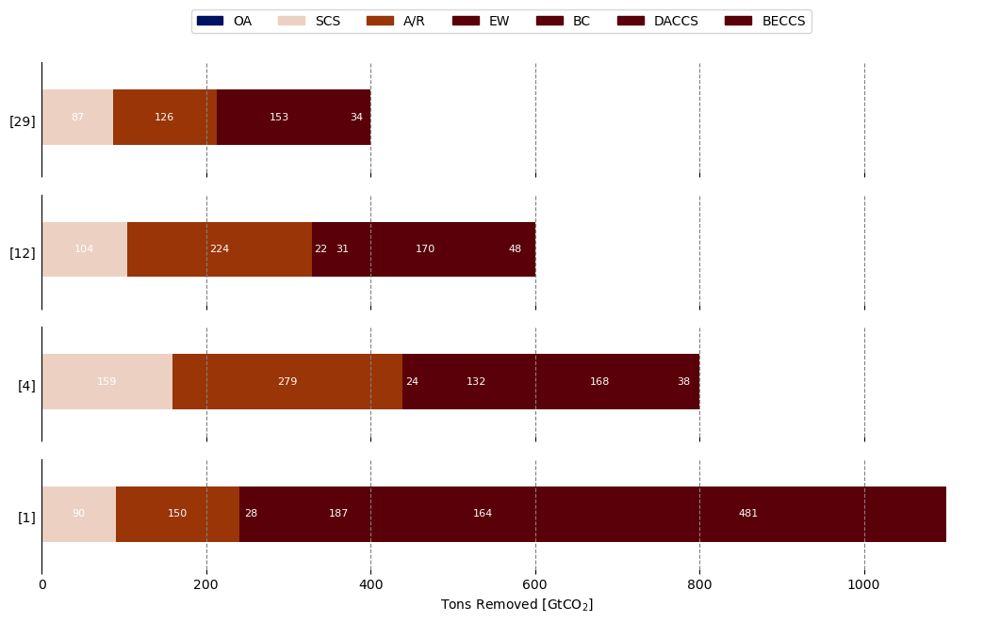

In [1149]:
'''
From Cell: Violin Charts > Scenarios > 3 Scenarios: we take list_of_futures_out
We simply keep only the futures that meet our scenario definition, and do the same analysis

NOTE: for the colors, we are using the std from the scenario subset, which ofc shows OA as less risky because the range is much lower. 
'''

# ================================================================================================================
# Keeping only the futures that meet our scenario definition
for futureID in list_of_futures_out: simplified_names = simplified_names[simplified_names.index != futureID] 

# ================================================================================================================
simple_portfolios_2100 = pd.DataFrame(simplified_names[2100].value_counts())

year = 2050
# For each time period:
#for time in [simple_portfolios_2050, simple_portfolios_2075, simple_portfolios_2100]:
for time in [simple_portfolios_2100]:
    if time is simple_portfolios_2075: year = 2075
    elif time is simple_portfolios_2100: year = 2100
    
    number = 1
    # For each portfolio (row) in "simple_portfolios_":
    for portfolio in time.index:
        repeated = simplified_names[year].isin([portfolio])
        # find the index of the first occurrence of 'portfolio' in the DataFrame "simplified_names"
        time.loc[portfolio,"Example_FutureID"] = repeated.idxmax() # 'idxmax' Return index of first occurrence of maximum over requested axis.
                
        repeated = list(repeated[repeated].index)  # List on futureIDs that have the occurrence 'portfolio'
        maxi = 450
        mini = 1100
        for futureID in repeated:
            removed = total_future.loc[futureID,"Removals"]/1e9
            if removed <= mini:
                mini = removed
            if removed >= maxi:
                maxi = removed
        
        time.loc[portfolio,"Removals_Min"] = mini 
        time.loc[portfolio,"Removals_Max"] = maxi
        if number <= 4:
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_")+str(number)
        else: 
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_other")

        number += 1

year = 2100
removals_interested = [400,600,800,1100]
number_per = 1

per_removals = pd.DataFrame()
per_removals.index = pd.MultiIndex.from_product([removals_interested, list(range(1,number_per+1))], names=["GtCO2", "Rank"])

for Gt in removals_interested:
#for Gt in [400]:
    # Find the subset of portfolios that meet the GtCO2 of the "per_removals" index Gt
    find = simplified_names[simplified_names.GtCO2==Gt][year].value_counts()
    for n in range(1,number_per+1):
        name = pd.DataFrame(find).index[n-1]
        per_removals.loc[(Gt,n), 'Portfolio'] = name # Save the portfolio name
        per_removals.loc[(Gt,n), 'Count'] = find[n-1] # Save the number of times it is repeated
        per_removals.loc[(Gt,n), 'Example_FutureID'] = simplified_names[(simplified_names.GtCO2==Gt) & (simplified_names[2100] == name)].index.to_list()[n-1] # Save a future ID to plot

# ================================ COLOUR DEFINED BY METRIC ================================
order_by = 'std' # Order in which we would like to plot the technologies below --> 'std_norm'
define_color = summary_scenario.loc[order_by].to_dict() 

'''# Normalising so that the smallest value is 0 and the max 1
raw = list(define_color.values())
norm = (raw-np.min(raw))/(np.max(raw[:-1])-np.min(raw)) # The raw[:-1] is to remove DOCCS, as we are not plotting it but it has a large effect on the colours
n=0
for CDR in define_color:
    define_color[CDR] = norm[n]
    n +=1'''

cmap=cm.vik

color_dict_norm = {}
handles_plot= []
labels_plot = []
mapping = {k: v for k, v in sorted(define_color.items(), key=lambda item: item[1])}

for CDR in mapping.keys():
    #color_dict_norm[CDR] = cmap(summary.loc[order_by,CDR])
    color_dict_norm[CDR] = cmap(define_color[CDR])
    if CDR != 'DOCCS': 
        handles_plot += [mpatches.Patch(color=color_dict_norm[CDR], label=CDR)]
        labels_plot += [CDR]
# ================================================================================================================
n_cols = 1
n_rows = number_per*len(removals_interested)
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, sharex=True, figsize=(13,7))

row = 0
col = 0

# Futures and data to plot
futures = per_removals['Example_FutureID'].to_list()

for futureID in futures:
    data = pd.DataFrame(removed_per_CDR.loc[futureID]).div(1e9)
    key = data.index.map(mapping)
    data = data.iloc[key.argsort()].T
    #data = pd.DataFrame(simplified.loc[futureID][2100]).div(1e9).T    
    
    AX = axes[row]
    ax_y = data.plot.barh(ax=AX,color=color_dict_norm, stacked=True, label = 2100, legend = False)
    #AX.axis("off")
    for rect in AX.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # Use 'width' if horizontal bars, 'height' if vertical bars
        label_text = round(width,0)

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2
        if label_text >0:
            AX.text(label_x, label_y, '%i' %label_text, ha='center', va='center', size=8, color = 'white') 
        
        AX.yaxis.offsetText.set_fontsize(8)
        AX.spines[['right', 'top','bottom']].set_visible(False)
        AX.xaxis.grid(color='gray', linestyle='dashed')
    
    AX.set_yticks([])
    AX.set_ylabel(ylabel='[%i]'%per_removals.loc[per_removals['Example_FutureID'] == futureID, 'Count'], fontsize = 10, rotation = 'horizontal', ha='right',y=height-0.1)

    if row == n_rows-1: AX.set_xlabel(xlabel='Tons Removed [GtCO$_2$]', fontsize = 10)
    if col == n_cols-1:
        col = 0
        row += 1
    else: col += 1

fig.legend(handles_plot, labels_plot, fontsize = 10, loc='upper center', bbox_to_anchor=(0.5, 0.97),ncol=8)

plt.show()    
plt.close('all')

## Violin Charts

Key Resources:
- [Seaborn violing plots Documentation](https://seaborn.pydata.org/generated/seaborn.violinplot.html)
- [.stack()](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.stack.html#pandas.DataFrame.stack) a dataframe -> add columns as multi-index
- [sns.set_theme()](https://seaborn.pydata.org/generated/seaborn.set_theme.html#seaborn.set_theme)

### Max Capacity per time period

Maximum capacity of BECCS in 2050 is 10.0 GtCO2/yr
Interquartile range of DACCS in 2100 is: 5.4 to 10.0 GtCO2/yr


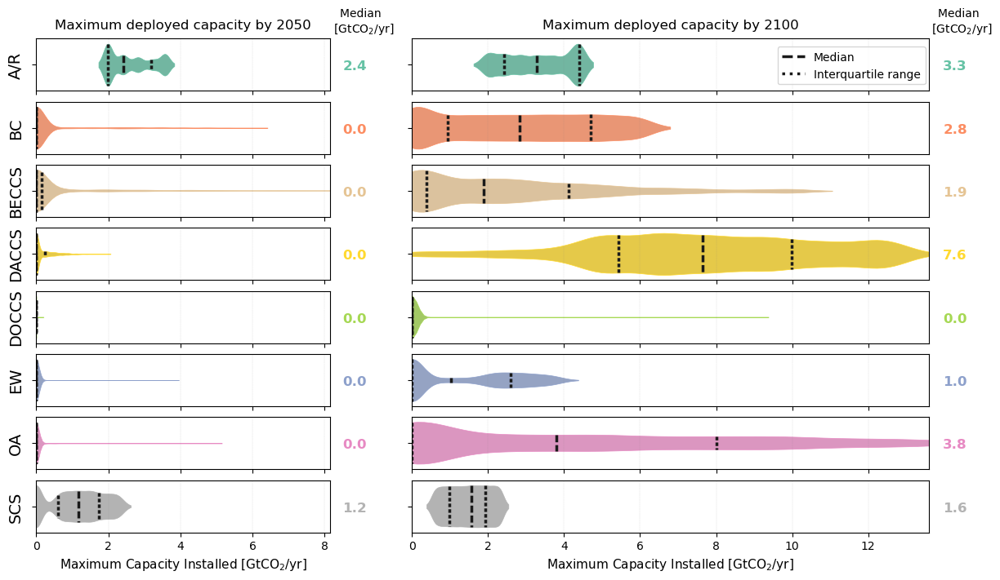

In [836]:
periods = [2050,2100] # Only admits 2 periods > run cell below to visualise 2075 data.
i.sort()
# ================================== For plotting purposes ==================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
mpl.rcParams.update(mpl.rcParamsDefault)

y_legend = 1.05
y_subfig = y_legend + 0.01

fig = plt.figure(layout='constrained', figsize=(12, 7))
subfigs = fig.subfigures(1, len(periods), wspace=0.07, width_ratios=[0.63, 1])

#plt.suptitle('Distribution of maximum deployed capacity per CDR Option at different time periods', size=13, y=y_subfig+0.03)
'''fig.legend(handles=[mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.8),
                           mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1.4)], 
           fontsize =10, loc='upper center', bbox_to_anchor=(0.5,y_legend), ncol=2)'''
# ================================== For plotting purposes ==================================
sub = 0
time = max_2050.sort_index().copy()    
for year in periods:
    if year == 2075:
        time = max_2075.sort_index().copy() 
    elif year == 2100:
        time = max_2100.sort_index().copy()     
    
    # This is because the dataframes were defined as: max_time = (Max capacity in indicated time period) - (Initial Capacity Installed) 
    for CDR in time.index:
        time.loc[CDR,:] += Initial_YRef[CDR]
        
    df = pd.DataFrame(time.T.stack())
    df = df.rename(columns={0:"Maximum Capacity"})
    df = df.reset_index()
    df["Maximum Capacity"] = df["Maximum Capacity"].mul(1e-9)
    df = df.rename(columns={"level_1":"CDR_opt"})
    
    #subfigs[sub].suptitle('Maximum deployed capacity by %d' %year, fontsize=12, y = y_subfig)
    axes = subfigs[sub].subplots(8, 2, width_ratios=[12,1], sharex='col')

    r = 0
    axes[r,0].set_title('Maximum deployed capacity by %d' %year, fontsize=12, y = y_subfig)
    if sub == 0:
        axes[r,1].set_title('Median \n [GtCO$_2$/yr]', fontsize = 10, loc='center', x=0.9)
    else:
        axes[r,1].set_title('Median \n [GtCO$_2$/yr]', fontsize = 10, loc='center', x=0.5)
    for CDR in i:
        plot = df[df.CDR_opt == CDR] 
        
        # Adding Median information
        median_all = df[df.CDR_opt == CDR]['Maximum Capacity'].median()
        axes[r,1].annotate('%.1f' %median_all, xy=(0.5,0.4), xytext=(0.1,0.4), color = color_dict[CDR], annotation_clip=False, fontsize=12, weight='bold')
        axes[r,1].spines[['right', 'top','left','bottom']].set_visible(False)
        axes[r,1].set_xticks([])
        axes[r,1].set_yticks([])
        axes[r,1].set_ylabel(ylabel = "")
        axes[r,1].set_xlabel(xlabel = "")
    
        # Adding Violin Plots
        sns.violinplot(data=plot, x="Maximum Capacity",ax=axes[r,0], label=CDR, color = color_dict[CDR],linewidth=0.5, 
                       legend = False, linecolor= color_dict[CDR], density_norm='count', inner="quart", inner_kws={"color": "k", "linewidth": 2.5})
        axes[r,0].set_xticks([0,2,4,6,8,10,12])

        if year == 2050:
            axes[r,0].set_xlim(0,1e-9*max_capacity.max().max()*0.6)
        else: 
            axes[r,0].set_xlim(0,1e-9*max_capacity.max().max())
            
        axes[r,0].set_xlabel(xlabel = "")
        axes[r,0].xaxis.grid(color='grey', linestyle='--', linewidth=0.1, zorder=1)
        
        if sub == 0:
            axes[r,0].set_ylabel(ylabel=CDR, fontsize = 14)

        if r == 7:
            axes[r,0].set_xlabel(xlabel = "Maximum Capacity Installed [GtCO$_2$/yr]", fontsize = 11)
        r += 1
    
    sub += 1

axes[0,0].legend(handles=[mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=2.5),
                           mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=2.5)], 
           fontsize =10, loc='upper center', bbox_to_anchor=(0.85,0.95), ncol=1)

print('Maximum capacity of BECCS in 2050 is %.1f GtCO2/yr' %(1e-9*max_2050.loc['BECCS',:].max()))
print("Interquartile range of DACCS in 2100 is:", round(df[df.CDR_opt == 'DACCS']['Maximum Capacity'].quantile(0.25),1), "to", round(df[df.CDR_opt == 'DACCS']['Maximum Capacity'].quantile(0.75),1), "GtCO2/yr")

plt.show()
plt.close('all')

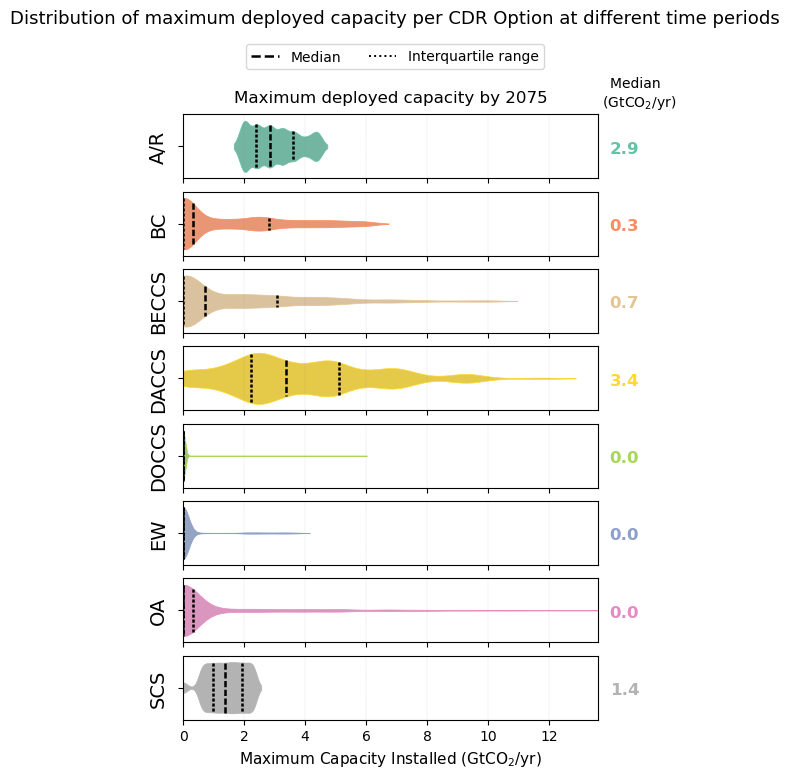

In [29]:
# ONLY FOR 2075

periods = [2075]
# ================================== For plotting purposes ==================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
mpl.rcParams.update(mpl.rcParamsDefault)

y_legend = 1.05
y_subfig = y_legend + 0.01

fig = plt.figure(layout='constrained', figsize=(5, 7))
#subfigs = fig.subfigures(1, len(periods), wspace=0.07, width_ratios=[0.63, 1])

plt.suptitle('Distribution of maximum deployed capacity per CDR Option at different time periods', size=13, y=y_subfig+0.03)
fig.legend(handles=[mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.8),
                           mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1.4)], 
           fontsize =10, loc='upper center', bbox_to_anchor=(0.5,y_legend), ncol=2)
# ================================== For plotting purposes ==================================
sub = 0
time = max_2050.copy()    
for year in periods:
    if year == 2075:
        time = max_2075.copy() 
    elif year == 2100:
        time = max_2100.copy()     
    
    for CDR in time.index:
        time.loc[CDR,:] += Initial_YRef[CDR]
        
    df = pd.DataFrame(time.T.stack())
    df = df.rename(columns={0:"Maximum Capacity"})
    df = df.reset_index()
    df["Maximum Capacity"] = df["Maximum Capacity"].mul(1e-9)
    df = df.rename(columns={"level_1":"CDR_opt"})
    
    #subfigs[sub].suptitle('Maximum deployed capacity by %d' %year, fontsize=12, y = y_subfig)
    axes = fig.subplots(8, 2, width_ratios=[12,1], sharex='col')

    r = 0
    axes[r,0].set_title('Maximum deployed capacity by %d' %year, fontsize=12, y = y_subfig)
    if sub == 0:
        axes[r,1].set_title('Median \n (GtCO$_2$/yr)', fontsize = 10, loc='center', x=0.9)
    else:
        axes[r,1].set_title('Median \n (GtCO$_2$/yr)', fontsize = 10, loc='center', x=0.5)
    for CDR in i:
        plot = df[df.CDR_opt == CDR] 
        #print(df[df.CDR_opt == CDR]['Maximum Capacity'].max())
        # Adding Median information
        median_all = df[df.CDR_opt == CDR]['Maximum Capacity'].median()
        axes[r,1].annotate('%.1f' %median_all, xy=(0.5,0.4), xytext=(0.1,0.4), color = color_dict[CDR], annotation_clip=False, fontsize=12, weight='bold')
        axes[r,1].spines[['right', 'top','left','bottom']].set_visible(False)
        axes[r,1].set_xticks([])
        axes[r,1].set_yticks([])
        axes[r,1].set_ylabel(ylabel = "")
        axes[r,1].set_xlabel(xlabel = "")
    
        # Adding Violin Plots
        sns.violinplot(data=plot, x="Maximum Capacity",ax=axes[r,0], label=CDR, color = color_dict[CDR],linewidth=0.5, 
                       legend = False, linecolor= color_dict[CDR], density_norm='count', inner="quart", inner_kws={"color": "k", "linewidth": 1.8})
        axes[r,0].set_xticks([0,2,4,6,8,10,12])

        if year == 2050:
            axes[r,0].set_xlim(0,1e-9*max_capacity.max().max()*0.6)
        else: 
            axes[r,0].set_xlim(0,1e-9*max_capacity.max().max())
        axes[r,0].set_xlabel(xlabel = "")
        axes[r,0].xaxis.grid(color='grey', linestyle='--', linewidth=0.1, zorder=1)
        
        if sub == 0:
            axes[r,0].set_ylabel(ylabel=CDR, fontsize = 14)

        if r == 7:
            axes[r,0].set_xlabel(xlabel = "Maximum Capacity Installed (GtCO$_2$/yr)", fontsize = 11)
        r += 1
    
    sub += 1

plt.show()
plt.close('all')

### Scenarios

Methodology:
- Select an uncertainty (or combination of) that is to be evaluated. Available parameters are described in cell "all_metric_ranges" below.
- Select a relevant range to observe 
- Identify the FutureIDs that meet the criteria
- Visualise using violin plots only with those future IDs vs all futures

#### Available Scenarios

In [1046]:
# Describes parameters that can be investigated. Range is reported in brackets: [[minimum, maximum]]
all_metrics_ranges

{'Energy_DACCS': [[4.7, 10.0]],
 'Energy_DOCCS': [[2.5, 8.3]],
 'Energy_EW': [[0.5, 12.5]],
 'Energy_OA': [[0.7, 6.8]],
 'EnergyL': [[2030.0, 2050.0]],
 'Land_A/R': [[0.07, 0.09]],
 'Land_BECCS': [[0.04, 0.17]],
 'LandL': [[200000000.0, 1000000000.0]],
 'ER_A/R': [[-0.23, 0.02]],
 'ER_BC': [[-0.05, 0.1]],
 'ER_BECCS': [[-0.15, 0.15]],
 'ER_DACCS': [[0.05, 0.15]],
 'ER_DOCCS': [[0.05, 0.15]],
 'ER_EW': [[-0.05, 0.05]],
 'ER_OA': [[-0.05, 0.1]],
 'ER_SCS': [[-0.23, -0.01]],
 'CDRRequired': [[400000000000.0, 1100000000000.0]],
 'Ymax_A/R': [[2000000000.0, 5870000000.0]],
 'Ymax_BC': [[300000000.0, 5970000000.0]],
 'Ymax_BECCS': [[700000000.0, 11410000000.0]],
 'Ymax_DACCS': [[5000000000.0, 18500000000.0]],
 'Ymax_DOCCS': [[1000000000.0, 9100000000.0]],
 'Ymax_EW': [[2000000000.0, 3800000000.0]],
 'Ymax_OA': [[1000000000.0, 13600000000.0]],
 'Ymax_SCS': [[600000000.0, 2310000000.0]],
 'GeoSt': [[4000000000.0, 20000000000.0]],
 'Solved': [[0, 1]],
 'Removals': [[0.0, 1100000000000.0012]],
 

In [619]:
# ===== Defining Colors for different groups of parameters =====
cmap=plt.get_cmap('Set2')

color_plots_dict = {'Energy_DACCS': 'orange', 'Energy_DOCCS': 'orange', 'Energy_EW': 'orange', 'Energy_OA': 'orange', 'EnergyL': 'orange',
               'Land_AR': 'mediumseagreen', 'Land_BECCS': 'mediumseagreen', 'LandL': 'mediumseagreen',
               'ER_AR': 'mediumorchid', 'ER_BC': 'mediumorchid', 'ER_BECCS': 'mediumorchid', 'ER_DACCS': 'mediumorchid', 'ER_DOCCS': 'mediumorchid', 'ER_EW': 'mediumorchid', 'ER_OA': 'mediumorchid', 'ER_SCS': 'mediumorchid',
               'CDRRequired': 'khaki', 'Ymax_AR': 'saddlebrown', 'Ymax_BC': 'saddlebrown', 'Ymax_BECCS': 'saddlebrown', 'Ymax_DACCS': 'saddlebrown', 'Ymax_DOCCS': 'saddlebrown', 'Ymax_EW': 'saddlebrown', 'Ymax_OA': 'saddlebrown', 'Ymax_SCS': 'saddlebrown',
               'GeoSt': 'khaki', 'Solved': 'khaki', 'Removals': 'khaki', 'Costs': 'deepskyblue',
               'A/R': cmap(0.1), 'BC': cmap(0.2), 'BECCS': cmap(0.8), 'DACCS': cmap(0.7), 'DOCCS': cmap(0.5), 'EW': cmap(0.3), 'OA': cmap(0.4), 'SCS': cmap(0.9),
            'Land': 'khaki', 'Energy': 'orange', 'Water': 'lightblue', 'Nitrogen': 'tan', 'Phosphorous': 'tan'}

In [618]:
# Extract range into dictionary with lists: dict = {'parameter' : [[min, max]]}
def extract_range(all_metrics_ranges,metric_interest,minimum,maximum):
    minimum_value = all_metrics_ranges[metric_interest][0][0]
    maximum_value = all_metrics_ranges[metric_interest][0][1]
    if minimum == 1:
        interest = [minimum_value, minimum_value+(maximum_value-minimum_value)*maximum]
    elif maximum == 1:
        interest = [minimum_value+(maximum_value-minimum_value)*minimum, maximum_value]
    else: 
        interest = [minimum_value+(maximum_value-minimum_value)*minimum, minimum_value+(maximum_value-minimum_value)*maximum]
    
    return {metric_interest : [interest]}

# Extract range into dictionary with tuples: dict = {'parameter' : (min, max)}
def extract_range_tuples(all_metrics_ranges,metric_interest,minimum,maximum):
    minimum_value = all_metrics_ranges[metric_interest][0][0]
    maximum_value = all_metrics_ranges[metric_interest][0][1]
    if minimum == 1:
        interest = (minimum_value, minimum_value+(maximum_value-minimum_value)*maximum)
    elif maximum == 1:
        interest = (minimum_value+(maximum_value-minimum_value)*minimum, maximum_value)
    else: 
        interest = (minimum_value+(maximum_value-minimum_value)*minimum, minimum_value+(maximum_value-minimum_value)*maximum)
    
    return {metric_interest : interest}

#### Visualising Experience Parameters for all CDR options

<Figure size 1200x700 with 0 Axes>

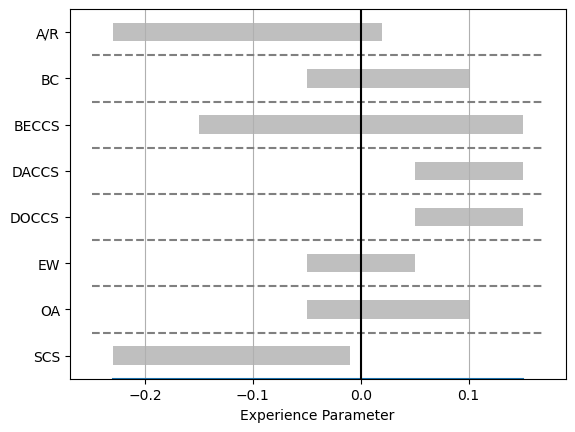

In [35]:
# =========================================== Visualising Experience Parameters for all CDR options ===========================================

import matplotlib.pyplot as plt
import matplotlib.patches as patches
# Code source: https://stackoverflow.com/questions/29451057/how-to-do-a-range-bar-graph-in-matplotlib
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}

def plot_rect(data, color, delta=0.4):
    """data is a dictionary, {"Label":(low,hi), ... }
    return a drawing that you can manipulate, show, save etc"""

    yspan = len(data)
    yplaces = [.5+i for i in range(yspan)]
    ylabels = sorted(data.keys(),reverse=True)

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_yticks(yplaces)
    ax.set_yticklabels(ylabels)
    ax.set_ylim((0,yspan))

    # later we'll need the min and max in the union of intervals
    low, hi =  data[ylabels[0]]
    for pos, label in zip(yplaces,ylabels):
        start, end = data[label]
        ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start,delta,facecolor=color))
        #ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start,delta,facecolor=color_dict[label]))
        if start<low : low=start
        if end>hi : hi=end

    # little small trick, draw an invisible line so that the x axis
    # limits are automatically adjusted...
    ax.plot((low,hi),(0,0))

    # now get the limits as automatically computed
    xmin, xmax = ax.get_xlim()
    # and use them to draw the hlines in your example
    ax.hlines(range(1,yspan),xmin,xmax, linestyles = 'dashed', color = 'grey')
    ax.axvline(color='k')
    # the vlines are simply the x grid lines
    ax.grid(axis='x')
    # eventually return what we have done
    return ax

# ===============================================================================================
ranges_ER = {}
ranges_ER_interest = {}
for CDR in i:
    ranges_ER[CDR] = (all_metrics_ranges['ER_'+CDR][0][0], all_metrics_ranges['ER_'+CDR][0][1])
    ranges_ER_interest[CDR] = extract_range_tuples(all_metrics_ranges,'ER_'+CDR,minimum=1,maximum=0.25)['ER_'+CDR]
    
ax = plot_rect(ranges_ER,(0.5,0.5,0.5,0.5))
#ax = plot_rect(ranges_ER_interest,'mediumorchid')
ax.set_xlabel('Experience Parameter')

plt.show()
plt.close('all') 

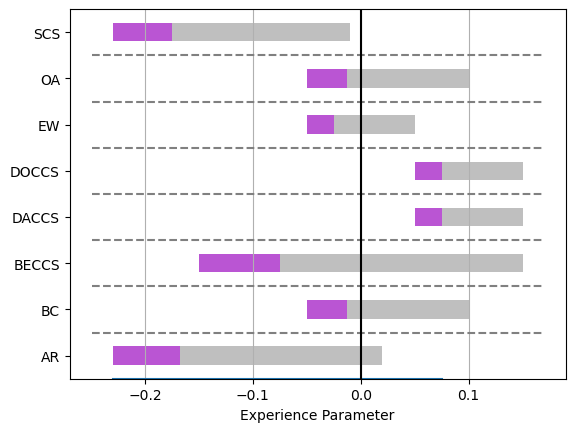

In [31]:
# =========================================== Visualising Experience Parameters for all CDR options for futures of interest ===========================================

import matplotlib.pyplot as plt
import matplotlib.patches as patches
# Code source: https://stackoverflow.com/questions/29451057/how-to-do-a-range-bar-graph-in-matplotlib
def plot_rect_two(data_all, data_interest, color_all, color_interest, delta=0.4):
    """data is a dictionary, {"Label":(low,hi), ... }
    return a drawing that you can manipulate, show, save etc"""

    yspan = len(data_all)
    yplaces = [.5+i for i in range(yspan)]
    ylabels = sorted(data_all.keys())

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_yticks(yplaces)
    ax.set_yticklabels(ylabels)
    ax.set_ylim((0,yspan))

    # later we'll need the min and max in the union of intervals
    low, hi =  data_all[ylabels[0]]
    for pos, label in zip(yplaces,ylabels):
        start, end = data_all[label]
        ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start,delta,facecolor=color_all))
        
        start, end = data_interest[label]
        ax.add_patch(patches.Rectangle((start,pos-delta/2.0),end-start,delta,facecolor=color_interest))
        
        if start<low : low=start
        if end>hi : hi=end

    # little small trick, draw an invisible line so that the x axis
    # limits are automatically adjusted...
    ax.plot((low,hi),(0,0))

    # now get the limits as automatically computed
    xmin, xmax = ax.get_xlim()
    # and use them to draw the hlines in your example
    ax.hlines(range(1,yspan),xmin,xmax, linestyles = 'dashed', color = 'grey')
    ax.axvline(color='k')
    # the vlines are simply the x grid lines
    ax.grid(axis='x')
    # eventually return what we have done
    return ax
# ===============================================================================================
ranges_ER = {}
ranges_ER_interest = {}
for CDR in i:
    ranges_ER[CDR] = (all_metrics_ranges['ER_'+CDR][0][0], all_metrics_ranges['ER_'+CDR][0][1])
    ranges_ER_interest[CDR] = extract_range_tuples(all_metrics_ranges,'ER_'+CDR,minimum=1,maximum=0.25)['ER_'+CDR]
    
ax = plot_rect_two(ranges_ER,ranges_ER_interest,(0.5,0.5,0.5,0.5),'mediumorchid')
ax.set_xlabel('Experience Parameter')

plt.show()
plt.close('all') 

#### 3 Scenarios: Violin & Boxplots

901 Futures meet the selected citeria (incl. NaN futures)
901 Futures meet the selected citeria (incl. NaN futures)
48 Futures meet the selected citeria (incl. NaN futures)


<Figure size 1410x1000 with 0 Axes>

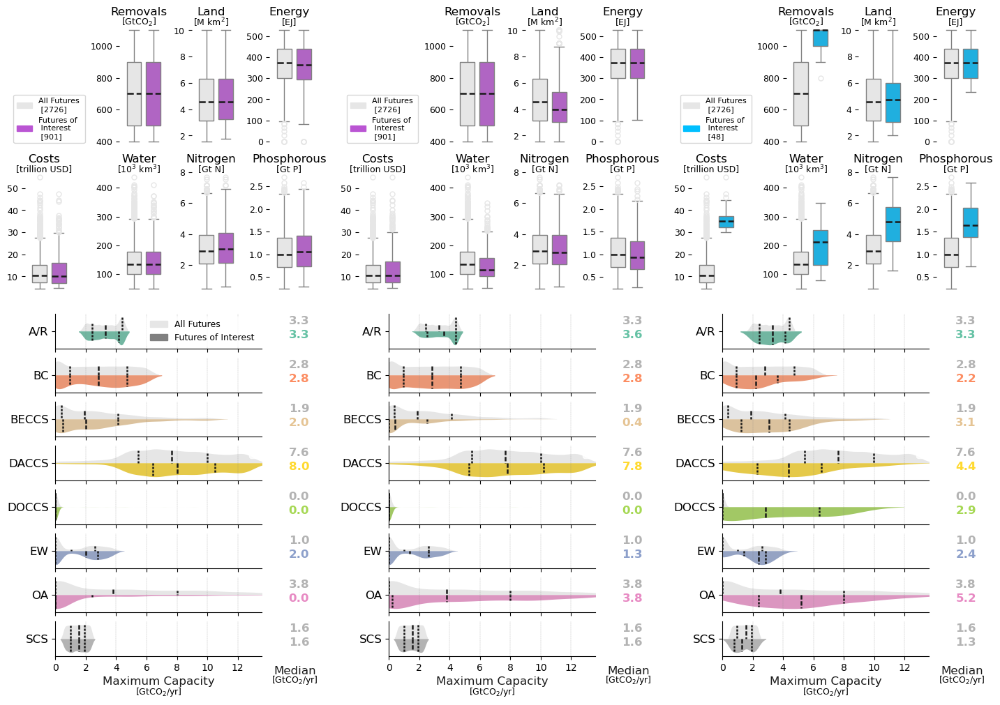

In [620]:
# ==================================================================================================
# DIFFERENT COLORS & SHARED LEGEND
# ==================================================================================================

# ============================================ Input ===============================================
#parameters = {'LandL':[1,0.25], 'EnergyL':[0.75,1], 'Removals':[0.75,1]} # Only admits 3 items
parameters = {'ER_OA':[1,0.25], 'ER_BECCS':[1,0.25], 'Costs':[0.5,1]} # Only admits 3 items

color_plots_metrics = {'LandL':'mediumseagreen', 'EnergyL':'orange', 'Removals':'khaki', 'Costs':'deepskyblue', 
               'ER_OA':'mediumorchid', 'ER_BECCS':'mediumorchid'}

# ====================================== For plotting purposes ======================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}

fig = plt.figure(layout='constrained', figsize= (14.1,10)) #(13.6, 7.8)
subfigs = fig.subfigures(2, 3, wspace=0.05, hspace=0.04, width_ratios=[1,1,1], height_ratios=[3,4])

legend_y = 1.08
subfig_title = legend_y+0.01

# ==================================================================================================
metrics_of_interest = {}
index_parameter = 0

for parameter in list(parameters.keys()): 
    metrics_of_interest = extract_range(all_metrics_ranges,metric_interest=parameter,minimum=parameters[parameter][0],maximum=parameters[parameter][1])
    color_plots = color_plots_metrics[parameter]
    
    # ================================== Identifying Futures of Interest ==================================
    list_of_futures = []
    remaining_futures = aggregated_results.copy()
    for metric in metrics_of_interest:
        if len(metrics_of_interest)==1:
            title_plot = ["%s from %.1E to %.1E (%s)" %(all_metrics_names[metric], metrics_of_interest[metric][0][0], metrics_of_interest[metric][0][1], all_metrics_units[metric])]
        else:
            title_plot = [list(metrics_of_interest.keys())]

        for futureID in remaining_futures.index:
            value = remaining_futures.loc[futureID, metric]
            if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
                list_of_futures += [futureID]
            else:
                remaining_futures = remaining_futures.drop(futureID)
    list_of_futures_in = remaining_futures.index.to_list()
    list_of_futures_out = list(set(aggregated_results.index.to_list()) - set(list_of_futures_in)) # List of futures that are outside ranges specified in "metrics_of_interest"

    # ================================== Plotting Violins ==================================
    #subfigs[0].suptitle('Violin Plots of Maximum deployed capacity per CDR Option', fontsize=11, y = subfig_title)
    axsLeft = subfigs[1,index_parameter].subplots(8, 2, width_ratios=[13,1],sharex='col')

    c=0
    metric = max_capacity
    if metric is max_capacity:
        interest = "Capacity"
        x_lim = max_capacity.max().max()
    else:
        interest = "Cumulative Experience"
        x_lim = max_experience.max(axis=1).max()

    df = pd.DataFrame(metric.stack())
    df = df.rename(columns={0:"Maximum %s (GtCO2/yr)" %interest})
    df["Maximum %s (GtCO2/yr)" %interest] = df["Maximum %s (GtCO2/yr)" %interest].mul(1e-9)
    df = df.reset_index()

    # Delete futures that are out of the ranges of interest
    df_new = df.copy()
    for futureID in list_of_futures_out:
        df_new = df_new[df_new.future_id != futureID]

    df_new["class"] = 'futures of interest'
    df["class"] = 'all futures'
    df_plot = pd.concat([df, df_new])
    df_plot = df_plot.rename(columns={"level_1":"CDR_opt"})

    r = 0
    #axsLeft[r,1].set_title('Median \n (GtCO$_2$/yr)', fontsize = 10, loc='center')

    for CDR in ['A/R', 'BC', 'BECCS', 'DACCS', 'DOCCS','EW','OA','SCS']:
        plot = df_plot[df_plot.CDR_opt == CDR] 
        median_all = df_plot.loc[(df_plot['class']=='all futures') & (df_plot['CDR_opt']==CDR)]['Maximum Capacity (GtCO2/yr)'].median()
        median_interest = df_plot.loc[(df_plot['class']=='futures of interest') & (df_plot['CDR_opt']==CDR)]['Maximum Capacity (GtCO2/yr)'].median()
        axsLeft[r,1].annotate('%.1f' %median_all, xy=(0.5,0.7), xytext=(0.1,0.7), color = (0.7,0.7,0.7,1), annotation_clip=False, fontsize=12, weight='bold')
        axsLeft[r,1].annotate('%.1f' %median_interest, xy=(0.5,0.3), xytext=(0.1,0.3), color = color_dict[CDR], annotation_clip=False, fontsize=12, weight='bold')
        axsLeft[r,1].spines[['right', 'top','left','bottom']].set_visible(False)
        axsLeft[r,1].set_xticks([])
        axsLeft[r,1].set_yticks([])
        axsLeft[r,1].set_ylabel(ylabel = "")
        axsLeft[r,1].set_xlabel(xlabel = "")

        sns.violinplot(data=plot, y = "CDR_opt", x="Maximum %s (GtCO2/yr)" %(interest), hue="class", split = True, palette={'futures of interest': color_dict[CDR], 'all futures':(0.9,0.9,0.9,0.5)}, linewidth=0,
                       ax = axsLeft[r,0], density_norm='count', legend = True, inner="quart", inner_kws={"color": "k", "linewidth": 1.8})
        #violin.set_yticklabels(violin.get_yticks(), size = 14)
        axsLeft[r,0].yaxis.set_tick_params(labelsize = 12)
        axsLeft[r,0].set_xlim(0,x_lim*1e-9)
        axsLeft[r,0].set_ylabel(ylabel = "")
        axsLeft[r,0].set_xlabel(xlabel = "")
        axsLeft[r,0].xaxis.grid(color='grey', linestyle='--', linewidth=0.2, zorder=1)
        axsLeft[r,0].legend(labels="", edgecolor='white',facecolor='white')
        axsLeft[r,0].spines[['right', 'top']].set_visible(False)

        if r == 7:
            axsLeft[r,0].set_xlabel(xlabel = "Maximum %s" %(interest), fontsize = 12, color = 'k')
            axsLeft[r,0].text(x=0.5, y=-1.04, s='[GtCO$_2$/yr]', horizontalalignment='center', verticalalignment='center', transform=axsLeft[r,0].transAxes, fontsize = 9)
            
            axsLeft[r,1].set_xlabel(xlabel = 'Median', fontsize = 12, color = 'k', labelpad = 10)
            axsLeft[r,1].text(x=0.5, y=-0.7, s='[GtCO$_2$/yr]', horizontalalignment='center', verticalalignment='center', transform=axsLeft[r,1].transAxes, fontsize = 9)

            #handles, labels = axsLeft[r,0].get_legend_handles_labels()
        r += 1

    if index_parameter ==0:
        axsLeft[0,0].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),
                               mpatches.Patch(color=(0.5,0.5,0.5,1), label='Futures of Interest')],
                      fontsize = 9, loc='upper left', bbox_to_anchor=(0.42,1.05), ncol=1, facecolor='white', edgecolor='white')    

        '''axsLeft[1,0].legend(handles=[#mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures [%d]' %solved),
                               #mpatches.Patch(color=(0.5,0.5,0.5,1), label='Futures of Interest [%d]' %len(list_of_futures_in)),
                               mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.4),
                               mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1)],
                            fontsize =10, loc='upper left', bbox_to_anchor=(0.55,1), ncol=1, facecolor='white', edgecolor='white')'''

    print(len(list_of_futures_in), 'Futures meet the selected citeria (incl. NaN futures)')

    # ================================== Plotting Boxplots ==================================
    #subfigs[0,index_parameter].suptitle(all_metrics_names[parameter], fontsize=11)
    n_rows = 2
    n_cols = 4
    axsRight = subfigs[0,index_parameter].subplots(n_rows, n_cols)

    table_plotting = aggregated_results[['Removals','Land','Energy','Costs','Water','Nitrogen','Phosphorous']].copy()
    table_plotting = table_plotting[table_plotting['Removals'] != 0] # Need to drop futures that were not solved
    metrics = table_plotting.columns.to_list()

    conversion = {'Removals':1e9,'Land':1e8,'Energy':1e9,'Costs':1e12,'Water':1e3,'Nitrogen':1e3,'Phosphorous':1e3}
    units_conver = {'Removals':'GtCO$_2$','Land':'M km$^2$','Energy':'EJ','Costs':'trillion USD','Water':'10$^3$ km$^3$','Nitrogen':'Gt N','Phosphorous':'Gt P'}
    for column in table_plotting.columns:
        table_plotting[column] = table_plotting[column].div(conversion[column])

    # Delete futures that are out of the ranges of interest
    df_new = table_plotting.copy()
    for futureID in list_of_futures_out:
        df_new = df_new[df_new.index != futureID]

    df_new["class"] = 'futures of interest'
    table_plotting["class"] = 'all futures'
    df_plot = pd.concat([table_plotting, df_new])

    N_off = (0,0) # If (1,3) --> c = 0; if (0,0) --> c = 1; 
    axsRight[N_off].spines[['right', 'top','left','bottom']].set_visible(False)
    axsRight[N_off].set_xticks([])
    axsRight[N_off].set_yticks([])
    axsRight[N_off].set_xlim(0,1)
    axsRight[N_off].set_ylim(0,1)
    #axsRight[N_off].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures [%d]' %solved), mpatches.Patch(color=color_plots, label='Futures of Interest [%d]' %len(list_of_futures_in))], 
                         #fontsize = 9, loc='center', bbox_to_anchor=(0.5, 0.9), ncol=1, edgecolor='white',facecolor='white')
    #text = 'Metric evaluated: \n %s \n Number of futures of interest = %d \n (out of %d solved)' %(title_plot[0],len(list_of_futures_in),solved)
    #axsRight[0,0].text(0.5, 1, text, dict(ha='center', va='center', fontsize=10, color='k'), wrap=True)

    r = 0
    c = 1
    for metric in metrics:
        plot = df_plot[[metric, 'class']]
        sns.boxplot(data=plot, y=metric, hue="class", gap=0, ax=axsRight[r,c], legend = False, widths = 0.3, 
                    palette = {'futures of interest':color_plots,'all futures':(0.9,0.9,0.9,0.5)}, 
                    flierprops=dict(marker='o',  markersize=5, linestyle='none', markeredgecolor=(0.9,0.9,0.9,1)), 
                    linecolor=(0.5,0.5,0.5,1), medianprops = dict(linestyle='--', linewidth=1.8, color='k'))

        axsRight[r,c].spines[['right', 'top','left','bottom']].set_visible(False)
        axsRight[r,c].set_xticks([])
        axsRight[r,c].yaxis.set_tick_params(labelsize = 9)
        axsRight[r,c].set_ylabel(ylabel='')
        #axsRight[r,c].set_title('%s \n [%s]' %(metric,units_conver[metric]), loc='center', x=0.4, y=1.03 fontsize = 12)

        axsRight[r,c].set_title('%s' %(metric), loc='center', x=0.4, y=1.03, fontsize = 12)
        axsRight[r,c].text(x=0.4, y=1.02, s="[%s]" %units_conver[metric], horizontalalignment='center', verticalalignment='center', transform=axsRight[r,c].transAxes, size = 9)
        if c == n_cols-1:
            c = 0
            r += 1
        else:
             c += 1
    # ================================== Shared Legend ==================================
    axsRight[N_off].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures \n [%d]' %solved),
                               #mpatches.Patch(color=(0.5,0.5,0.5,1), label='Futures of Interest \n [%d]' %len(list_of_futures_in))], # To use 'All Futures' = grey
                                mpatches.Patch(color=color_plots, label='Futures of \n Interest \n [%d]' %len(list_of_futures_in))], # To use 'All Futures' = color of plots
                                #mpatches.Patch(color='white', label=''), 
                               #mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.4),
                               #mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1)], 
                      fontsize = 8, loc='lower center', ncol=1)#, bbox_to_anchor=(0.25,0.45))

    #axsRight[r, 3].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),mpatches.Patch(color=color_plots, label='Futures of Interest')], fontsize =9, loc='upper center')#, bbox_to_anchor=(0.5,legend_y), ncol=2)

    #subfigs[1].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),mpatches.Patch(color=color_plots, label='Futures of Interest')], fontsize =9, loc='upper center', bbox_to_anchor=(0.5,legend_y+0.02), ncol=2)
    index_parameter += 1
    
plt.show()
plt.close('all') 

In [1050]:
dataframe = max_2100.T.copy()
# This is because the dataframes were defined as: max_time = (Max capacity in indicated time period) - (Initial Capacity Installed) 
for CDR in dataframe.columns:
    dataframe.loc[:,CDR] += Initial_YRef[CDR]
    
# ======================= Summary Statistics =======================
parameters = {'OA_2100':[1,0.25]}

for parameter in list(parameters.keys()): 
    metrics_of_interest = extract_range(all_metrics_ranges,metric_interest=parameter,minimum=parameters[parameter][0],maximum=parameters[parameter][1])
    
    # ================================== Identifying Futures of Interest ==================================
    list_of_futures = []
    remaining_futures = aggregated_results.copy()
    for metric in metrics_of_interest:
        if len(metrics_of_interest)==1:
            title_plot = ["%s from %.1E to %.1E (%s)" %(all_metrics_names[metric], metrics_of_interest[metric][0][0], metrics_of_interest[metric][0][1], all_metrics_units[metric])]
        else:
            title_plot = [list(metrics_of_interest.keys())]

        for futureID in remaining_futures.index:
            value = remaining_futures.loc[futureID, metric]
            if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
                list_of_futures += [futureID]
            else:
                remaining_futures = remaining_futures.drop(futureID)
    list_of_futures_in = remaining_futures.index.to_list()
    list_of_futures_out = list(set(aggregated_results.index.to_list()) - set(list_of_futures_in)) # List of futures that are outside ranges specified in "metrics_of_interest"

    for futureID in list_of_futures_out: dataframe = dataframe[dataframe.index != futureID]

summary_scenario = dataframe.div(1e9).describe(include = 'all')
summary_scenario.loc['median'] = dataframe.div(1e9).median()
summary_scenario.loc['IQR'] = summary_scenario.loc['75%']-summary_scenario.loc['25%']

#Normalising the IQR based on largest value
summary_scenario.loc['IQR_norm'] = summary_scenario.loc['IQR'].div(summary.loc['IQR'].max()) # Note that we are dividing by the general summary
summary_scenario.loc['std_norm'] = summary_scenario.loc['std'].div(summary.loc['std'].max()) # Note that we are dividing by the general summary

#pd.option_context('display.float_format', '{:,.2f}'.format)
print("Summary of results for scenarios based on parameters %s" %parameters.keys())                  
summary_scenario

Summary of results for scenarios based on parameters dict_keys(['OA_2100'])


,BECCS,A/R,SCS,BC,DACCS,EW,OA,DOCCS
count,"1,328.00","1,328.00","1,328.00","1,328.00","1,328.00","1,328.00","1,328.00","1,328.00"
mean,2.57,3.35,1.48,2.49,8.54,1.24,0.69,0.06
std,2.67,0.87,0.55,2.06,2.62,1.40,0.98,0.60
min,0.00,1.98,0.60,0.00,0.00,0.00,0.00,0.00
25%,0.13,2.43,0.98,0.30,6.50,0.00,0.00,0.00
50%,1.89,3.29,1.55,2.19,8.60,0.00,0.00,0.00
75%,4.17,4.30,1.93,4.08,10.66,2.60,1.00,0.00
max,10.00,4.40,2.31,5.97,12.50,3.80,3.38,8.20
median,1.89,3.29,1.55,2.19,8.60,0.00,0.00,0.00
IQR,4.05,1.87,0.95,3.78,4.16,2.60,1.00,0.00


## Scatter plots of Key metrics

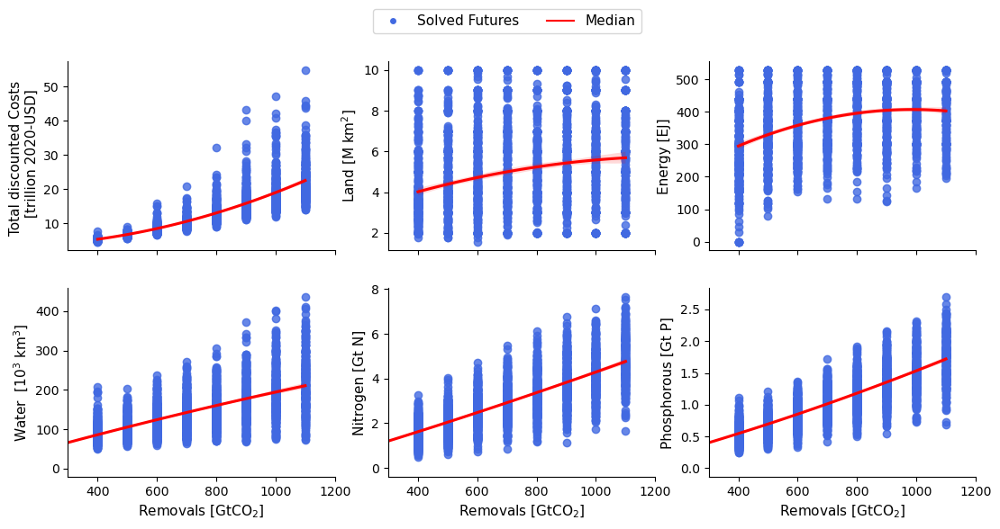

In [75]:
# https://seaborn.pydata.org/generated/seaborn.regplot.html
cmap=plt.get_cmap('Set2')

scatter = pd.concat([total_future,max_resources], axis=1)

conversion = {'Removals':1e9,'Land':1e8,'Energy':1e9,'Costs':1e12,'Water':1e3,'Nitrogen':1e3,'Phosphorous':1e3}
units_conver = {'Removals':'GtCO$_2$','Land':'M km$^2$','Energy':'EJ','Costs':'trillion USD','Water':'10$^3$ km$^3$','Nitrogen':'Gt N','Phosphorous':'Gt P'}
for column in scatter.columns:
    scatter[column] = scatter[column].div(conversion[column])
    
att = list(scatter.columns)#.remove('Removals') # Save name of columns to plot in the y axis
att.remove('Removals') # Remove "Removals" as this will be the x axis
scatter = pd.concat([scatter, max_capacity], axis=1) # Add max_capacity to identify which CDR is "dominant"
y_axes_names = {"Costs":"Total discounted Costs \n [trillion 2020-USD]", "Land":"Land [M km$^2$]", "Energy":"Energy [EJ]", "Water":"Water  [10$^3$ km$^3$]", "Nitrogen":"Nitrogen [Gt N]", "Phosphorous":"Phosphorous [Gt P]"}

# Saving color code for tech with most capacity deployed per future
eh = max_capacity.idxmax(axis=1) # For each future_id, save the CDR option with max capacity
col = []
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5), np.nan:(0, 0, 0, 1)}
for futureID,rows in scatter.iterrows():
    scatter.loc[futureID,'Largest'] = eh[futureID]
    col += [color_dict[eh[futureID]]]
scatter['Color'] = col

n_rows = 2
n_cols = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(13, 6),sharex=True)
#fig.tight_layout()
#plt.suptitle("Scatter plots with color referring to most deployed CDR option", size = 10, y = 1.05)

r = 0
c = 0
for column_name in att:
    #scatter.plot.scatter(ax=axes[r,c], x='Removals',y=column_name,color=scatter.Color)
    sns.regplot(ax=axes[r,c], data=scatter, x="Removals", y=column_name, order = 2, ci=99, color = 'royalblue', line_kws=dict(color="r"))
    axes[r,c].set_ylabel(ylabel=y_axes_names[column_name], fontsize = 11)
    if r == 0:
        axes[r,c].set_xlabel(xlabel = "")
    else:
        axes[r,c].set_xlabel(xlabel = "Removals [GtCO$_2$]", fontsize = 11)
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        #axes[row,col].get_xaxis().set_ticks([])
        #axes[row,col].ticklabel_format(axis='y', style='sci',scilimits=(3,5))
        #axes[row,col].ticklabel_format(axis='x', style='sci',scilimits=(9,10))
        #axes[row,col].xaxis.set_major_formatter(ticker.FormatStrFormatter("%d"))
        axes[row,col].spines[['right', 'top']].set_visible(False)
        axes[row,col].set_xlim(300, 1200)
        
        #axes[row,col].set_axisbelow(True)
        #axes[row,col].yaxis.grid(color='gray', linestyle='dashed')

fig.legend(handles=[mlines.Line2D([], [], color='white', marker='o', markerfacecolor = 'royalblue', label='Solved Futures'), mlines.Line2D([], [], color='r', label='Median')], fontsize = 11, loc='upper center', bbox_to_anchor=(0.5, 0.99),ncol=2)
#plt.savefig('Figures_Results/Scatters_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")      
plt.show()
plt.close('all')


## Key Results (no plotting)

### Average number of options for large removals

Code outputs the largest number of options for futures with >= 900 GtCO2 of NE required.

It needs two dataframes: "max_2100" & "total_future"

In [138]:
number_of_options_2100 = pd.DataFrame(max_2100.fillna(0).astype(bool).sum(axis=0)) #NaN are considered as 0
number_of_options_2100.index.names = ['future_id']
number_of_options_2100 = number_of_options_2100.rename(columns={0:"Max_options"})

for futureID in number_of_options_2100.index:
    number_of_options_2100.loc[futureID,"Removals"] = total_future.loc[futureID, "Removals"]*1e-9
number_of_options_2100 = number_of_options_2100.sort_values(by=['Removals'],ascending=False)

number_of_options_2100[number_of_options_2100.Removals >= 900]["Max_options"].mean()

6.779881656804734

### DOCCS deployment

In [120]:
max_capacity.dropna().sort_values(by=['DOCCS'],ascending = False)

print('DOCCS capacity above 1GtCO2 %d times' %aggregated_results[max_capacity['DOCCS']>=1e9].count()['DOCCS'])
print('Out of which %d (or %d percent) are in futures where removals are above 925 GtCO2 (or > 75 percent)' %(aggregated_results[max_capacity['DOCCS']>=1e9]['Removals'][aggregated_results['Removals'].div(1e9)>=925].count(), 
                                                                                       100*aggregated_results[max_capacity['DOCCS']>=1e9]['Removals'][aggregated_results['Removals'].div(1e9)>=925].count()/aggregated_results[max_capacity['DOCCS']>=1e9].count()['DOCCS']))

# aggregated_results[max_capacity['DOCCS']>=1e9]['Removals'][aggregated_results['Removals'].div(1e9)>=925].count() #Count of futures where DOCCS > 1GtCO2 and Removals > 925

DOCCS capacity above 1GtCO2 51 times
Out of which 34 (or 66 percent) are in futures where removals are above 925 GtCO2 (or > 75 percent)


In [121]:
mid_costs =  0.5*(all_metrics_ranges['Costs'][0][1]-all_metrics_ranges['Costs'][0][0]) + all_metrics_ranges['Costs'][0][0]
print('DOCCS capacity above 1GtCO2 %d times' %aggregated_results[max_capacity['DOCCS']>=1e9].count()['DOCCS'])
print('Out of which %d futures are >50 percent of costs' %aggregated_results[(aggregated_results['DOCCS']>=1e9)&(aggregated_results['Costs']>=mid_costs)]['DOCCS'].count())

DOCCS capacity above 1GtCO2 51 times
Out of which 32 futures are >50 percent of costs


## Percentage of futures in which an option is deployed

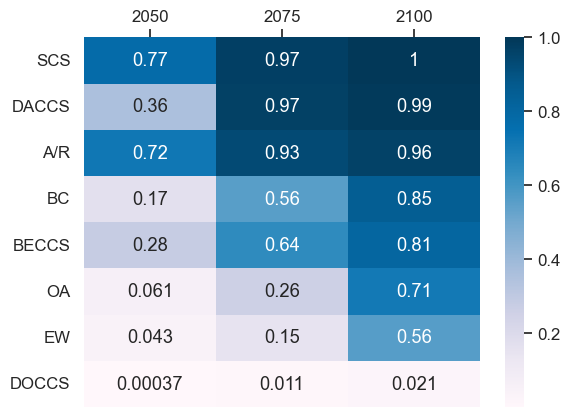

In [669]:
percentage_in = pd.DataFrame()
for CDR in i:
    try: 
        percentage_in.loc[CDR,2050] = 1-max_2050.loc[CDR].value_counts(normalize=True)[0] # This gives the normalised count of 0s, ignoring the NaN
    except:
        percentage_in.loc[CDR,2050] = 1 # "except" is required as there might be no 0s
    try: 
        percentage_in.loc[CDR,2075] = 1-max_2075.loc[CDR].value_counts(normalize=True)[0] # This gives the normalised count of 0s, ignoring the NaN
    except:
        percentage_in.loc[CDR,2075] = 1
    try: 
        percentage_in.loc[CDR,2100] = 1-max_2100.loc[CDR].value_counts(normalize=True)[0] # This gives the normalised count of 0s, ignoring the NaN
    except:
        percentage_in.loc[CDR,2100] = 1

percentage_in = percentage_in.sort_values(by=[2100], ascending=False)
sns.set(font_scale=1.1)
dataplot = sns.heatmap(percentage_in, cmap=plt.get_cmap('PuBu'), annot=True,) # colourmap: https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html
#dataplot.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 15)
dataplot.xaxis.tick_top()

#plt.suptitle("Percentage of futures in which an option is deployed", size = 10, y = 0.95)
#plt.savefig('Figures_Results/Percentages_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

plt.show()

## Analysis with EMA Workbench

Key Resources for Exploratory Modelling Analysis (EMA):
- [Modules in Exploratory modeling framework documentation](https://emaworkbench.readthedocs.io/en/latest/api_index.html)
- [EMA Workbench tutorial](https://emaworkbench.readthedocs.io/en/latest/basic_tutorial.html) 
- Documentation on [ipyparallel](https://ipyparallel.readthedocs.io/en/latest/)
- [Kwakkel (2017)](https://www.sciencedirect.com/science/article/pii/S1364815217301251) article describing EMA Workbench

In [355]:
# List of model outputs that could be of interest for the analysis
list(aggregated_results.columns)

['Energy_DACCS',
 'Energy_DOCCS',
 'Energy_EW',
 'Energy_OA',
 'EnergyL',
 'Land_AR',
 'Land_BECCS',
 'Land_DACCS',
 'LandL',
 'LR_AR',
 'LR_BC',
 'LR_BECCS',
 'LR_DACCS',
 'LR_DOCCS',
 'LR_EW',
 'LR_OA',
 'LR_SCS',
 'NERequired',
 'Ymax_AR',
 'Ymax_BC',
 'Ymax_BECCS',
 'Ymax_DACCS',
 'Ymax_DOCCS',
 'Ymax_EW',
 'Ymax_OA',
 'Ymax_SCS',
 'Solved',
 'Removals',
 'Costs',
 'AR',
 'BC',
 'BECCS',
 'DACCS',
 'DOCCS',
 'EW',
 'OA',
 'SCS',
 'Land',
 'Energy',
 'Water',
 'Nitrogen',
 'Phosphorous']

### Feature Scoring

Feature scoring is a methodology for identifying what model inputs (in machine learning terminology, “features”) have the greatest relationship to the outputs. The relationship is not necessarily linear, but rather can be any arbitrary linear or non-linear relationship ([source](https://tmip-emat.github.io/source/emat.analysis/feature-scoring.html#:~:text=Feature%20scoring%20is%20a%20methodology,linear%20or%20non%2Dlinear%20relationship.)).

Various feature scoring techniques are included in the scikit–learn library ([Pedregosa et al., 2011](https://www.jmlr.org/papers/volume12/pedregosa11a/pedregosa11a.pdf?ref=https:/)). The workbench provides a convenient function that wraps some of the scikit-learn feature scoring techniques. 

To perform feature scoring on one of the outcomes of interes, we first need to preprocess the experiment array.

#### Feature Scoring on whether a future is solved or not

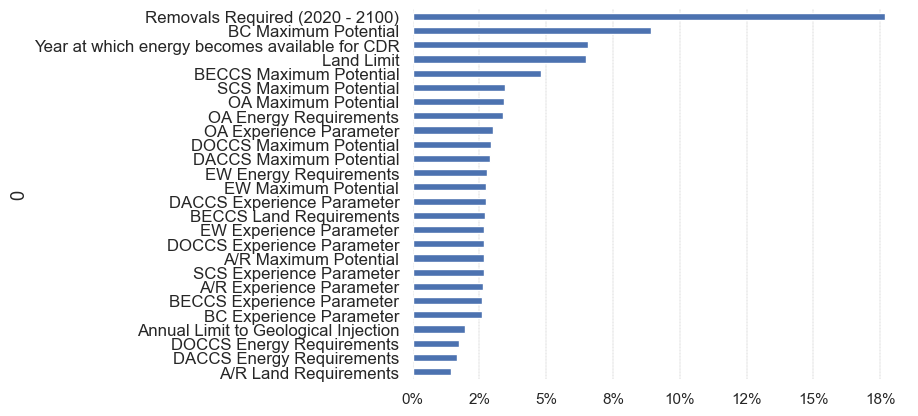

In [141]:
from ema_workbench.analysis import feature_scoring
from ema_workbench.analysis.feature_scoring import RuleInductionType

x = df_LHS.T.copy()
#x = x[x.columns.drop(list(x.filter(regex='ER')))] # Remove non-relevant uncertainties that could only randomly explain the outcome

y = aggregated_results['Solved']#==0 # If '==0' is added, this would convert the list from finary to True/false = equivalent!

fs, _ = feature_scoring.get_rf_feature_scores(x,y,mode=RuleInductionType.REGRESSION)

n_to_plot = 26

cmap=plt.get_cmap('PuBu')
example = dict.fromkeys(fs.head(n_to_plot).index.tolist(),2)
r = 0
for keys in example.keys():
    example.update({keys:cmap(r)})
    r += 1

    fs[1] = fs[1].div(0.01)
fs = fs.rename(index=Uncertainties)
fs = fs.sort_values(by=[1], ascending=True)

'''The parameter first from the fs list is by far the most important factor affecting the terminal value of the outcome. 
This result is only applicable for a single outcome of interest. It might be convenient to have some insight into the 
sensitivity of each of the four outcomes of interest to the various uncertainties as well as the policy.'''
ax = fs.head(n_to_plot).plot.barh(legend=False)
ax.set_facecolor("white")
ax.grid(False)
ax.spines[['right', 'top','bottom','left']].set_visible(False)
ax.xaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
ax.tick_params(axis='x', labelsize = 11)
ax.xaxis.grid(color='grey', linestyle='--', linewidth=0.2, zorder=1)
#plt.savefig('Figures_Results/Features_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

#sns.heatmap(fs.head(5), annot=True,cmap='PuBu')
plt.show()
plt.close('all')
#fs

#### Feature Scoring on outliers

number of outliers: 64
max outlier value: 53865010759635.76
min outlier value: 27928893798669.027


C:\Users\rodq\AppData\Local\anaconda3\lib\site-packages\ema_workbench\analysis\feature_scoring.py:226: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest.fit(x, y)


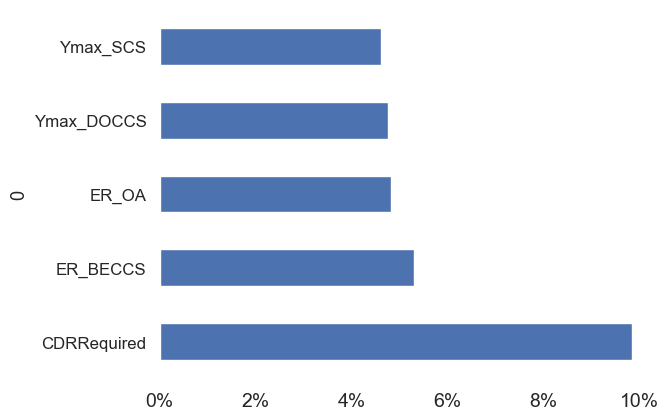

In [43]:
metric_of_interest = "Costs"

scatter = pd.concat([total_future,max_resources], axis=1)
scatter = scatter[scatter['Removals'] != 0] # Need to drop futures that were not solved

outliers = find_outliers_IQR(scatter[metric_of_interest])
print("number of outliers: "+ str(len(outliers)))
print("max outlier value: "+ str(outliers.max()))
print("min outlier value: "+ str(outliers.min()))

y = pd.DataFrame({'Outlier_%s' %metric_of_interest: [0]*aggregated_results.index.size},index = aggregated_results.index.tolist())

for out in outliers.index:
    y.loc[out,'Outlier_%s' %metric_of_interest] = 1

x = df_LHS.T
#x = x[x.columns.drop(list(x.filter(regex='ER')))] # Remove non-relevant uncertainties that could only randomly explain the outcome

#y = aggregated_results['Solved']#==0 # If '==0' is added, this would convert the list from binary to True/false = equivalent!

fs, _ = feature_scoring.get_rf_feature_scores(x,y,mode=RuleInductionType.REGRESSION)

fs[1] = fs[1].div(0.01)

'''The parameter first from the fs list is by far the most important factor affecting the terminal value of the outcome. 
This result is only applicable for a single outcome of interest. It might be convenient to have some insight into the 
sensitivity of each of the four outcomes of interest to the various uncertainties as well as the policy.'''

ax = fs.head(5).plot.barh(legend=False)
ax.set_facecolor("white")
ax.grid(False)
ax.spines[['right', 'top','bottom','left']].set_visible(False)
ax.xaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
ax.tick_params(axis='x', labelsize = 14)
plt.savefig('Figures_Results/Features_outliers_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

#sns.heatmap(fs.head(5), annot=True,cmap='PuBu')
plt.show()
plt.close('all')

#### Feature Scoring on a single outcome metric

This one is different than before as "NaN" data for the futures that were not solved needs to be dropped. 

In [44]:
from ema_workbench.analysis import feature_scoring
from ema_workbench.analysis.feature_scoring import RuleInductionType

x = df_LHS.T
#x = x[x.columns.drop(list(x.filter(regex='ER')))] # Remove non-relevant uncertainties that could only randomly explain the outcome

y = aggregated_results['Land']

x = x.drop([n for n in y.loc[pd.isna(y)].index]) # Drop futures that were not solved
y = y.dropna() # Drop futures that were not solved

fs, _ = feature_scoring.get_rf_feature_scores(x,y,mode=RuleInductionType.REGRESSION)

'''The parameter first from the fs list is by far the most important factor affecting the terminal value of the outcome. 
This result is only applicable for a single outcome of interest. It might be convenient to have some insight into the 
sensitivity of each of the four outcomes of interest to the various uncertainties as well as the policy.'''

fs

,1
0,
LandL,0.421940
Ymax_BECCS,0.079109
ER_BECCS,0.065307
CDRRequired,0.060038
Land_BECCS,0.054219
Ymax_AR,0.028349
Ymax_BC,0.018118
Ymax_SCS,0.017708
ER_OA,0.017449


#### Feature Scoring on Drivers of (large) Adoption for CDR option i

C:\Users\rodq\AppData\Local\anaconda3\lib\site-packages\ema_workbench\analysis\feature_scoring.py:226: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest.fit(x, y)


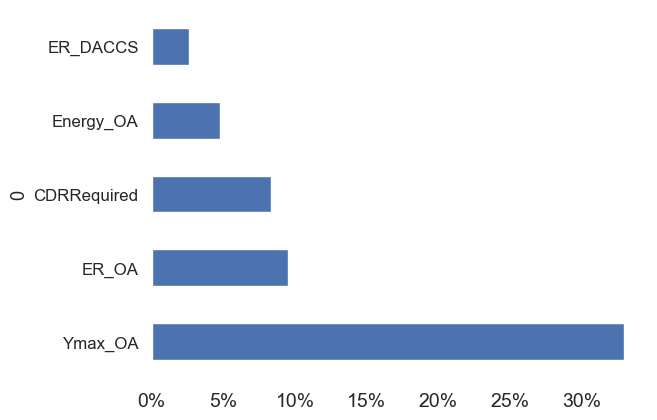

,1
0,
Ymax_OA,32.975178
ER_OA,9.519416
CDRRequired,8.330510
Energy_OA,4.725797
ER_DACCS,2.576395
Ymax_BC,2.455751
ER_BECCS,2.440962
Ymax_DACCS,2.435923
ER_BC,2.344010


In [45]:
from ema_workbench.analysis import feature_scoring
from ema_workbench.analysis.feature_scoring import RuleInductionType

x = df_LHS.T

metric_of_interest = "OA"
mid_value = 0.5*(max_capacity[metric_of_interest].max() + max_capacity[metric_of_interest].min())

y = pd.DataFrame()
for futureID in max_capacity.index:
    if max_capacity.loc[futureID,metric_of_interest] >= mid_value:
        y.loc[futureID,'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)] = 1
    else:
        y.loc[futureID,'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)] = 0

fs, _ = feature_scoring.get_rf_feature_scores(x,y,mode=RuleInductionType.REGRESSION)
fs[1] = fs[1].div(0.01)

ax = fs.head(5).plot.barh(legend=False)
ax.set_facecolor("white")
ax.grid(False)
ax.spines[['right', 'top','bottom','left']].set_visible(False)
ax.xaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
ax.tick_params(axis='x', labelsize = 14)
plt.savefig('Figures_Results/Features_outliers_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')
fs

#### General Feature Scoring: Max capacity

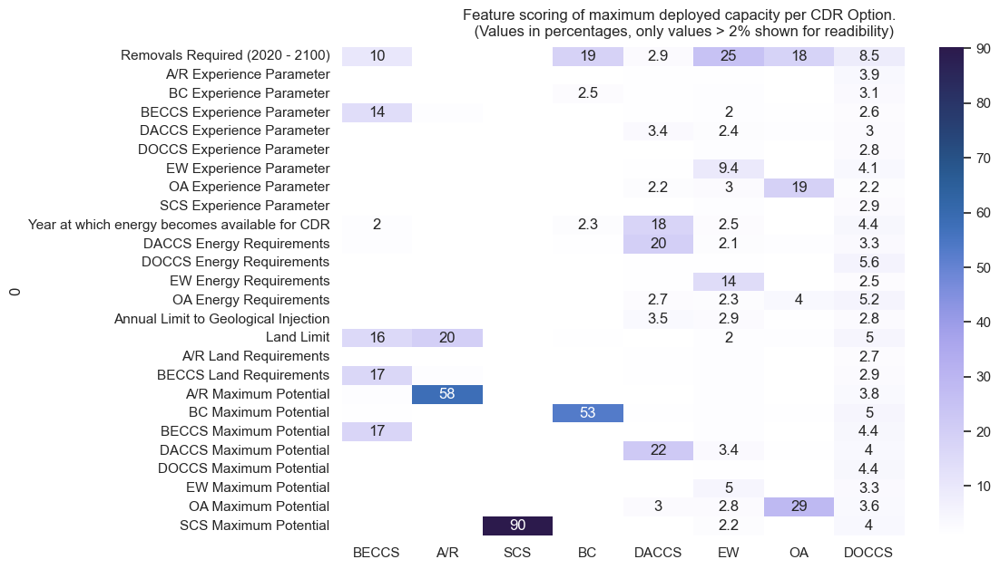

In [12]:
from ema_workbench.analysis import feature_scoring
import seaborn as sns
from cmcrameri import cm # https://www.fabiocrameri.ch/ws/media-library/ce2eb6eee7c345f999e61c02e2733962/readme_scientificcolourmaps.pdf

x = df_LHS.T
y = max_capacity.copy()

x = x.drop([n for n in y.loc[pd.isna(y['A/R'])].index]) # Drop futures that were not solved
y = y.dropna() # Drop futures that were not solved

fs_all = feature_scoring.get_feature_scores_all(x,y)
fs_all = fs_all.rename(index=Uncertainties)
fs_all = fs_all.div(0.01)

sns.set(font_scale=1)
plt.subplots(figsize=(10,7))
plt.suptitle('Feature scoring of maximum deployed capacity per CDR Option. \n (Values in percentages, only values > 2% shown for readibility)', size=12, y=0.94)
#dataplot = sns.heatmap(fs_all, annot=True,cmap=plt.get_cmap('PuBu'), vmin=0) # #cm.batlowW_r: Add '"_r" to cmap to reverse it https://stackoverflow.com/questions/3279560/reverse-colormap-in-matplotlib
dataplot = sns.heatmap(fs_all, annot=True,cmap=cm.devon_r, vmin=1) # cm.batlowW_r: Add '"_r" to cmap to reverse it https://stackoverflow.com/questions/3279560/reverse-colormap-in-matplotlib

for t in dataplot.texts: # How to annotate only valuea greater than x: https://stackoverflow.com/questions/66099438/how-to-annot-only-values-greater-than-x-on-a-seaborn-heatmap
    if float(t.get_text())>=2:
        t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
    else:
        t.set_text(" ")

#plt.savefig('Figures_Results/Features_Drivers_allCDR_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()
plt.close('all')
#fs_all

#### Feature Scoring: Max capacity vs Max capacity

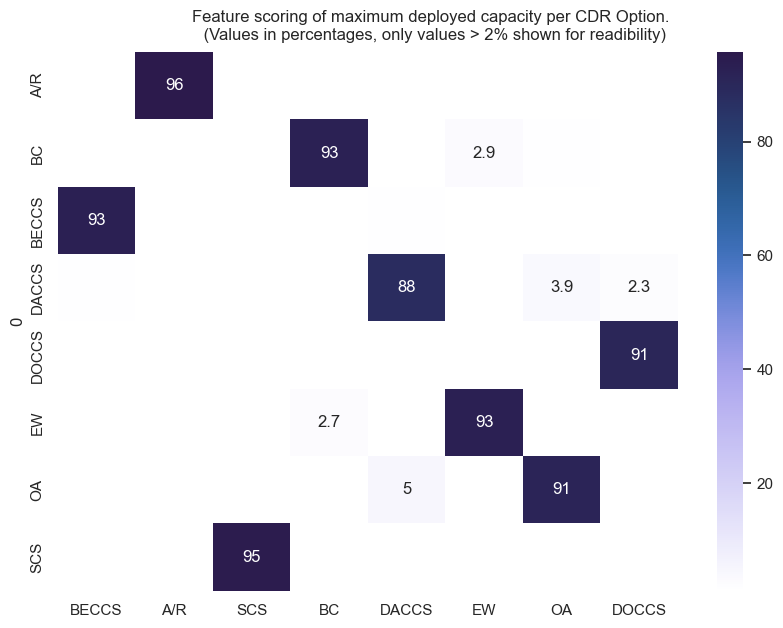

In [237]:
from ema_workbench.analysis import feature_scoring
import seaborn as sns
from cmcrameri import cm # https://www.fabiocrameri.ch/ws/media-library/ce2eb6eee7c345f999e61c02e2733962/readme_scientificcolourmaps.pdf

#x = df_LHS.T
x = max_capacity.copy()
y = max_capacity.copy()

#x = x.drop([n for n in y.loc[pd.isna(y['A/R'])].index]) # Drop futures that were not solved
x = x.dropna()
y = y.dropna() # Drop futures that were not solved

fs_all = feature_scoring.get_feature_scores_all(x,y)
fs_all = fs_all.rename(index=Uncertainties)
fs_all = fs_all.div(0.01)

sns.set(font_scale=1)
plt.subplots(figsize=(10,7))
plt.suptitle('Feature scoring of maximum deployed capacity per CDR Option. \n (Values in percentages, only values > 2% shown for readibility)', size=12, y=0.94)
#dataplot = sns.heatmap(fs_all, annot=True,cmap=plt.get_cmap('PuBu'), vmin=0) # #cm.batlowW_r: Add '"_r" to cmap to reverse it https://stackoverflow.com/questions/3279560/reverse-colormap-in-matplotlib
dataplot = sns.heatmap(fs_all, annot=True,cmap=cm.devon_r, vmin=1) # cm.batlowW_r: Add '"_r" to cmap to reverse it https://stackoverflow.com/questions/3279560/reverse-colormap-in-matplotlib

for t in dataplot.texts: # How to annotate only valuea greater than x: https://stackoverflow.com/questions/66099438/how-to-annot-only-values-greater-than-x-on-a-seaborn-heatmap
    if float(t.get_text())>=2:
        t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
    else:
        t.set_text(" ")

#plt.savefig('Figures_Results/Features_Drivers_allCDR_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()
plt.close('all')
#fs_all

#### General Feature Scoring: Relevant metrics (Removals & Costs & Resources)

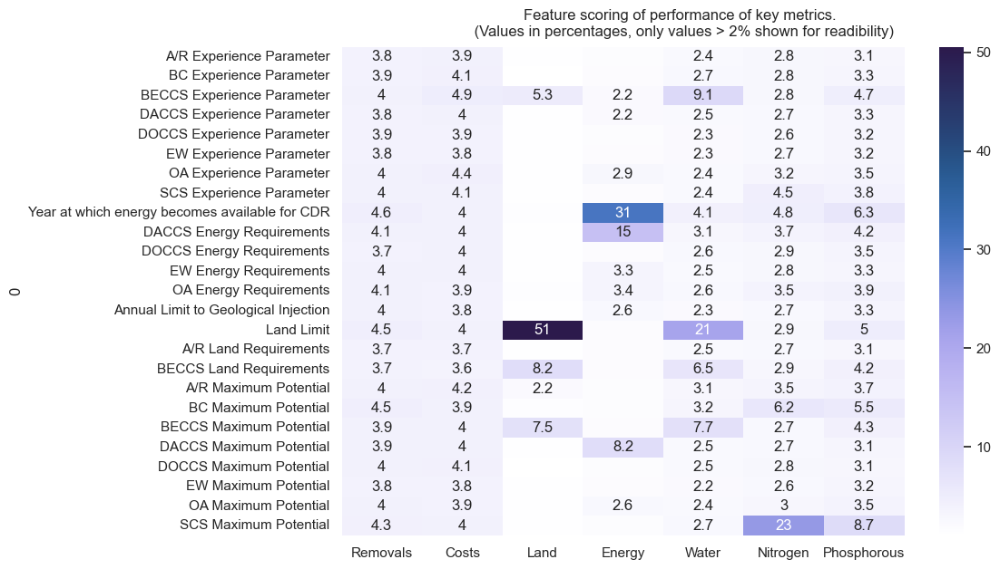

In [672]:
from ema_workbench.analysis import feature_scoring
import seaborn as sns
from cmcrameri import cm # https://www.fabiocrameri.ch/ws/media-library/ce2eb6eee7c345f999e61c02e2733962/readme_scientificcolourmaps.pdf

#x = df_LHS.drop(['CDRRequired']).T
x = df_LHS.T
y = pd.concat([total_future, max_resources], axis = 1)

x = x.drop([n for n in y.loc[pd.isna(y['Costs'])].index]) # Drop futures that were not solved
y = y.dropna() # Drop futures that were not solved

fs_all = feature_scoring.get_feature_scores_all(x,y)
fs_all = fs_all.rename(index=Uncertainties)
fs_all = fs_all.div(0.01)

sns.set(font_scale=1)
plt.subplots(figsize=(10,7))
plt.suptitle('Feature scoring of performance of key metrics. \n (Values in percentages, only values > 2% shown for readibility)', size=12, y=0.94)
#dataplot = sns.heatmap(fs_all, annot=True,cmap=plt.get_cmap('PuBu'), vmin=0) # #cm.batlowW_r: Add '"_r" to cmap to reverse it https://stackoverflow.com/questions/3279560/reverse-colormap-in-matplotlib
dataplot = sns.heatmap(fs_all, annot=True,cmap=cm.devon_r, vmin=1) # cm.batlowW_r: Add '"_r" to cmap to reverse it https://stackoverflow.com/questions/3279560/reverse-colormap-in-matplotlib

for t in dataplot.texts: # How to annotate only valuea greater than x: https://stackoverflow.com/questions/66099438/how-to-annot-only-values-greater-than-x-on-a-seaborn-heatmap
    if float(t.get_text())>=2:
        t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
    else:
        t.set_text(" ")

#plt.savefig('Figures_Results/Features_Drivers_allCDR_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()
plt.close('all')
#fs_all

## Simplified Portfolios by Max Capacity

If a future is deemed feasible by the solver, the optimisation model outputs a CDR portfolio capacity expansion plan at a 5-year increment. This output is highly granular, challenging the exact comparability of portfolio compositions. For this reason, model outputs are here converted into "simplified" porfolios" by grouping capacity of CDR option deployed into 4 bins and 3 different time periods (i.e., 2050, 2075, 2100).

- "bins" defines the ranges for the max capacity level of the simplified portfolios. Index = CDR options, columns = 1,2,3,4 
    - Bin 1: $Y_i^{ini}$
    - Bins 2 & 3: equally spaced
    - Bin 4: $Y^{max}_{i, \ output}$
- "simplified" has a multiindex: future ID, CDR option. Columns = [2050, 2075, 2100].

### Defining Bins

In [34]:
# Creating bins for simplified portfolios: find maximum experience achieved for each CDR across all futures $Z^{max}_{i,output}$
# Initial_YRef: Dictionary with Initial Y ref values

n_bins = 4
Y_max = pd.DataFrame(max_2100.T.max()) # Outputs the largest experience achieved for each CDR option across futures

bins = pd.DataFrame(index=i, columns = list(range(1,n_bins+1)))
for column in bins.columns:
    for CDR in i:
        if column == 1:
            bins.loc[CDR, column] = Initial_YRef[CDR]
        elif column == n_bins:
            bins.loc[CDR, column] = math.ceil(Y_max.loc[CDR,0])
        else:
            bins.loc[CDR, column] = math.ceil((column-1)*(Y_max.loc[CDR,0] - Initial_YRef[CDR])/n_bins)
bins

,1,2,3,4
A/R,1980000000,110000000,220000000,2420000000
BC,500000,1492250000,2984500000,5969500000
BECCS,1820000,2499090000,4998180000,9998180000
DACCS,10000,3124995000,6249990000,12499990000
DOCCS,1,2275000000,4549999999,9099999999
EW,1,950000000,1899999999,3799999999
OA,1,3400000000,6799999999,13599999999
SCS,1,577500000,1154999999,2309999999


### Creating table with simplified portfolios for 3 time periods

Infeasible futures ("NaN") have been dropped.

In [49]:
# Create a table with max capacity per CDR option per future for 3 different time periods

years = dict(zip([2050, 2075, 2100], [6,11,16]))
simplified = pd.DataFrame()

for futureID in range(0,n_lhs+1):
    results_in_f = pd.DataFrame()
    results_in_f.index = pd.MultiIndex.from_tuples([(futureID, i[n]) for n in range(0, len(i))],names=['future_id','CDR_opt'])
    for CDR in i:
        data = max_2050.T.copy()
        for n in [2050, 2075, 2100]:
            if n == 2075: data = max_2075.T.copy()
            if n == 2100: data = max_2100.T.copy()
            
            if np.isnan(data.loc[futureID,CDR]) == True:
                    results_in_f.loc[(futureID,CDR),n] = np.nan
            else:
                bin_n = 1
                found = False
                while found == False:
                    if data.loc[futureID,CDR] <= bins.loc[CDR, bin_n]:
                        found = True
                        results_in_f.loc[(futureID, CDR),n] = bins.loc[CDR, bin_n]
                    else:
                        bin_n += 1

    simplified = pd.concat([simplified,results_in_f])

simplified = simplified.dropna(axis=0, how="all")
simplified

2050          2075          2100
future_id CDR_opt                                          
0         A/R      1.980000e+09  1.980000e+09  1.980000e+09
          BC       5.000000e+05  1.492250e+09  1.492250e+09
          BECCS    1.820000e+06  1.820000e+06  2.499090e+09
          DACCS    1.000000e+04  6.249990e+09  6.249990e+09
          DOCCS    1.000000e+00  1.000000e+00  1.000000e+00
...                         ...           ...           ...
3000      DACCS    1.000000e+04  1.249999e+10  1.249999e+10
          DOCCS    1.000000e+00  1.000000e+00  1.000000e+00
          EW       1.000000e+00  1.000000e+00  3.800000e+09
          OA       1.000000e+00  1.000000e+00  6.800000e+09
          SCS      1.155000e+09  1.155000e+09  1.155000e+09

[21808 rows x 3 columns]

### Identifying repeated portfolios

Here the output dataframe "simplified_names" has one row per future, rather than a multi-index as for the "simplified" dataframe. Each case includes a list with the portfolio description as a string. This way, duplicates can easily be identified.

In [99]:
simplified_names = pd.DataFrame()

for futureID, CDR in simplified.groupby(level=0):
    results_in = pd.DataFrame()
    for n in [2050, 2075, 2100]:
        results_in.loc[futureID,n] = str(list(simplified.loc[(futureID),n].to_dict().items()))       
    
    # Add column with cumulative removals per future ID 
    results_in.loc[futureID,'GtCO2'] = aggregated_results.loc[futureID, 'Removals']/(1e9)
    simplified_names = pd.concat([simplified_names,results_in])
    
simplified_names
# The index of 'simplified_names' is the future_ID

,2050,2075,2100,GtCO2
0,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 1980000000.0), ('BC', 1492250000.0), ...","[('A/R', 1980000000.0), ('BC', 1492250000.0), ...",400.0
2,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 1980000000.0), ('BC', 5969500000.0), ...",500.0
3,"[('A/R', 1980000000.0), ('BC', 5969500000.0), ...","[('A/R', 1980000000.0), ('BC', 5969500000.0), ...","[('A/R', 1980000000.0), ('BC', 5969500000.0), ...",1000.0
4,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 2420000000.0), ('BC', 1492250000.0), ...","[('A/R', 2420000000.0), ('BC', 1492250000.0), ...",900.0
5,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 2420000000.0), ('BC', 1492250000.0), ...","[('A/R', 2420000000.0), ('BC', 5969500000.0), ...",700.0
...,...,...,...,...
2996,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 2420000000.0), ('BC', 5969500000.0), ...","[('A/R', 2420000000.0), ('BC', 5969500000.0), ...",1100.0
2997,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 1980000000.0), ('BC', 1492250000.0), ...","[('A/R', 1980000000.0), ('BC', 1492250000.0), ...",800.0
2998,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 1980000000.0), ('BC', 2984500000.0), ...","[('A/R', 1980000000.0), ('BC', 2984500000.0), ...",500.0
2999,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...","[('A/R', 2420000000.0), ('BC', 1492250000.0), ...",800.0


In [100]:
#simple_portfolios_2050 = simplified_names.drop_duplicates(subset=[2050])[[2050]]
#In pandas axis = 0 refers to horizontal axis or rows and axis = 1 refers to vertical axis or columns.

# Creating dataframes for each period:
simple_portfolios_2050 = pd.DataFrame(simplified_names[2050].value_counts())
simple_portfolios_2075 = pd.DataFrame(simplified_names[2075].value_counts())
simple_portfolios_2100 = pd.DataFrame(simplified_names[2100].value_counts())

year = 2050
# For each time period:
for time in [simple_portfolios_2050, simple_portfolios_2075, simple_portfolios_2100]:
    if time is simple_portfolios_2075: year = 2075
    elif time is simple_portfolios_2100: year = 2100
    
    number = 1
    # For each portfolio (row) in "simple_portfolios_":
    for portfolio in time.index:
        repeated = simplified_names[year].isin([portfolio])
        # find the index of the first occurrence of 'portfolio' in the DataFrame "simplified_names"
        time.loc[portfolio,"Example_FutureID"] = repeated.idxmax() # 'idxmax' Return index of first occurrence of maximum over requested axis.
                
        repeated = list(repeated[repeated].index)  # List on futureIDs that have the occurrence 'portfolio'
        maxi = 450
        mini = 1100
        for futureID in repeated:
            removed = total_future.loc[futureID,"Removals"]/1e9
            if removed <= mini:
                mini = removed
            if removed >= maxi:
                maxi = removed
        
        time.loc[portfolio,"Removals_Min"] = mini 
        time.loc[portfolio,"Removals_Max"] = maxi
        if number <= 4:
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_")+str(number)
        else: 
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_other")

        number += 1

simple_portfolios_2100.head(8)

,2100,Example_FutureID,Removals_Min,Removals_Max,Portfolio_ID
"[('A/R', 1980000000.0), ('BC', 500000.0), ('BECCS', 1820000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 2309999999.0)]",45,47.0,400.0,600.0,2100_1
"[('A/R', 1980000000.0), ('BC', 500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 2309999999.0)]",43,6.0,400.0,600.0,2100_2
"[('A/R', 1980000000.0), ('BC', 5969500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 3799999999.0), ('OA', 3400000000.0), ('SCS', 2309999999.0)]",29,3.0,500.0,1100.0,2100_3
"[('A/R', 1980000000.0), ('BC', 5969500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 3799999999.0), ('OA', 6799999999.0), ('SCS', 2309999999.0)]",25,134.0,700.0,1100.0,2100_4
"[('A/R', 1980000000.0), ('BC', 5969500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 3799999999.0), ('OA', 13599999999.0), ('SCS', 2309999999.0)]",24,70.0,600.0,1100.0,2100_other
"[('A/R', 1980000000.0), ('BC', 5969500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 3799999999.0), ('OA', 1.0), ('SCS', 2309999999.0)]",22,248.0,400.0,1000.0,2100_other
"[('A/R', 1980000000.0), ('BC', 5969500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 3799999999.0), ('OA', 3400000000.0), ('SCS', 1154999999.0)]",21,313.0,600.0,1000.0,2100_other
"[('A/R', 1980000000.0), ('BC', 5969500000.0), ('BECCS', 2499090000.0), ('DACCS', 12499990000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 13599999999.0), ('SCS', 2309999999.0)]",19,169.0,600.0,1100.0,2100_other


#### Based on Removals required

In [207]:
year = 2100
removals_interested = [400,600,800,1100]
number_per = 3

per_removals = pd.DataFrame()
per_removals.index = pd.MultiIndex.from_product([removals_interested, list(range(1,number_per+1))], names=["GtCO2", "Rank"])

for Gt in removals_interested:
    # Find the subset of portfolios that meet the GtCO2 of the "per_removals" index Gt
    find = simplified_names[simplified_names.GtCO2==Gt][year].value_counts()
    for n in range(1,number_per+1):
        per_removals.loc[(Gt,n), 'Portfolio'] = pd.DataFrame(find).index[n-1] # Save the portfolio name
        per_removals.loc[(Gt,n), 'Count'] = find[n-1] # Save the number of times it is repeated
        per_removals.loc[(Gt,n), 'Example_FutureID'] = simplified_names[simplified_names[year]==pd.DataFrame(find).index[n-1]].index.to_list()[n-1] # Save a future ID to plot

per_removals

Portfolio  Count  \
GtCO2 Rank                                                             
400   1     [('A/R', 1980000000.0), ('BC', 500000.0), ('BE...   37.0   
      2     [('A/R', 1980000000.0), ('BC', 500000.0), ('BE...   34.0   
      3     [('A/R', 2420000000.0), ('BC', 500000.0), ('BE...    9.0   
600   1     [('A/R', 1980000000.0), ('BC', 1492250000.0), ...    5.0   
      2     [('A/R', 1980000000.0), ('BC', 500000.0), ('BE...    5.0   
      3     [('A/R', 1980000000.0), ('BC', 1492250000.0), ...    5.0   
800   1     [('A/R', 1980000000.0), ('BC', 5969500000.0), ...    7.0   
      2     [('A/R', 1980000000.0), ('BC', 5969500000.0), ...    5.0   
      3     [('A/R', 1980000000.0), ('BC', 2984500000.0), ...    4.0   
1100  1     [('A/R', 1980000000.0), ('BC', 5969500000.0), ...    6.0   
      2     [('A/R', 1980000000.0), ('BC', 2984500000.0), ...    4.0   
      3     [('A/R', 1980000000.0), ('BC', 5969500000.0), ...    4.0   

            Example_FutureID  
GtCO2 Rank                    
400   1                 47.0  
      2                188.0  
      3                755.0  
600   1                156.0  
      2                275.0  
      3               1337.0  
800   1                313.0  
      2                383.0  
      3                828.0  
1100  1                 70.0  
      2                487.0  
      3                884.0

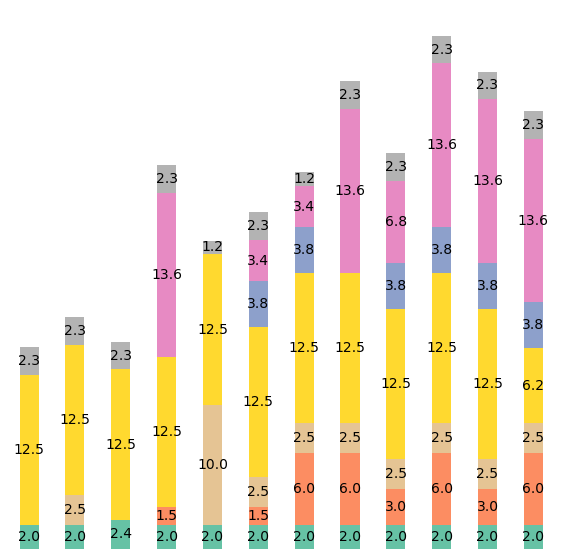

In [216]:
n_cols = 12
n_rows = 1
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, sharey=True, figsize=(7,7))

row = 0
col = 0
#for Gt, rank in per_removals.groupby(level=0):
futures = per_removals['Example_FutureID'].to_list()

for futureID in futures:
    label_bar(pd.DataFrame(simplified.loc[futureID][2100]).div(1e9).T,axes[col])
    #axes[row,col].set_title('%s GtCO2' %Gt)
    
    if col == n_cols-1:
        col = 0
        row += 1
    else: col += 1

plt.show()    
plt.close('all')

In [204]:
year = 2100
removals_interested = [400,600,800,1100]

per_removals = pd.DataFrame(index = removals_interested, columns = ['Portfolio', 'Count', 'Example_FutureID'])
for Gt in per_removals.index:
    # Find the subset of portfolios that meet the GtCO2 of the "per_removals" index Gt
    find = simplified_names[simplified_names.GtCO2==Gt][year].value_counts()
    
    per_removals.loc[Gt, 'Portfolio'] = pd.DataFrame(find).index[0] # Save the portfolio name
    per_removals.loc[Gt, 'Count'] = find[0] # Save the number of times it is repeated
    per_removals.loc[Gt, 'Example_FutureID'] = simplified_names[simplified_names[year]==pd.DataFrame(find).index[0]].index.to_list()[0] # Save a future ID to plot

per_removals.loc[800,'Portfolio']
per_removals

,Portfolio,Count,Example_FutureID
400,"[('A/R', 1980000000.0), ('BC', 500000.0), ('BE...",37,47
600,"[('A/R', 1980000000.0), ('BC', 1492250000.0), ...",5,156
800,"[('A/R', 1980000000.0), ('BC', 5969500000.0), ...",7,313
1100,"[('A/R', 1980000000.0), ('BC', 5969500000.0), ...",6,70


### Plotting most recurrent portfolios in a time period

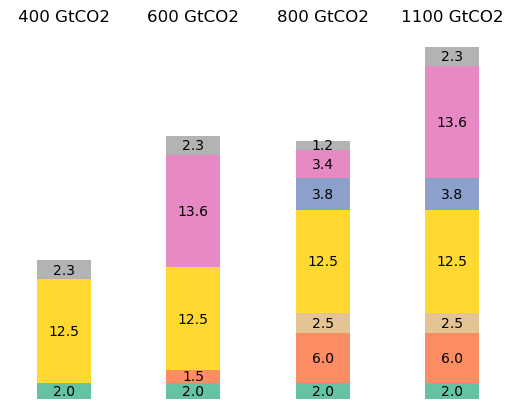

In [206]:
def label_bar(data, AX):
    ax_y = data.plot.bar(ax=AX,color=color_dict,stacked=True, label = 2100, legend = False)
    AX.axis("off")
    for rect in AX.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The width of the bar is also not pixels, it's the
        # number of animals. So we can use it as the label!
        label_text = round(height,1)

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2
        if label_text >0:
            AX.text(label_x, label_y, label_text, ha='center', va='center') 
    
    return AX

# =============================================================================================
fig, axes = plt.subplots(1, 4, sharey=True)
a = 0
for Gt in per_removals.index:
    futureID = per_removals.loc[Gt, 'Example_FutureID']

    label_bar(pd.DataFrame(simplified.loc[futureID][2100]).div(1e9).T,axes[a])
    axes[a].set_title('%s GtCO2' %Gt)
    a += 1

plt.show()    
plt.close('all')

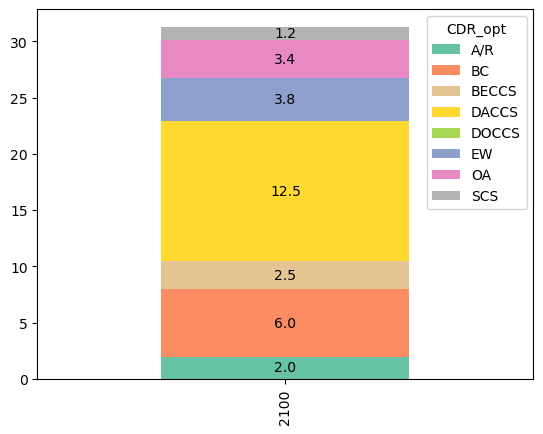

In [157]:
# https://gist.github.com/jsoma/c61e56819e4ae315ad5d194a630ccb23

fig, axes = plt.subplots(1, 1)

ax_y = pd.DataFrame(simplified.loc[313][2100]).div(1e9).T.plot.bar(ax=axes,color=color_dict,stacked=True, label = 2100)

for rect in axes.patches: # .patches is everything inside of the chart, lines and rectangles and circles and stuff. In this case we only have rectangles!
    # Find where everything is located
    height = rect.get_height()
    width = rect.get_width()
    x = rect.get_x()
    y = rect.get_y()
    
    # The width of the bar is also not pixels, it's the
    # number of animals. So we can use it as the label!
    label_text = round(height,1)
    
    # ax.text(x, y, text)
    label_x = x + width / 2
    label_y = y + height / 2
    if label_text >0:
        axes.text(label_x, label_y, label_text, ha='center', va='center') 
    
plt.show()
plt.close('all')

#### Plotting "simplified" portfolios

In [53]:
mpl.rcParams.update(mpl.rcParamsDefault)
from datetime import date
results_analysed = results_b

# Change "year" to plot a different time period
year = 2050
if year == 2050:
    dataframe = simple_portfolios_2050.head(6)
elif year == 2075:
    dataframe = simple_portfolios_2075.head(6)
elif year == 2100:
    dataframe = simple_portfolios_2100.head(6)   

n_rows = 3
n_cols = 2
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(7,7))
#plt.suptitle("6 Futures with most often deployed portfolios in %d with range of cumulative removals achieved by 2100 \n (y-axis: tCO2 of experience deployed in time period)" %year, size = 10, y = 1.08)
fig.tight_layout()

# Scaling all plots with the max value of removals per year
max_value = 0
for portfolio in dataframe.index:
    futureID = int(dataframe.loc[portfolio,"Example_FutureID"])
    #df_y = results_to_dataframe(results_z,futureID,first_year)
    df_y = simplified.loc[(futureID),year]
    if df_y.max() >= max_value:
        max_value = df_y.max()

r = 0
c = 0
for portfolio in dataframe.index:
    futureID = int(dataframe.loc[portfolio,"Example_FutureID"])
    df_y=pd.DataFrame(simplified.loc[(futureID),year]).sort_values(by=[year])
    df_y = df_y.div(1e9)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, legend = False) 
    #axes[r,c].set_title("Future ID %d solved with %s" % (futureID,solved_type[futureID]))
    axes[r,c].set_title("n = %d [%d to %d GtCO$_2$ by 2100]" % (dataframe.loc[portfolio,year],dataframe.loc[portfolio,"Removals_Min"],dataframe.loc[portfolio,"Removals_Max"]), size = 10, y = 0.95)
    axes[r,c].set_ylim(0, max_value*1.05*1e-9) #Max is 8 GtCO2/yr
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        axes[row,col].tick_params(axis='x', labelsize = 9)
        #axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        axes[row,col].yaxis.offsetText.set_fontsize(8)
        axes[row,col].spines[['right', 'top','bottom']].set_visible(False)
        axes[row,col].set_axisbelow(True)
        axes[row,col].yaxis.grid(color='gray', linestyle='dashed')
        if col == 0: axes[row,col].set_ylabel(ylabel='Experience [GtCO$_2$/year]', fontsize = 10)

        #axes[row,col].set_ylabel(ylabel= "MtCO2 removed/5-yr period", fontsize = 11)
        #axes[row,col].label_outer()
        
handles, labels = axes[row,col].get_legend_handles_labels()
#fig.legend(handles, labels, fontsize = 10, loc='upper center', bbox_to_anchor=(0.5, 1.09),ncol=4, fancybox=True, shadow=True)

#plt.savefig('Figures_Results/Simple_Portfolios_by%d_%s.png' %(year, date.today().strftime("%d.%m.%Y")), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')

NameError: name 'results_b' is not defined

## Simplified Portfolios by experience

If a future is deemed feasible by the solver, the optimisation model outputs a CDR portfolio capacity expansion plan at a 5-year increment. This output is highly granular, challenging the exact comparability of portfolio compositions. For this reason, model outputs are here converted into "simplified" porfolios" by grouping capacity of CDR option deployed into 4 bins and 3 different time periods (i.e., 2050, 2075, 2100).

We use experience $z_{i,k}$ to define bins, as installed capacity $y_{i,k}$ can be reduced at the end of the operational period, whereas experience can only increase.

- "bins" defines the ranges for the experience level of the simplified portfolios. Index = CDR options, columns = 1,2,3,4 
    - Bin 1: $Y_i^{ini}$
    - Bins 2 & 3: equally spaced
    - Bin 4: $Z^{max}_{i, \ output}$
- "simplified" has a multiindex: future ID, CDR option. Columns = [2050, 2075, 2100].

### Defining Bins

In [126]:
# Creating bins for simplified portfolios: find maximum experience achieved for each CDR across all futures $Z^{max}_{i,output}$
# Initial_YRef: Dictionary with Initial Y ref values

n_bins = 4
Z_max = pd.DataFrame(max_experience.max()) # Outputs the largest experience achieved for each CDR option across futures

bins = pd.DataFrame(index=i, columns = list(range(1,n_bins+1)))
for column in bins.columns:
    for CDR in i:
        if column == 1:
            bins.loc[CDR, column] = Initial_YRef[CDR]
        elif column == n_bins:
            bins.loc[CDR, column] = math.ceil(Z_max.loc[CDR,0])
        else:
            bins.loc[CDR, column] = math.ceil((column-1)*(Z_max.loc[CDR,0] - Initial_YRef[CDR])/n_bins)
bins

,1,2,3,4
AR,1980000000,1500000000,3000000000,7980000000
BC,500000,4477500000,8955000000,17910500000
BECCS,1820000,7897248545,15794497089,31590814178
DACCS,10000,5653751718,11307503436,22615016872
DOCCS,1,3125818423,6251636846,12503273692
EW,1,5950000000,11900000000,23800000001
OA,1,8126334681,16252669362,32505338725
SCS,1,2310000001,4620000001,9240000002


### Creating table with simplified portfolios for 3 time periods  

Infeasible futures ("NaN") have been dropped.

In [127]:
# Create a table with

years = dict(zip([2050, 2075, 2100], [6,11,16]))
simplified = pd.DataFrame()

for futureID in range(0,n_lhs+1):
    results_in_f = pd.DataFrame()
    results_in_f.index = pd.MultiIndex.from_tuples([(futureID, i[n]) for n in range(0, len(i))],names=['future_id','CDR_opt'])
    for CDR in i: 
        for n in [2050, 2075, 2100]:
            if np.isnan(results_z[futureID][CDR, years[n]]) == True:
                results_in_f.loc[(futureID,CDR),n] = np.nan
            else:
                bin_n = 1
                found = False
                while found == False:
                    if results_z[futureID][CDR, years[n]] <= bins.loc[CDR, bin_n]:
                        found = True
                        results_in_f.loc[(futureID, CDR),n] = bins.loc[CDR, bin_n]
                    else:
                        bin_n += 1
                        
    simplified = pd.concat([simplified,results_in_f])

simplified = simplified.dropna(axis=0, how="all")
simplified

2050          2075          2100
future_id CDR_opt                                          
0         AR       3.000000e+09  7.980000e+09  7.980000e+09
          BC       5.000000e+05  4.477500e+09  4.477500e+09
          BECCS    7.897249e+09  7.897249e+09  7.897249e+09
          DACCS    1.000000e+04  5.653752e+09  1.130750e+10
          DOCCS    1.000000e+00  1.000000e+00  1.000000e+00
...                         ...           ...           ...
3000      DACCS    1.000000e+04  1.130750e+10  2.261502e+10
          DOCCS    1.000000e+00  1.000000e+00  1.000000e+00
          EW       1.000000e+00  1.000000e+00  5.950000e+09
          OA       1.000000e+00  1.000000e+00  8.126335e+09
          SCS      2.310000e+09  2.310000e+09  2.310000e+09

[21808 rows x 3 columns]

### Identifying repeated portfolios

Here the output dataframe "simplified_names" has one row per future, rather than a multi-index as for the "simplified" dataframe. Each case includes a list with the portfolio description as a string. This way, duplicates can easily be identified.

In [128]:
simplified_names = pd.DataFrame()

for futureID, CDR in simplified.groupby(level=0):
    results_in = pd.DataFrame()
    for n in [2050, 2075, 2100]:
        results_in.loc[futureID,n] = str(list(simplified.loc[(futureID),n].to_dict().items()))       
    
    simplified_names = pd.concat([simplified_names,results_in])

simplified_names

# The index of 'simplified_names' is the future_ID

,2050,2075,2100
0,"[('AR', 3000000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500000.0), (...","[('AR', 7980000000.0), ('BC', 4477500000.0), (..."
2,"[('AR', 3000000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 8955000000.0), (..."
3,"[('AR', 7980000000.0), ('BC', 4477500000.0), (...","[('AR', 7980000000.0), ('BC', 8955000000.0), (...","[('AR', 7980000000.0), ('BC', 17910500000.0), ..."
4,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500000.0), (...","[('AR', 7980000000.0), ('BC', 4477500000.0), (..."
5,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500000.0), (...","[('AR', 7980000000.0), ('BC', 4477500000.0), (..."
...,...,...,...
2996,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 8955000000.0), (...","[('AR', 7980000000.0), ('BC', 17910500000.0), ..."
2997,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500000.0), (...","[('AR', 7980000000.0), ('BC', 4477500000.0), (..."
2998,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500000.0), (...","[('AR', 7980000000.0), ('BC', 4477500000.0), (..."
2999,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500000.0), (..."


In [129]:
#simple_portfolios_2050 = simplified_names.drop_duplicates(subset=[2050])[[2050]]
#In pandas axis = 0 refers to horizontal axis or rows and axis = 1 refers to vertical axis or columns.

# Creating dataframes for each period:
simple_portfolios_2050 = pd.DataFrame(simplified_names[2050].value_counts())
simple_portfolios_2075 = pd.DataFrame(simplified_names[2075].value_counts())
simple_portfolios_2100 = pd.DataFrame(simplified_names[2100].value_counts())

year = 2050
# For each time period:
for time in [simple_portfolios_2050, simple_portfolios_2075, simple_portfolios_2100]:
    if time is simple_portfolios_2075:
        year = 2075
    elif time is simple_portfolios_2100:
        year = 2100    
    number = 1
    # For each portfolio (row) in "simple_portfolios_":
    for portfolio in time.index:
        repeated = simplified_names[year].isin([portfolio])
        # find the index of the first occurrence of 'portfolio' in the DataFrame "simplified_names"
        time.loc[portfolio,"Example_FutureID"] = repeated.idxmax() # 'idxmax' Return index of first occurrence of maximum over requested axis.
                
        repeated = list(repeated[repeated].index)  # List on futureIDs that have the occurrence 'portfolio'
        maxi = 450
        mini = 1100
        for futureID in repeated:
            removed = total_future.loc[futureID,"Removals"]/1e9
            if removed <= mini:
                mini = removed
            if removed >= maxi:
                maxi = removed
        
        time.loc[portfolio,"Removals_Min"] = mini 
        time.loc[portfolio,"Removals_Max"] = maxi
        if number <= 4:
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_")+str(number)
        else: 
            time.loc[portfolio,"Portfolio_ID"] = str(year)+str("_other")

        number += 1

simple_portfolios_2050.head(11)

,2050,Example_FutureID,Removals_Min,Removals_Max,Portfolio_ID
"[('AR', 7980000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 10000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 2310000001.0)]",568,5.0,400.0,1100.0,2050_1
"[('AR', 3000000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 10000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 2310000001.0)]",372,2.0,400.0,1100.0,2050_2
"[('AR', 3000000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 10000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 1.0)]",267,0.0,400.0,1100.0,2050_3
"[('AR', 7980000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 5653751718.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 2310000001.0)]",265,11.0,400.0,1100.0,2050_4
"[('AR', 7980000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 5653751718.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 4620000001.0)]",169,7.0,500.0,1100.0,2050_other
"[('AR', 7980000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 10000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 1.0)]",159,4.0,400.0,1100.0,2050_other
"[('AR', 1980000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 10000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 1.0)]",154,17.0,400.0,700.0,2050_other
"[('AR', 7980000000.0), ('BC', 4477500000.0), ('BECCS', 7897248545.0), ('DACCS', 5653751718.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 4620000001.0)]",81,3.0,600.0,1100.0,2050_other
"[('AR', 7980000000.0), ('BC', 500000.0), ('BECCS', 7897248545.0), ('DACCS', 10000.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 4620000001.0)]",80,8.0,500.0,1100.0,2050_other
"[('AR', 7980000000.0), ('BC', 4477500000.0), ('BECCS', 7897248545.0), ('DACCS', 5653751718.0), ('DOCCS', 1.0), ('EW', 1.0), ('OA', 1.0), ('SCS', 2310000001.0)]",69,41.0,600.0,1100.0,2050_other


### Plotting most recurrent portfolios in a time period

#### Plotting "simplified" portfolios

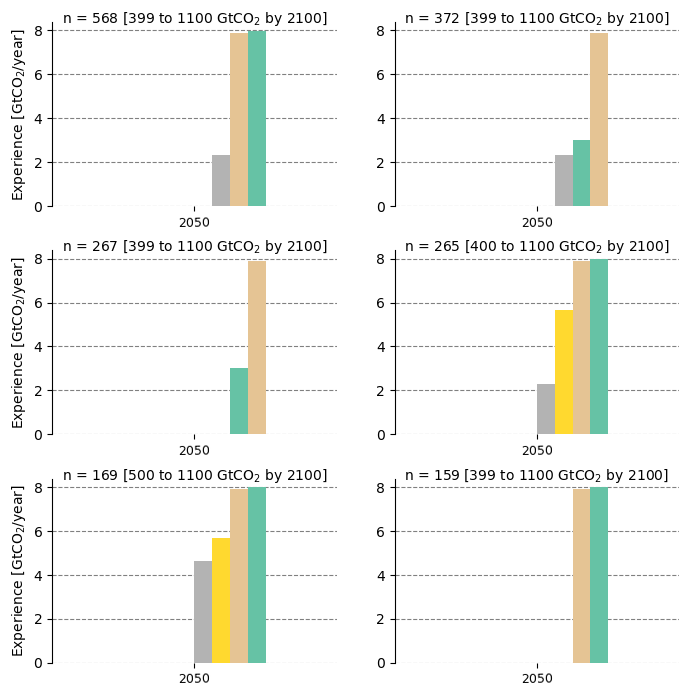

In [132]:
mpl.rcParams.update(mpl.rcParamsDefault)
from datetime import date
results_analysed = results_b

# Change "year" to plot a different time period
year = 2050
if year == 2050:
    dataframe = simple_portfolios_2050.head(6)
elif year == 2075:
    dataframe = simple_portfolios_2075.head(6)
elif year == 2100:
    dataframe = simple_portfolios_2100.head(6)   

n_rows = 3
n_cols = 2
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(7,7))
#plt.suptitle("6 Futures with most often deployed portfolios in %d with range of cumulative removals achieved by 2100 \n (y-axis: tCO2 of experience deployed in time period)" %year, size = 10, y = 1.08)
fig.tight_layout()

# Scaling all plots with the max value of removals per year
max_value = 0
for portfolio in dataframe.index:
    futureID = int(dataframe.loc[portfolio,"Example_FutureID"])
    #df_y = results_to_dataframe(results_z,futureID,first_year)
    df_y = simplified.loc[(futureID),year]
    if df_y.max() >= max_value:
        max_value = df_y.max()

r = 0
c = 0
for portfolio in dataframe.index:
    futureID = int(dataframe.loc[portfolio,"Example_FutureID"])
    df_y=pd.DataFrame(simplified.loc[(futureID),year]).sort_values(by=[year])
    df_y = df_y.div(1e9)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, legend = False) 
    #axes[r,c].set_title("Future ID %d solved with %s" % (futureID,solved_type[futureID]))
    axes[r,c].set_title("n = %d [%d to %d GtCO$_2$ by 2100]" % (dataframe.loc[portfolio,year],dataframe.loc[portfolio,"Removals_Min"],dataframe.loc[portfolio,"Removals_Max"]), size = 10, y = 0.95)
    axes[r,c].set_ylim(0, max_value*1.05*1e-9) #Max is 8 GtCO2/yr
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        axes[row,col].tick_params(axis='x', labelsize = 9)
        #axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        axes[row,col].yaxis.offsetText.set_fontsize(8)
        axes[row,col].spines[['right', 'top','bottom']].set_visible(False)
        axes[row,col].set_axisbelow(True)
        axes[row,col].yaxis.grid(color='gray', linestyle='dashed')
        if col == 0: axes[row,col].set_ylabel(ylabel='Experience [GtCO$_2$/year]', fontsize = 10)

        #axes[row,col].set_ylabel(ylabel= "MtCO2 removed/5-yr period", fontsize = 11)
        #axes[row,col].label_outer()
        
handles, labels = axes[row,col].get_legend_handles_labels()
#fig.legend(handles, labels, fontsize = 10, loc='upper center', bbox_to_anchor=(0.5, 1.09),ncol=4, fancybox=True, shadow=True)

#plt.savefig('Figures_Results/Simple_Portfolios_by%d_%s.png' %(year, date.today().strftime("%d.%m.%Y")), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')

#### Plotting example futureID portfolios

This section requires the very granular data directly produced by the simulation (e.g., tCO2 removed per CDR option at each time period for each future), and therefore cannot be run with data saved to csv file.

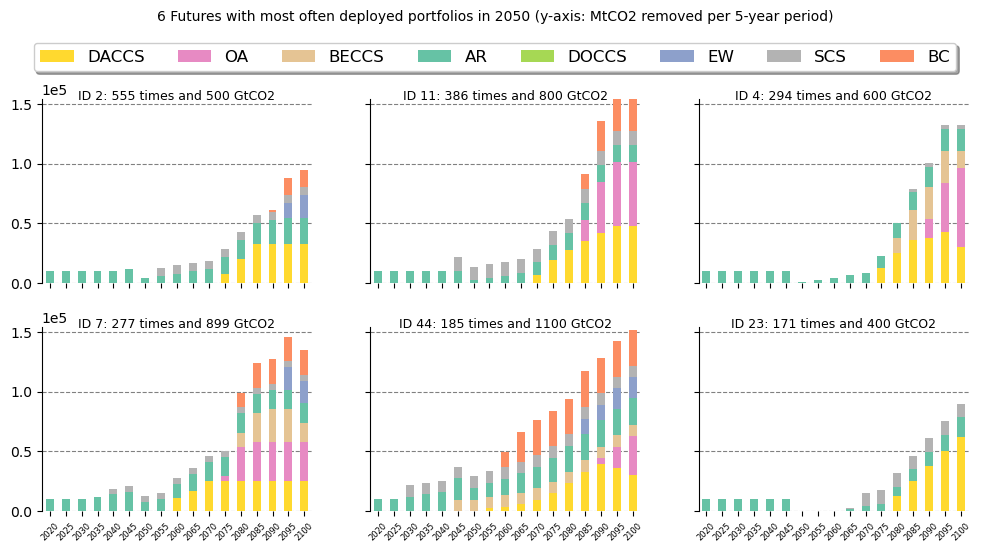

In [86]:
from datetime import date
results_analysed = results_b

# Change "year" to plot a different time period
year = 2050
if year == 2050:
    dataframe = simple_portfolios_2050.head(6)
elif year == 2075:
    dataframe = simple_portfolios_2075.head(6)
elif year == 2100:
    dataframe = simple_portfolios_2100.head(6)   

n_rows = 2
n_cols = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(10, 5))
plt.suptitle("6 Futures with most often deployed portfolios in %d (y-axis: MtCO2 removed per 5-year period)" %year, size = 10, y = 1.08)
fig.tight_layout()

# Scaling all plots with the max value of removals per year
max_value = 0
for portfolio in dataframe.index:
    futureID = int(dataframe.loc[portfolio,"Example_FutureID"])
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    if df_y.sum(axis=0).max() >= max_value:
        max_value = df_y.sum(axis=0).max()
        
r = 0
c = 0
for portfolio in dataframe.index:
    futureID = int(dataframe.loc[portfolio,"Example_FutureID"])
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, stacked=True, legend = False) 
    #axes[r,c].set_title("Future ID %d solved with %s" % (futureID,solved_type[futureID]))
    axes[r,c].set_title("ID %d: %d times and %d GtCO2" % (futureID,dataframe.loc[portfolio,year],scatter.loc[futureID, "Removals"]/1e9), size = 9, y = 0.95)
    axes[r,c].set_ylim(0, max_value) #Max is 150 GtCO2
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        #axes[row,col].get_xaxis().set_ticks([])
        axes[row,col].tick_params(axis='x', labelrotation=45,labelsize = 6)
        axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        axes[row,col].spines[['right', 'top','bottom']].set_visible(False)
        axes[row,col].set_axisbelow(True)
        axes[row,col].yaxis.grid(color='gray', linestyle='dashed')
        #axes[row,col].set_ylabel(ylabel= "MtCO2 removed/5-yr period", fontsize = 11)
        axes[row,col].label_outer()
        
handles, labels = axes[row,col].get_legend_handles_labels()
fig.legend(handles, labels, fontsize = 12, loc='upper center', bbox_to_anchor=(0.5, 1.03),ncol=8, fancybox=True, shadow=True)

#plt.savefig('Figures_Results/Simple_Portfolios_by%d_%s.png' %(year, date.today().strftime("%d.%m.%Y")), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')

### Decision tree with short-term portfolios

In [57]:
for futureID in simplified_names.index:
    for year in [2050, 2075, 2100]:
        
        if year == 2050:
            time = simple_portfolios_2050
        elif year == 2075:
            time = simple_portfolios_2075
        elif year == 2100:
            time = simple_portfolios_2100
        
        portfolio = simplified_names.loc[futureID,year]
        
        simplified_names.loc[futureID,"Portfolio_ID_%d" %year] = time.loc[portfolio,"Portfolio_ID"]
        simplified_names.loc[futureID,"Count_%d" %year] = time.loc[portfolio,year]
    
    simplified_names.loc[futureID,"Count_Total"] = int(simplified_names.loc[futureID,"Count_2050"] + simplified_names.loc[futureID,"Count_2075"] + simplified_names.loc[futureID,"Count_2100"])


simplified_names.sort_values(by=["Count_Total"], ascending=False).head(10)

,2050,2075,2100,Portfolio_ID_2050,Count_2050,Portfolio_ID_2075,Count_2075,Portfolio_ID_2100,Count_2100,Count_Total
326,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...",2050_1,555.0,2075_1,426.0,2100_1,62.0,1043.0
171,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...",2050_1,555.0,2075_1,426.0,2100_1,62.0,1043.0
2770,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,42.0,1023.0
1727,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,42.0,1023.0
2241,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,42.0,1023.0
639,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,36.0,1017.0
2682,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,36.0,1017.0
1758,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,36.0,1017.0
730,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,35.0,1016.0
358,"[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 500000.0), ('BEC...","[('AR', 7980000000.0), ('BC', 4477500001.0), (...",2050_1,555.0,2075_1,426.0,2100_other,35.0,1016.0


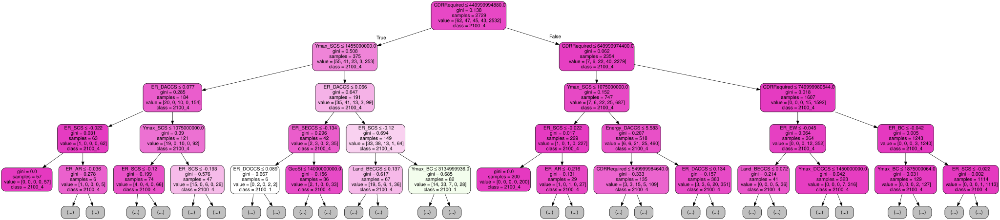

In [58]:
y = simplified_names['Portfolio_ID_2100'] 
x = df_LHS.T
features = x.T.index.tolist()
x = x[x.index.isin(y.index)] # Use the future_IDs that are solved ('y' already excludes unsolved futures)

dtree = DecisionTreeClassifier()
dtree = dtree.fit(x, y)
'''
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dtree, max_depth = 6, feature_names=features, rounded=True, filled=True, fontsize = 10)
'''
dot_data = tree.export_graphviz(dtree, out_file=None, max_depth = 4,
                     feature_names=features, #rotate = True,  
                     class_names=list(y.unique()),  
                     filled=True, rounded=True, #proportion = True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data, format="png")  
#graph.render("Figures_Results/DecisionTree_%s" %date.today().strftime("%d.%m.%Y"), view=True) 
graph

# 4. Sensitivity Analysis

Sensitivity analysis has been conducted using the same data input into the model, but with varying discount rate and initial project lifetime. The results from 4 simulations (denoted "Scenarios A to D") are below used to produce violing charts. 

In [ ]:
i = ['BECCS', 'A/R', 'SCS', 'BC', 'DACCS', 'EW', 'OA', 'DOCCS']
i.sort()

# ================================ Names of Scenarios ================================
names_scenarios = {'A': 'Discount rate = 1%', 'B': 'Discount rate = 5%', 'C' : 'Low Initial Operational Period', 'D' : 'High Initial Operational Period'}

# ================================ Importing Data ================================
aggregated_results = pd.read_csv("Input_Output_Files/aggregated_results_15.08.2024.csv", index_col ='future_id')
#aggregated_results_A = pd.read_csv("Input_Output_Files/aggregated_results_05.08.2024_ScenarioA.csv", index_col ='future_id')
#aggregated_results_B = pd.read_csv("Input_Output_Files/aggregated_results_05.08.2024_ScenarioB.csv", index_col ='future_id')
#aggregated_results_C = pd.read_csv("Input_Output_Files/aggregated_results_06.08.2024_ScenarioC.csv", index_col ='future_id')
#aggregated_results_D = pd.read_csv("Input_Output_Files/aggregated_results_06.08.2024_ScenarioD.csv", index_col ='future_id')

aggregated_results_D[i]

In [ ]:
files = [aggregated_results_A, aggregated_results_B]
scenarios = [chr(i) for i in range(ord('A'),ord('B')+1)]

'''files = [aggregated_results_C, aggregated_results_D]
scenarios = [chr(i) for i in range(ord('C'),ord('D')+1)]'''

names_scenarios = {'A': 'Discount rate = 1%', 'B': 'Discount rate = 5%', 'C' : 'Low Initial Operational Period', 'D' : 'High Initial Operational Period'}

# =============================== Saving Data for Default Scenario =================================
max_capacity = aggregated_results[i]
max_capacity = pd.DataFrame(max_capacity.stack())
max_capacity = max_capacity.rename(columns={0:"Maximum Capacity (GtCO2/yr)"})
max_capacity["Maximum Capacity (GtCO2/yr)"] = max_capacity["Maximum Capacity (GtCO2/yr)"].mul(1e-9)
max_capacity = max_capacity.rename_axis(index={'future_id': 'future_id', None: 'CDR_opt'}).reset_index()
#max_capacity = max_capacity.reset_index()

# ====================================== For plotting purposes ======================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(layout='constrained', figsize=(5*len(files), 6))
subfigs = fig.subfigures(1, len(files), wspace=0.05, hspace=0.04)

y_legend = 1.05
y_subfig = y_legend + 0.01

# ====================================== For each scenario =======================================
sce = 0 # Dummy variable for plotting
for file in files:
    metric = file[i]
    interest = "Capacity"
    x_lim = file['OA'].max()
    '''
    df = pd.DataFrame(metric.T.stack())
    df = df.rename(columns={0:"Maximum Capacity"})
    df = df.reset_index()
    df["Maximum Capacity"] = df["Maximum Capacity"].mul(1e-9)
    '''
    
    df = pd.DataFrame(metric.stack())
    df = df.rename(columns={0:"Maximum Capacity (GtCO2/yr)"})
    df["Maximum Capacity (GtCO2/yr)"] = df["Maximum Capacity (GtCO2/yr)"].mul(1e-9)
    #df = df.rename(columns={"level_1":"CDR_opt"})
    df = df.rename_axis(index={'future_id': 'future_id', None: 'CDR_opt'})
    df = df.reset_index()

    df["class"] = 'Scenario %s' %scenarios[sce]
    max_capacity["class"] = 'Default Scenario'
    df_plot = pd.concat([max_capacity,df], axis = 0)
        
    axs = subfigs[sce].subplots(8, 2, width_ratios=[13,1],sharex='col')
    subfigs[sce].suptitle('Scenario %s: %s' %(scenarios[sce], names_scenarios[scenarios[sce]]))
    
    r = 0
    #axsLeft[r,1].set_title('Median \n (GtCO$_2$/yr)', fontsize = 10, loc='center')

    for CDR in i:
        plot = df_plot[df_plot.CDR_opt == CDR] 
        median_all = df_plot.loc[(df_plot['class']=='Default Scenario') & (df_plot['CDR_opt']==CDR)]['Maximum Capacity (GtCO2/yr)'].median()
        median_interest = df_plot.loc[(df_plot['class']=='Scenario %s' %scenarios[sce]) & (df_plot['CDR_opt']==CDR)]['Maximum Capacity (GtCO2/yr)'].median()
        axs[r,1].annotate('%.1f' %median_all, xy=(0.5,0.7), xytext=(0.1,0.7), color = (0.7,0.7,0.7,1), annotation_clip=False, fontsize=12, weight='bold')
        axs[r,1].annotate('%.1f' %median_interest, xy=(0.5,0.3), xytext=(0.1,0.3), color = color_dict[CDR], annotation_clip=False, fontsize=12, weight='bold')
        axs[r,1].spines[['right', 'top','left','bottom']].set_visible(False)
        axs[r,1].set_xticks([])
        axs[r,1].set_yticks([])
        axs[r,1].set_ylabel(ylabel = "")
        axs[r,1].set_xlabel(xlabel = "")

        sns.violinplot(data=plot, y = "CDR_opt", x="Maximum %s (GtCO2/yr)" %(interest), hue="class", split = True, palette={'Scenario %s' %scenarios[sce]: color_dict[CDR], 'Default Scenario':(0.9,0.9,0.9,0.5)}, linewidth=0,
                       ax = axs[r,0], density_norm='count', legend = True, inner="quart", inner_kws={"color": "k", "linewidth": 1.8})
        #violin.set_yticklabels(violin.get_yticks(), size = 14)
        axs[r,0].yaxis.set_tick_params(labelsize = 12)
        axs[r,0].set_xlim(0,x_lim*1e-9)
        axs[r,0].set_ylabel(ylabel = "")
        axs[r,0].set_xlabel(xlabel = "")
        axs[r,0].xaxis.grid(color='grey', linestyle='--', linewidth=0.2, zorder=1)
        axs[r,0].legend(labels="", edgecolor='white',facecolor='white')
        axs[r,0].spines[['right', 'top']].set_visible(False)

        if r == 7:
            axs[r,0].set_xlabel(xlabel = "Maximum %s" %(interest), fontsize = 12, color = 'k')
            axs[r,0].text(x=0.5, y=-1.04, s='[GtCO$_2$/yr]', horizontalalignment='center', verticalalignment='center', transform=axs[r,0].transAxes, fontsize = 9)
            
            axs[r,1].set_xlabel(xlabel = 'Median', fontsize = 12, color = 'k', labelpad = 10)
            axs[r,1].text(x=0.5, y=-0.7, s='[GtCO$_2$/yr]', horizontalalignment='center', verticalalignment='center', transform=axs[r,1].transAxes, fontsize = 9)
        r += 1

    axs[0,0].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='Default Scenario'),
                               mpatches.Patch(color=(0.5,0.5,0.5,1), label='Scenario %s' %scenarios[sce])],
                      fontsize = 9, loc='upper left', bbox_to_anchor=(0.42,1.05), ncol=1, facecolor='white', edgecolor='white')  

    sce+=1

plt.show()    
plt.close('all')

# 5. Additional Plotting & Analysis (not included in manuscript)

## Plotting Portfolios

This section requires the very granular data directly produced by the simulation (e.g., tCO2 removed per CDR option at each time period for each future), and therefore cannot be run with data saved to csv file.

### 100 Portfolios with largest cumulative CO2 removed 

Plotting removals (MtCO2/yr) for each future ID - this takes a while! If a future has no solution, empty plot.


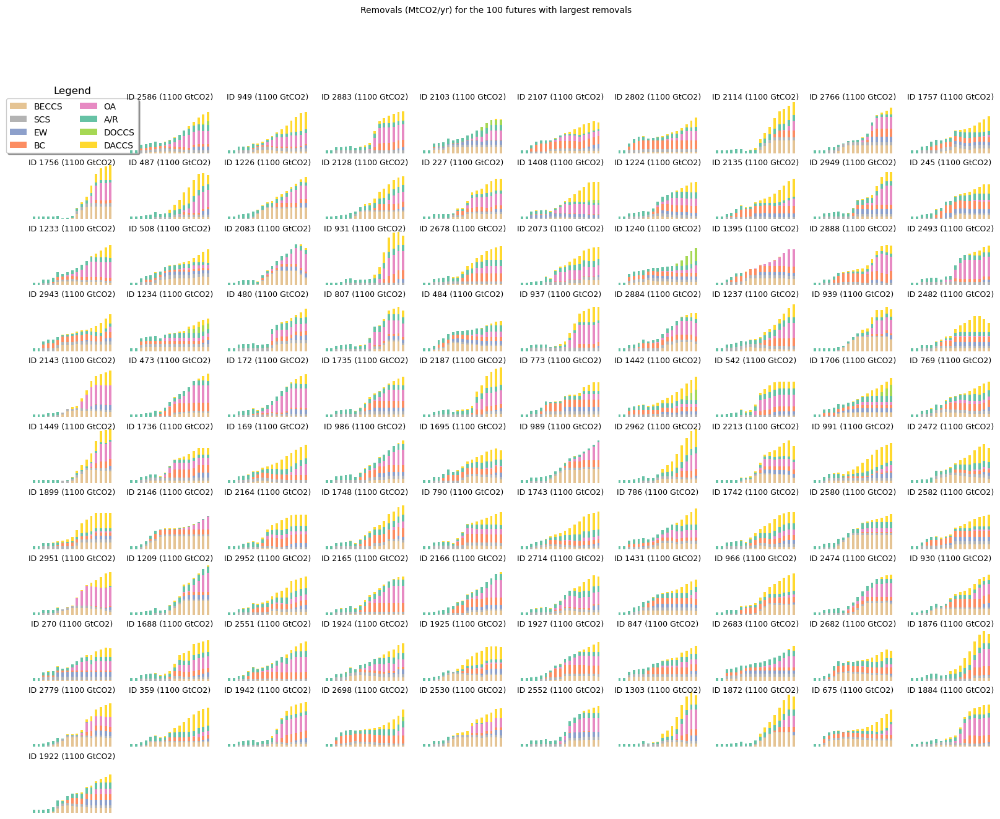

In [49]:
results_analysed = results_b
print('Plotting removals (MtCO2/yr) for each future ID - this takes a while! If a future has no solution, empty plot.')

n_plots = 100
max_n_rem = total_future.sort_values(by=['Removals'],ascending=False).head(n_plots)

n_rows = math.ceil(math.sqrt(n_plots))+1
n_cols = math.floor(math.sqrt(n_plots))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 15))
plt.suptitle("Removals (MtCO2/yr) for the %d futures with largest removals" %n_plots, size = 10)

# Scaling all plots with the max value of removals per year
max_value = 0
for futureID in max_n_rem.index.astype(int):
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    if df_y.sum(axis=0).max() >= max_value:
        max_value = df_y.sum(axis=0).max()
        
# Just to plot the legend
df_y = results_to_dataframe(results_analysed,not_solved,first_year) # We are using, if available, a future that was not solved to plot the legend :)
df_y.T.plot.bar(ax=axes[0,0],color=color_dict,rot=1, stacked=True, legend = True)
axes[0,0].legend(loc='center',bbox_to_anchor=(0.5, 0.5),ncol=2, fancybox=True, shadow=True)
axes[0,0].set_title("Legend")

r = 0
c = 1
for futureID in max_n_rem.index.astype(int):
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, stacked=True, legend = False) 
    axes[r,c].set_title("ID %d (%d GtCO2)" % (futureID,1e-9*max_n_rem.loc[futureID,"Removals"]), y = 0.9,size = 9)
    axes[r,c].set_ylim(0, max_value) 
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        axes[row,col].axis("off")
            
plt.show()
plt.close('all')

### 6 Portfolios with Largest Cumulative Removals

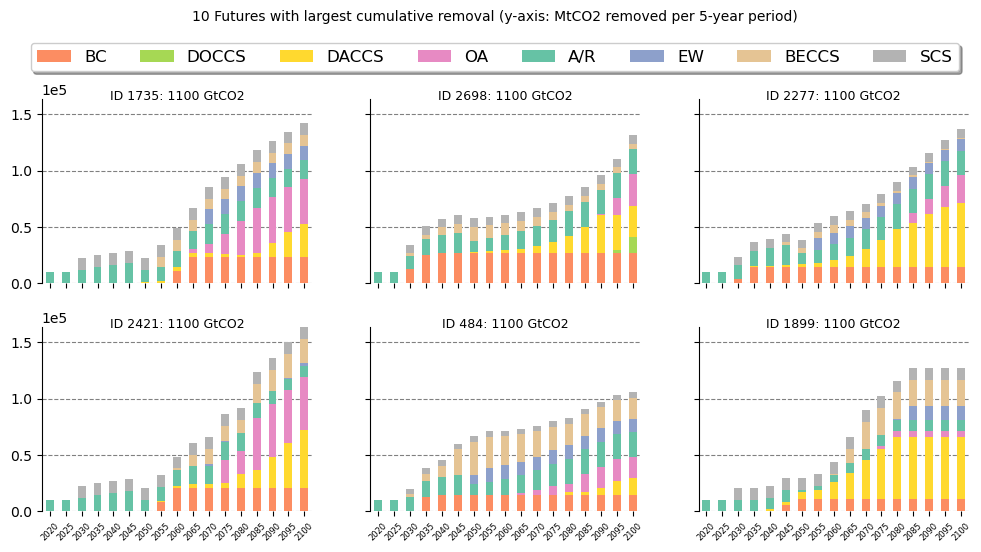

In [462]:
from datetime import date

max_10_rem = total_future.sort_values(by=['Removals'],ascending=False).head(6)
results_analysed = results_b

n_rows = 2
n_cols = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(10, 5))
plt.suptitle("10 Futures with largest cumulative removal (y-axis: MtCO2 removed per 5-year period)", size = 10, y = 1.08)
fig.tight_layout()

# Scaling all plots with the max value of removals per year
max_value = 0
for futureID,rows in max_10_rem.iterrows():
    df_y = results_to_dataframe(results_analysed,int(futureID),first_year)
    if df_y.sum(axis=0).max() >= max_value:
        max_value = df_y.sum(axis=0).max()
        
# Just to plot the legend
'''df_y = results_to_dataframe(results_analysed,not_solved,first_year) # We are using, if available, a future that was not solved to plot the legend :)
df_y.T.plot.bar(ax=axes[0,0],color=color_dict,rot=1, stacked=True, legend = True)
axes[0,0].legend(loc='center',bbox_to_anchor=(0.5, 0.5),ncol=2, fancybox=True, shadow=True)
axes[0,0].set_title("Legend")'''

r = 0
c = 0
for futureID,rows in max_10_rem.iterrows():
    df_y = results_to_dataframe(results_analysed,int(futureID),first_year)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, stacked=True, legend = False) 
    #axes[r,c].set_title("Future ID %d solved with %s" % (futureID,solved_type[futureID]))
    axes[r,c].set_title("ID %d: %d GtCO2" % (int(futureID),1e-9*max_10_rem.loc[futureID,'Removals']), size = 9, y = 0.95)
    axes[r,c].set_ylim(0, max_value) #Max is 150 GtCO2
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        #axes[row,col].get_xaxis().set_ticks([])
        axes[row,col].tick_params(axis='x', labelrotation=45,labelsize = 6)
        axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        axes[row,col].spines[['right', 'top','bottom']].set_visible(False)
        axes[row,col].set_axisbelow(True)
        axes[row,col].yaxis.grid(color='gray', linestyle='dashed')
        #axes[row,col].set_ylabel(ylabel= "MtCO2 removed/5-yr period", fontsize = 11)
        axes[row,col].label_outer()
        
handles_CDR, labels_CDR = axes[row,col].get_legend_handles_labels()
fig.legend(handles_CDR, labels_CDR, fontsize = 12, loc='upper center', bbox_to_anchor=(0.5, 1.03),ncol=8, fancybox=True, shadow=True)

#plt.savefig('Figures_Results/Largest_Removals_by2100_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')

### 10 Portfolios with Lowest costs

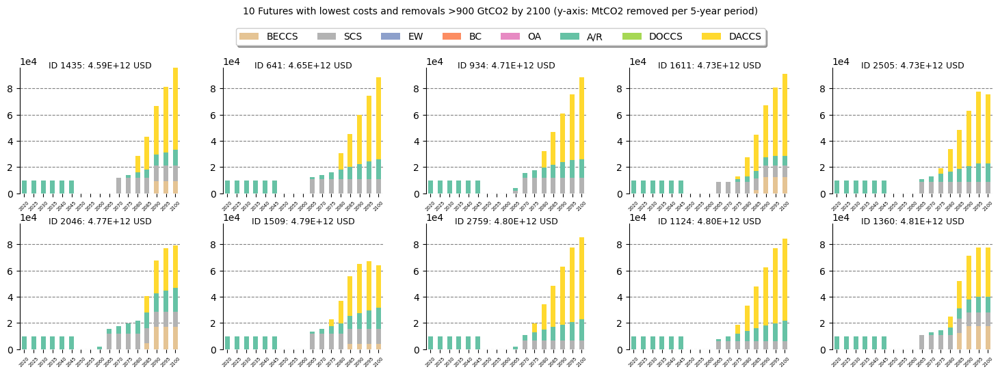

In [73]:
#min_10_costs = total_future[total_future.Removals > 9e11].sort_values(by=['Costs']).head(10)
min_10_costs = total_future.sort_values(by=['Costs']).head(10)
results_analysed = results_b

n_rows = 2
n_cols = 5
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(15, 5))
plt.suptitle("10 Futures with lowest costs and removals >900 GtCO2 by 2100 (y-axis: MtCO2 removed per 5-year period)", size = 10, y = 1.08)
fig.tight_layout()

# Scaling all plots with the max value of removals per year
max_value = 0
for futureID,rows in min_10_costs.iterrows():
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    if df_y.sum(axis=0).max() >= max_value:
        max_value = df_y.sum(axis=0).max()
r = 0
c = 0
for futureID,rows in min_10_costs.iterrows():
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, stacked=True, legend = False) 
    #axes[r,c].set_title("Future ID %d solved with %s" % (futureID,solved_type[futureID]))
    axes[r,c].set_title("ID %d: %.2E USD" % (futureID,min_10_costs.loc[futureID,'Costs']), size = 9, y = 0.95)
    axes[r,c].set_ylim(0, max_value) #Max is 150 GtCO2
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        #axes[row,col].get_xaxis().set_ticks([])
        axes[row,col].tick_params(axis='x', labelrotation=45,labelsize = 5)
        axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        axes[row,col].spines[['right', 'top','bottom']].set_visible(False)
        axes[row,col].set_axisbelow(True)
        axes[row,col].yaxis.grid(color='gray', linestyle='dashed')

handles, labels = axes[row,col].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.03),ncol=8, fancybox=True, shadow=True)
#plt.savefig('Figures_Results/Lowest_Costs_by2100_halflifetime_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()
plt.close('all')

### 6 Portfolios with Fastest scale up (most tons removed in 2050)

In [ ]:
#aggregated_2050 = aggregated_2050[aggregated_2050.Removals != 0] #Remove non-solved futures
max_2050_removals = aggregated_2050.sort_values(by=['Removals'],ascending=False).head(6)
results_analysed = results_b

n_rows = 2
n_cols = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(10, 5))
plt.suptitle("10 Futures with largest cumulative removals by 2050 (y-axis: MtCO2 removed per 5-year period)", size = 10, y = 1.08)
fig.tight_layout()

# Scaling all plots with the max value of removals per year
max_value = 0
for futureID,rows in max_2050_removals.iterrows():
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    if df_y.sum(axis=0).max() >= max_value:
        max_value = df_y.sum(axis=0).max()
r = 0
c = 0
for futureID,rows in max_2050_removals.iterrows():
    df_y = results_to_dataframe(results_analysed,futureID,first_year)
    df_y.T.plot.bar(ax=axes[r,c],color=color_dict,rot=1, stacked=True, legend = False) 
    #axes[r,c].set_title("Future ID %d solved with %s" % (futureID,solved_type[futureID]))
    axes[r,c].set_title("ID %d: %d GtCO2 by 2050" % (futureID,1e-9*max_2050_removals.loc[futureID,'Removals']), size = 9, y = 0.95)
    axes[r,c].set_ylim(0, max_value) #Max is 150 GtCO2
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        #axes[row,col].get_xaxis().set_ticks([])
        axes[row,col].tick_params(axis='x', labelrotation=45,labelsize = 5)
        axes[row,col].ticklabel_format(axis='y', style='sci', scilimits=(4,5))
        axes[row,col].spines[['right', 'top','bottom']].set_visible(False)
        axes[row,col].set_axisbelow(True)
        axes[row,col].yaxis.grid(color='gray', linestyle='dashed')
        axes[row,col].label_outer()

handles, labels = axes[row,col].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.03),ncol=8, fancybox=True, shadow=True)
#plt.savefig('Figures_Results/Largest_Removals_by2050_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()
plt.close('all')

## Plotting for one future
This section requires the very granular data directly produced by the simulation (e.g., tCO2 removed per CDR option at each time period for each future), and therefore cannot be run with data saved to csv file.

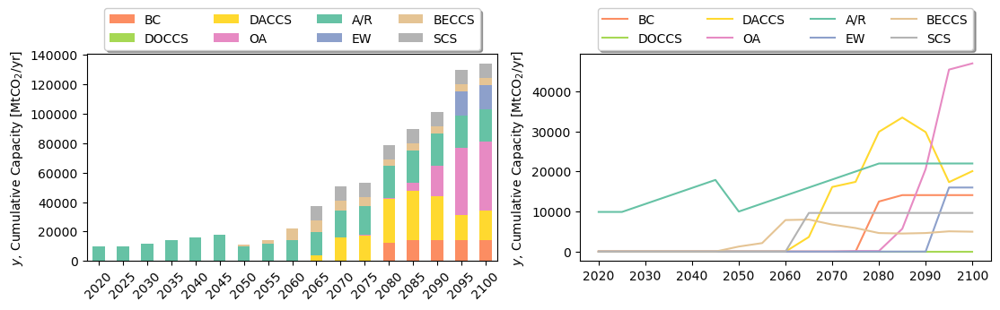

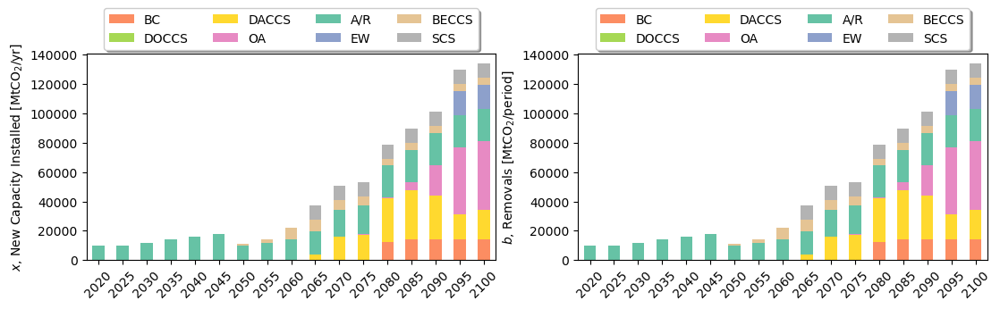

In [709]:
mpl.rcParams.update(mpl.rcParamsDefault)
# ================================== Visualising Capacity & Removals Results with Pandas ======================================
# Plotting one future only:
futureID = 76

df_y = results_to_dataframe(results_b,futureID,first_year)
df_b = results_to_dataframe(results_b,futureID,first_year)
df_x = results_to_dataframe(results_b,futureID,first_year)

# ================================== 
fig, axes = plt.subplots(1, 2)
ax_y = df_y.T.plot.bar(ax=axes[0],figsize=(13,3), color = color_dict, rot=1,stacked=True)
ax_y.legend(loc='upper center',bbox_to_anchor=(0.5, 1.25),ncol=4, fancybox=True, shadow=True)
axes[0].set(ylabel="$y$, Cumulative Capacity [MtCO$_2$/yr]")
axes[0].tick_params(axis='x', labelrotation=45)

ax_y2 = df_y.T.plot(ax=axes[1],figsize=(13,3), color = color_dict,rot=1,legend=False)
ax_y2.legend(loc='upper center',bbox_to_anchor=(0.5, 1.25),ncol=4, fancybox=True, shadow=True)
axes[1].set(ylabel="$y$, Cumulative Capacity [MtCO$_2$/yr]")

# ---------------------------------
fig, axes = plt.subplots(1, 2)
ax_x = df_x.T.plot.bar(ax=axes[0],figsize=(13,3), color = color_dict,rot=1,stacked=True, legend=False)
ax_x.legend(loc='upper center',bbox_to_anchor=(0.5, 1.25),ncol=4, fancybox=True, shadow=True)
axes[0].set(ylabel="$x$, New Capacity Installed [MtCO$_2$/yr]")
axes[0].tick_params(axis='x', labelrotation=45)

ax_b = df_b.T.plot.bar(ax=axes[1],figsize=(13,3), color = color_dict,rot=1,stacked=True, legend=False)
ax_b.legend(loc='upper center',bbox_to_anchor=(0.5, 1.25),ncol=4, fancybox=True, shadow=True)
axes[1].set(ylabel="$b$, Removals [MtCO$_2$/period]")
axes[1].tick_params(axis='x', labelrotation=45)

plt.show()
plt.close('all')

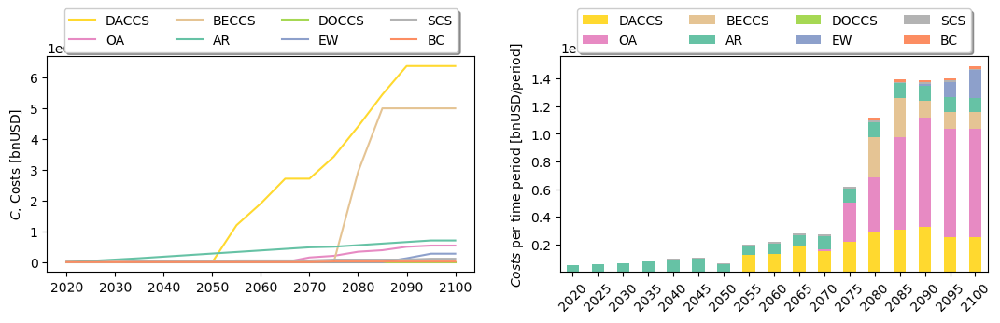

In [74]:
# ================================== Visualising Capacity & Removals Results with Pandas ======================================
# Plotting one future only:
futureID = 76

df_C = results_to_dataframe(results_C,futureID,first_year)
df_Costs = results_to_dataframe(results_Costs,futureID,first_year)

# ================================== 
fig, axes = plt.subplots(1, 2)
ax_C = df_C.T.plot(ax=axes[0],figsize=(13,3),rot=1, color = color_dict,legend=False)
ax_C.legend(loc='upper center',bbox_to_anchor=(0.5, 1.25),ncol=4, fancybox=True, shadow=True)
axes[0].set(ylabel="$C$, Costs [bnUSD]")

ax_Costs = df_Costs.T.plot.bar(ax=axes[1],figsize=(13,3),rot=1,stacked=True, color = color_dict, legend=False)
ax_Costs.legend(loc='upper center',bbox_to_anchor=(0.5, 1.25),ncol=4, fancybox=True, shadow=True)
axes[1].set(ylabel="$Costs$ per time period [bnUSD/period]")
axes[1].tick_params(axis='x', labelrotation=45)

plt.show()
plt.close('all')

## Boxplots

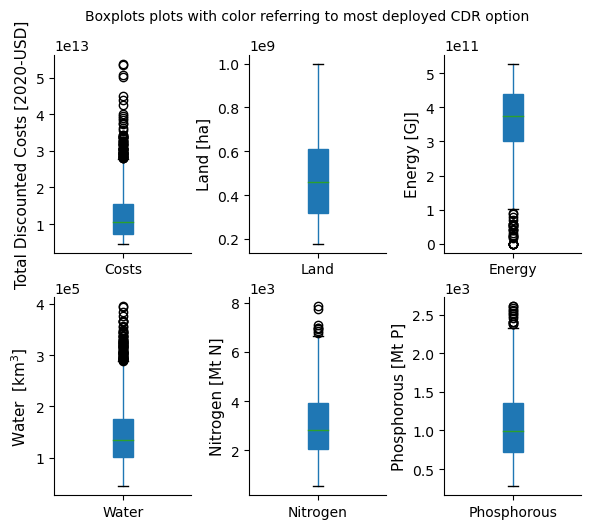

In [22]:
import plotly.express as px

table_plotting = aggregated_results[['Removals','Costs','Land','Energy','Water','Nitrogen','Phosphorous']].copy()
table_plotting = table_plotting[table_plotting['Removals'] != 0] # Need to drop futures that were not solved

table_plotting = table_plotting.drop('Removals', axis=1)
y_axes_names = {"Costs":"Total Discounted Costs [2020-USD]", "Land":"Land [ha]", "Energy":"Energy [GJ]", "Water":"Water  [km$^3$]", "Nitrogen":"Nitrogen [Mt N]", "Phosphorous":"Phosphorous [Mt P]"}

cmap=plt.get_cmap('PuBu')
colors_list = [cmap(n) for n in range(0,len(y_axes_names))]

n_rows = 2
n_cols = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(6, 5))
fig.tight_layout()
plt.suptitle("Boxplots plots with color referring to most deployed CDR option", size = 10, y = 1.05)

r = 0
c = 0
for index, column_name in enumerate(table_plotting.columns):
    table_plotting.boxplot(ax=axes[r,c], column = column_name, grid=False, patch_artist=True)
    axes[r,c].set_ylabel(ylabel=y_axes_names[column_name], fontsize = 11)
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        axes[row,col].set_facecolor("white")
        axes[row,col].ticklabel_format(axis='y', style='sci',scilimits=(3,5))
        axes[row,col].spines[['right', 'top']].set_visible(False)
    
plt.savefig('Figures_Results/Boxplots_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")      
plt.show()
plt.close('all')

## Plotting Histograms

### Max Capacity

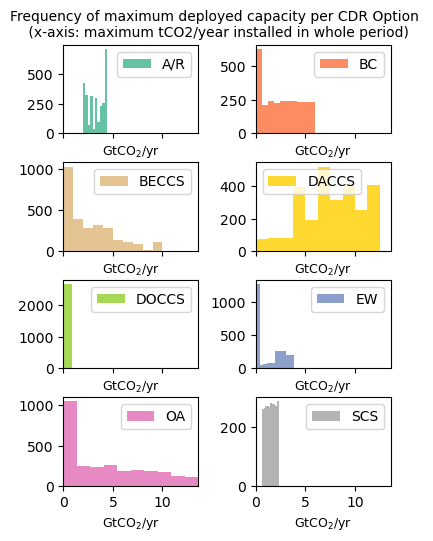

In [46]:
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}

sorted_colors = {key: value for key, value in sorted(color_dict.items())} # Need to sort as histogram below will be plotted in alphabetical order
colors = list(sorted_colors.values())

fig, axes = plt.subplots(nrows = 4, ncols =2, figsize = (4, 5), sharex=True)
fig.tight_layout()

for index, column in enumerate(max_capacity.columns):
    ax = axes.flatten()[index]
    ax.hist(max_capacity[column].div(1e9), color = colors[index], label = column)
    ax.set_xlim(0,1e-9*max_capacity.max().max())
    ax.legend(loc = "best")
    ax.set_xlabel(xlabel="GtCO$_2$/yr", fontsize = 9)

plt.suptitle("Frequency of maximum deployed capacity per CDR Option \n (x-axis: maximum tCO2/year installed in whole period)", size = 10, y = 1.03)
#plt.savefig('Figures_Results/Histograms_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()

### Experience
This section requires the experience data directly produced by the simulation, and therefore cannot be run with data saved to csv file.

In [48]:
# Select whether experience curves should be computed with lower (i.e., "minimum") or upper (i.e., "maximum") bound of Experience Rates
interest = "maximum"
#interest = "minimum"

df = pd.read_excel("PortfolioFiles/Portfolio_Files_Latest/All data.xlsx", index_col = "Parameter")
df = df.T

Endo = pd.DataFrame(index=i, columns=il)
Z_lo = dict.fromkeys(merged_il_list, 1)
Z_up = dict.fromkeys(merged_il_list, 1)
C_lo = dict.fromkeys(merged_il_list, 1)
C_up = dict.fromkeys(merged_il_list, 1)
beta = dict.fromkeys(merged_il_list, 1)
Xmax_input = dict.fromkeys(merged_list, 500e6) # Defautlt tCO2/year

for col in df.columns:
    name = col.split("_")
    # This is for checking whether the current parameter (column) is a CDR-indexed parameter or not
    if name[0] in ['Yref', 'Ymax', 'ER', 'SCref','Xmax']:
        for CDR in i:
            if name[1] == CDR:
                Endo.loc[CDR, name[0]] = df.loc[interest, col]
                
# Computing Relevant parameters
Endo["b"] = -np.log(1 - Endo.ER.astype(np.float64)) / np.log(2)
Endo.loc['DOCCS','SCref'] = int(unit_costs_b(Endo.loc['DOCCS','Yref'], Endo.loc['DOCCS','b'], Endo.loc['DACCS','Yref'], Endo.loc['DACCS','SCref']))

for CDR in i:
    Xmax_input.update({(CDR,n):int(Endo.loc[CDR,'Xmax']) for n in range(k1,T)})
    ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
    # For l=1
    Z_lo.update({(CDR,1):int(Endo.loc[CDR,'Yref'])})
    C_lo.update({(CDR,1):0})
    # For l=2,3,4
    for n in [2,3,4]:
        Z_lo.update({(CDR,n):int(Z_lo[CDR,n-1]+Xmax_input[CDR,T-1]*delK)})
    Z_up.update({(CDR,n):int(Z_lo[CDR,n+1]-1) for n in [1,2,3]})
    Z_up.update({(CDR,n):int(ZUp_max) for n in [4]})
    C_lo.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_lo[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in [2,3,4]})
    C_up.update({(CDR,n):int((Endo.loc[CDR,'SCref']/(1-Endo.loc[CDR,'b']))*((((Z_up[CDR,n])**(1-Endo.loc[CDR,'b']))/(Endo.loc[CDR,'Yref']**(-Endo.loc[CDR,'b'])))-Endo.loc[CDR,'Yref'])) for n in l})
    beta.update({(CDR,n):int((C_up[CDR,n]-C_lo[CDR,n])/(Z_up[CDR,n]-Z_lo[CDR,n])) for n in l})

points = pd.DataFrame.from_dict([Z_lo, Z_up, C_lo, C_up, beta])
points = points.T.rename(columns={0:"Ylo", 1:"Yup", 2:"Clo",3:"Cup", 4:"beta"})

# Color Map for later plotting
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
sorted_colors = {key: value for key, value in sorted(color_dict.items())} # Need to sort as histogram below will be plotted in alphabetical order
colors = list(sorted_colors.values())

f = plt.figure(figsize=(25, 20), dpi=100)
f.tight_layout()
plt.suptitle('Experience Curves with %s parameters \n x-axis: cumulative experience [tCO2/yr]; y-left: frequency of max experience across futures; y-right: Unit Costs [USD/tCO2/yr]' %interest,y=0.92,size=14)
index = 0
for CDR in sorted(i):
    ZUp_max = (Endo.loc[CDR,'Yref']+Xmax_input[CDR,T-1]*delK*(active_k[CDR]-1))
    
    y = np.linspace(Endo.loc[CDR,'Yref'], ZUp_max, 100)
    unit_cost = [Endo.loc[CDR,'SCref']*((_/Endo.loc[CDR,'Yref'])**(-Endo.loc[CDR,'b'])) for _ in y]
    largest_unit_cost = Endo.loc[CDR,'SCref']*((max_experience[CDR].max()/Endo.loc[CDR,'Yref'])**(-Endo.loc[CDR,'b']))
    
    ax = f.add_subplot(4,4,i.index(CDR)+1)
    ax2 = ax.twinx()
    ax.hist(max_experience[CDR], bins = 10, color = colors[index], label = CDR)
    ax2.plot(y, unit_cost, 'b-', label="$SC$, Unit Cost")
    #ax2.flatten()[index]
    index += 1

    #ax2.legend(loc = "best")
    #ax2.plot(y, cum_costs, 'b-', label = "$C$, Total Cumulative Costs")
    #ax2.scatter(Y_il, C_il, marker = 'X')
    ax.set_title("Costs for %s at ER: %.2f" %(CDR,Endo.loc[CDR,'ER']),size=12,y=0.99)
    if Endo.loc[CDR,'ER'] <=0:
        ax2.annotate('Cost at %.0E: %.1f $/tCO2/yr' %(y[0],int(unit_cost[0])), xy=(y[0],int(unit_cost[0])), xytext=(y[5],int(unit_cost[1])), color = 'black',arrowprops=dict(arrowstyle='->',color='black'))
        ax2.annotate('Cost at %.0E: %.1f $/tCO2/yr' %(max_experience[CDR].max(),largest_unit_cost), xy=(max_experience[CDR].max(),largest_unit_cost),xytext=(ZUp_max*0.5,unit_cost[-40]),color = 'black',arrowprops=dict(arrowstyle='->',color='black'))
    else:
        ax2.annotate('Cost at %.0E: %.1f $/tCO2/yr' %(y[0],int(unit_cost[0])),xy=(y[0],int(unit_cost[0])),xytext=(y[5],int(unit_cost[0])), color = 'black',arrowprops=dict(arrowstyle='->',color='black'))
        ax2.annotate('Cost at %.0E: %.1f $/tCO2/yr' %(max_experience[CDR].max(),largest_unit_cost), xy=(max_experience[CDR].max(),largest_unit_cost),xytext=(ZUp_max*0.4,unit_cost[-50]),color = 'black',arrowprops=dict(arrowstyle='->',color='black'))
plt.show()
plt.close('all')


NameError: name 'max_experience' is not defined

## Correlation Matrices

Key Resources:
- Pandas corr() dictionary https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html
- How to create a Triangle Correlation Heatmap in seaborn – Python? https://www.geeksforgeeks.org/how-to-create-a-triangle-correlation-heatmap-in-seaborn-python/
- Use Seaborn to Create a Heatmap (=green tones) https://www.w3schools.com/datascience/ds_stat_correlation_matrix.asp


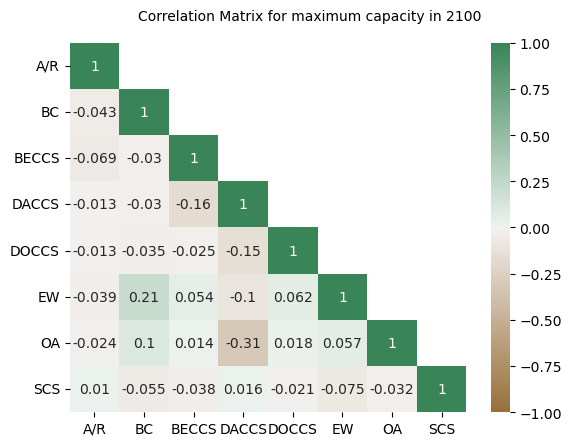

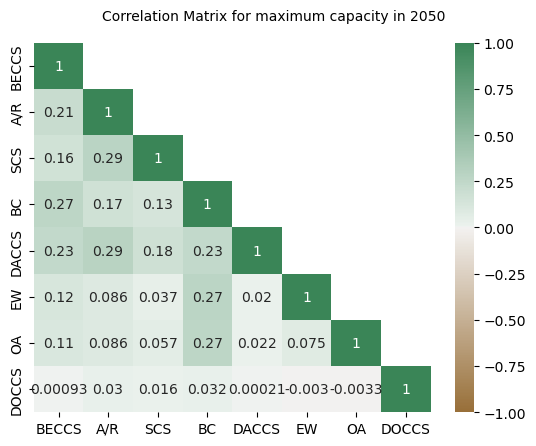

In [50]:
data = max_capacity.corr() 

# creating mask 
mask = np.triu(np.ones_like(data))
np.fill_diagonal(mask,0)
    
# plotting a triangle correlation heatmap 
dataplot = sns.heatmap(data, cmap=sns.diverging_palette(50, 500, n=500), annot=True, mask=mask, vmin=-1, vmax=1) 
plt.suptitle("Correlation Matrix for maximum capacity in 2100", size = 10, y = 0.95)
#plt.savefig('Figures_Results/Correlations_by2100_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")
plt.show()

# plotting a triangle correlation heatmap for 2050
data = max_2050.T.corr()
dataplot = sns.heatmap(data, cmap=sns.diverging_palette(50, 500, n=500), annot=True, mask=mask, vmin=-1, vmax=1) 
plt.suptitle("Correlation Matrix for maximum capacity in 2050", size = 10, y = 0.95)
plt.show()
plt.close('all')

## Violin Charts

#### Capacity vs Experience

This section requires the experience data directly produced by the simulation, and therefore cannot be run with data saved to csv file.

3 Futures meet the selected citeria


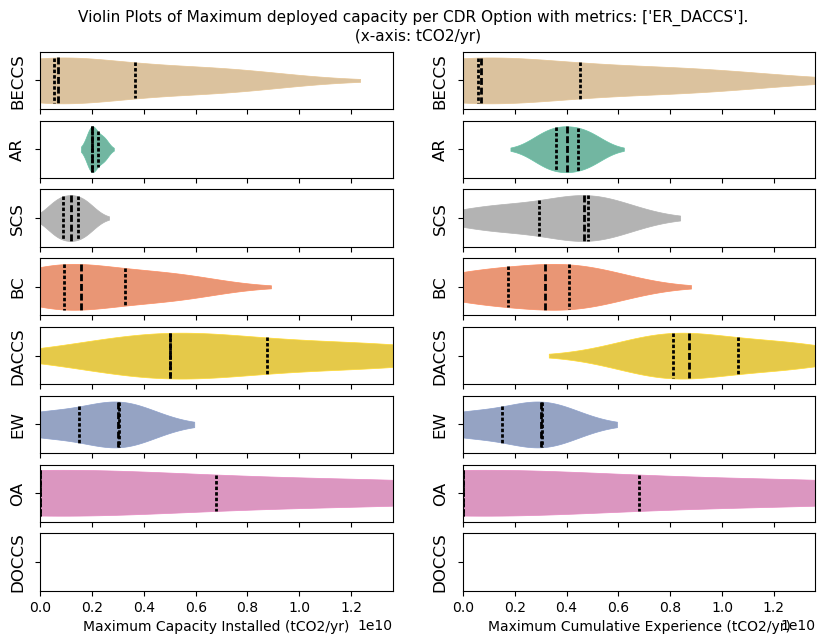

In [50]:
# ================================== Defining Metrics of Interest ==================================
#metrics_of_interest = {'LandL':[[2e8, 4e8]], 'Land_BECCS':[[0.04,0.08]]}
metrics_of_interest = {'ER_DACCS': [[0.05, 0.10]]}

list_of_futures = []
remaining_futures = aggregated_results
for metric in metrics_of_interest:
    for futureID in remaining_futures.index:
        value = remaining_futures.loc[futureID, metric]
        if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
            list_of_futures += [futureID]
        else:
            remaining_futures = remaining_futures.drop(futureID)

#list_of_futures_in = list(set(list_of_futures)) # Removing duplicates
list_of_futures_in = remaining_futures.index.to_list()
list_of_futures_out = list(set(aggregated_results.index.to_list()) - set(list_of_futures_in)) # List of futures that are outside ranges specified in "metrics_of_interest"

# ================================== For plotting purposes ==================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
mpl.rcParams.update(mpl.rcParamsDefault)

fig, axes = plt.subplots(nrows = 8, ncols =2, figsize = (10, 7), sharex=True)
plt.suptitle('Violin Plots of Maximum deployed capacity per CDR Option with metrics: %s. \n (x-axis: tCO2/yr)' %list(metrics_of_interest.keys()), size=11, y=0.94)

# ================================== Plotting ==================================
c=0
for metric in [max_capacity, max_experience]:
    if metric is max_capacity:
        interest = "Capacity Installed"
        x_lim = results['Cumulative capacity'].max()
    else:
        interest = "Cumulative Experience"
        x_lim = max_experience.max(axis=1).max()
    
    df = pd.DataFrame(metric.stack())
    df = df.rename(columns={0:"Maximum %s (tCO2/yr)" %interest})
    df = df.reset_index()
    
    # Delete futures that are out of the ranges of interest
    for futureID in list_of_futures_out:
        df = df[df.level_0 != futureID]
    
    r = 0
    for CDR in i:
        plot = df[df.CDR_opt == CDR] 
        
        sns.violinplot(data=plot, x="Maximum %s (tCO2/yr)" %interest,ax=axes[r,c], label=CDR, color = color_dict[CDR],linewidth=0.5, legend=False,
                       linecolor= color_dict[CDR], density_norm='count', inner="quart", inner_kws={"color": "k", "linewidth": 2})
        
        axes[r,c].set_xlim(0,x_lim)
        axes[r,c].set_ylabel(ylabel=CDR, fontsize = 12)
        r += 1
    c +=1

print(len(list_of_futures_in), 'Futures meet the selected citeria')
plt.show()
plt.close('all')

#### 1 Scenario: Violin & Boxplots

900 Futures meet the selected citeria (incl. NaN futures)


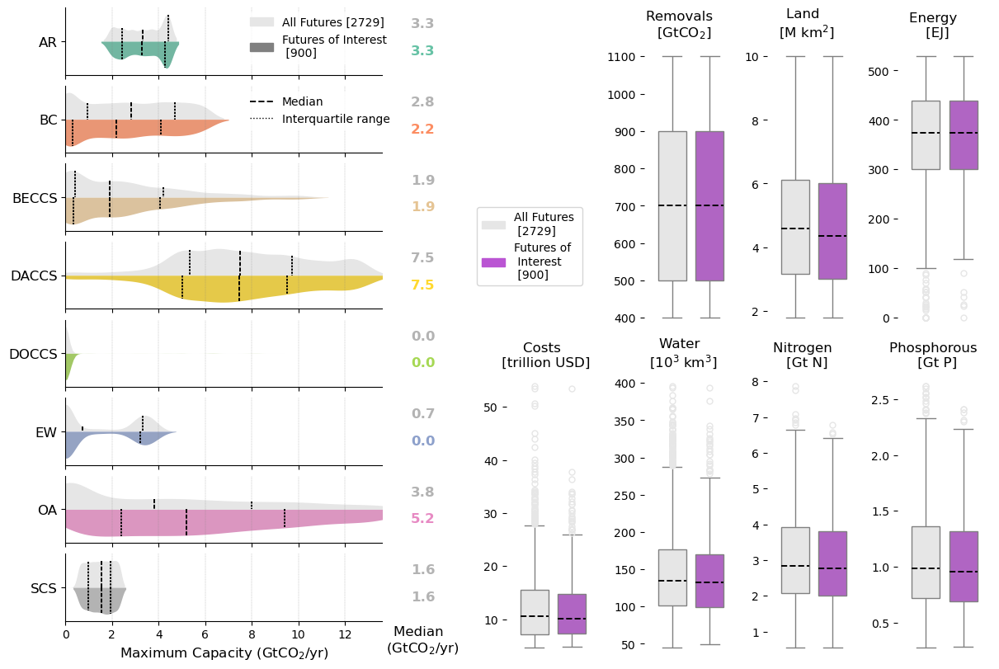

In [33]:
# ==================================================================================================
# DIFFERENT COLORS & SHARED LEGEND

# ===== Constraints =====
#color_plots = 'mediumseagreen' # Used for LandL
#color_plots = 'orange' # Used for EnergyL
#color_plots = 'khaki' # Used for Removals

# ===== Cost Metrics =====
#color_plots = 'deepskyblue' # Used for Costs
color_plots = 'mediumorchid' # Used for ER
# ==================================================================================================

# ================================== Defining Metrics of Interest ==================================
#metrics_of_interest = extract_range(all_metrics_ranges,metric_interest='Costs',minimum=0.75,maximum=1)

metrics_of_interest = {}
for CDR in ['OA']: # CDR options whose ER wants to be explored
    metrics_of_interest = metrics_of_interest | extract_range(all_metrics_ranges,metric_interest='ER_'+CDR,minimum=0.75,maximum=1)

# ================================== Identifying Futures of Interest ==================================
list_of_futures = []
remaining_futures = aggregated_results.copy()
for metric in metrics_of_interest:
    if len(metrics_of_interest)==1:
        title_plot = ["%s from %.1E to %.1E (%s)" %(all_metrics_names[metric], metrics_of_interest[metric][0][0], metrics_of_interest[metric][0][1], all_metrics_units[metric])]
    else:
        title_plot = [list(metrics_of_interest.keys())]
        
    for futureID in remaining_futures.index:
        value = remaining_futures.loc[futureID, metric]
        if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
            list_of_futures += [futureID]
        else:
            remaining_futures = remaining_futures.drop(futureID)
list_of_futures_in = remaining_futures.index.to_list()
list_of_futures_out = list(set(aggregated_results.index.to_list()) - set(list_of_futures_in)) # List of futures that are outside ranges specified in "metrics_of_interest"

# ================================== For plotting purposes ==================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(layout='constrained', figsize=(12, 8))
subfigs = fig.subfigures(1, 2, wspace=0.07, width_ratios=[5,6])

#plt.suptitle('Metrics evaluated: %s.' %list(metrics_of_interest.keys()), size=11, y=1.1)
#plt.suptitle('Metric evaluated: %s \n Number of futures of interest = %d (out of %d solved)' %(title_plot[0],len(list_of_futures_in),solved), size=11, y=1.13)
#plt.suptitle('Metric evaluated: %s' %(title_plot[0]), size=11, y=1.04) # = Latest version

legend_y = 1.08
subfig_title = legend_y+0.01

# ================================== Plotting on Left ==================================
#subfigs[0].suptitle('Violin Plots of Maximum deployed capacity per CDR Option', fontsize=11, y = subfig_title)
axsLeft = subfigs[0].subplots(8, 2, width_ratios=[13,1],sharex='col')

c=0
metric = max_capacity
if metric is max_capacity:
    interest = "Capacity"
    x_lim = results['Cumulative capacity'].max()
else:
    interest = "Cumulative Experience"
    x_lim = max_experience.max(axis=1).max()

df = pd.DataFrame(metric.stack())
df = df.rename(columns={0:"Maximum %s (GtCO2/yr)" %interest})
df["Maximum %s (GtCO2/yr)" %interest] = df["Maximum %s (GtCO2/yr)" %interest].mul(1e-9)
df = df.reset_index()

# Delete futures that are out of the ranges of interest
df_new = df.copy()
for futureID in list_of_futures_out:
    df_new = df_new[df_new.future_id != futureID]

df_new["class"] = 'futures of interest'
df["class"] = 'all futures'
df_plot = pd.concat([df, df_new])

r = 0
#axsLeft[r,1].set_title('Median \n (GtCO$_2$/yr)', fontsize = 10, loc='center')

for CDR in i:
    plot = df_plot[df_plot.CDR_opt == CDR] 
    median_all = df_plot.loc[(df_plot['class']=='all futures') & (df_plot['CDR_opt']==CDR)]['Maximum Capacity (GtCO2/yr)'].median()
    median_interest = df_plot.loc[(df_plot['class']=='futures of interest') & (df_plot['CDR_opt']==CDR)]['Maximum Capacity (GtCO2/yr)'].median()
    axsLeft[r,1].annotate('%.1f' %median_all, xy=(0.5,0.7), xytext=(0.1,0.7), color = (0.7,0.7,0.7,1), annotation_clip=False, fontsize=12, weight='bold')
    axsLeft[r,1].annotate('%.1f' %median_interest, xy=(0.5,0.3), xytext=(0.1,0.3), color = color_dict[CDR], annotation_clip=False, fontsize=12, weight='bold')
    axsLeft[r,1].spines[['right', 'top','left','bottom']].set_visible(False)
    axsLeft[r,1].set_xticks([])
    axsLeft[r,1].set_yticks([])
    axsLeft[r,1].set_ylabel(ylabel = "")
    axsLeft[r,1].set_xlabel(xlabel = "")
    
    sns.violinplot(data=plot, y = "CDR_opt", x="Maximum %s (GtCO2/yr)" %(interest), hue="class", split = True, palette={'futures of interest': color_dict[CDR], 'all futures':(0.9,0.9,0.9,0.5)}, linewidth=0,
                   ax = axsLeft[r,0], density_norm='count', legend = True, inner="quart", inner_kws={"color": "k", "linewidth": 1.4})
    #violin.set_yticklabels(violin.get_yticks(), size = 14)
    axsLeft[r,0].yaxis.set_tick_params(labelsize = 12)
    axsLeft[r,0].set_xlim(0,x_lim*1e-9)
    axsLeft[r,0].set_ylabel(ylabel = "")
    axsLeft[r,0].set_xlabel(xlabel = "")
    axsLeft[r,0].xaxis.grid(color='grey', linestyle='--', linewidth=0.2, zorder=1)
    axsLeft[r,0].legend(labels="", edgecolor='white',facecolor='white')
    axsLeft[r,0].spines[['right', 'top']].set_visible(False)

    if r == 7:
        axsLeft[r,0].set_xlabel(xlabel = "Maximum %s (GtCO$_2$/yr)" %(interest), fontsize = 12, color = 'k')
        axsLeft[r,1].set_xlabel(xlabel = 'Median \n (GtCO$_2$/yr)', fontsize = 12, color = 'k')
        #handles, labels = axsLeft[r,0].get_legend_handles_labels()
    r += 1

axsLeft[0,0].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures [%d]' %solved),
                           mpatches.Patch(color=(0.5,0.5,0.5,1), label='Futures of Interest \n [%d]' %len(list_of_futures_in))],
                           #mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.4),
                           #mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1)], 
                  fontsize =10, loc='upper left', bbox_to_anchor=(0.55,1.02), ncol=1, facecolor='white', edgecolor='white')    

axsLeft[1,0].legend(handles=[#mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures [%d]' %solved),
                           #mpatches.Patch(color=(0.5,0.5,0.5,1), label='Futures of Interest [%d]' %len(list_of_futures_in)),
                           mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.4),
                           mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1)], 
                  fontsize =10, loc='upper left', bbox_to_anchor=(0.55,1), ncol=1, facecolor='white', edgecolor='white')

print(len(list_of_futures_in), 'Futures meet the selected citeria (incl. NaN futures)')

# ================================== Plotting on Right ==================================
#subfigs[1].suptitle('Boxplots plots: color referring to most deployed CDR option in future of interest', fontsize=11, y = subfig_title)
n_rows = 2
n_cols = 4
axsRight = subfigs[1].subplots(n_rows, n_cols)

table_plotting = aggregated_results[['Removals','Land','Energy','Costs','Water','Nitrogen','Phosphorous']].copy()
table_plotting = table_plotting[table_plotting['Removals'] != 0] # Need to drop futures that were not solved
metrics = table_plotting.columns.to_list()

conversion = {'Removals':1e9,'Land':1e8,'Energy':1e9,'Costs':1e12,'Water':1e3,'Nitrogen':1e3,'Phosphorous':1e3}
units_conver = {'Removals':'GtCO$_2$','Land':'M km$^2$','Energy':'EJ','Costs':'trillion USD','Water':'10$^3$ km$^3$','Nitrogen':'Gt N','Phosphorous':'Gt P'}
for column in table_plotting.columns:
    table_plotting[column] = table_plotting[column].div(conversion[column])

# Delete futures that are out of the ranges of interest
df_new = table_plotting.copy()
for futureID in list_of_futures_out:
    df_new = df_new[df_new.index != futureID]

df_new["class"] = 'futures of interest'
table_plotting["class"] = 'all futures'
df_plot = pd.concat([table_plotting, df_new])

N_off = (0,0) # If (1,3) --> c = 0; if (0,0) --> c = 1; 
axsRight[N_off].spines[['right', 'top','left','bottom']].set_visible(False)
axsRight[N_off].set_xticks([])
axsRight[N_off].set_yticks([])
axsRight[N_off].set_xlim(0,1)
axsRight[N_off].set_ylim(0,1)
#axsRight[N_off].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures [%d]' %solved), mpatches.Patch(color=color_plots, label='Futures of Interest [%d]' %len(list_of_futures_in))], 
                     #fontsize = 9, loc='center', bbox_to_anchor=(0.5, 0.9), ncol=1, edgecolor='white',facecolor='white')
#text = 'Metric evaluated: \n %s \n Number of futures of interest = %d \n (out of %d solved)' %(title_plot[0],len(list_of_futures_in),solved)
#axsRight[0,0].text(0.5, 1, text, dict(ha='center', va='center', fontsize=10, color='k'), wrap=True)

r = 0
c = 1
for metric in metrics:
    plot = df_plot[[metric, 'class']]
    sns.boxplot(data=plot, y=metric, hue="class", gap=0, ax=axsRight[r,c], legend = False, widths = 0.3, 
                palette = {'futures of interest':color_plots,'all futures':(0.9,0.9,0.9,0.5)}, 
                flierprops=dict(marker='o',  markersize=5, linestyle='none', markeredgecolor=(0.9,0.9,0.9,1)), 
                linecolor=(0.5,0.5,0.5,1), medianprops = dict(linestyle='--', linewidth=1.4, color='k'))

    axsRight[r,c].spines[['right', 'top','left','bottom']].set_visible(False)
    #axsRight[r,c].set_yticks([])
    axsRight[r,c].set_xticks([])
    axsRight[r,c].set_ylabel(ylabel='')
    #axsRight[r,c].ticklabel_format(axis='y', style='sci',scilimits=(4,5))
    axsRight[r,c].set_title('%s \n [%s]' %(metric,units_conver[metric]), loc='center', x=0.4, fontsize = 12)
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1
# ================================== Shared Legend ==================================
axsRight[N_off].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures \n [%d]' %solved),
                           #mpatches.Patch(color=(0.5,0.5,0.5,1), label='Futures of Interest \n [%d]' %len(list_of_futures_in))], # To use 'All Futures' = grey
                            mpatches.Patch(color=color_plots, label='Futures of \n Interest \n [%d]' %len(list_of_futures_in))], # To use 'All Futures' = color of plots
                            #mpatches.Patch(color='white', label=''), 
                           #mlines.Line2D([], [], linestyle='--', color='k', label='Median',linewidth=1.4),
                           #mlines.Line2D([], [], linestyle=':', color='k', label='Interquartile range',linewidth=1)], 
                  fontsize =10, loc='upper center', bbox_to_anchor=(0.25,0.45), ncol=1)

#axsRight[r, 3].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),mpatches.Patch(color=color_plots, label='Futures of Interest')], fontsize =9, loc='upper center')#, bbox_to_anchor=(0.5,legend_y), ncol=2)

#subfigs[1].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),mpatches.Patch(color=color_plots, label='Futures of Interest')], fontsize =9, loc='upper center', bbox_to_anchor=(0.5,legend_y+0.02), ncol=2)

plt.show()
plt.close('all') 

#### 1 Scenario: Violin & Scatter

- Tutorial on subfigures: https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subfigures.html

8 Futures meet the selected criteria (incl. NaN futures)


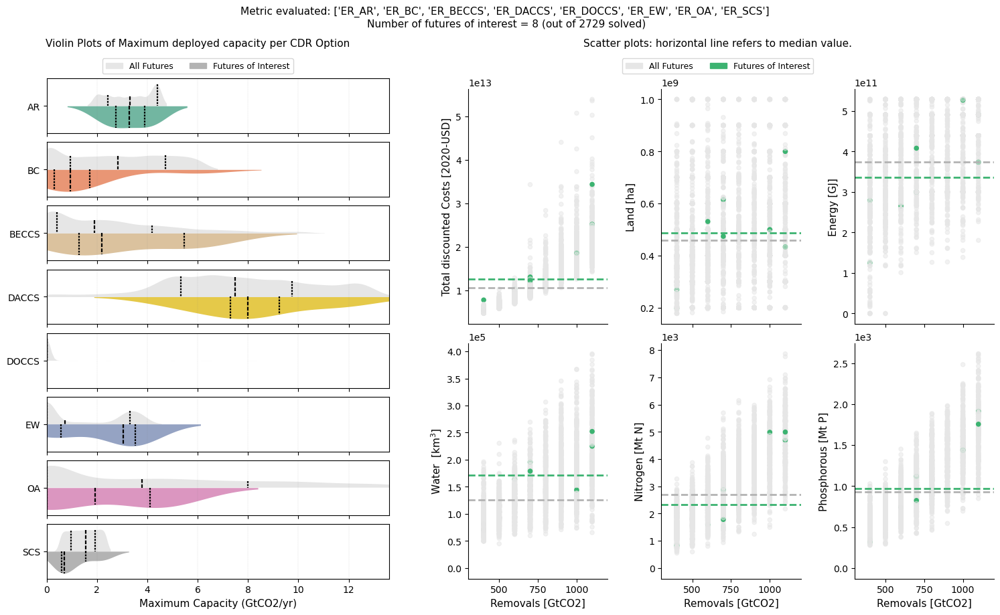

In [34]:
# ================================== Defining Metrics of Interest ==================================
#metrics_of_interest = {'LandL':[[2e8, 4e8]]}
#metrics_of_interest = {'Land':[[0, 4e8]]}
metrics_of_interest = {'EnergyL':[[2045, 2050]]}
#metrics_of_interest = {'Energy':[[0, 528478746876/2]]}
#metrics_of_interest = {'LR_DACCS': [[0.12, 0.15]]}
#metrics_of_interest = {'OA': [[15000000000.0*0.5, 15000000000.0]]}
#metrics_of_interest = {'Costs': [[4591479032575.837, 0.33*35638967139757.97]]}
metrics_of_interest = { 'ER_AR': [[-0.23, -0.10]],
     'ER_BC': [[-0.05, 0]],
     'ER_BECCS': [[-0.15, 0]],
     'ER_DACCS': [[0.05, 0.10]],
     'ER_DOCCS': [[0.05, 0.10]],
     'ER_EW': [[-0.05, 0]],
     'ER_OA': [[-0.05, 0]],
     'ER_SCS': [[-0.23, -0.10]]}
'''metrics_of_interest = {'ER_AR': [[-0.07, 0.02]], # [1/3 * min, max]
    'ER_BC': [[0.0, 0.10]],
    'ER_BECCS': [[-0.05, 0.15]], 
    'ER_DACCS': [[0.10, 0.15]],
    'ER_DOCCS': [[0.10, 0.15]],
    'ER_EW': [[-0.0, 0.05]],
    'ER_OA': [[0.0, 0.05]],
    'ER_SCS': [[-0.08, -0.01]]}'''

# ================================== Identifying Futures of Interest ==================================
list_of_futures = []
remaining_futures = aggregated_results
for metric in metrics_of_interest:
    if len(metrics_of_interest)==1:
        title_plot = ["%s from %.1E to %.1E (%s)" %(all_metrics_names[metric], metrics_of_interest[metric][0][0], metrics_of_interest[metric][0][1], all_metrics_units[metric])]
    else:
        title_plot = [list(metrics_of_interest.keys())]
        
    for futureID in remaining_futures.index:
        value = remaining_futures.loc[futureID, metric]
        if (value >= metrics_of_interest[metric][0][0]) & (value <= metrics_of_interest[metric][0][1]):
            list_of_futures += [futureID]
        else:
            remaining_futures = remaining_futures.drop(futureID)
list_of_futures_in = remaining_futures.index.to_list()
list_of_futures_out = list(set(aggregated_results.index.to_list()) - set(list_of_futures_in)) # List of futures that are outside ranges specified in "metrics_of_interest"

# ================================== For plotting purposes ==================================
cmap=plt.get_cmap('Set2')
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5)}
mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(layout='constrained', figsize=(15, 8))
subfigs = fig.subfigures(1, 2, wspace=0.07, width_ratios=[2, 3])

#plt.suptitle('Metrics evaluated: %s.' %list(metrics_of_interest.keys()), size=11, y=1.1)
plt.suptitle('Metric evaluated: %s \nNumber of futures of interest = %d (out of %d solved)' %(title_plot[0],len(list_of_futures_in),solved), size=11, y=1.13)

legend_y = 1.04
subfig_title = 1.07

# ================================== Plotting on Left ==================================
subfigs[0].suptitle('Violin Plots of Maximum deployed capacity per CDR Option', fontsize=11, y = subfig_title)
axsLeft = subfigs[0].subplots(8, 1, sharex=True)

c=0
metric = max_capacity
if metric is max_capacity:
    interest = "Capacity"
    x_lim = results['Cumulative capacity'].max()
else:
    interest = "Cumulative Experience"
    x_lim = max_experience.max(axis=1).max()

df = pd.DataFrame(metric.stack())
df = df.rename(columns={0:"Maximum %s (GtCO2/yr)" %interest})
df["Maximum %s (GtCO2/yr)" %interest] = df["Maximum %s (GtCO2/yr)" %interest].mul(1e-9)
df = df.reset_index()

# Delete futures that are out of the ranges of interest
df_new = df.copy()
for futureID in list_of_futures_out:
    df_new = df_new[df_new.future_id != futureID]

df_new["class"] = 'futures of interest'
df["class"] = 'all futures'
df_plot = pd.concat([df, df_new])

r = 0
c=0
for CDR in i:
    plot = df_plot[df_plot.CDR_opt == CDR] 
    sns.violinplot(data=plot, y = "CDR_opt", x="Maximum %s (GtCO2/yr)" %(interest), hue="class", split = True, palette={'futures of interest': color_dict[CDR], 'all futures':(0.9,0.9,0.9,0.5)}, linewidth=0,
                   ax = axsLeft[r], density_norm='count', legend = True, inner="quart",inner_kws={"color": "k", "linewidth": 1.6})

    axsLeft[r].set_xlim(0,x_lim*1e-9)
    axsLeft[r].set_ylabel(ylabel = "")
    axsLeft[r].set_xlabel(xlabel = "")
    axsLeft[r].xaxis.grid(color='grey', linestyle='--', linewidth=0.1, zorder=1)
    axsLeft[r].legend(labels="", edgecolor='white',facecolor='white')
    
    if r == 7:
        axsLeft[r].set_xlabel(xlabel = "Maximum %s (GtCO2/yr)" %(interest), fontsize = 11)
        handles, labels = axsLeft[r].get_legend_handles_labels()

    r += 1
c +=1

print(len(list_of_futures_in), 'Futures meet the selected criteria (incl. NaN futures)')

#subfigs[0].legend(handles, labels, fontsize =9, loc='upper center', bbox_to_anchor=(0.5,legend_y), ncol=2, fancybox=True) # Using legend info from previous plot!
subfigs[0].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),mpatches.Patch(color=color_dict[CDR], label='Futures of Interest')], fontsize =9, loc='upper center', bbox_to_anchor=(0.5,legend_y), ncol=2) # Using legend info from previous plot!

# ================================== Plotting on Right ==================================
subfigs[1].suptitle('Scatter plots: horizontal line refers to median value.', fontsize=11, y = subfig_title)
n_rows = 2
n_cols = 3
axsRight = subfigs[1].subplots(n_rows, n_cols, sharex=True)

scatter = pd.concat([total_future,max_resources], axis=1)
scatter['Removals'] = scatter['Removals'].div(1e9)
att = list(scatter.columns)#.remove('Removals') # Save name of columns to plot in the y axis
att.remove('Removals') # Remove "Removals" as this will be the x axis
scatter = pd.concat([scatter, max_capacity], axis=1) # Add max_capacity to identify which CDR is "dominant"
y_axes_names = {"Costs":"Total discounted Costs [2020-USD]", "Land":"Land [ha]", "Energy":"Energy [GJ]", "Water":"Water  [km$^3$]", "Nitrogen":"Nitrogen [Mt N]", "Phosphorous":"Phosphorous [Mt P]"}

# Saving color code for tech with most capacity deployed per future
color_dict = {'BECCS':cmap(0.8), 'A/R':cmap(0.1), 'SCS':cmap(0.9), 'BC':cmap(0.2), 'DACCS':cmap(0.7), 'EW':cmap(0.3), 'OA':cmap(0.4), 'DOCCS':cmap(0.5), np.nan:(0, 0, 0, 1)}
eh = max_capacity.idxmax(axis=1) # For each future_id, save the CDR option with max capacity
col = []
for futureID,rows in scatter.iterrows():
    if futureID in list_of_futures_in:
        scatter.loc[futureID,'Largest'] = eh[futureID]
        #col += [color_dict[eh[futureID]]]
        col += ['mediumseagreen']
    else: 
        col += [(0.9,0.9,0.9,0.5)]        
scatter['Color'] = col

r = 0
c = 0
for column_name in att:
    scatter.plot.scatter(ax=axsRight[r,c], x='Removals',y=column_name,color=scatter.Color)
    #Median
    axsRight[r,c].hlines(y=scatter[scatter.Color!='mediumseagreen'].median(numeric_only=True)[column_name], xmin = 300, xmax = 1200, color=(0.7,0.7,0.7,1), linestyle='--',linewidth=2)
    axsRight[r,c].hlines(y=scatter[scatter.Color=='mediumseagreen'].median(numeric_only=True)[column_name], xmin = 300, xmax = 1200, color='mediumseagreen', linestyle='--',linewidth=2)
    '''# 0.25 Quartile
    axsRight[r,c].hlines(y=scatter[scatter.Color!='mediumseagreen'].quantile(q=0.25,numeric_only=True)[column_name], xmin = 300, xmax = 1200, color=(0.7,0.7,0.7,1), linestyle=':',linewidth=1)
    axsRight[r,c].hlines(y=scatter[scatter.Color=='mediumseagreen'].quantile(q=0.25,numeric_only=True)[column_name], xmin = 300, xmax = 1200, color='mediumseagreen', linestyle=':',linewidth=1)
    # 0.75 Quartile
    axsRight[r,c].hlines(y=scatter[scatter.Color!='mediumseagreen'].quantile(q=0.75,numeric_only=True)[column_name], xmin = 300, xmax = 1200, color=(0.7,0.7,0.7,1), linestyle=':',linewidth=1)
    axsRight[r,c].hlines(y=scatter[scatter.Color=='mediumseagreen'].quantile(q=0.75,numeric_only=True)[column_name], xmin = 300, xmax = 1200, color='mediumseagreen', linestyle=':',linewidth=1)'''

    axsRight[r,c].set_xlabel(xlabel = "Removals [GtCO2]", fontsize = 11)
    axsRight[r,c].set_ylabel(ylabel=y_axes_names[column_name], fontsize = 11)
    if c == n_cols-1:
        c = 0
        r += 1
    else:
         c += 1

for col in range(0,n_cols):
    for row in range(0,n_rows):
        axsRight[row,col].ticklabel_format(axis='y', style='sci',scilimits=(3,5))
        axsRight[row,col].spines[['right', 'top']].set_visible(False)
        axsRight[row,col].set_xlim(300, 1200)
#subfigs[1].legend(handles_CDR, labels_CDR, fontsize = 9, loc='upper center', bbox_to_anchor=(0.5, legend_y),ncol=8, fancybox=True) # Using legend info from previous plot!
subfigs[1].legend(handles=[mpatches.Patch(color=(0.9,0.9,0.9,1), label='All Futures'),mpatches.Patch(color='mediumseagreen', label='Futures of Interest')], fontsize =9, loc='upper center', bbox_to_anchor=(0.5,legend_y), ncol=2) # Using legend info from previous plot!

#plt.savefig('Figures_Results/Violins_Many_Metrics_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')


## Parallel Coordinate Plots

Key Resources:
- Parallel Coordinates Chart with [go.Parcoords](https://plotly.com/python/parallel-coordinates-plot/)
- Documentation for [Update Layout](https://plotly.com/python/reference/layout/#layout-width) for Figures in Plotly
    - Specifically for [fonts](https://plotly.com/python/figure-labels/)

NOTE: the pink bars in the figure output below can be created and moved by the user by dragging the cursor.

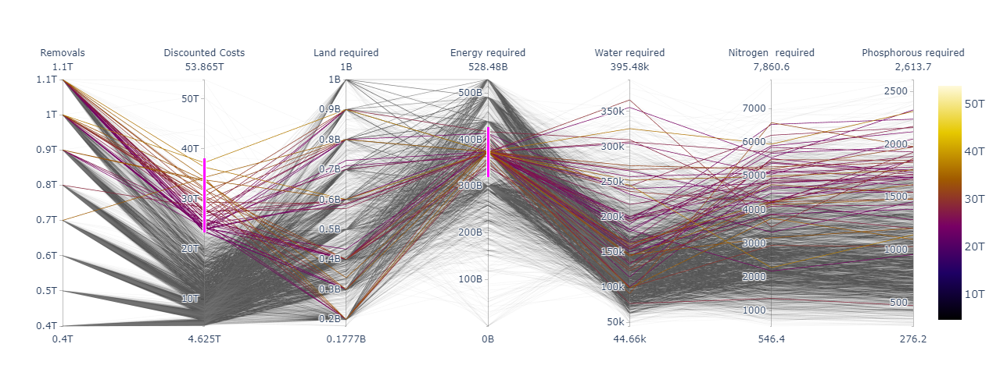

In [ ]:
import plotly.graph_objects as go

df = scatter
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = df['Costs'],
                   colorscale = 'Electric',#[['BECCS','purple'],['A/R','lightseagreen'],['SCS','gold'],['BC','blue'],['DACCS','yellow'],['OA','green'],['DOCCS','black'],['EW','grey']],
                   showscale = True,
                   cmin = df['Costs'].max(),
                   cmax = df['Costs'].min()),
        dimensions = list([
            dict(range = [df['Removals'].min(),df['Removals'].max()],
                 constraintrange = [1101,1000],
                 label = "Removals", values = df['Removals']),
            dict(range = [df['Costs'].min(),df['Costs'].max()],
                 label = "Discounted Costs", values = df['Costs']),
            dict(range = [df['Land'].min(),df['Land'].max()],
                 label = 'Land required', values = df['Land']),
            dict(range = [df['Energy'].min(),df['Energy'].max()],
                 label = 'Energy required', values = df['Energy']),
            dict(range = [df['Water'].min(),df['Water'].max()],
                 label = 'Water required', values = df['Water']),
            dict(range = [df['Nitrogen'].min(),df['Nitrogen'].max()],
                 visible = True,
                 label = 'Nitrogen  required', values = df['Nitrogen']),
            dict(range = [df['Phosphorous'].min(),df['Phosphorous'].max()],
                 label = 'Phosphorous required', values = df['Phosphorous'])])
    )
)

fig.update_layout(font=dict(size=14), width = 1200, height = 500)

fig.show()

## Scenario Discovery Analysis
- **A step-by-step tutorial for scenario discovery with gradient boosted trees**: https://waterprogramming.wordpress.com/2022/04/22/a-step-by-step-tutorial-for-scenario-discovery-with-gradient-boosted-trees/
    - Scenario discovery (Groves and Lempert, 2007) is an exploratory modeling centered approach that seeks to discover consequential future scenarios using computational experiments rather than relying on prespecified information. To perform scenario discovery, decision makers first identify a set of relevant uncertainties and their plausible ranges. Next, an ensemble of these uncertainties is developed by sampling across parameter ranges. ***Candidate policies are then evaluated across this ensemble and machine learning or data mining algorithms are used to examine which combinations of uncertainties generate vulnerability in the system.*** These combinations can then be used to develop narrative scenarios to inform implementation and monitoring efforts or new policy development.
    - Gradient boosted trees have advantages over other scenario discovery algorithms (e.g. PRIM, CART, logistic regression) because they can easily capture nonlinear and non-differentiable boundaries in the uncertainty space (which are particularly prevalent in water supply planning problems that have discrete capacity expansion options), are highly resistant to overfitting and provide a clear means of ranking the importance of uncertain factors (Trindade et al., 2020).

- **Gradient Boosted Decision Trees**: [Documentation](https://developers.google.com/machine-learning/decision-forests/intro-to-gbdt) & [Great Post](https://medium.com/all-things-ai/in-depth-parameter-tuning-for-gradient-boosting-3363992e9bae)
    - learning_rate: shrinks the contribution of each tree by learning_rate. Using a high learning rate might result in overfitting
    - n_estimators: represents the number of trees in the forest. Usually the higher the number of trees the better to learn the data. Increasing the number of estimators may result in overfitting also.
    - max_depth: indicates how deep the built tree can be. The deeper the tree, the more splits it has and it captures more information about how the data. However, many trees can also lead to overfitting the data.

### Gradient Boosted Decision Trees

In [59]:
# Convert model output into a boolean array for classification
x = df_LHS.T

# ====================== For solved vs Infeasible ====================== 
y = aggregated_results['Solved']#==0 # If '==0' is added, this would convert the list from finary to True/false = equivalent!

# ====================== For Simplified portfolios ======================
'''metric_of_interest = "2050_1"
y = pd.DataFrame(index =simplified_names.index)
for futureID in simplified_names.index:
    if simplified_names.loc[futureID, 'Portfolio_ID_2050'] == metric_of_interest:
        y.loc[futureID, metric_of_interest] = 1
    else:
        y.loc[futureID, metric_of_interest] = 0
y = y[metric_of_interest] # This is to convert into a 'Series' rather than dataframe
x = x[x.index.isin(y.index)] # Use the future_IDs that are solved ('y' already excludes unsolved futures)'''

# ====================== For Outliers of a metric of interest ======================
'''metric_of_interest = "Costs"
scatter = pd.concat([total_future,max_resources], axis=1)
scatter = scatter[scatter['Removals'] != 0] # Need to drop futures that were not solved
outliers = find_outliers_IQR(scatter[metric_of_interest])
y = pd.DataFrame({'Outlier_%s' %metric_of_interest: [0]*aggregated_results.index.size},index = aggregated_results.index.tolist())
for out in outliers.index:
    y.loc[out,'Outlier_%s' %metric_of_interest] = 1
y = y['Outlier_%s' %metric_of_interest] # This is to convert into a 'Series' rather than dataframe '''
# ====================== Analysis ======================
names = x.T.index.tolist()

#  Fit a boosted trees classifier
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier(n_estimators=10,learning_rate=0.1,max_depth=10)
 
# fit the classifier
gbc.fit(x, y)
feature_importances = gbc.feature_importances_
 
# rank the feature importances and plot
importances_sorted_idx = np.argsort(feature_importances)
sorted_names = [names[i] for i in importances_sorted_idx]

'''fig = plt.figure(figsize=(4,4))
ax = fig.gca()
ax.barh(np.arange(len(feature_importances)), feature_importances[importances_sorted_idx])
ax.set_yticks(np.arange(len(feature_importances)))
ax.set_yticklabels(sorted_names)
ax.set_xlim([0,0.5])
ax.set_xlabel('Feature Importance')
plt.tight_layout()

plt.show()
plt.close('all')'''

"fig = plt.figure(figsize=(4,4))\nax = fig.gca()\nax.barh(np.arange(len(feature_importances)), feature_importances[importances_sorted_idx])\nax.set_yticks(np.arange(len(feature_importances)))\nax.set_yticklabels(sorted_names)\nax.set_xlim([0,0.5])\nax.set_xlabel('Feature Importance')\nplt.tight_layout()\n\nplt.show()\nplt.close('all')"

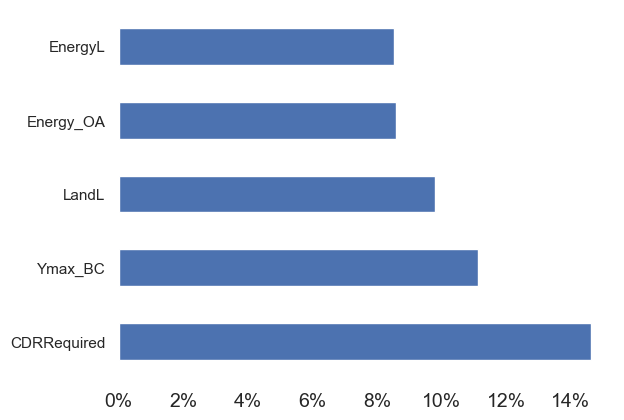

In [60]:
# Prettier plotting
ax = pd.DataFrame(index = names, data=feature_importances).sort_values(by=[0],ascending=False)[0].div(0.01).head(5).plot.barh(legend=False)
ax.set_facecolor("white")
ax.grid(False)
ax.spines[['right', 'top','bottom','left']].set_visible(False)
ax.xaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
ax.tick_params(axis='x', labelsize = 14)

#plt.savefig('Figures_Results/Boosted_Features_%s.png' %date.today().strftime("%d.%m.%Y"), format='png', transparent=True, bbox_inches="tight")

plt.show()
plt.close('all')


### Factor Maps

C:\Users\rodq\AppData\Local\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


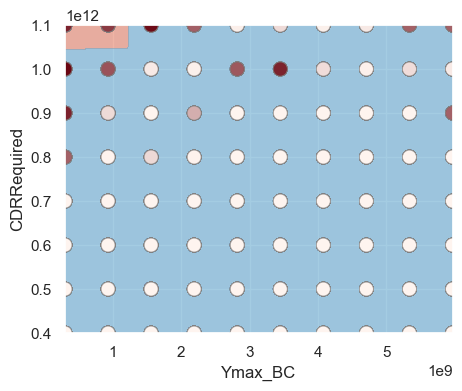

In [61]:
# Select the top two factors discovered above
#selected_factors = [x[sorted_names[-1]].tolist(),x[sorted_names[-2]].tolist()]
parameter_1 = sorted_names[-2]
parameter_2 = sorted_names[-1]
selected_factors = x[parameter_1].tolist(),x[parameter_2].tolist()
 
# Fit a classifier using only these two factors
gbc_2_factors = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1,max_depth=3)
gbc_2_factors.fit(x[[parameter_1,parameter_2]], y)
 
# plot prediction contours
x_data = np.asarray(x[parameter_1].tolist())
y_data = np.asarray(x[parameter_2].tolist())
 
x_min, x_max = (x_data.min(), x_data.max())
y_min, y_max = (y_data.min(), y_data.max())
 
# create a grid to makes predictions on
xx, yy = np.meshgrid(np.arange(x_min, x_max * 1.001, (x_max - x_min) / 100),
                        np.arange(y_min, y_max * 1.001, (y_max - y_min) / 100))
                         
dummy_points = list(zip(xx.ravel(), yy.ravel()))
 
z = gbc_2_factors.predict_proba(dummy_points)[:, 1]
z[z < 0] = 0.
z = z.reshape(xx.shape)
 
# plot the factor map        
fig = plt.figure(figsize=(5,4))
ax = fig.gca()
ax.contourf(xx, yy, z, [0, 0.5, 1.], cmap='RdBu',
                alpha=.6, vmin=0.0, vmax=1)
ax.scatter(x[parameter_1].tolist(), x[parameter_2].tolist(),\
            c=y, cmap='Reds_r', edgecolor='grey', 
            alpha=.6, s= 100, linewidth=.5)
#ax.set_xlim([.5, 2])
#ax.set_ylim([.9,1.1])
ax.set_xlabel(parameter_1)
ax.set_ylabel(parameter_2)

plt.show()
plt.close('all')

## Decision Trees

A decision tree is a branching flow diagram or tree chart. It comprises of the following components ([source](https://towardsdatascience.com/decision-trees-explained-entropy-information-gain-gini-index-ccp-pruning-4d78070db36c)):
- A target variable (e.g. solved or not --> 0 or 1) and its initial distribution.
- A root node: this is the node that begins the splitting process by finding the variable that best splits the target variable
- Node purity: Decision nodes are typically impure, or a mixture of both classes of the target variable (0,1). Pure nodes are those that have one class — hence the term pure. They either have 1 or 0.
- Decision nodes: these are subsequent or intermediate nodes, where the target variable is again split further by other variables
- Leaf nodes or terminal nodes are pure nodes, hence are used for making a prediction of a numerical or class is made.
- The Gini Index has a minimum (highest level of purity) of 0. It has a maximum value of .5. If Gini Index is .5, it indicates a random assignment of classes.
- The color shows whether the value of the node is associated with high, medium, or low values of the target. 
- Transparency is used to communicate the impurity of each node.

https://scikit-learn.org/stable/modules/tree.html
- Documentation for "[DecisionTreeClassifier()](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)" -> takes as input two arrays: 
    - an array X, sparse or dense, of shape (n_samples, n_features) holding the training samples; and
    - an array Y of integer values, shape (n_samples,), holding the class labels for the training samples -> is capable of both binary (where the labels are [-1, 1]) classification and multiclass (where the labels are [0, …, K-1]) classification.
- Documentation for "plot_tree": https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html#sklearn.tree.plot_tree
- Documentation for "tree.export_graphviz": https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html#sklearn.tree.export_graphviz

In [62]:
import pandas
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import graphviz 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

### Decision Tree on whether a future is solved or not

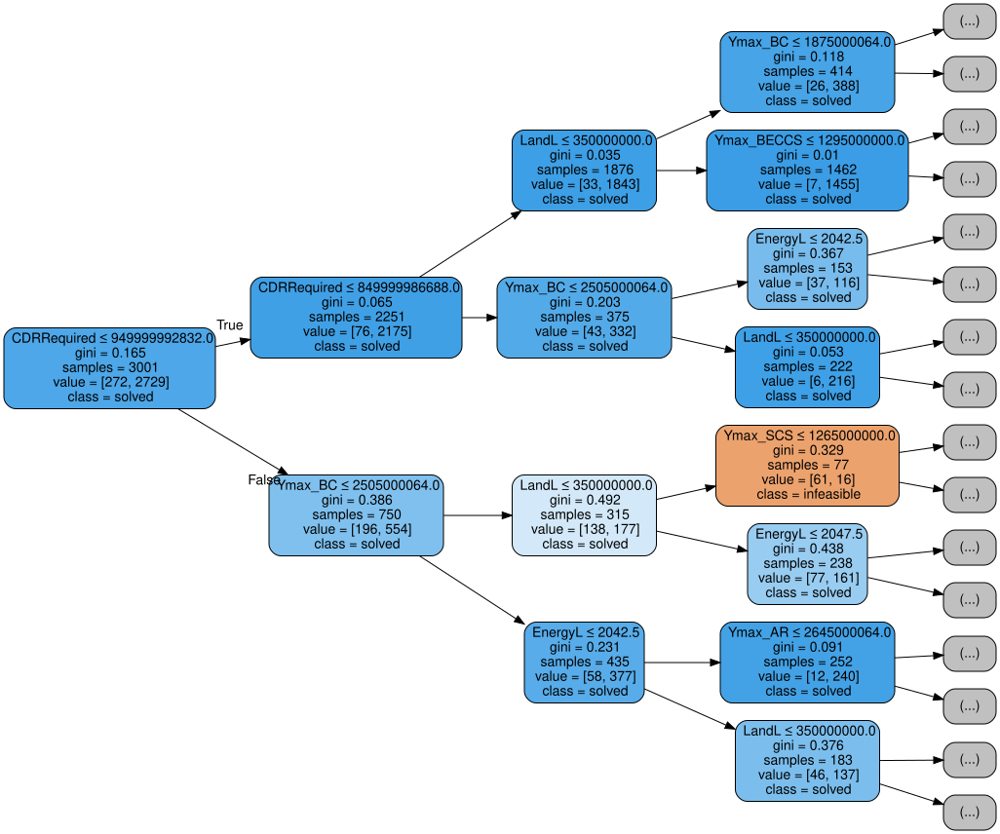

In [63]:
x = df_LHS.T
#x = x[x.columns.drop(list(x.filter(regex='ER')))] # Remove non-relevant uncertainties that could only randomly explain the outcome
features = x.T.index.tolist()
y = aggregated_results['Solved']#==0 # If '==0' is added, this would convert the list from binary to True/false = equivalent!

dtree = DecisionTreeClassifier()
dtree = dtree.fit(x, y)
'''
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(dtree, max_depth = 6, feature_names=features, rounded=True, filled=True, fontsize = 10)
'''
dot_data = tree.export_graphviz(dtree, out_file=None, max_depth = 3,
                     feature_names=features, rotate = True,  
                     class_names=["infeasible","solved"],  
                     filled=True, rounded=True, #proportion = True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data, format="png")  
#graph.render("Figures_Results/DecisionTree_%s" %date.today().strftime("%d.%m.%Y"), view=True) 
graph

### Decision Tree on outliers

number of outliers: 64
max outlier value: 53865010759635.76
min outlier value: 27928893798669.027


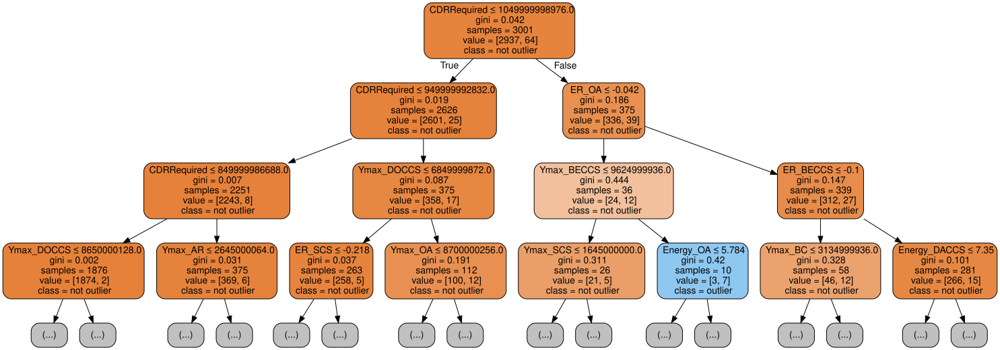

In [64]:
metric_of_interest = "Costs"

scatter = pd.concat([total_future,max_resources], axis=1)
scatter = scatter[scatter['Removals'] != 0] # Need to drop futures that were not solved

def find_outliers_IQR(df):
    q1=df.quantile(0.25)
    q3=df.quantile(0.75)
    IQR=q3-q1
    outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
    
    return outliers

outliers = find_outliers_IQR(scatter[metric_of_interest])
print("number of outliers: "+ str(len(outliers)))
print("max outlier value: "+ str(outliers.max()))
print("min outlier value: "+ str(outliers.min()))

y = pd.DataFrame({'Outlier_%s' %metric_of_interest: [0]*aggregated_results.index.size},index = aggregated_results.index.tolist(), )

for out in outliers.index:
    y.loc[out,'Outlier_%s' %metric_of_interest] = 1

x = df_LHS.T
#x = x[x.columns.drop(list(x.filter(regex='ER')))] # Remove non-relevant uncertainties that could only randomly explain the outcome
features = x.T.index.tolist()

dtree = DecisionTreeClassifier()
dtree = dtree.fit(x, y)

dot_data = tree.export_graphviz(dtree, out_file=None, max_depth = 3,
                     feature_names=features,  
                     class_names=["not outlier","outlier"],  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data, format="png")  
#graph.render("Figures_Results/DecisionTree_outlier_%s" %date.today().strftime("%d.%m.%Y"))#, view=True) 
graph


### Decision Tree on Drivers of adoption for CDR option i

In [65]:
metric_of_interest = "OA"
mid_value = 0.5*(max_capacity[metric_of_interest].max() + max_capacity[metric_of_interest].min())
y = pd.DataFrame()
for futureID in max_capacity.index:
    if max_capacity.loc[futureID,metric_of_interest] >= mid_value:
        y.loc[futureID,'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)] = 1
    else:
        y.loc[futureID,'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)] = 0
y

,OA above 6.8 GtCO2
0,0.0
1,1.0
2,0.0
3,0.0
4,1.0
...,...
2996,0.0
2997,0.0
2998,1.0
2999,0.0


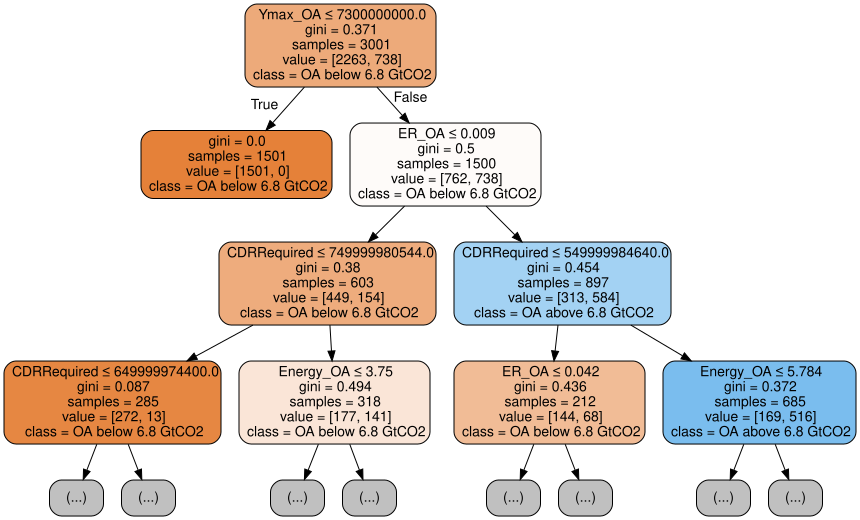

In [66]:
metric_of_interest = "OA"
mid_value = 0.5*(max_capacity[metric_of_interest].max() + max_capacity[metric_of_interest].min())

y = pd.DataFrame()
for futureID in max_capacity.index:
    if max_capacity.loc[futureID,metric_of_interest] >= mid_value:
        y.loc[futureID,'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)] = 1
    else:
        y.loc[futureID,'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)] = 0

x = df_LHS.T
features = x.T.index.tolist()

dtree = DecisionTreeClassifier()
dtree = dtree.fit(x, y)

dot_data = tree.export_graphviz(dtree, out_file=None, max_depth = 3,
                     feature_names=features,  
                     class_names=['%s below %.1f GtCO2' %(metric_of_interest,mid_value*1e-9),'%s above %.1f GtCO2' %(metric_of_interest,mid_value*1e-9)],  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data, format="png")  

#graph.render("Figures_Results/DecisionTree_%s_%s" %(metric_of_interest, date.today().strftime("%d.%m.%Y")))#, view=True) 
graph